In [13]:
import sys
sys.path.append('../')
import matplotlib.pyplot as plt
import plotly
import numpy as np
import random
import hrr2 as hrr
import math
import state_machine_class as state_machine
import Gate_Class_v4 as gate
from plotly.graph_objs import Scatter, Layout, Surface
plotly.offline.init_notebook_mode(connected=True)

# Uses beta to bias value function

In [14]:
'''
def reward(loc,cue,size):
    if cue == 'red':
        if loc[0] == 0 and loc[1] == 0:
            return 1
        else:
            return 0
    elif cue == 'green': # middle point
        if loc[0] == 0 and loc[1] == size[1]-1:
            return 1
        else:
            return 0
'''

"\ndef reward(loc,cue,size):\n    if cue == 'red':\n        if loc[0] == 0 and loc[1] == 0:\n            return 1\n        else:\n            return 0\n    elif cue == 'green': # middle point\n        if loc[0] == 0 and loc[1] == size[1]-1:\n            return 1\n        else:\n            return 0\n"

In [15]:
# reward for transfer task
def reward(loc,cue,size):
    if cue == 'red':
        if loc[0] == 0 and loc[1] == 0:
            return 1
        else:
            return 0
    elif cue == 'green': 
        if loc[0] == 0 and loc[1] == size[1]-1:
            return 1
        else:
            return 0
    elif cue == 'purple': # middle
        if loc[0] == 0 and loc[1] == 2:
            return 1
        else:
            return 0

In [16]:
def punishment(loc,cue,size):
    if cue == 'red':
        if loc[0] == 0 and loc[1] == 0:
            return 0
        else:
            return -1
    elif cue == 'green': # middle point
        if loc[0] == 0 and loc[1] == size[1]-1:
            return 0
        else:
            return -1

In [17]:
def optimal_path_length(init_loc,cue):
    row,col = init_loc[0],init_loc[1]
    red = [ [0,1,2,2,1],
            [1,2,3,3,2],
            [2,3,4,4,3],
            [2,3,4,4,3],
            [1,2,3,3,2] ]
    
    green = [ [1,2,2,1,0],
              [2,3,3,2,1],
              [3,4,4,3,2],
              [3,4,4,3,2],
              [2,3,3,2,1] ]
    
    if cue == 0: # red
        return red[row][col]
    elif cue == 1:
        return green[row][col]
        

In [18]:
'''
def optimal_path_length_bottle(init_loc,cue):
    row,col = init_loc[0],init_loc[1]
    red = [ [0,1,2,3,4],
            [1,2,3,4,5],
            [6,5,4,5,6],
            [7,6,5,6,7],
            [8,7,6,7,8] ]
    
    green = [ [4,3,2,1,0],
              [5,4,3,2,1],
              [6,5,4,5,6],
              [7,6,5,6,7],
              [8,7,6,7,8] ]
    
    if cue == 0: # red
        return red[row][col]
    elif cue == 1:
        return green[row][col]
'''

'\ndef optimal_path_length_bottle(init_loc,cue):\n    row,col = init_loc[0],init_loc[1]\n    red = [ [0,1,2,3,4],\n            [1,2,3,4,5],\n            [6,5,4,5,6],\n            [7,6,5,6,7],\n            [8,7,6,7,8] ]\n    \n    green = [ [4,3,2,1,0],\n              [5,4,3,2,1],\n              [6,5,4,5,6],\n              [7,6,5,6,7],\n              [8,7,6,7,8] ]\n    \n    if cue == 0: # red\n        return red[row][col]\n    elif cue == 1:\n        return green[row][col]\n'

In [19]:
# Error for Transfer Task
def optimal_path_length_bottle(init_loc,cue):
    row,col = init_loc[0],init_loc[1]
    red = [ [0,1,2,3,4],
            [1,2,3,4,5],
            [6,5,4,5,6],
            [7,6,5,6,7],
            [8,7,6,7,8] ]
    
    green = [ [4,3,2,1,0],
              [5,4,3,2,1],
              [6,5,4,5,6],
              [7,6,5,6,7],
              [8,7,6,7,8] ]
    
    purple = [ [2,1,0,1,2],
               [3,2,1,2,3],
               [4,3,2,3,4],
               [5,4,3,4,5],
               [6,5,4,5,6] ]
    
    if cue == 0: # red
        return red[row][col]
    elif cue == 1:
        return green[row][col]
    elif cue == 2:
        return purple[row][col]

In [20]:
def store_data(fname,datalist):
    # store data in file [episode,row,col,colors[color],o_gate_state]
    f_obj = open(fname,"w")
    #datalist = [[1,1,2,'red',0],[1,3,4,'red',0],[2,5,6,'red',0],[2,7,8,'red',0]]
    for row in datalist:
        f_obj.writelines("%s " % mydata for mydata in row)
        f_obj.write("\n")
    f_obj.close()

In [21]:
# stores 1D list of weights in file
def store_weights(fname,datalist):
    f_obj = open(fname,"w")
    for item in datalist:
        f_obj.write(str(item))
        f_obj.write("\n")

In [22]:
# load weights into 1D list from file
def load_weights(fname):
    W = []
    f_obj = open(fname,"r")
    for item in f_obj:
        W.append(float(item))
        
    return np.array(W)

In [23]:
def Testing_Phase(WM_Objs,state_size,nepisodes,stat_window):
    n = 1024
    nagent_actions = 4
    gate_actions = 2
    ncolors = 2
    nslots = 1
    nroles = 1
    nrolestates = 2
    Closed,Open = 0,1
    agent_actions = ['up','down','left','right']
    colors = ['red','green',''] # external colors
    nothing = len(colors)-1
    #wm_colors = ['wm_red','wm_green',''] # internal colors
    roles = ['role_avail','role_unavail']
    gate_actions = ['closed','open']
    gateclosed = 'gateclosed'
    gateopen = 'gateopen'
    
    nrows,ncols = state_size
    state_table = state_machine.state_machine.generate_state_table_bottle(nrows,ncols)
    
    LTM_obj = WM_Objs[0]
    agent = WM_Objs[1]
    i_gate = WM_Objs[2]
    o_gate = WM_Objs[3]
    WM = WM_Objs[4]
    s_mac = state_machine.state_machine(state_table)
    nsteps = 100
    goal = [ [0,0],[0,ncols-1] ]
    value_function = np.zeros((nrows,ncols)) # store Q values for statitics
     # track performance
    opt_array = []
    diff_array = []
    t1 = "t1"
    
    handhold = 0
    anneal = 0
    
    o_gate_correct = 0 # stats for output gate
    o_gate_total = 0 # stats for output gate
    o_gate_correct_shared = 0
    o_gate_correct_non = 0
    shared_total = 0
    non_total = 0
    o_gate_stat = []
    mean_o_gate = []
    
    fname = "agent_output.dat"
    agent_output = [] # used for showing agent move in maze world
    for episode in range(nepisodes):
        
        row = random.randrange(2,nrows) # get random row for state (in shared area)
        col = random.randrange(0,ncols) # get random col for state
        cur_loc = [row,col] # current location of agent
        color_signal = random.randrange(0,ncolors) # get random color
        color = color_signal # used for reward because color signal may change
        #r = reward(cur_loc,colors[color],state_size) if color!=nothing else 0
        
        if episode == anneal:
            agent.epsilon,i_gate.epsilon,o_gate.epsilon = 0,0,0
        #optimal_steps = optimal_path_length(cur_loc,color_signal) # get optimal steps to goal 
        optimal_steps = optimal_path_length_bottle(cur_loc,color_signal) # get optimal steps to goal 
        state = (state_table[row][col])["state"] # current state
        
        role_i = 0 if color_signal!=nothing else 1
        slot = 0
        igate_restrict = [0,1] # restricted set 
        ogate_restrict = [0,1] # restricted set
        
        #igate_restrict = [1] if episode < 20000 else [0,1] # hand holding
        #ogate_restrict = [1] if episode < handhold else [0,1] # hand holding
        ''''
        if episode < handhold: # hand holding
            ogate_restrict = [0] if row >= 2 else [1]
        else:
            ogate_restrict = [0,1]
        '''
        
        WM.flush_all_wm_maint()
        #print("cue:",colors[color_signal])
        #print("role_i:",roles[role_i])
        i_gate_input = roles[role_i]+'*'+state+'*'+t1
        LTM_obj.encode(i_gate_input)
        i_gate_state,i_value,i_max,i_input,i_values = i_gate.action(i_gate_input,gate_actions,igate_restrict)
        WM.wm_in_flow(i_gate_state,slot,color_signal) # control flow of wm contents
        #print("i_gate:",i_gate_state)
        #print("wm_in:",WM.get_one_wm_maint(slot))
        role_o = 1 if WM.wm_maint_slot_is_empty(slot) else 0
        #print("role_o:",roles[role_o])
        o_gate_input = roles[role_o]+'*'+state+'*'+t1
        LTM_obj.encode(o_gate_input)
        o_gate_state,o_value,o_max,o_input,o_values = o_gate.action(o_gate_input,gate_actions,ogate_restrict)
        WM.wm_out_flow(o_gate_state,slot) # wm out contents for given slots
        wm_out = WM.get_one_wm_output(slot)
        #print("o_gate:",o_gate_state)
        #print("wm_out:",WM.get_one_wm_output(slot))
        #print("\n\n")
        
        if o_gate_state == Closed:
            agent_input = gateclosed+'*'+colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
            LTM_obj.encode(agent_input)
        else:
            agent_input = colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
            LTM_obj.encode(agent_input)
        
        #agent_input = colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
        action_restrict = (state_table[row][col])["action_restrict"]# get restricted action set
        action,a_value,a_max,a_input,a_values = agent.action(agent_input,agent_actions,action_restrict) # agent action
        #print("agent_value: ",a_value)
        #print("input_value: ",i_value)
        #print("output_value:",o_value)
        o_gate_correct_shared += 1 if o_gate_state == Closed else 0
        shared_total += 1
        #o_gate_total += 1
        
        i_gate.set_eligibility_zero()
        o_gate.set_eligibility_zero()
        agent.set_eligibility_zero() # set eligibility trace to zero
        WM.flush_all_wm_output()
        init_state = 'S'+str(cur_loc[0])+str(cur_loc[1])
        agent_output.append([init_state,episode,row,col,colors[color],o_gate_state]) # stores agents movement for visualization
        for step in range(nsteps):
            r = reward(cur_loc,colors[color],state_size) if color!=nothing else 0
            #r = punishment(cur_loc,colors[color],state_size) if color!=nothing else -1
            #print(state)
            if color!=nothing and cur_loc == goal[color]:
                i_gate.eligibility_trace_update(i_input)
                o_gate.eligibility_trace_update(o_input)
                agent.eligibility_trace_update(a_input)
                i_gate.td_update_goal(r,i_value)
                o_gate.td_update_goal(r,o_value)
                agent.td_update_goal(r,a_value)
                #print('goal!!!')
                break
                
            p_a_input = agent_input
            p_i_input = i_gate_input
            p_o_input = o_gate_input
            p_a_action = action
            p_i_action = i_gate_state
            p_o_action = o_gate_state
            p_action_restrict = action_restrict
            p_igate_restrict = igate_restrict
            p_ogate_restrict = ogate_restrict
        
            p_loc = cur_loc
            p_i_value = i_value # Q val for input gate
            p_i_max = i_max
            p_o_value = o_value # Q val for output gate
            p_o_max = o_max
            p_a_value = a_value # Q val for agent
            p_a_max = a_max
            
            # update eligibility traces
            i_gate.eligibility_trace_update(i_input)
            o_gate.eligibility_trace_update(o_input)
            agent.eligibility_trace_update(a_input)
            # move agent
            state,cur_loc = s_mac.move(p_loc,action)
            row,col = cur_loc[0],cur_loc[1]
            color_signal = 2 # turn off cue
            
            role_i = 0 if color_signal!=nothing else 1
            igate_restrict = [0] # restricted set 
            ogate_restrict = [0,1] # restricted set
            #ogate_restrict = [1] if episode < handhold else [0,1] # hand holding
            '''
            if episode < handhold: # hand holding
                ogate_restrict = [0] if row >= 2 else [1]
            else:
                ogate_restrict = [0,1]
            '''
            #
            #print("cue:",colors[color_signal])
            #print("role_i:",roles[role_i])
            i_gate_input = roles[role_i]+'*'+state
            LTM_obj.encode(i_gate_input)
            i_gate_state,i_value,i_max,i_input,i_values = i_gate.action(i_gate_input,gate_actions,igate_restrict)
            #print("i_gate:",i_gate_state)
            WM.wm_in_flow(i_gate_state,slot,color_signal) # control flow of wm contents
            #print("wm_in:",WM.get_one_wm_maint(slot))
            role_o = 1 if WM.wm_maint_slot_is_empty(slot) else 0
            o_gate_input = roles[role_o]+'*'+state
            LTM_obj.encode(o_gate_input)
            o_gate_state,o_value,o_max,o_input,o_values = o_gate.action(o_gate_input,gate_actions,ogate_restrict)
            #print("role_o:",roles[role_o])
            #print("o_gate:",o_gate_state)
            WM.wm_out_flow(o_gate_state,slot) # wm out contents for given slots
            wm_out = WM.get_one_wm_output(slot)
            #print("wm_out:",wm_out)
            #print("\n\n")
            
            if o_gate_state == Closed:
                agent_input = gateclosed+'*'+colors[color_signal]+'*'+state+'*'+wm_out
                LTM_obj.encode(agent_input)
            else:
                agent_input = colors[color_signal]+'*'+state+'*'+wm_out
                LTM_obj.encode(agent_input)
            
            #agent_input = colors[color_signal]+'*'+state+'*'+wm_out
            action_restrict = (state_table[row][col])["action_restrict"]# get restricted action set
            action,a_value,a_max,a_input,a_values = agent.action(agent_input,agent_actions,action_restrict) # agent action

            # Bias gates to stay in a state for long periods of time
            a_beta = 0
            if a_value > 0:
                if p_a_action == action:
                    a_beta = 0
                else:
                    a_beta = 1
            else:
                if p_a_action == action:
                    a_beta = 1
                else:
                    a_beta = 0
        
            o_beta = 0
            if a_value > 0:
                if p_o_action == o_gate_state:
                    o_beta = 0
                else:
                    o_beta = 1
            else:
                if p_o_action == o_gate_state:
                    o_beta = 1
                else:
                    o_beta = 0
                    
            i_beta = 0
            if a_value > 0:
                if p_i_action == i_gate_state:
                    i_beta = 0
                else:
                    i_beta = 1
            else:
                if p_i_action == i_gate_state:
                    i_beta = 1
                else:
                    i_beta = 0
            # -------------------------------------
            
            if row >= 2:
                o_gate_correct_shared += 1 if o_gate_state == Closed else 0
                shared_total += 1
            else:
                o_gate_correct_non += 1 if o_gate_state == Open else 0
                non_total += 1
            #o_gate_total += 1
            
            #agent.td_update(r,a_value,p_a_value)
            #o_gate.td_update(r,a_value,p_o_value)
            #i_gate.td_update(r,a_value,p_i_value)
            '''
            agent.td_update_transfer(r,a_value,p_a_value,a_beta)
            o_gate.td_update_transfer(r,a_value,p_o_value,o_beta)
            i_gate.td_update_transfer(r,a_value,p_i_value,i_beta)
            '''
            WM.flush_all_wm_output()
            agent_output.append([init_state,episode,row,col,colors[color],o_gate_state]) # stores agent movement for visualization
            
        if color != nothing:    
            step_diff = abs(step-optimal_steps)
            #print(step_diff)
            opt_array.append(step_diff)
            #o_gate_stat.append(o_gate_correct/o_gate_total)
        if (episode+1)%stat_window == 0:
            # print performance
            mean_diff = sum(opt_array)/len(opt_array)
            diff_array.append(mean_diff)
            #mean_o = sum(o_gate_stat)/len(o_gate_stat)
            #mean_o_gate.append(mean_o)
            plt.plot(diff_array)
            plt.show()
            opt_array = []
            o_gate_stat = []
            
            print("agent_value:",a_value)
            print("input_value:",i_value)
            print("output_value:",o_value)
            print("mean diff:",mean_diff)
            print("mean o_gate_shared:",o_gate_correct_shared/shared_total)
            print("mean o_gate_non:",o_gate_correct_non/non_total)
            o_gate_correct_shared = 0
            o_gate_correct_non = 0
            shared_total = 0
            non_total = 0
            o_gate_total = 0
            ###################
    store_data(fname, agent_output)      
    return LTM_obj, agent, i_gate, o_gate, WM

# Input Gate Model

In [24]:
def I_gate_model(state_size,nepisodes,stat_window):
    n = 1024
    #n = 256
    nagent_actions = 4
    gate_actions = 2
    ncolors = 2
    nslots = 1
    nroles = 1
    nrolestates = 2
    Closed,Open = 0,1
    agent_actions = ['up','down','left','right']
    colors = ['red','green',''] # external colors
    nothing = len(colors)-1
    #wm_colors = ['wm_red','wm_green',''] # internal colors
    roles = ['role_avail','role_unavail']
    gate_actions = ['closed','open']
    gateclosed = 'gateclosed'
    gateopen = 'gateopen'
    
    nrows,ncols = state_size
    state_table = state_machine.state_machine.generate_state_table_bottle(nrows,ncols)
    
    LTM_obj = hrr.LTM(n,True)
    #agent = gate.Q_learning(n,LTM_obj,epsilon=0.05,bias=1)
    agent = gate.Q_learning(n,LTM_obj,epsilon=0.01,bias=1)
    i_gate = gate.Q_learning(n,LTM_obj,epsilon=0.01,bias=1)
    o_gate = gate.Q_learning(n,LTM_obj,epsilon=0.01,bias=1)
    WM = gate.wm_content(colors,nslots,LTM_obj)
    s_mac = state_machine.state_machine(state_table)
    nsteps = 100
    goal = [ [0,0],[0,ncols-1] ]
    value_function = np.zeros((nrows,ncols)) # store Q values for statitics
     # track performance
    opt_array = []
    diff_array = []
    t1 = ""
    
    handhold = 400000
    anneal = 700000
    
    o_gate_correct = 0 # stats for output gate
    o_gate_total = 0 # stats for output gate
    o_gate_correct_shared = 0
    o_gate_correct_non = 0
    shared_total = 0
    non_total = 0
    o_gate_stat = []
    mean_o_gate = []
    
    for episode in range(nepisodes):
        
        count = 0
        #t1 = str(count)
        t1 = "t1"
        row = random.randrange(2,nrows) # get random row for state (in shared area)
        col = random.randrange(0,ncols) # get random col for state
        cur_loc = [row,col] # current location of agent
        color_signal = random.randrange(0,ncolors) # get random color
        color = color_signal # used for reward because color signal may change
        #r = reward(cur_loc,colors[color],state_size) if color!=nothing else 0
        
        if episode == anneal:
            agent.epsilon,i_gate.epsilon,o_gate.epsilon = 0,0,0
        #optimal_steps = optimal_path_length(cur_loc,color_signal) # get optimal steps to goal 
        optimal_steps = optimal_path_length_bottle(cur_loc,color_signal) # get optimal steps to goal 
        state = (state_table[row][col])["state"] # current state
        
        role_i = 0 if color_signal!=nothing else 1
        slot = 0
        igate_restrict = [0,1] # restricted set 
        ogate_restrict = [1] # restricted set

        '''
        if episode < handhold: # hand holding
            ogate_restrict = [0] if row >= 2 else [1]
        else:
            ogate_restrict = [0,1]
        '''
        
        WM.flush_all_wm_maint()
        #print("cue:",colors[color_signal])
        #print("role_i:",roles[role_i])
        i_gate_input = roles[role_i]+'*'+state+'*'+t1
        LTM_obj.encode(i_gate_input)
        i_gate_state,i_value,i_max,i_input,i_values = i_gate.action(i_gate_input,gate_actions,igate_restrict)
        WM.wm_in_flow(i_gate_state,slot,color_signal) # control flow of wm contents
        #print("i_gate:",i_gate_state)
        #print("wm_in:",WM.get_one_wm_maint(slot))
        role_o = 1 if WM.wm_maint_slot_is_empty(slot) else 0
        #print("role_o:",roles[role_o])
        o_gate_input = roles[role_o]+'*'+state+'*'+t1
        LTM_obj.encode(o_gate_input)
        o_gate_state,o_value,o_max,o_input,o_values = o_gate.action(o_gate_input,gate_actions,ogate_restrict)
        WM.wm_out_flow(o_gate_state,slot) # wm out contents for given slots
        wm_out = WM.get_one_wm_output(slot)
        #print("o_gate:",o_gate_state)
        #print("wm_out:",WM.get_one_wm_output(slot))
        #print("\n\n")
        
        if o_gate_state == Closed:
            agent_input = gateclosed+'*'+colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
            LTM_obj.encode(agent_input)
        else:
            agent_input = colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
            LTM_obj.encode(agent_input)
        
        #agent_input = colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
        action_restrict = (state_table[row][col])["action_restrict"]# get restricted action set
        action,a_value,a_max,a_input,a_values = agent.action(agent_input,agent_actions,action_restrict) # agent action
        #print("agent_value: ",a_value)
        #print("input_value: ",i_value)
        #print("output_value:",o_value)
        
        o_gate_correct_shared += 1 if o_gate_state == Closed else 0
        shared_total += 1
        
        i_gate.set_eligibility_zero()
        o_gate.set_eligibility_zero()
        agent.set_eligibility_zero() # set eligibility trace to zero
        WM.flush_all_wm_output()
        count += 1
        for step in range(nsteps):
            
            #t1 = str(count)
            t1 = ''
            r = reward(cur_loc,colors[color],state_size) if color!=nothing else 0
            #r = punishment(cur_loc,colors[color],state_size) if color!=nothing else -1
            #print(state)
            if color!=nothing and cur_loc == goal[color]:
                i_gate.eligibility_trace_update(i_input)
                o_gate.eligibility_trace_update(o_input)
                agent.eligibility_trace_update(a_input)
                i_gate.td_update_goal(r,i_value)
                o_gate.td_update_goal(r,o_value)
                agent.td_update_goal(r,a_value)
                #print('goal!!!')
                break
                
            p_a_input = agent_input
            p_i_input = i_gate_input
            p_o_input = o_gate_input
            p_a_action = action
            p_i_action = i_gate_state
            p_o_action = o_gate_state
            p_action_restrict = action_restrict
            p_igate_restrict = igate_restrict
            p_ogate_restrict = ogate_restrict
        
            p_loc = cur_loc
            p_i_value = i_value # Q val for input gate
            p_i_max = i_max
            p_o_value = o_value # Q val for output gate
            p_o_max = o_max
            p_a_value = a_value # Q val for agent
            p_a_max = a_max
            
            # update eligibility traces
            i_gate.eligibility_trace_update(i_input)
            o_gate.eligibility_trace_update(o_input)
            agent.eligibility_trace_update(a_input)
            # move agent
            state,cur_loc = s_mac.move(p_loc,action)
            row,col = cur_loc[0],cur_loc[1]
            color_signal = 2 # turn off cue
            
            role_i = 0 if color_signal!=nothing else 1
            igate_restrict = [0] # restricted set 
            ogate_restrict = [1] # restricted set
            #ogate_restrict = [1] if episode < handhold else [0,1] # hand holding
            '''
            if episode < handhold: # hand holding
                ogate_restrict = [0] if row >= 2 else [1]
            else:
                ogate_restrict = [0,1]
            '''
            #
            #print("cue:",colors[color_signal])
            #print("role_i:",roles[role_i])
            i_gate_input = roles[role_i]+'*'+state+'*'+t1
            LTM_obj.encode(i_gate_input)
            i_gate_state,i_value,i_max,i_input,i_values = i_gate.action(i_gate_input,gate_actions,igate_restrict)
            #print("i_gate:",i_gate_state)
            WM.wm_in_flow(i_gate_state,slot,color_signal) # control flow of wm contents
            #print("wm_in:",WM.get_one_wm_maint(slot))
            role_o = 1 if WM.wm_maint_slot_is_empty(slot) else 0
            o_gate_input = roles[role_o]+'*'+state+'*'+t1
            LTM_obj.encode(o_gate_input)
            o_gate_state,o_value,o_max,o_input,o_values = o_gate.action(o_gate_input,gate_actions,ogate_restrict)
            #print("role_o:",roles[role_o])
            #print("o_gate:",o_gate_state)
            WM.wm_out_flow(o_gate_state,slot) # wm out contents for given slots
            wm_out = WM.get_one_wm_output(slot)
            #print("wm_out:",wm_out)
            #print("\n\n")
            
            if o_gate_state == Closed:
                agent_input = gateclosed+'*'+colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
                LTM_obj.encode(agent_input)
            else:
                agent_input = colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
                LTM_obj.encode(agent_input)
            
            #agent_input = colors[color_signal]+'*'+state+'*'+wm_out
            action_restrict = (state_table[row][col])["action_restrict"]# get restricted action set
            action,a_value,a_max,a_input,a_values = agent.action(agent_input,agent_actions,action_restrict) # agent action
            # ----------------------------------
            # Bias gates to stay in a state for long periods of time
            
            a_beta = 0
            '''
            if a_value > 0:
                if p_a_action == action:
                    a_beta = 0
                else:
                    a_beta = 1
            else:
                if p_a_action == action:
                    a_beta = 1
                else:
                    a_beta = 0
            '''
            o_beta = 0
            '''
            if a_value > 0:
                if p_o_action == o_gate_state:
                    o_beta = 0
                else:
                    o_beta = 1
            else:
                if p_o_action == o_gate_state:
                    o_beta = 1
                else:
                    o_beta = 0
            '''       
            i_beta = 0
            '''
            if a_value > 0:
                if p_i_action == i_gate_state:
                    i_beta = 0
                else:
                    i_beta = 1
            else:
                if p_i_action == i_gate_state:
                    i_beta = 1
                else:
                    i_beta = 0
            '''
            # -------------------------------------
            if row >= 2:
                o_gate_correct_shared += 1 if o_gate_state == Closed else 0
                shared_total += 1
            else:
                o_gate_correct_non += 1 if o_gate_state == Open else 0
                non_total += 1
            
            
            '''
            agent.td_update(r,a_value,p_a_value)
            o_gate.td_update(r,a_value,p_o_value)
            i_gate.td_update(r,a_value,p_i_value)
            '''
            
            agent.td_update_transfer(r,a_value,p_a_value,a_beta)
            o_gate.td_update_transfer(r,a_value,p_o_value,o_beta)
            i_gate.td_update_transfer(r,a_value,p_i_value,i_beta)
            
            
            WM.flush_all_wm_output()
            count += 1
        if color != nothing:    
            step_diff = abs(step-optimal_steps)
            #print(step_diff)
            opt_array.append(step_diff)
        if (episode+1)%stat_window == 0:
            # print performance
            mean_diff = sum(opt_array)/len(opt_array)
            diff_array.append(mean_diff)
            plt.plot(diff_array)
            plt.show()
            opt_array = []
            print("agent_value:",a_value)
            print("input_value:",i_value)
            print("output_value:",o_value)
            print("mean diff:",mean_diff)
            ###################
            if shared_total > 0:
                print("mean o_gate_shared:",o_gate_correct_shared/shared_total)
            if non_total > 0:
                print("mean o_gate_non:",o_gate_correct_non/non_total)
            o_gate_correct_shared = 0
            o_gate_correct_non = 0
            shared_total = 0
            non_total = 0
            o_gate_total = 0
    #WA,fname1 = agent.get_weights(), "IO_Model_agent_weights.txt" # agent weights
    #WO,fname2 = o_gate.get_weights(), "IO_Model_output_weights.txt"# output gate weights
    #WI,fname3 = i_gate.get_weights(), "IO_Model_input_weights.txt"# input gate weights
    #store_weights(fname1,WA) # store agent weights
    #store_weights(fname2,WO) # store output gate weights
    #store_weights(fname3,WI) # store input gate weights
    return LTM_obj, agent, i_gate, o_gate, WM

# Train Input Gate Model

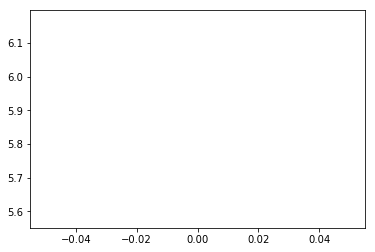

agent_value: 0.998227060917
input_value: 0.997897118313
output_value: 1.00036075703
mean diff: 5.874
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


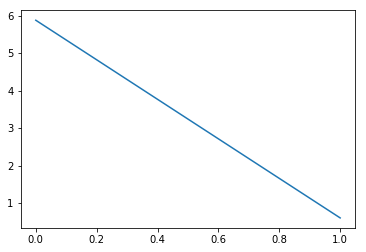

agent_value: 0.999034578364
input_value: 1.00467009618
output_value: 1.00075294757
mean diff: 0.604
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


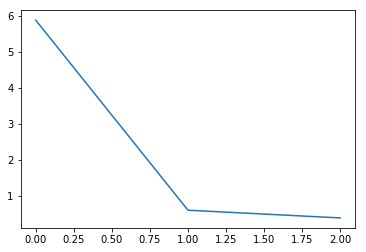

agent_value: 1.00009075352
input_value: 1.00066939968
output_value: 1.00061020126
mean diff: 0.39
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


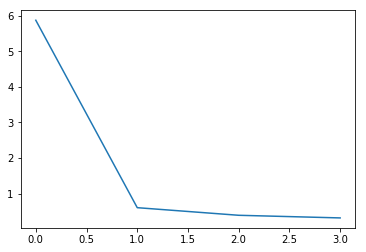

agent_value: 0.98808733202
input_value: 0.998584834319
output_value: 0.999372395518
mean diff: 0.316
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


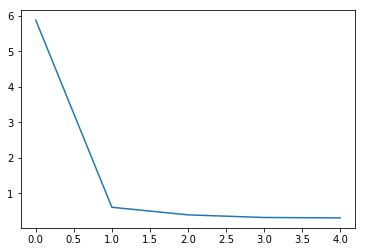

agent_value: 0.999058147771
input_value: 0.997321697974
output_value: 0.995283037613
mean diff: 0.304
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


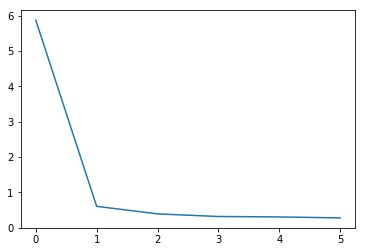

agent_value: 0.99995167457
input_value: 1.00084630673
output_value: 0.999329506118
mean diff: 0.276
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


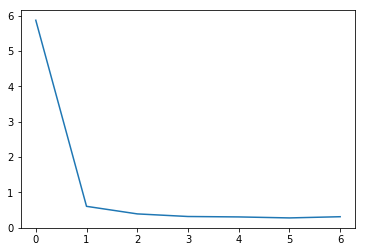

agent_value: 0.999998319141
input_value: 0.997319668535
output_value: 0.999124557577
mean diff: 0.31
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


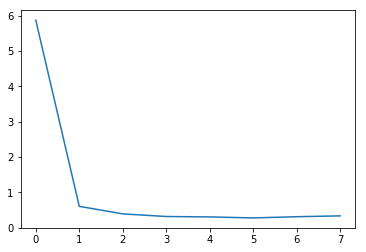

agent_value: 0.99985694948
input_value: 1.00001171359
output_value: 0.99987316784
mean diff: 0.334
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


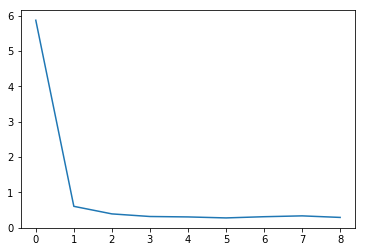

agent_value: 0.999923142657
input_value: 0.997922039983
output_value: 0.999085790539
mean diff: 0.29
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


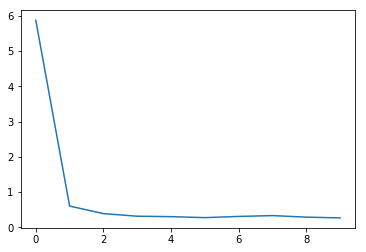

agent_value: 1.00035057667
input_value: 1.00032310911
output_value: 0.999807485525
mean diff: 0.268
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


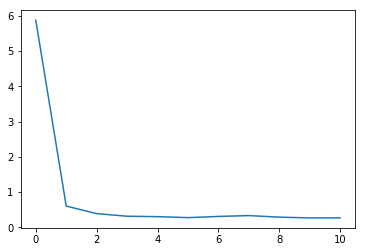

agent_value: 1.00008256686
input_value: 0.992426055411
output_value: 0.99933319306
mean diff: 0.268
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


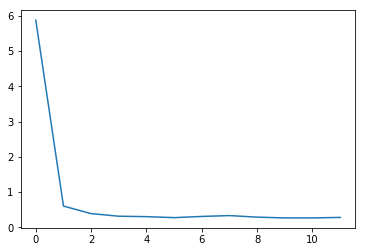

agent_value: 0.999937552034
input_value: 1.0009513497
output_value: 1.00009916322
mean diff: 0.282
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


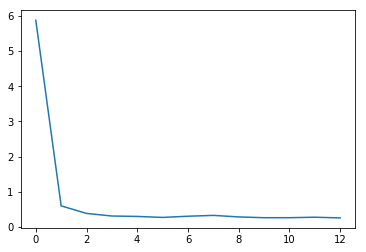

agent_value: 1.00112316424
input_value: 0.999603660796
output_value: 1.0009461066
mean diff: 0.262
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


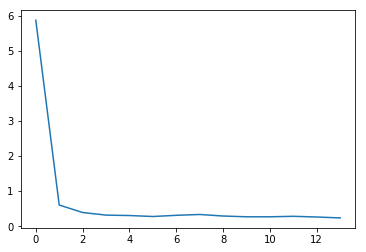

agent_value: 1.00023612385
input_value: 0.999986326684
output_value: 1.00203923968
mean diff: 0.236
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


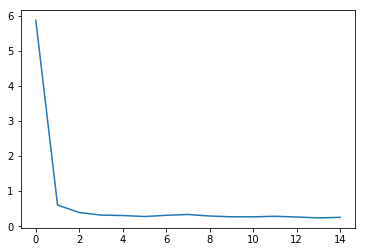

agent_value: 1.00032485564
input_value: 0.997066656578
output_value: 0.999540004496
mean diff: 0.252
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


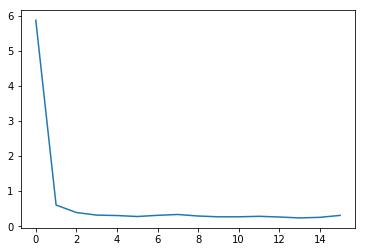

agent_value: 0.999804070864
input_value: 0.999834449791
output_value: 1.00118684257
mean diff: 0.308
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


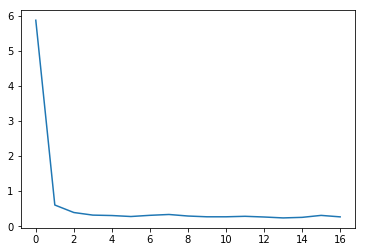

agent_value: 1.00013687301
input_value: 1.0012698851
output_value: 1.00020086176
mean diff: 0.266
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


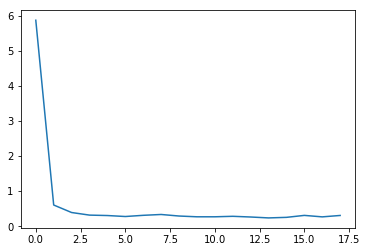

agent_value: 0.999803474763
input_value: 0.999914040634
output_value: 0.998547960027
mean diff: 0.306
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


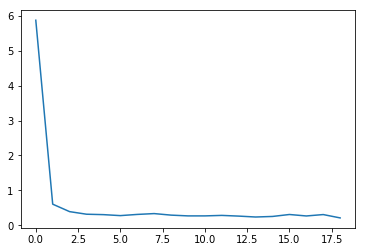

agent_value: 1.00040352251
input_value: 1.00122117312
output_value: 0.999655659624
mean diff: 0.21
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


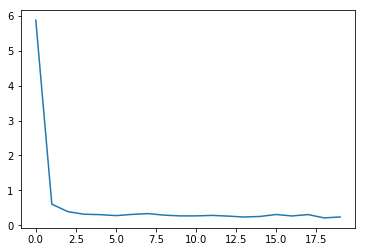

agent_value: 1.00018873006
input_value: 0.997611826266
output_value: 1.0005106757
mean diff: 0.238
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


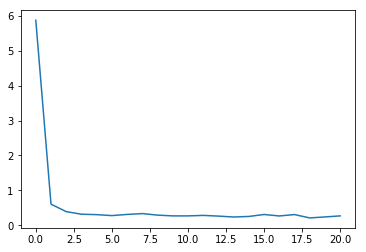

agent_value: 0.999884119047
input_value: 0.999167266997
output_value: 0.998091630322
mean diff: 0.268
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


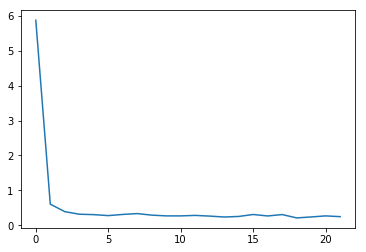

agent_value: 1.00011368529
input_value: 1.00004699753
output_value: 0.999563747564
mean diff: 0.246
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


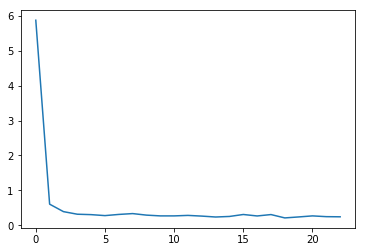

agent_value: 0.999059781777
input_value: 1.00169689714
output_value: 0.999583125364
mean diff: 0.242
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


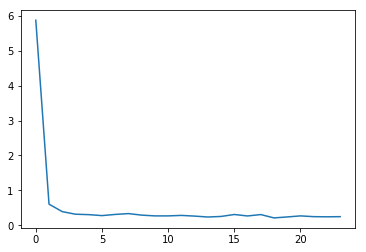

agent_value: 0.996745164046
input_value: 0.999873081823
output_value: 0.997350513862
mean diff: 0.246
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


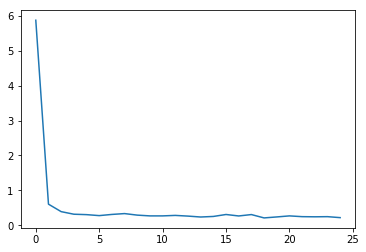

agent_value: 1.00001708401
input_value: 1.00008652805
output_value: 1.00059420115
mean diff: 0.218
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


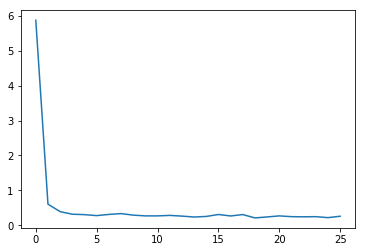

agent_value: 0.999791240886
input_value: 1.00132062422
output_value: 1.00010856658
mean diff: 0.258
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


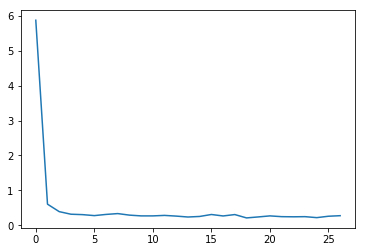

agent_value: 1.00000136529
input_value: 0.998776185563
output_value: 1.00048252605
mean diff: 0.274
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


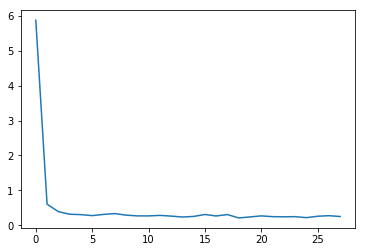

agent_value: 1.00007081954
input_value: 1.00042997805
output_value: 1.00201239569
mean diff: 0.25
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


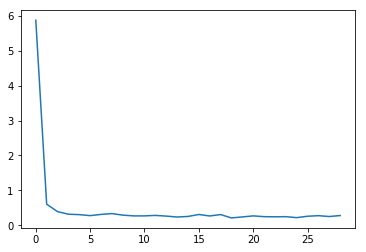

agent_value: 0.999917892072
input_value: 0.999106729838
output_value: 0.999780936906
mean diff: 0.278
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


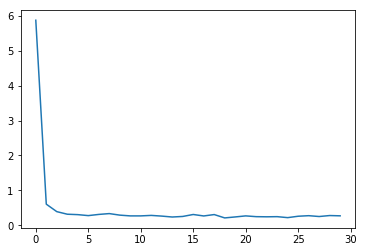

agent_value: 1.00007132381
input_value: 0.999280828734
output_value: 1.00000127594
mean diff: 0.27
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


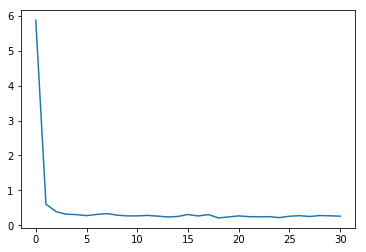

agent_value: 1.00019278641
input_value: 1.00277029203
output_value: 1.00181173699
mean diff: 0.26
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


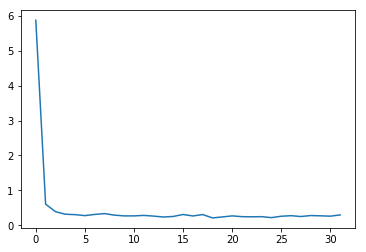

agent_value: 0.999882398463
input_value: 0.999587656181
output_value: 0.997818941005
mean diff: 0.296
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


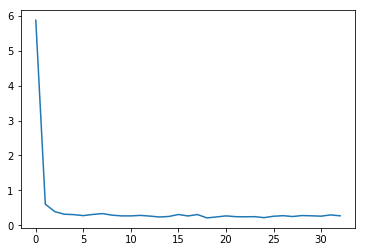

agent_value: 1.00011116491
input_value: 1.00084106571
output_value: 1.000288038
mean diff: 0.27
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


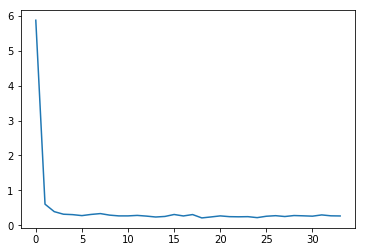

agent_value: 0.999875613489
input_value: 0.999923716784
output_value: 0.999958293548
mean diff: 0.266
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


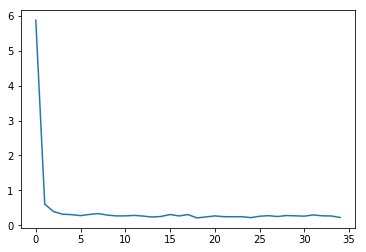

agent_value: 1.00054461743
input_value: 0.999780629798
output_value: 0.999151110374
mean diff: 0.222
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


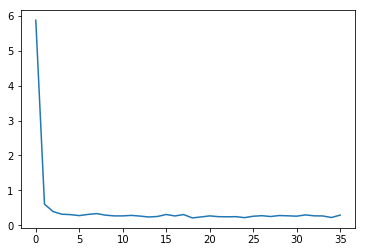

agent_value: 1.00005006326
input_value: 0.998574328415
output_value: 1.00017786852
mean diff: 0.29
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


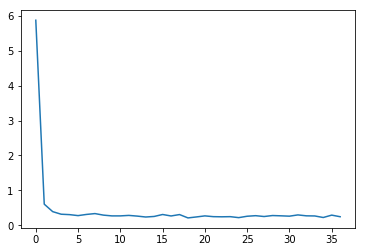

agent_value: 0.99914685164
input_value: 0.995273881768
output_value: 0.997997057042
mean diff: 0.244
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


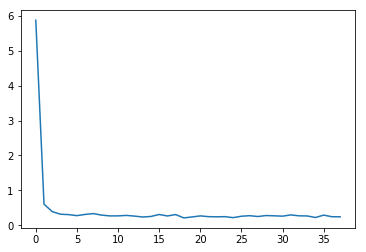

agent_value: 0.999890384256
input_value: 0.996805796849
output_value: 1.00008506965
mean diff: 0.242
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


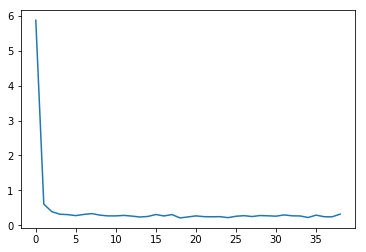

agent_value: 1.00026346932
input_value: 0.998088126071
output_value: 0.998070970514
mean diff: 0.318
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


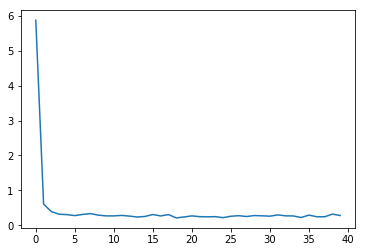

agent_value: 0.999676262934
input_value: 1.00018649731
output_value: 1.00028747963
mean diff: 0.28
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


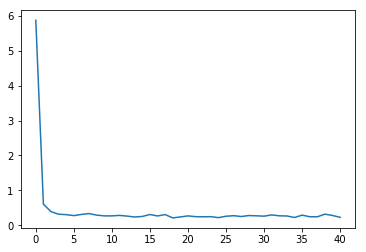

agent_value: 1.00013404209
input_value: 0.999762500575
output_value: 0.999584346876
mean diff: 0.226
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


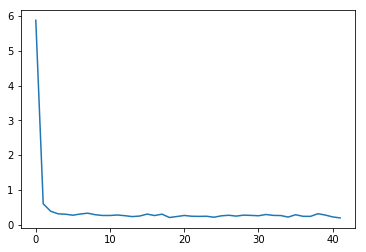

agent_value: 0.999927037095
input_value: 0.997975550336
output_value: 1.00066796818
mean diff: 0.198
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


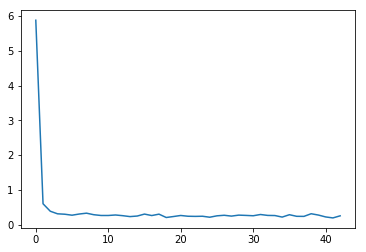

agent_value: 1.00039008937
input_value: 0.998475145876
output_value: 0.999418154697
mean diff: 0.258
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


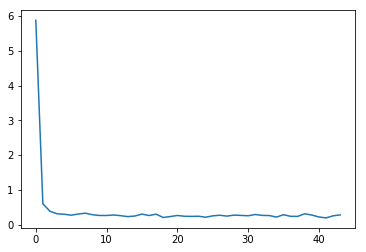

agent_value: 1.00005399953
input_value: 0.999766200765
output_value: 1.00012241241
mean diff: 0.286
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


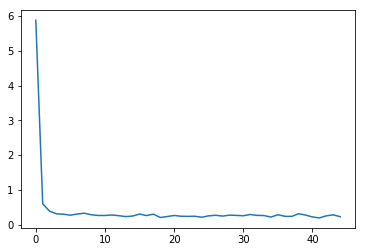

agent_value: 0.999832432406
input_value: 0.999414665025
output_value: 0.999013436742
mean diff: 0.234
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


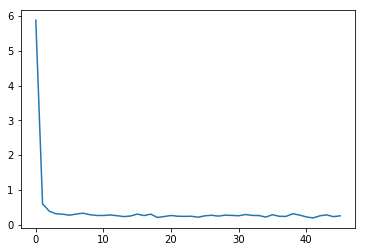

agent_value: 1.00024990116
input_value: 0.999622970597
output_value: 0.999853616808
mean diff: 0.258
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


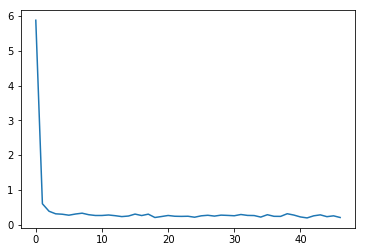

agent_value: 1.0000079569
input_value: 1.00002294413
output_value: 1.00014010088
mean diff: 0.21
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


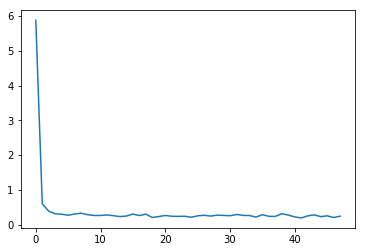

agent_value: 0.999998925384
input_value: 1.00067885242
output_value: 1.00214497326
mean diff: 0.248
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


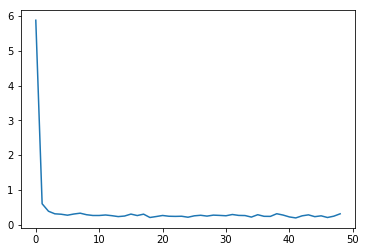

agent_value: 0.999453018677
input_value: 0.995446501532
output_value: 1.00027297335
mean diff: 0.316
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


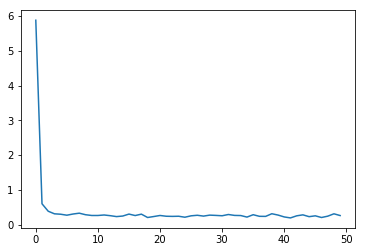

agent_value: 1.00009185354
input_value: 1.00121517538
output_value: 0.99920863593
mean diff: 0.266
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


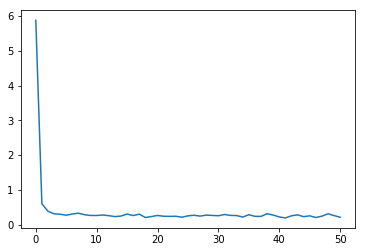

agent_value: 0.999539096619
input_value: 0.995371414408
output_value: 1.00214935707
mean diff: 0.216
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


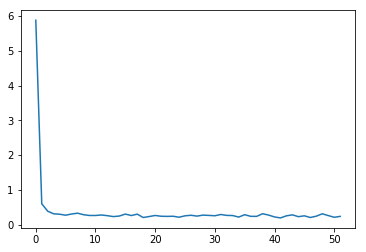

agent_value: 0.999702225309
input_value: 0.998426291864
output_value: 0.999091370381
mean diff: 0.242
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


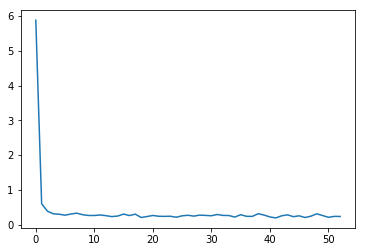

agent_value: 1.00026890803
input_value: 1.0012492577
output_value: 1.00088558941
mean diff: 0.24
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


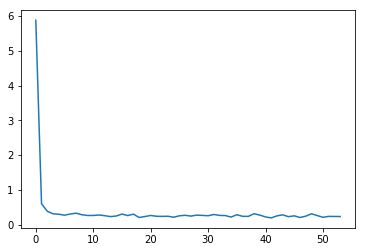

agent_value: 1.00062572386
input_value: 0.997894749171
output_value: 0.998509819034
mean diff: 0.238
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


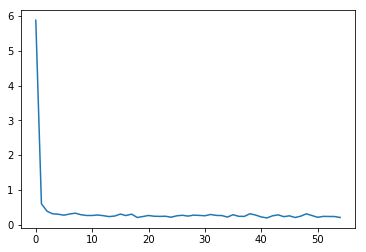

agent_value: 0.999935864823
input_value: 0.999944262847
output_value: 1.00012763737
mean diff: 0.21
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


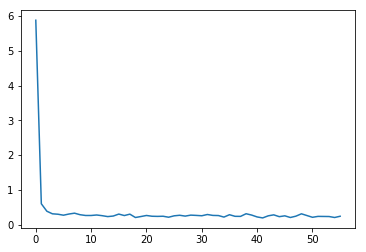

agent_value: 1.00000737431
input_value: 0.999344775808
output_value: 1.00096332003
mean diff: 0.246
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


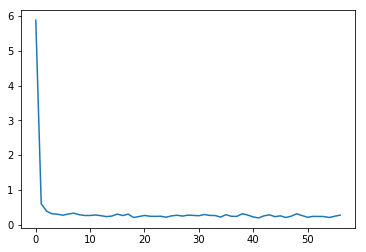

agent_value: 1.00057450561
input_value: 0.996639570815
output_value: 0.998382257904
mean diff: 0.278
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


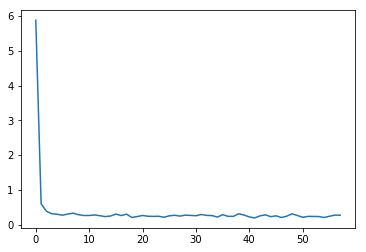

agent_value: 0.999823885133
input_value: 0.998964847858
output_value: 1.0002940021
mean diff: 0.276
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


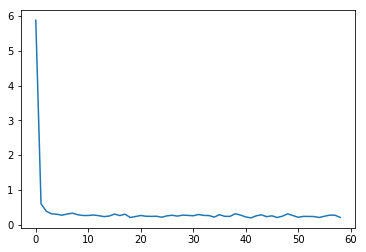

agent_value: 0.99981706811
input_value: 1.00045730483
output_value: 1.00049649685
mean diff: 0.212
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


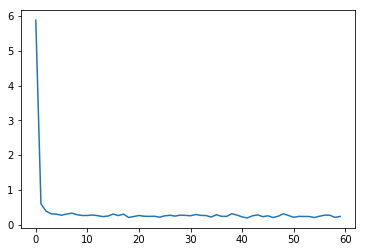

agent_value: 0.999680959688
input_value: 0.997113212496
output_value: 0.998350149618
mean diff: 0.242
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


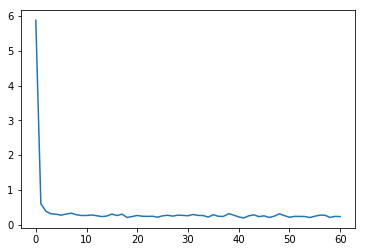

agent_value: 1.00125341768
input_value: 0.998856316556
output_value: 0.99867423823
mean diff: 0.236
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


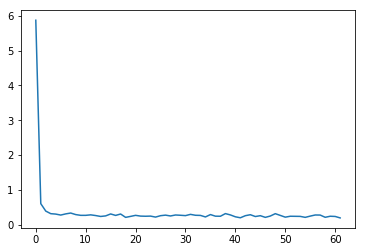

agent_value: 1.00052259003
input_value: 0.999771423433
output_value: 1.00131993168
mean diff: 0.194
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


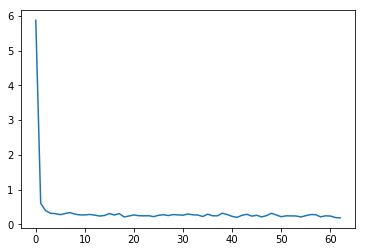

agent_value: 1.00027913778
input_value: 1.0007808421
output_value: 1.00026419332
mean diff: 0.182
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


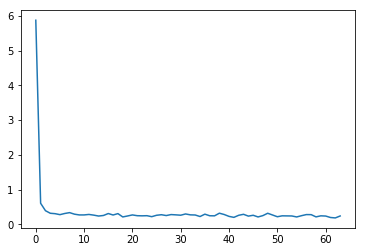

agent_value: 1.00026640532
input_value: 0.999325408088
output_value: 1.00050233749
mean diff: 0.238
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


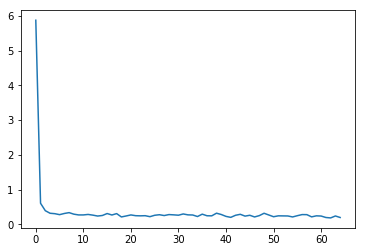

agent_value: 0.999979774992
input_value: 0.999193974478
output_value: 1.00017352516
mean diff: 0.194
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


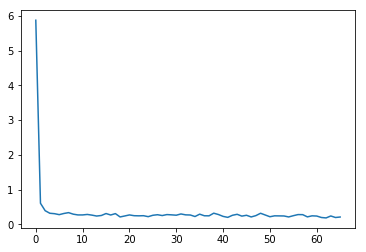

agent_value: 1.00085683828
input_value: 0.999765775032
output_value: 0.999656538899
mean diff: 0.208
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


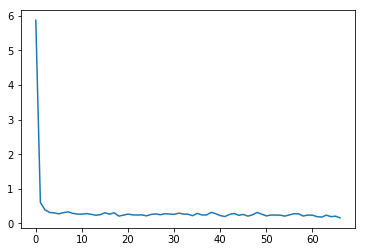

agent_value: 0.999985160967
input_value: 1.0004621892
output_value: 0.99968779533
mean diff: 0.158
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


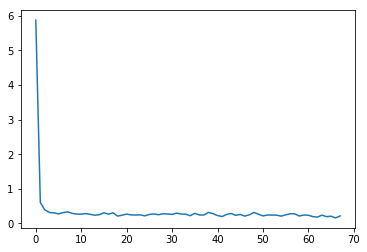

agent_value: 1.00021043017
input_value: 1.00014341269
output_value: 1.00015657561
mean diff: 0.216
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


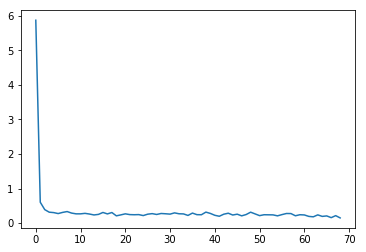

agent_value: 1.00013738051
input_value: 0.999367475429
output_value: 0.99830628784
mean diff: 0.15
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


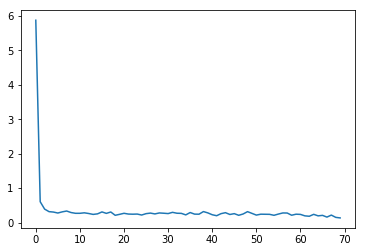

agent_value: 1.00001938179
input_value: 0.999734766231
output_value: 0.999962851381
mean diff: 0.134
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


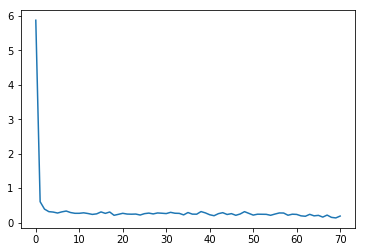

agent_value: 1.00043571736
input_value: 1.00075458251
output_value: 1.00126641534
mean diff: 0.188
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


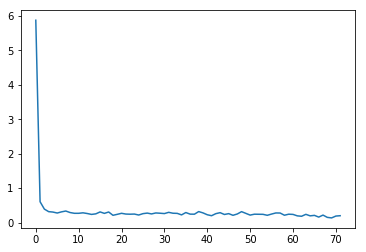

agent_value: 1.00020601848
input_value: 0.99930973118
output_value: 0.999774062994
mean diff: 0.198
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


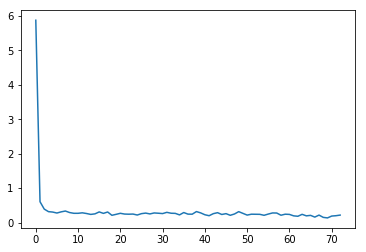

agent_value: 0.999958532725
input_value: 1.00011440782
output_value: 1.000091589
mean diff: 0.216
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


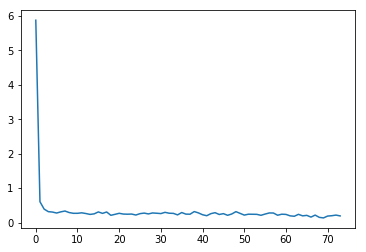

agent_value: 0.999548859563
input_value: 1.00054951391
output_value: 1.00065114369
mean diff: 0.192
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


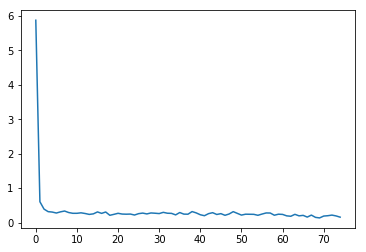

agent_value: 1.00004417068
input_value: 1.00001421607
output_value: 1.00028793495
mean diff: 0.156
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


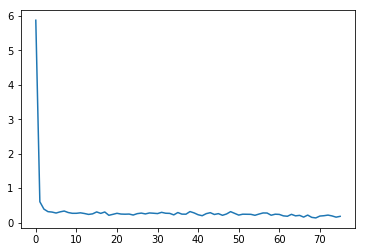

agent_value: 1.00005691978
input_value: 0.99928040562
output_value: 0.999811788728
mean diff: 0.18
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


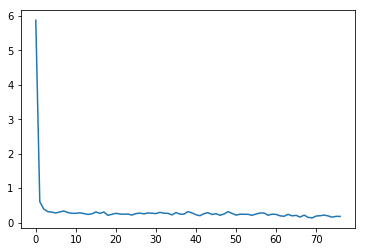

agent_value: 1.00019502624
input_value: 1.0004327723
output_value: 1.0008690064
mean diff: 0.178
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


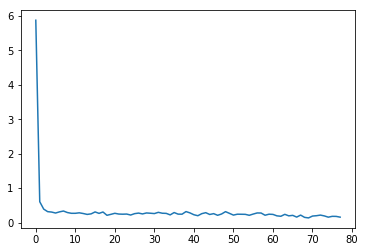

agent_value: 0.999992151632
input_value: 0.999922298857
output_value: 1.00012785279
mean diff: 0.156
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


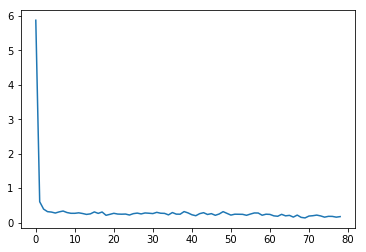

agent_value: 0.998414041266
input_value: 1.00034831674
output_value: 1.00328273456
mean diff: 0.172
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


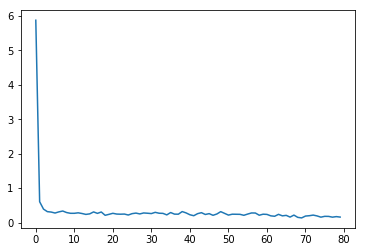

agent_value: 1.00031437199
input_value: 0.99839644656
output_value: 0.998871001001
mean diff: 0.158
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


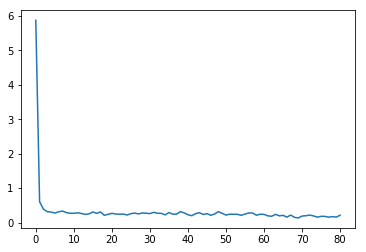

agent_value: 0.999579892699
input_value: 1.00115374111
output_value: 1.00094822024
mean diff: 0.212
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


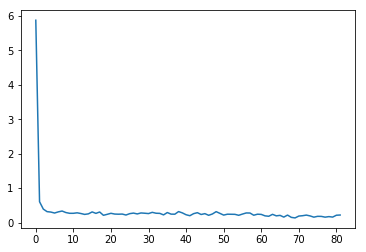

agent_value: 1.00040923586
input_value: 0.998446825039
output_value: 0.996871485668
mean diff: 0.218
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


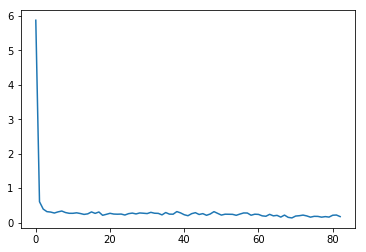

agent_value: 1.00008968902
input_value: 0.998708502249
output_value: 1.00261669124
mean diff: 0.172
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


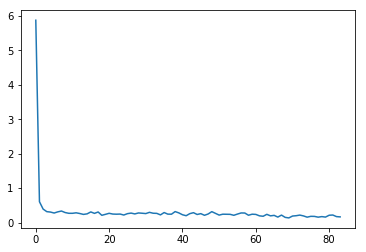

agent_value: 0.999788611844
input_value: 1.00105264822
output_value: 1.00003044017
mean diff: 0.164
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


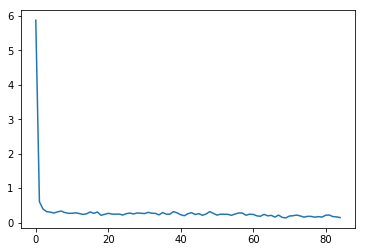

agent_value: 1.00004625837
input_value: 0.999642110799
output_value: 0.999693206281
mean diff: 0.144
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


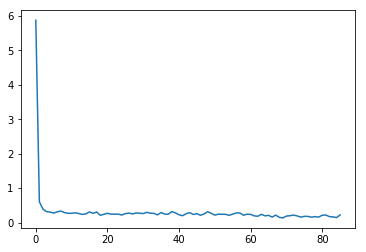

agent_value: 1.00010323891
input_value: 0.999906987844
output_value: 0.9995944765
mean diff: 0.222
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


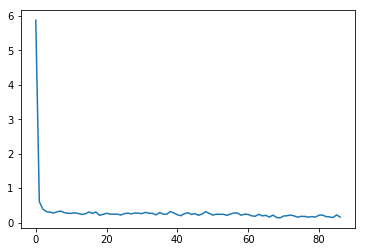

agent_value: 1.00055805843
input_value: 1.00091354081
output_value: 0.998947335895
mean diff: 0.156
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


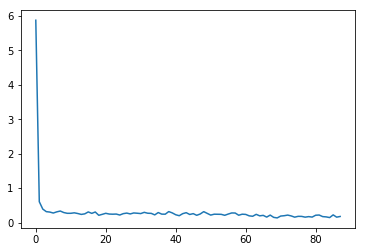

agent_value: 1.00006696797
input_value: 0.999766323936
output_value: 0.999926244219
mean diff: 0.176
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


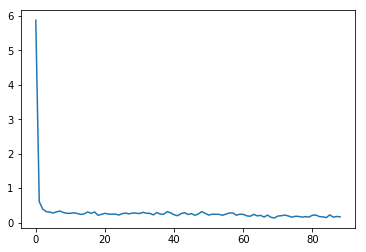

agent_value: 1.0000108887
input_value: 0.999951521387
output_value: 0.99977039864
mean diff: 0.166
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


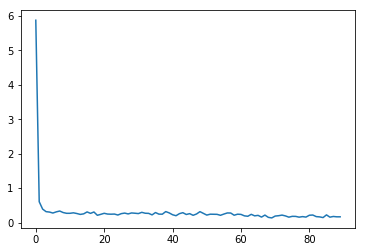

agent_value: 1.00025567765
input_value: 1.00016197396
output_value: 0.999588926312
mean diff: 0.166
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


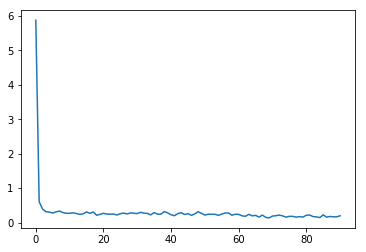

agent_value: 0.99982188253
input_value: 0.999949081558
output_value: 0.999556059282
mean diff: 0.196
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


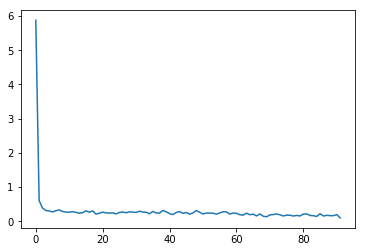

agent_value: 0.999102015449
input_value: 1.00073909322
output_value: 1.00206219291
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


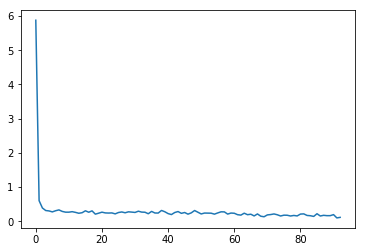

agent_value: 1.00032804735
input_value: 0.999672348704
output_value: 0.999845322333
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


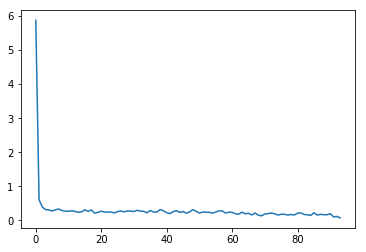

agent_value: 0.999669850807
input_value: 0.998613946368
output_value: 0.998607335467
mean diff: 0.072
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


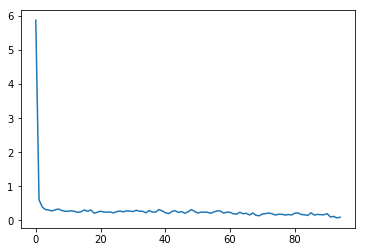

agent_value: 0.995238017621
input_value: 1.00664493963
output_value: 1.00707774898
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


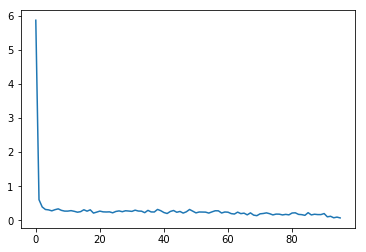

agent_value: 0.999427882544
input_value: 1.00020310225
output_value: 1.00072915103
mean diff: 0.068
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


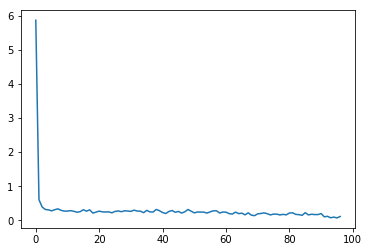

agent_value: 0.999891666184
input_value: 1.00052997047
output_value: 1.00063910638
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


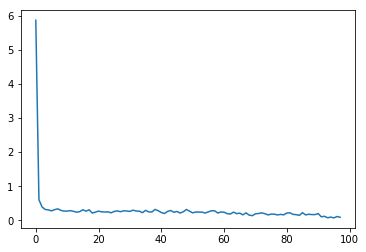

agent_value: 0.999316651684
input_value: 0.999176044497
output_value: 0.999201823823
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


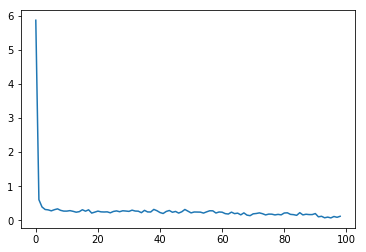

agent_value: 1.00007605443
input_value: 0.999567876805
output_value: 0.999836542781
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


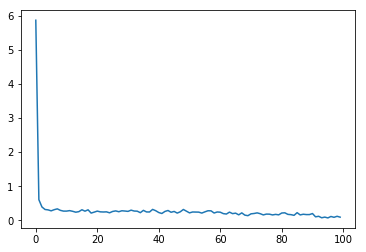

agent_value: 0.999378374282
input_value: 0.998938726704
output_value: 1.00126424898
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


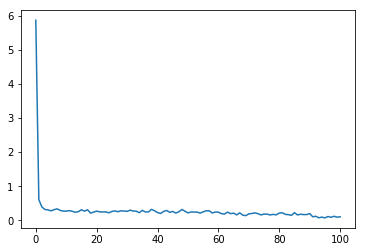

agent_value: 1.00027970005
input_value: 0.999817008183
output_value: 0.999827672316
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


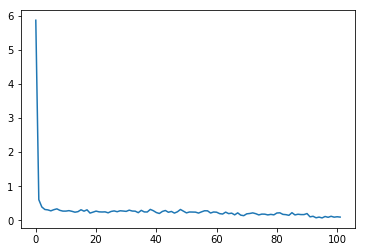

agent_value: 1.00035002768
input_value: 0.99992797484
output_value: 0.998657993716
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


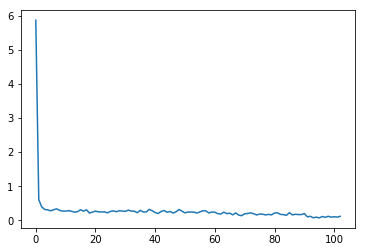

agent_value: 1.00076499851
input_value: 0.998863231522
output_value: 0.999474325858
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


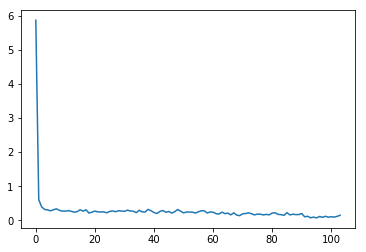

agent_value: 1.00290752409
input_value: 0.988752936669
output_value: 0.985233556144
mean diff: 0.146
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


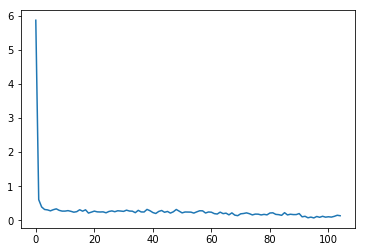

agent_value: 1.00089745128
input_value: 0.997540004072
output_value: 0.99853317636
mean diff: 0.132
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


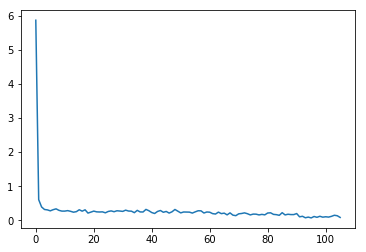

agent_value: 0.999206563771
input_value: 0.999701305357
output_value: 0.998470450035
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


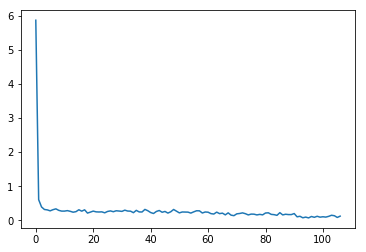

agent_value: 0.999988635963
input_value: 0.999883758628
output_value: 1.00033755902
mean diff: 0.12
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


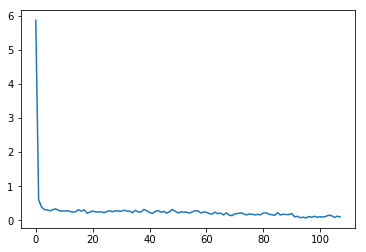

agent_value: 0.997756859957
input_value: 1.00016988797
output_value: 0.998588278307
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


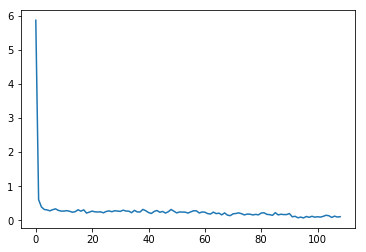

agent_value: 0.99959128279
input_value: 1.0007169025
output_value: 0.999841275597
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


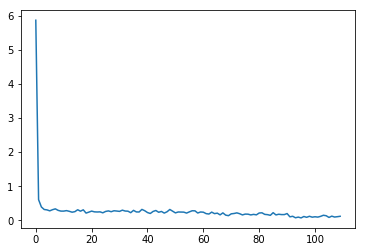

agent_value: 1.00021304051
input_value: 1.00016160993
output_value: 0.999868113451
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


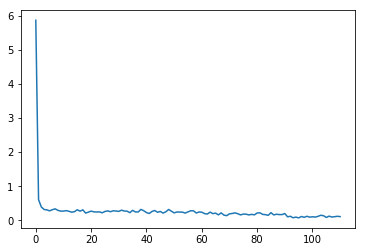

agent_value: 1.00064485886
input_value: 1.00100096842
output_value: 1.0007703368
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


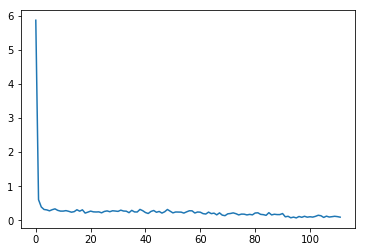

agent_value: 0.999954233224
input_value: 1.00021050484
output_value: 0.999772867199
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


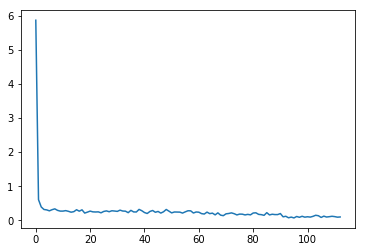

agent_value: 0.999833928225
input_value: 1.00000468533
output_value: 1.00024846728
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


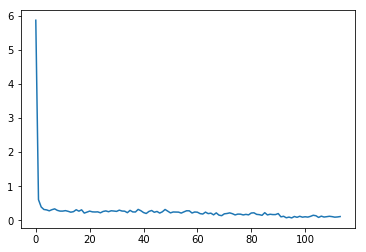

agent_value: 1.00033047947
input_value: 1.00199686096
output_value: 1.00192483975
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


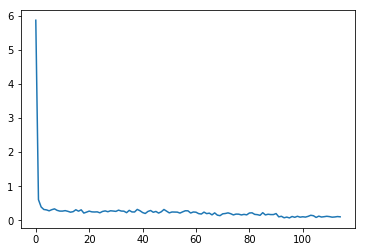

agent_value: 0.999840229135
input_value: 0.99754005086
output_value: 0.997878985696
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


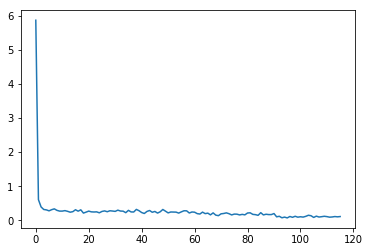

agent_value: 1.00023880733
input_value: 1.00091604304
output_value: 1.00023488783
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


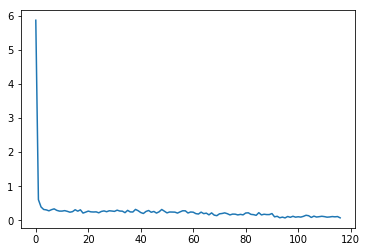

agent_value: 1.00088321222
input_value: 0.999520173846
output_value: 0.998484986431
mean diff: 0.07
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


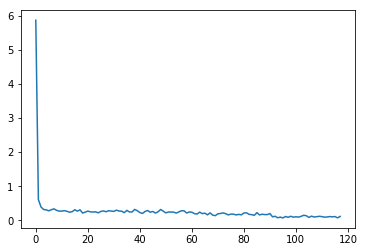

agent_value: 1.00159504762
input_value: 0.999394387578
output_value: 1.00041600553
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


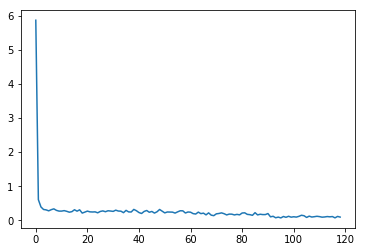

agent_value: 1.00023842975
input_value: 0.999155138707
output_value: 1.00014240782
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


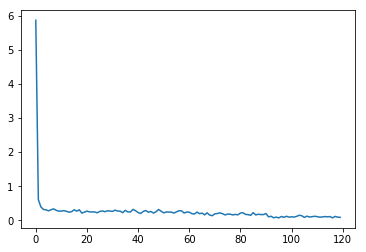

agent_value: 0.999878182276
input_value: 0.999759992781
output_value: 1.00002779454
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


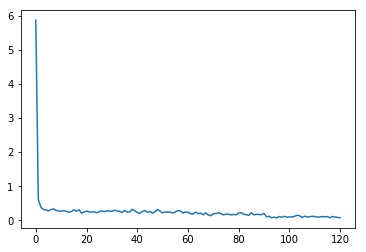

agent_value: 1.00084331762
input_value: 0.999934578318
output_value: 0.999860000305
mean diff: 0.07
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


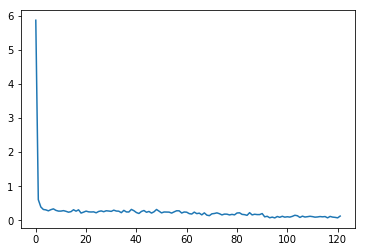

agent_value: 1.00111435756
input_value: 0.979696273979
output_value: 1.00114517872
mean diff: 0.122
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


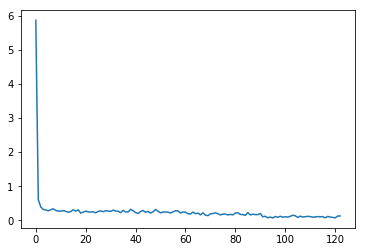

agent_value: 0.999941240465
input_value: 1.00084716443
output_value: 1.00085565094
mean diff: 0.126
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


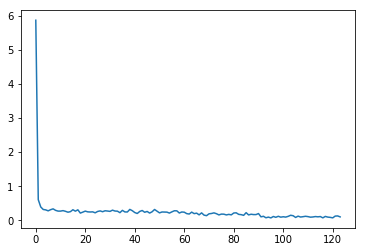

agent_value: 1.00034841694
input_value: 0.997310849784
output_value: 0.99796206349
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


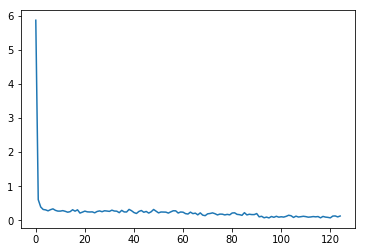

agent_value: 0.999737560447
input_value: 1.0002446307
output_value: 0.999849192603
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


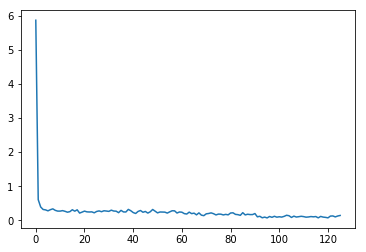

agent_value: 1.00001570101
input_value: 1.00003598861
output_value: 0.999484016661
mean diff: 0.14
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


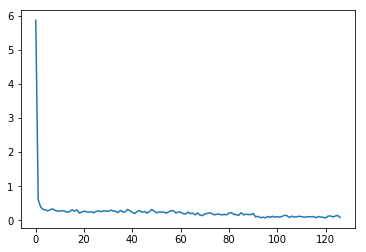

agent_value: 1.00007282681
input_value: 0.999928671744
output_value: 0.999917911222
mean diff: 0.078
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


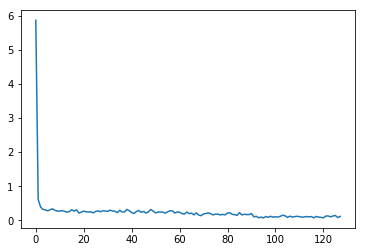

agent_value: 0.999927407749
input_value: 0.998898370839
output_value: 1.00029239016
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


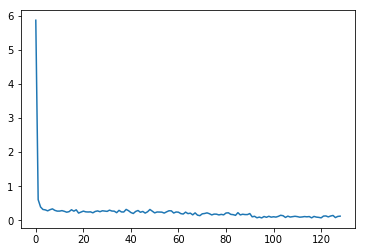

agent_value: 1.00048831697
input_value: 0.997627189769
output_value: 1.00031513811
mean diff: 0.12
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


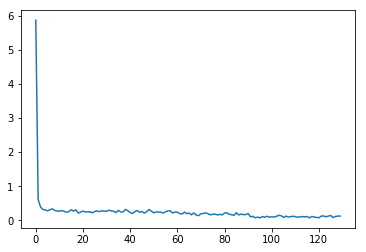

agent_value: 1.00068381263
input_value: 0.993623051234
output_value: 0.999003422158
mean diff: 0.122
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


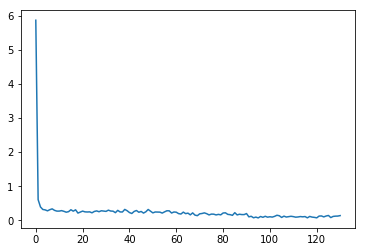

agent_value: 0.999639976142
input_value: 1.00204395732
output_value: 1.00166672505
mean diff: 0.136
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


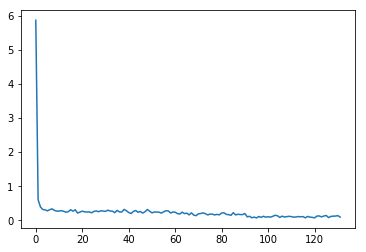

agent_value: 0.999880496448
input_value: 1.0003051553
output_value: 1.00005839456
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


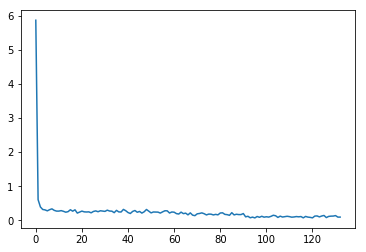

agent_value: 1.00048021803
input_value: 0.997294436009
output_value: 0.998915901921
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


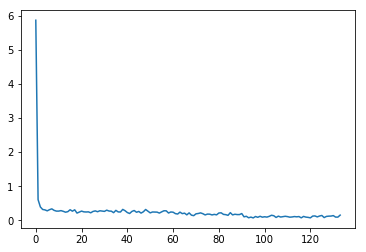

agent_value: 1.00194840558
input_value: 0.999415414289
output_value: 0.996778273081
mean diff: 0.15
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


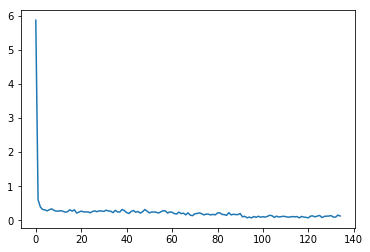

agent_value: 1.00083016214
input_value: 0.999270311137
output_value: 0.999269042047
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


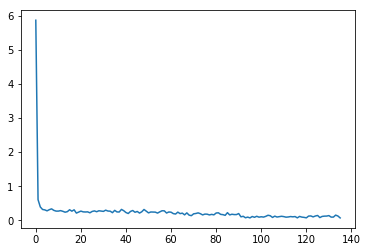

agent_value: 0.999884086651
input_value: 1.00059990096
output_value: 1.00047335771
mean diff: 0.068
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


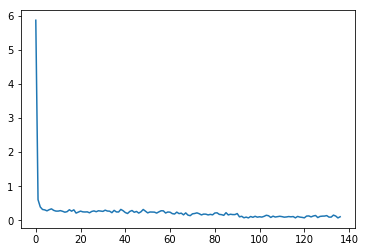

agent_value: 1.00013959363
input_value: 0.999739715688
output_value: 1.00007114227
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


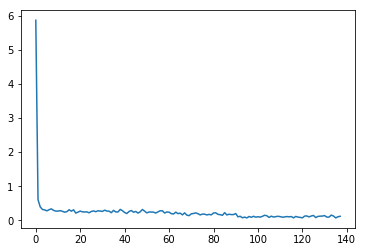

agent_value: 0.999892106988
input_value: 1.00333002573
output_value: 1.00207310244
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


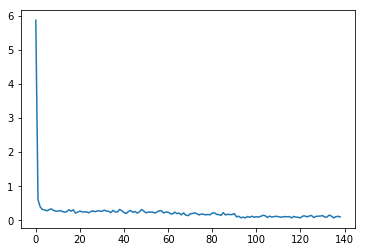

agent_value: 0.999743120363
input_value: 0.999825542381
output_value: 1.00003658573
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


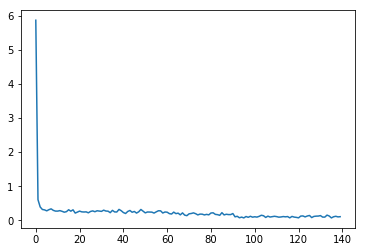

agent_value: 0.999492398768
input_value: 1.00141848161
output_value: 0.999960353739
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


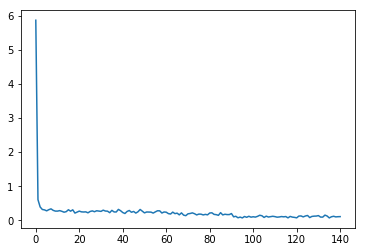

agent_value: 0.999953736222
input_value: 1.00017090907
output_value: 1.00012597294
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


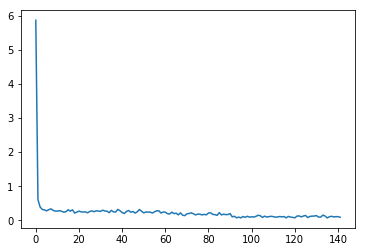

agent_value: 0.999742818428
input_value: 0.999410207954
output_value: 0.999985356522
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


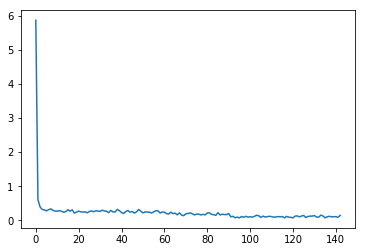

agent_value: 1.00005445893
input_value: 1.00004516914
output_value: 0.999943600651
mean diff: 0.142
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


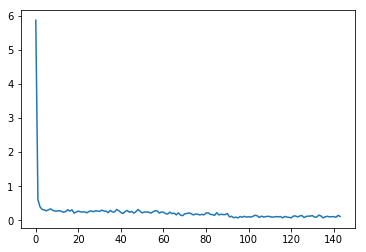

agent_value: 0.999711525837
input_value: 0.999344109454
output_value: 0.999707876938
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


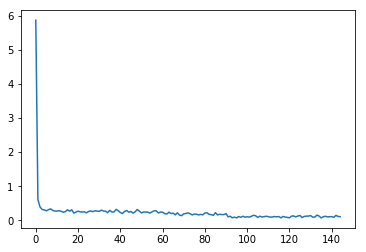

agent_value: 1.00022470103
input_value: 1.00087306401
output_value: 0.999789877833
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


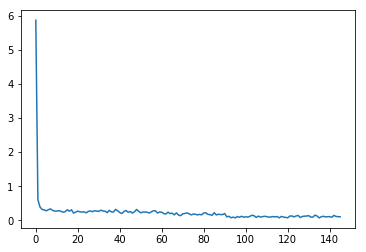

agent_value: 0.999994924367
input_value: 1.00017911478
output_value: 1.00027222269
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


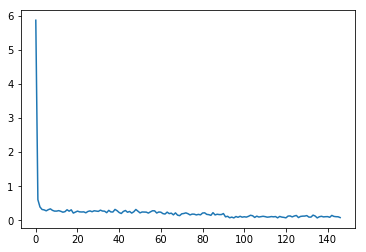

agent_value: 0.999894964228
input_value: 0.999643117395
output_value: 0.997970651341
mean diff: 0.078
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


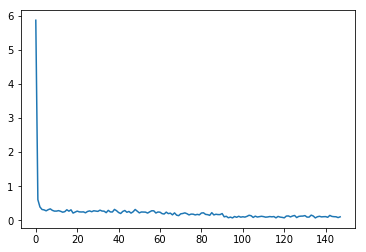

agent_value: 1.00049280042
input_value: 1.00005649253
output_value: 1.00077559331
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


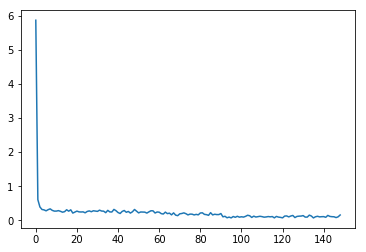

agent_value: 0.999608688968
input_value: 0.999981629641
output_value: 1.00029053848
mean diff: 0.154
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


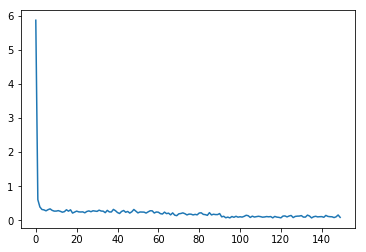

agent_value: 0.999997541035
input_value: 1.00000279169
output_value: 0.999903014285
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


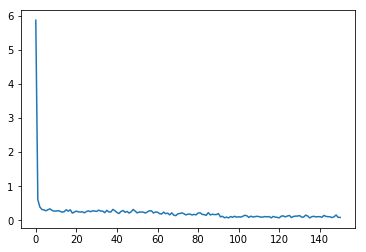

agent_value: 0.999956762223
input_value: 1.00008568242
output_value: 1.00029530868
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


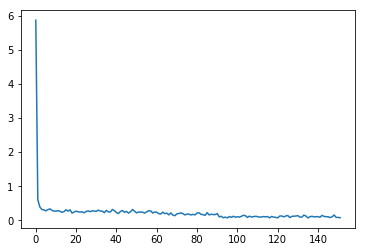

agent_value: 1.00039734176
input_value: 1.00018884442
output_value: 0.999886231697
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


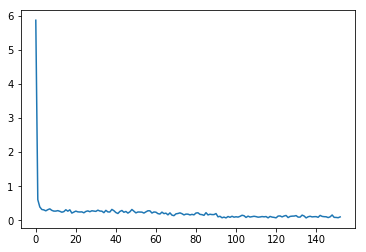

agent_value: 1.00025653196
input_value: 0.986679023951
output_value: 1.00016097534
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


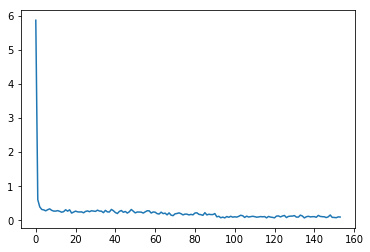

agent_value: 0.999971552751
input_value: 1.00018324973
output_value: 0.999538283348
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


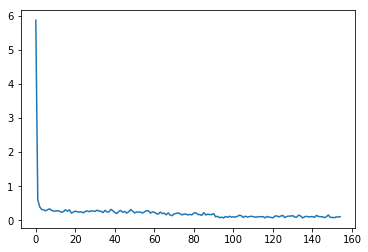

agent_value: 0.999500285913
input_value: 0.998287394967
output_value: 1.00202431201
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


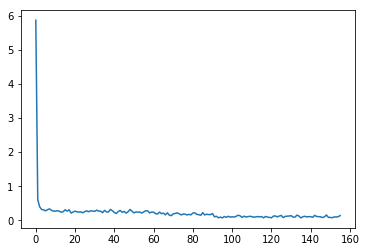

agent_value: 1.0000259579
input_value: 1.0000863654
output_value: 1.00041939297
mean diff: 0.136
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


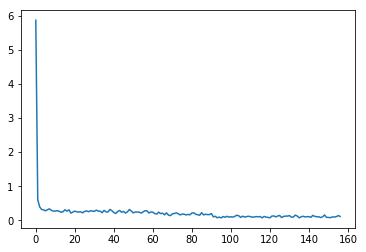

agent_value: 1.0005358321
input_value: 1.00087445934
output_value: 1.0014693294
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


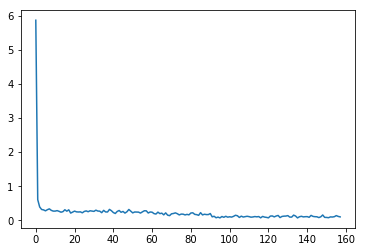

agent_value: 0.999144100944
input_value: 0.99971562574
output_value: 0.999529390587
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


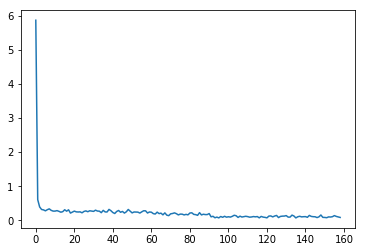

agent_value: 1.00009905555
input_value: 1.00066973889
output_value: 1.00077804479
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


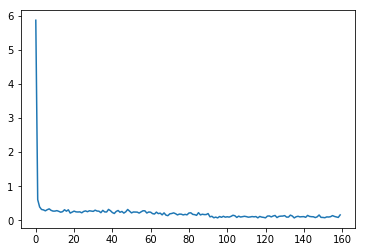

agent_value: 0.999924634476
input_value: 0.998687598366
output_value: 1.000498442
mean diff: 0.156
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


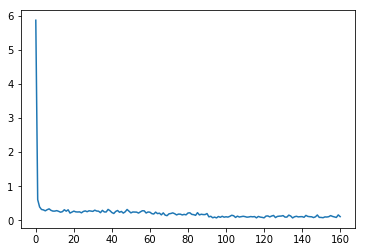

agent_value: 1.00004239221
input_value: 0.998852182783
output_value: 1.00154561629
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


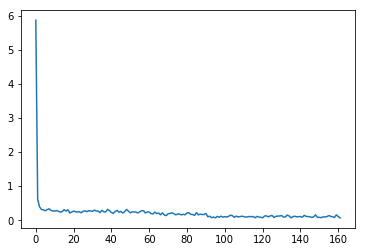

agent_value: 1.00037214563
input_value: 1.00116000467
output_value: 1.00077136898
mean diff: 0.066
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


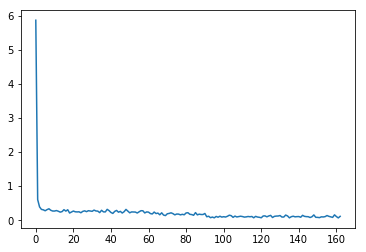

agent_value: 0.999708205471
input_value: 0.99944174356
output_value: 0.999437121206
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


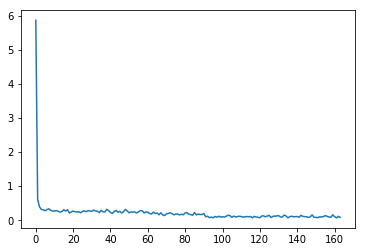

agent_value: 0.999761564479
input_value: 1.00130619663
output_value: 1.00027633671
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


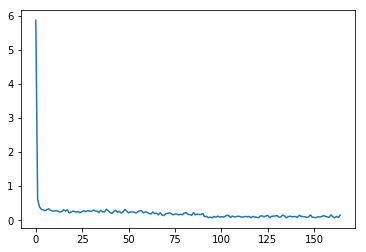

agent_value: 1.00003058328
input_value: 1.00039814125
output_value: 1.0000225229
mean diff: 0.148
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


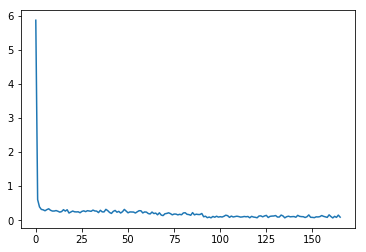

agent_value: 1.00003278702
input_value: 0.999424498232
output_value: 0.999581644939
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


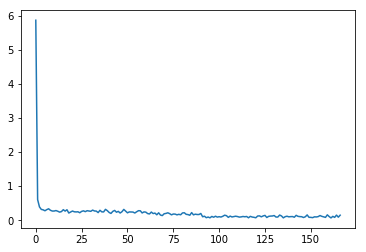

agent_value: 1.00013540412
input_value: 0.99933752613
output_value: 1.00127897862
mean diff: 0.146
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


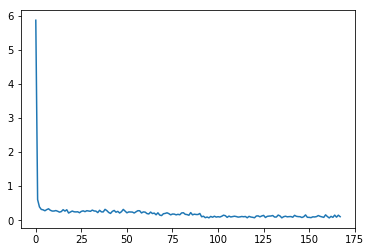

agent_value: 1.00010957538
input_value: 0.999772375943
output_value: 1.00017879436
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


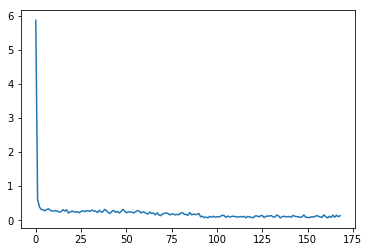

agent_value: 0.999950660772
input_value: 0.999813995443
output_value: 1.00013539011
mean diff: 0.132
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


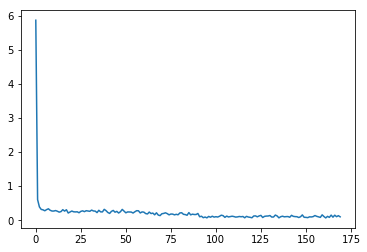

agent_value: 0.998724224579
input_value: 1.00270415511
output_value: 0.996743026843
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


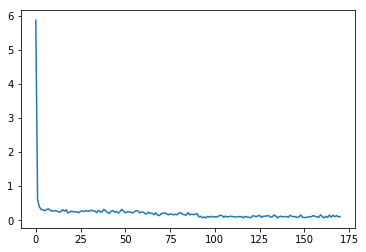

agent_value: 0.999305001862
input_value: 0.997351428111
output_value: 0.999600088416
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


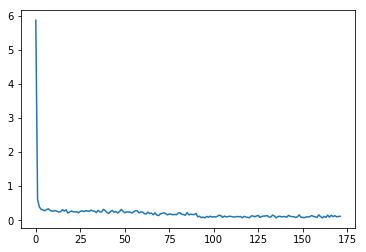

agent_value: 1.00041097214
input_value: 0.997282656966
output_value: 0.997098350483
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


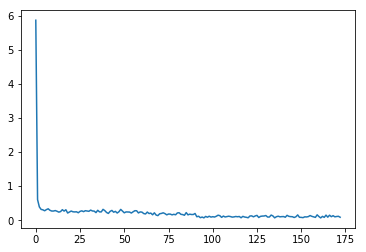

agent_value: 1.00109959665
input_value: 0.998620485133
output_value: 1.00134252753
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


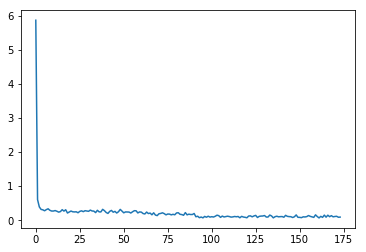

agent_value: 0.999979244117
input_value: 0.999585024236
output_value: 0.999738451092
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


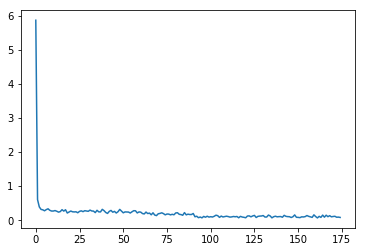

agent_value: 1.00104425687
input_value: 0.9995532147
output_value: 1.00076300839
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


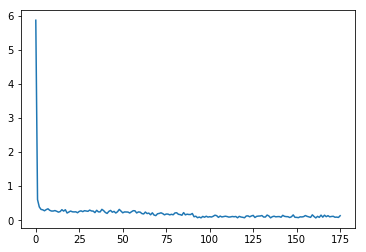

agent_value: 1.00022809043
input_value: 0.996838226926
output_value: 0.999006785752
mean diff: 0.13
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


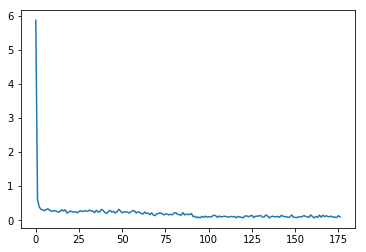

agent_value: 1.00034940005
input_value: 0.996213309481
output_value: 0.999652005798
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


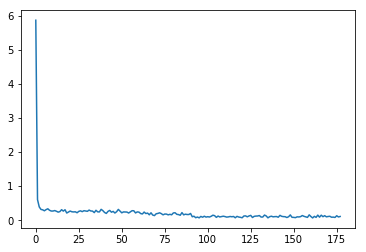

agent_value: 0.999800039081
input_value: 0.998370716428
output_value: 1.00015814331
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


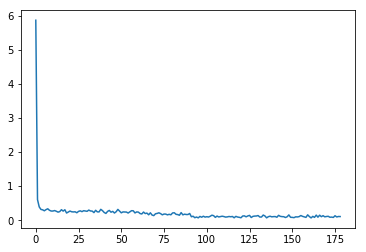

agent_value: 1.00025678082
input_value: 0.999820445314
output_value: 0.999580756317
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


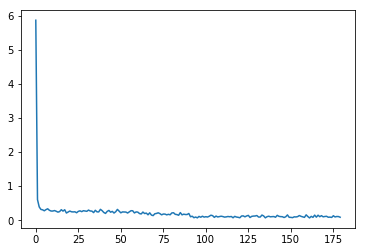

agent_value: 0.998957565589
input_value: 1.00430776914
output_value: 1.00108513036
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


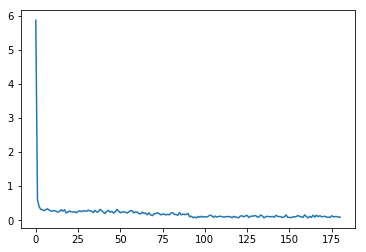

agent_value: 1.00042051306
input_value: 1.00049519509
output_value: 1.00077951409
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


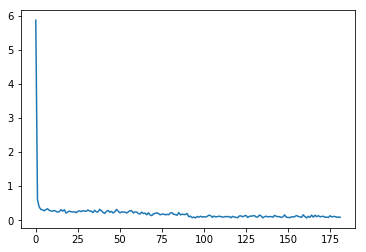

agent_value: 1.00018410778
input_value: 0.99930754623
output_value: 0.999190405927
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


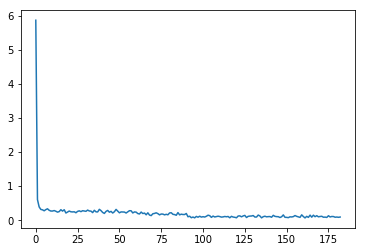

agent_value: 1.00011903925
input_value: 0.99993186218
output_value: 0.99998975558
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


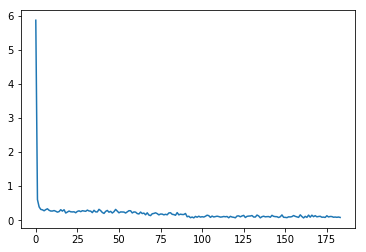

agent_value: 1.00016996526
input_value: 1.000158261
output_value: 0.999925735448
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


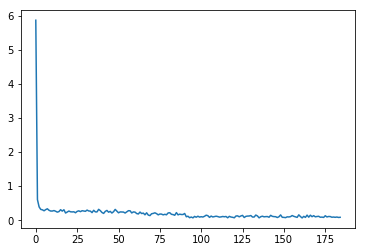

agent_value: 1.00019746492
input_value: 1.0002849513
output_value: 1.00030314956
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


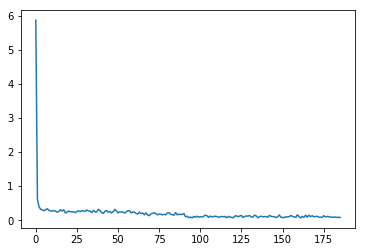

agent_value: 0.999139608199
input_value: 1.00145617056
output_value: 0.998548896234
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


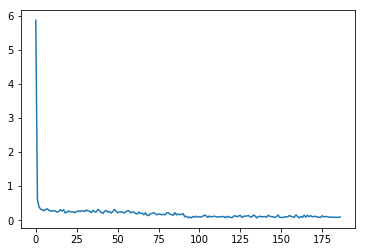

agent_value: 1.00017120345
input_value: 0.999601164877
output_value: 0.998657696768
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


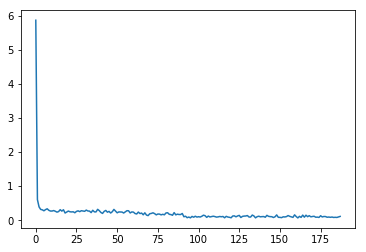

agent_value: 1.00004939877
input_value: 0.996786084923
output_value: 0.998189583393
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


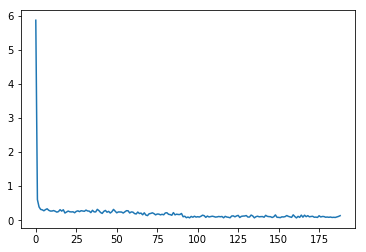

agent_value: 1.00009695526
input_value: 0.995527647941
output_value: 1.00043853929
mean diff: 0.132
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


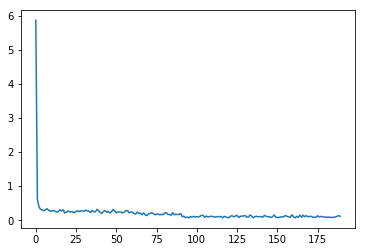

agent_value: 0.99966573365
input_value: 1.00041492204
output_value: 1.0002194927
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


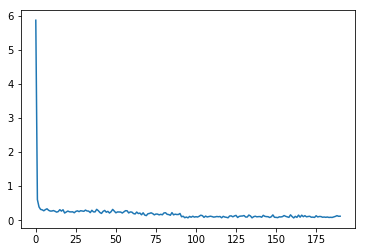

agent_value: 0.990544990348
input_value: 0.997070514598
output_value: 1.00028411382
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


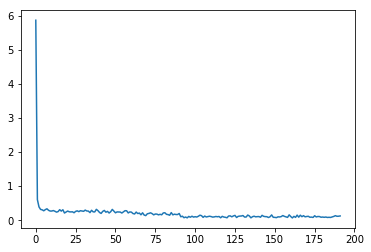

agent_value: 0.999904197102
input_value: 0.999248333059
output_value: 0.999719557617
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


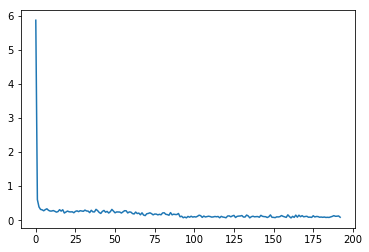

agent_value: 0.998945139279
input_value: 1.00062725628
output_value: 1.00086364317
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


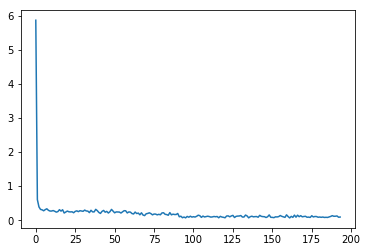

agent_value: 1.00158386465
input_value: 1.00239339574
output_value: 1.00063225331
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


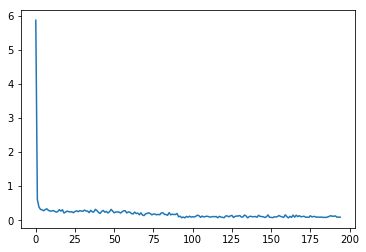

agent_value: 0.999967844866
input_value: 1.000078031
output_value: 0.999816871821
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


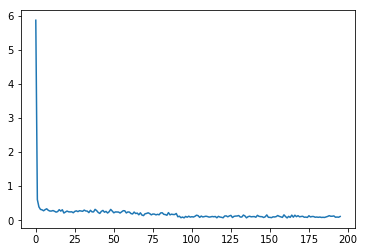

agent_value: 1.00013436836
input_value: 0.999873375229
output_value: 1.00005821252
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


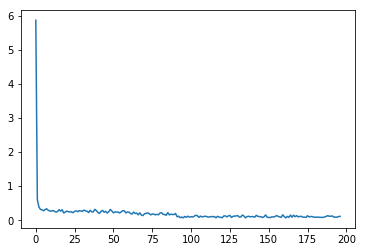

agent_value: 0.999734963888
input_value: 1.00039631181
output_value: 0.999090330626
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


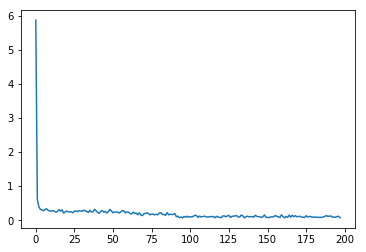

agent_value: 1.00010290194
input_value: 0.999835982373
output_value: 0.999801597421
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


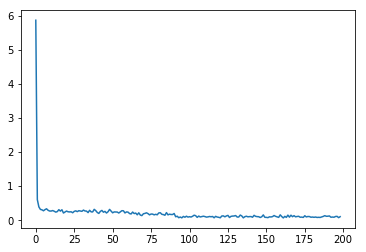

agent_value: 0.999906251289
input_value: 0.999725147671
output_value: 0.999991713758
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


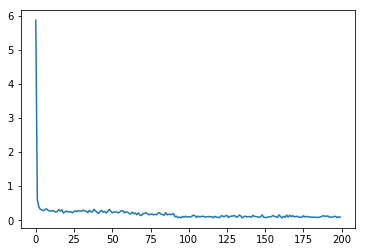

agent_value: 0.998596970391
input_value: 0.99922548002
output_value: 1.00135865389
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


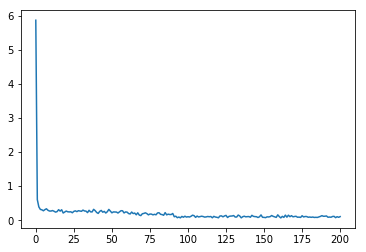

agent_value: 1.00005424432
input_value: 0.993720821987
output_value: 0.999845309737
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


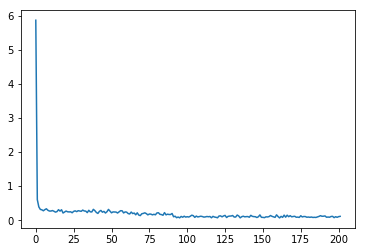

agent_value: 1.00041463638
input_value: 0.994772173196
output_value: 0.995549272466
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


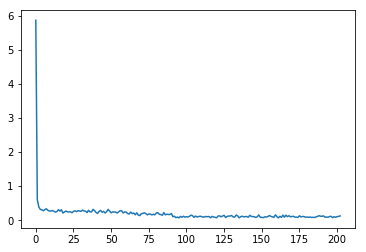

agent_value: 0.999931485909
input_value: 1.00106801626
output_value: 1.00043470373
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


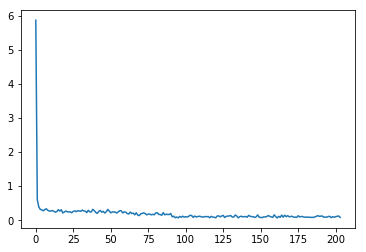

agent_value: 0.999749871547
input_value: 0.999801130753
output_value: 0.999537517299
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


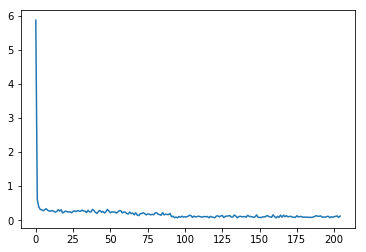

agent_value: 1.00000991553
input_value: 1.00055743002
output_value: 1.00069719581
mean diff: 0.12
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


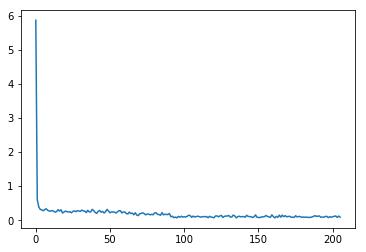

agent_value: 1.00024069352
input_value: 1.00020982354
output_value: 1.00041443931
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


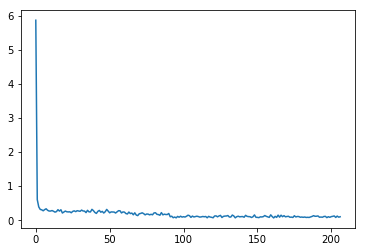

agent_value: 0.999915823781
input_value: 1.00013665277
output_value: 1.00044695287
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


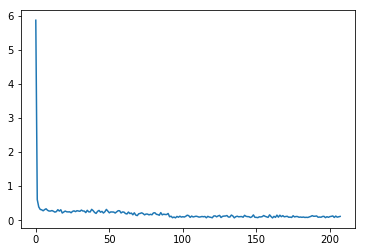

agent_value: 0.999629384375
input_value: 1.00051920472
output_value: 1.00054005692
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


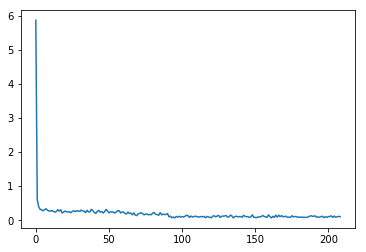

agent_value: 0.99873913199
input_value: 0.998823489151
output_value: 1.00003696281
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


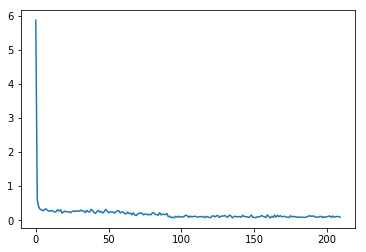

agent_value: 1.00001825274
input_value: 0.999938386364
output_value: 0.999976863349
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


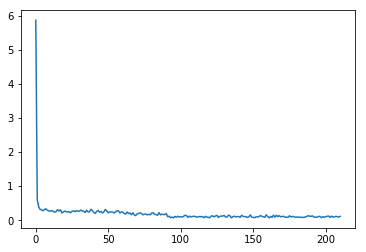

agent_value: 0.999931046822
input_value: 0.999963512108
output_value: 1.00000847759
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


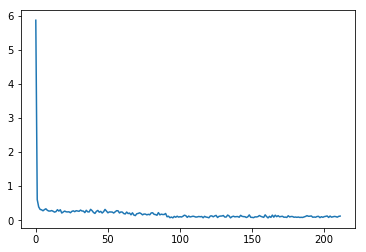

agent_value: 0.999727123145
input_value: 0.999329540706
output_value: 0.998724298988
mean diff: 0.12
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


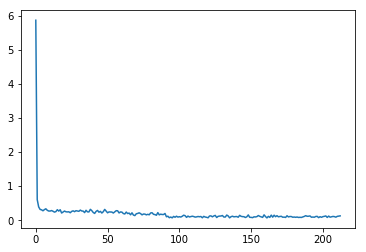

agent_value: 0.999546615392
input_value: 1.00061325927
output_value: 0.999991546021
mean diff: 0.126
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


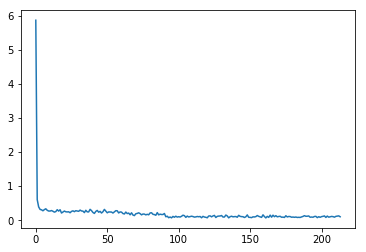

agent_value: 1.00042200202
input_value: 0.958451883453
output_value: 0.999210081729
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


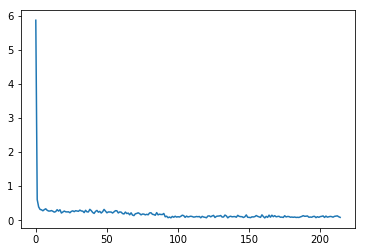

agent_value: 1.0000060769
input_value: 0.999620220812
output_value: 0.999752095167
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


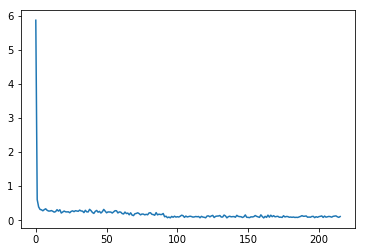

agent_value: 0.999974410592
input_value: 0.999775988464
output_value: 0.999387108134
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


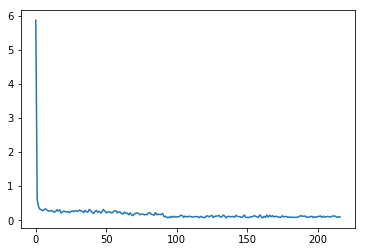

agent_value: 0.999873579553
input_value: 0.999818692344
output_value: 1.00046183626
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


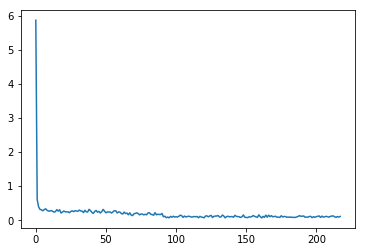

agent_value: 0.999858280512
input_value: 1.00039288672
output_value: 1.00061440888
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


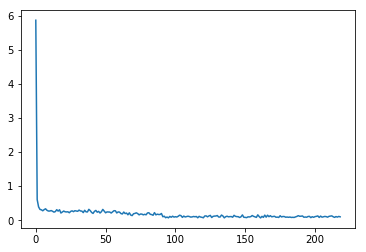

agent_value: 0.999717703541
input_value: 0.997805404921
output_value: 0.999069091498
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


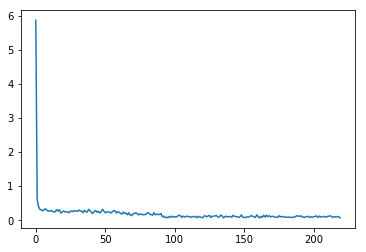

agent_value: 0.999870711769
input_value: 1.0001856058
output_value: 0.999860411219
mean diff: 0.066
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


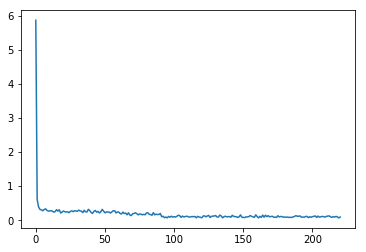

agent_value: 1.00003374396
input_value: 1.00022696982
output_value: 1.0002651914
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


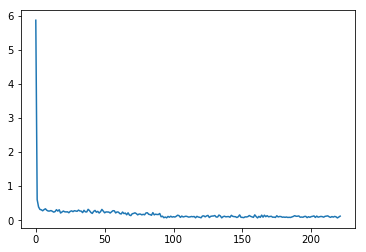

agent_value: 1.0000777939
input_value: 0.999621308812
output_value: 1.00149074116
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


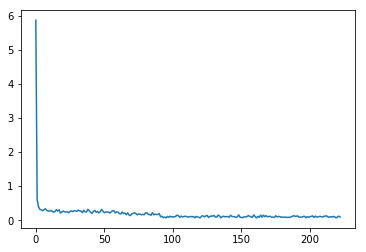

agent_value: 1.00028663255
input_value: 1.00192425892
output_value: 1.00017146028
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


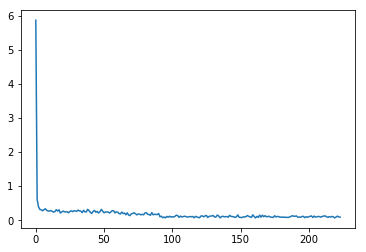

agent_value: 1.00016373264
input_value: 1.00078745867
output_value: 1.00151504997
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


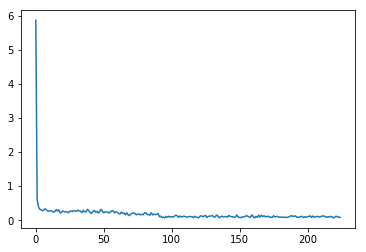

agent_value: 0.999674614748
input_value: 1.00107444706
output_value: 1.00095728871
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


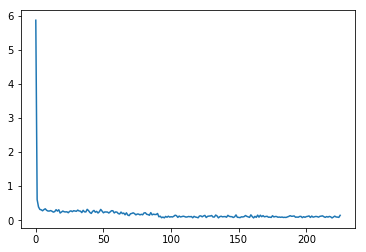

agent_value: 0.99980509346
input_value: 0.999821351596
output_value: 0.999936291082
mean diff: 0.142
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


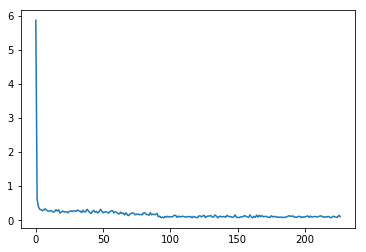

agent_value: 0.999891341976
input_value: 1.00175316326
output_value: 1.00126782633
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


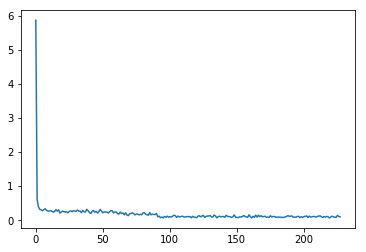

agent_value: 0.999612966482
input_value: 1.0000116953
output_value: 0.998762299704
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


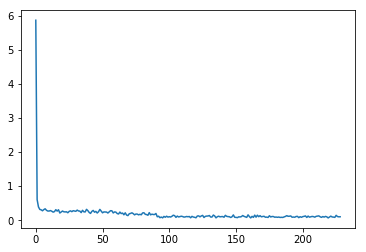

agent_value: 0.999793567019
input_value: 1.0004142184
output_value: 1.00076889511
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


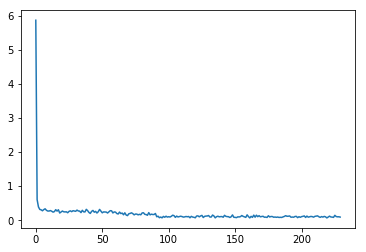

agent_value: 0.999600938874
input_value: 1.0001857304
output_value: 1.00072901393
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


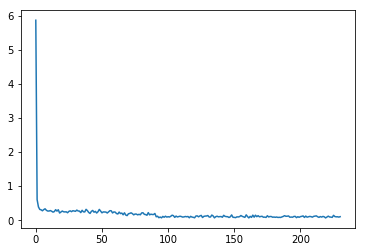

agent_value: 1.00012881977
input_value: 0.999651786985
output_value: 0.999796351477
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


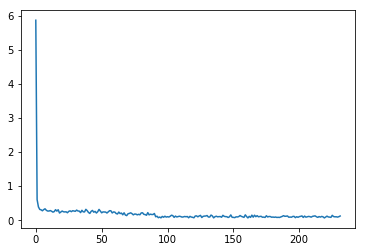

agent_value: 0.99984579766
input_value: 1.0000164428
output_value: 1.00035988433
mean diff: 0.122
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


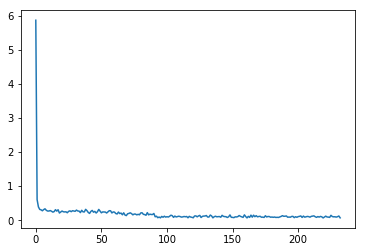

agent_value: 0.999668166347
input_value: 1.00034645168
output_value: 0.999432275947
mean diff: 0.068
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


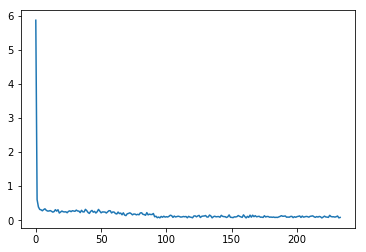

agent_value: 0.999815986553
input_value: 0.99958675265
output_value: 0.999785446536
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


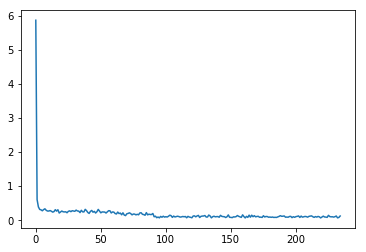

agent_value: 1.00016559038
input_value: 0.999759625133
output_value: 0.999968471115
mean diff: 0.122
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


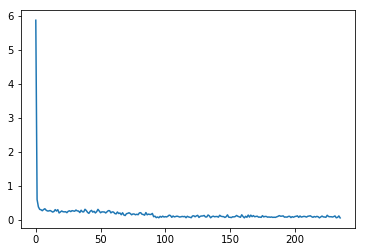

agent_value: 0.999935992294
input_value: 0.999851136178
output_value: 1.00009527784
mean diff: 0.064
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


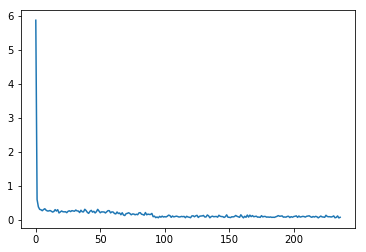

agent_value: 0.99943748526
input_value: 1.00175083182
output_value: 0.999582836118
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


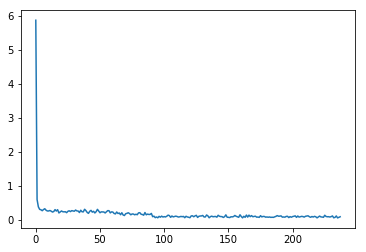

agent_value: 0.999689776656
input_value: 0.99476889283
output_value: 0.993738180715
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


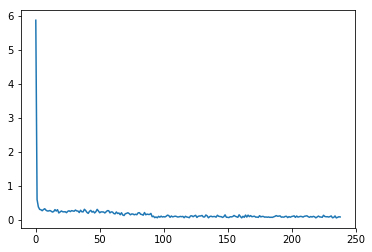

agent_value: 0.999994199176
input_value: 0.99964021434
output_value: 0.999752602434
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


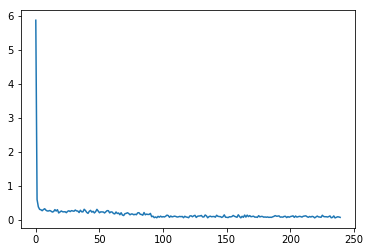

agent_value: 0.999021458088
input_value: 1.00000370621
output_value: 1.00062966175
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


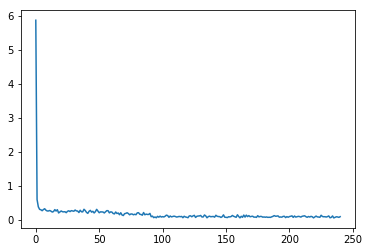

agent_value: 0.999857061885
input_value: 1.0001117853
output_value: 1.00008162548
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


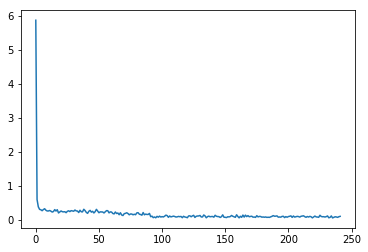

agent_value: 0.999801598494
input_value: 1.00199827311
output_value: 1.00086300424
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


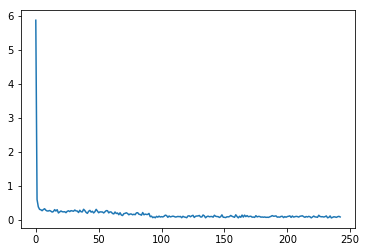

agent_value: 1.00011309546
input_value: 0.999761867401
output_value: 0.999926596912
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


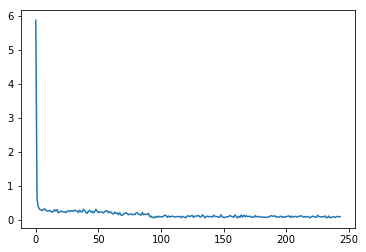

agent_value: 0.999941765572
input_value: 0.999699419162
output_value: 0.99996991131
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


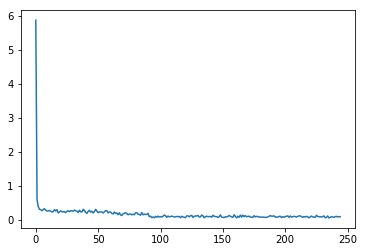

agent_value: 1.00005461652
input_value: 0.999903487384
output_value: 1.00021477355
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


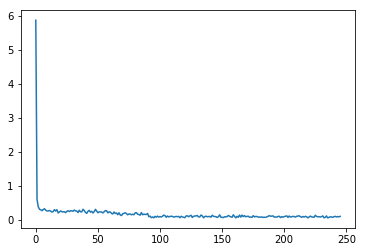

agent_value: 1.00144871411
input_value: 0.984145346471
output_value: 1.00038067142
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


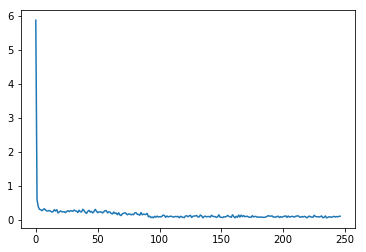

agent_value: 1.000012207
input_value: 0.999790002014
output_value: 0.999765796729
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


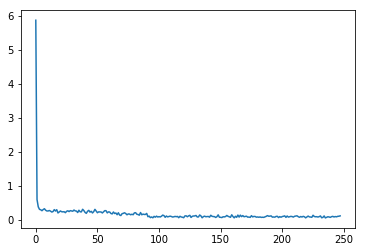

agent_value: 0.999973852156
input_value: 1.000114505
output_value: 1.00065449372
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


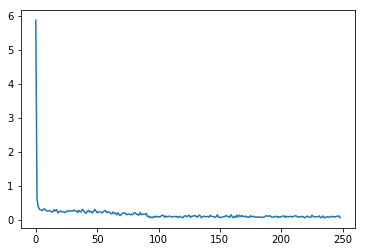

agent_value: 1.0001103609
input_value: 1.00058080312
output_value: 1.00071382772
mean diff: 0.07
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


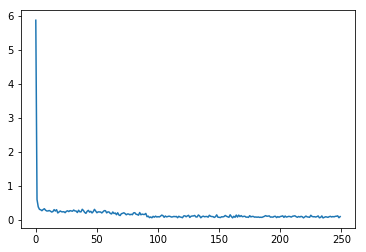

agent_value: 1.00049461511
input_value: 0.997641676458
output_value: 1.00058856119
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


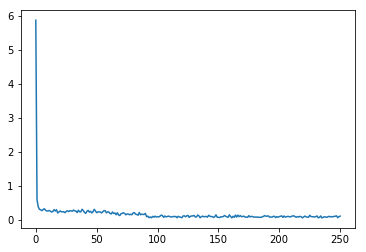

agent_value: 1.00020272552
input_value: 1.00162244932
output_value: 1.0012332559
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


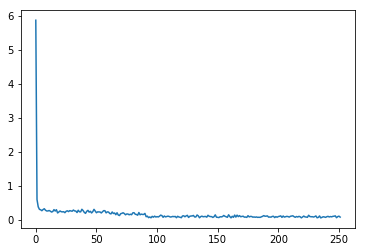

agent_value: 0.999770042974
input_value: 1.00091079256
output_value: 1.00007197075
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


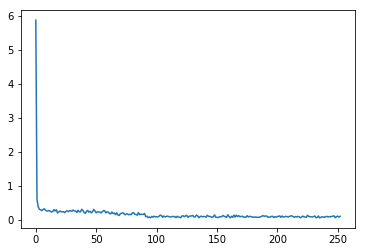

agent_value: 0.9999533953
input_value: 1.00058773772
output_value: 1.0006266138
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


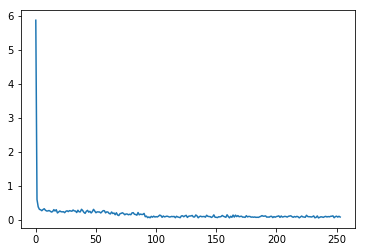

agent_value: 1.00033687341
input_value: 1.0004579203
output_value: 0.999319220548
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


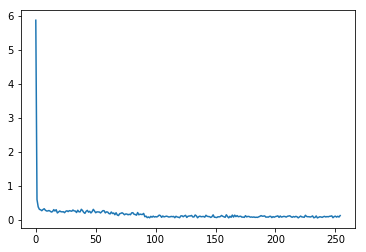

agent_value: 0.998932690299
input_value: 0.996888375872
output_value: 1.00120249673
mean diff: 0.132
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


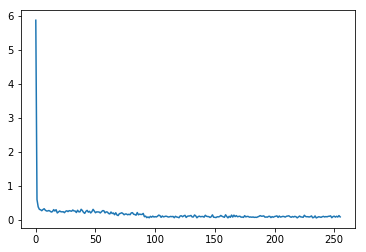

agent_value: 1.00081961921
input_value: 0.999376818846
output_value: 0.998784151167
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


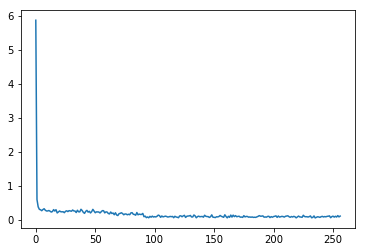

agent_value: 1.00003334449
input_value: 1.00013991649
output_value: 1.00017366021
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


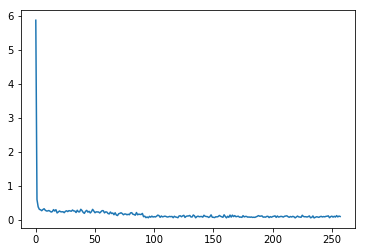

agent_value: 0.999784956613
input_value: 0.997027872364
output_value: 1.00002524448
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


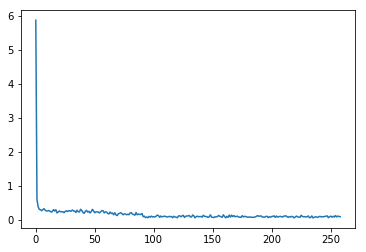

agent_value: 0.999918868713
input_value: 0.998879639302
output_value: 0.999904484743
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


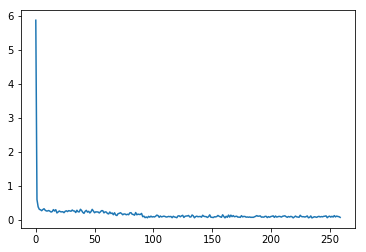

agent_value: 0.999010326769
input_value: 0.998976089022
output_value: 1.00214805519
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


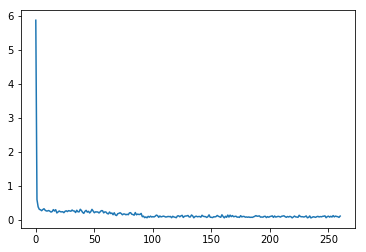

agent_value: 1.00007021231
input_value: 1.00002831685
output_value: 0.999535779121
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


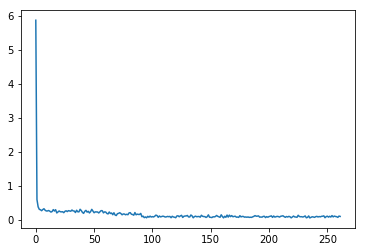

agent_value: 0.999993900231
input_value: 0.999922269182
output_value: 0.999717614469
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


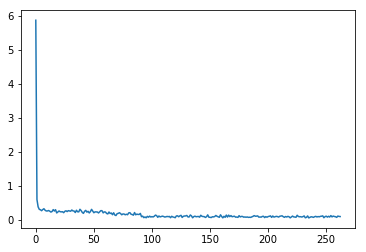

agent_value: 1.00017913721
input_value: 0.999021995336
output_value: 0.999898231903
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


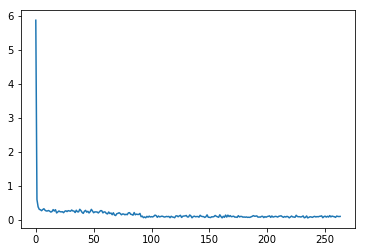

agent_value: 1.00005469257
input_value: 0.99980206334
output_value: 0.999814224037
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


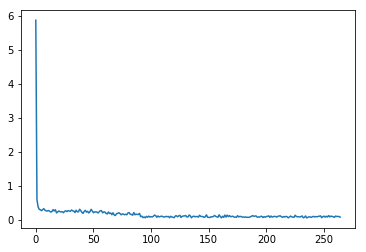

agent_value: 1.00020160936
input_value: 0.999843507008
output_value: 1.00015353006
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


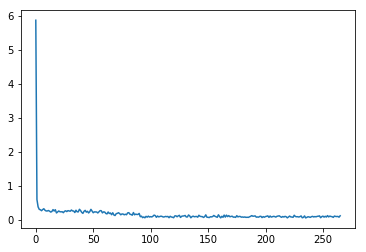

agent_value: 1.00009421543
input_value: 0.999710829005
output_value: 0.998641768633
mean diff: 0.126
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


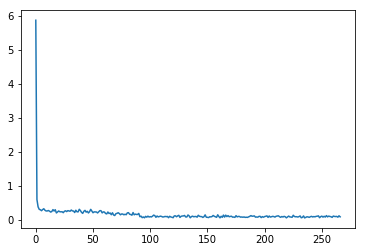

agent_value: 1.0002131028
input_value: 1.00222625832
output_value: 1.00246133131
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


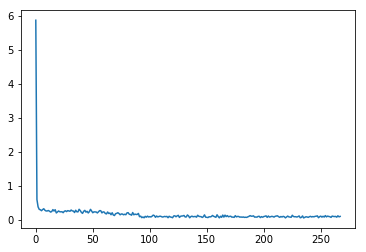

agent_value: 0.999963146154
input_value: 1.00165331581
output_value: 1.00064605899
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


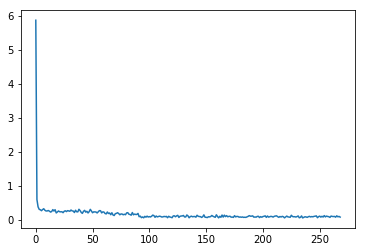

agent_value: 1.00015102735
input_value: 0.999695976626
output_value: 0.999752416367
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


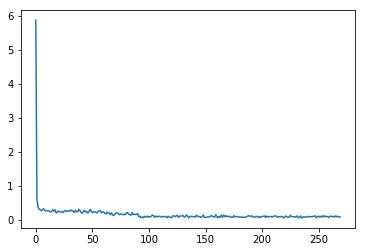

agent_value: 1.00003057092
input_value: 0.999439157126
output_value: 1.00003490898
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


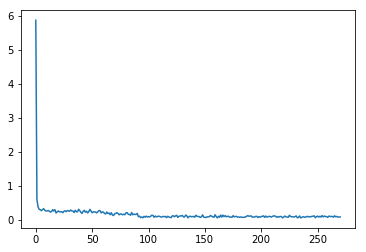

agent_value: 1.00022182894
input_value: 1.00004333791
output_value: 1.00006273045
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


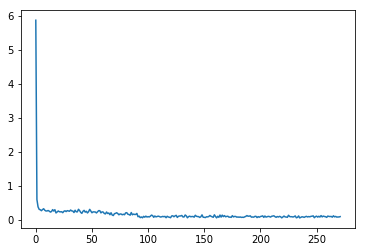

agent_value: 0.999878029662
input_value: 1.00051008592
output_value: 1.00074088077
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


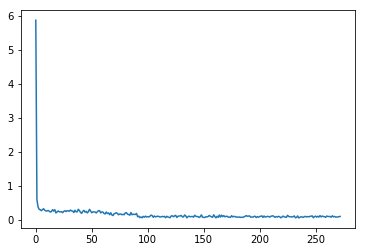

agent_value: 0.999771780134
input_value: 1.00081991936
output_value: 1.00057241733
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


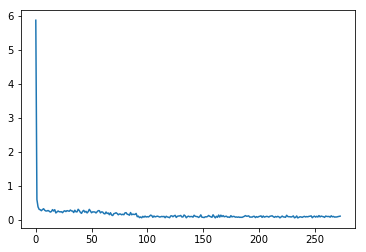

agent_value: 0.999933721005
input_value: 1.00002549099
output_value: 1.00006338172
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


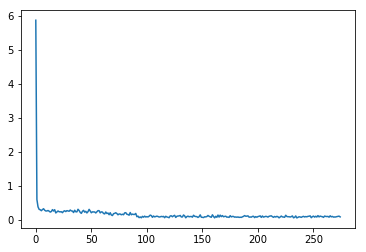

agent_value: 0.999777965708
input_value: 1.00383520488
output_value: 1.00264248752
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


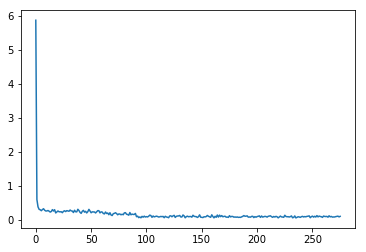

agent_value: 0.999884396974
input_value: 1.00040662462
output_value: 1.00034159805
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


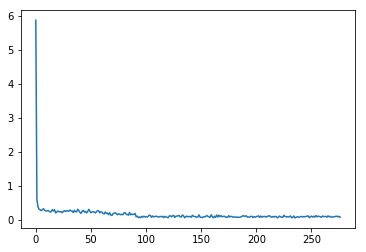

agent_value: 1.00006123393
input_value: 0.999112059573
output_value: 0.999935721722
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


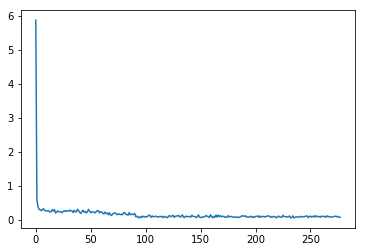

agent_value: 1.00003412953
input_value: 0.999801891705
output_value: 1.00059468815
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


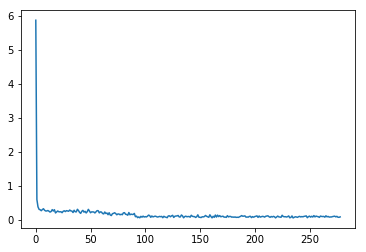

agent_value: 0.999994974206
input_value: 1.00011352351
output_value: 0.999998579836
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


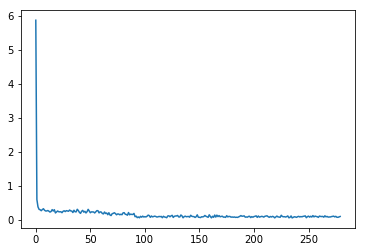

agent_value: 1.00014886084
input_value: 1.00098264443
output_value: 0.999691503561
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


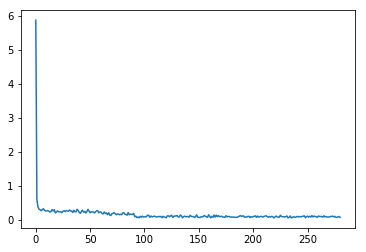

agent_value: 1.00001832916
input_value: 0.999453089534
output_value: 1.00023415539
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


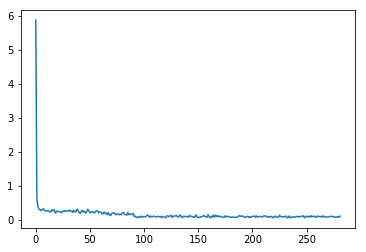

agent_value: 1.00124418719
input_value: 0.998189457045
output_value: 0.997948256251
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


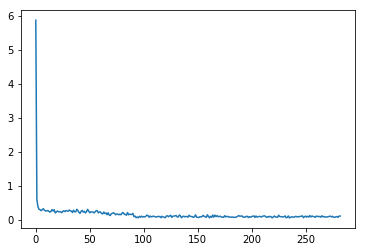

agent_value: 0.999640324882
input_value: 0.998937007381
output_value: 1.00026974848
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


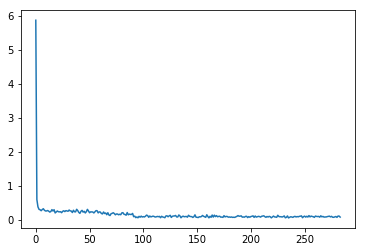

agent_value: 0.999561737597
input_value: 0.998088543915
output_value: 0.99972485875
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


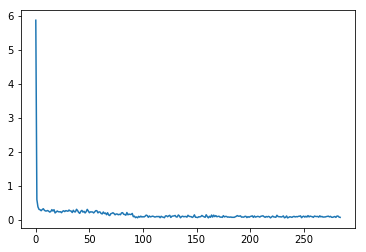

agent_value: 0.999810443643
input_value: 1.00003015207
output_value: 1.00006568359
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


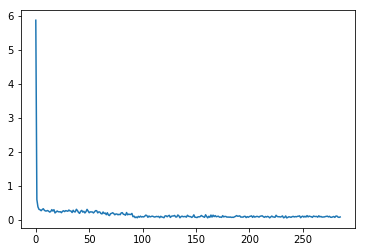

agent_value: 1.00086716793
input_value: 0.999609131593
output_value: 0.999488933508
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


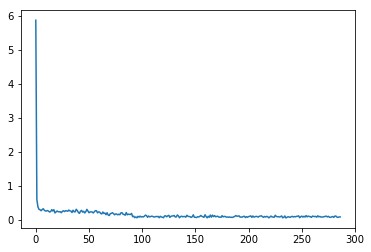

agent_value: 1.00026486103
input_value: 0.997865754118
output_value: 0.997888840318
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


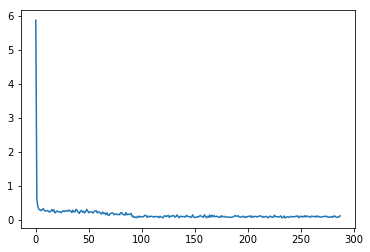

agent_value: 1.00010078522
input_value: 0.999993315245
output_value: 0.999501678605
mean diff: 0.126
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


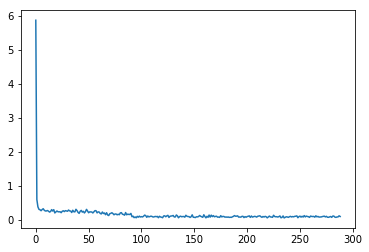

agent_value: 0.999509862337
input_value: 0.999630650205
output_value: 0.999995062021
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


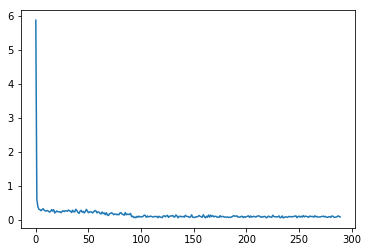

agent_value: 1.00000879171
input_value: 1.00074298305
output_value: 0.99930925076
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


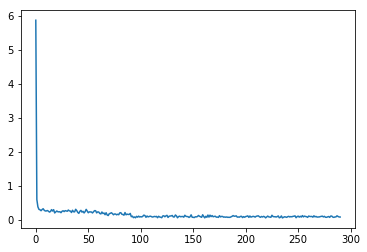

agent_value: 0.999895434404
input_value: 0.999634844116
output_value: 1.00002622776
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


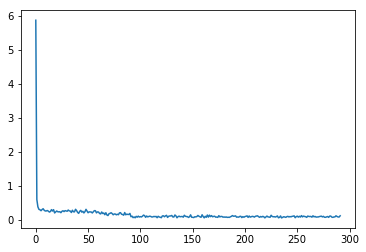

agent_value: 1.00051051481
input_value: 0.937089222834
output_value: 0.999320158775
mean diff: 0.126
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


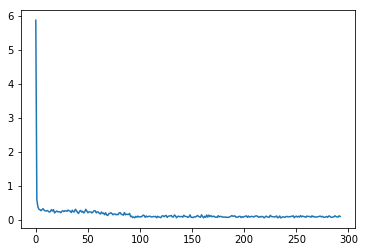

agent_value: 1.0002708953
input_value: 1.00023988688
output_value: 1.00023462576
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


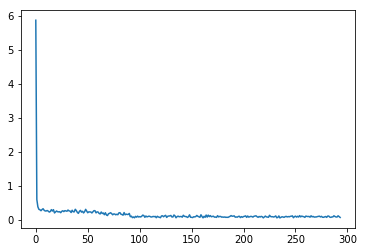

agent_value: 1.00124148959
input_value: 0.999682943996
output_value: 0.998951174377
mean diff: 0.078
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


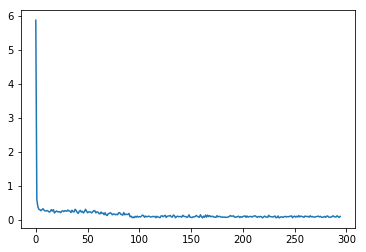

agent_value: 0.999779544187
input_value: 0.999717464676
output_value: 1.00048203522
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


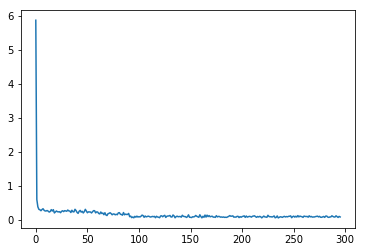

agent_value: 0.999886506573
input_value: 0.999175205316
output_value: 1.00024798201
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


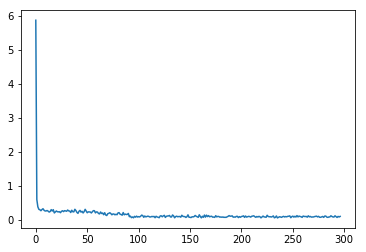

agent_value: 1.00003972322
input_value: 0.999515770953
output_value: 0.998989712528
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


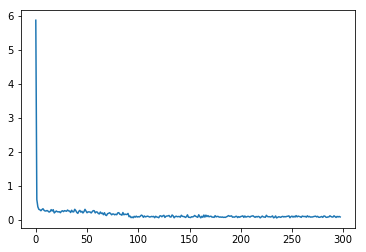

agent_value: 0.999675440895
input_value: 0.998999668326
output_value: 0.999653363909
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


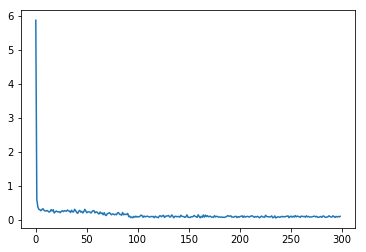

agent_value: 0.999713135874
input_value: 0.999869404116
output_value: 1.00025888755
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


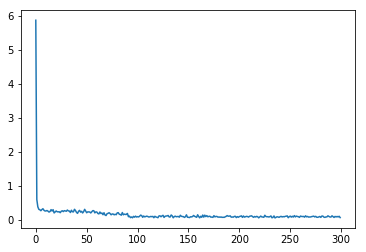

agent_value: 0.999999925314
input_value: 0.999547766519
output_value: 1.00035061357
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


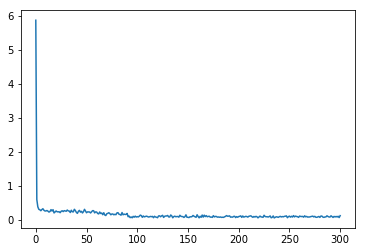

agent_value: 0.999939300564
input_value: 1.00020148014
output_value: 1.00079301189
mean diff: 0.13
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


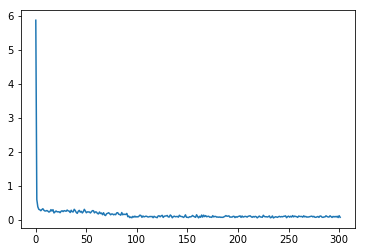

agent_value: 0.999885744943
input_value: 0.996362683433
output_value: 0.996048389282
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


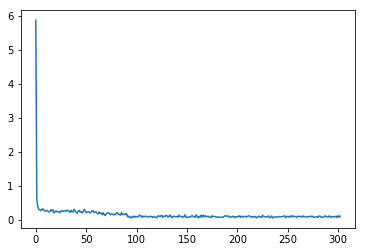

agent_value: 1.00141938516
input_value: 1.00068889092
output_value: 0.997409592486
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


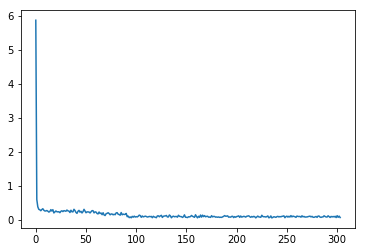

agent_value: 0.999961158521
input_value: 1.00044063142
output_value: 1.00027103437
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


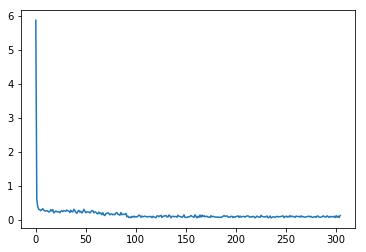

agent_value: 1.00104280632
input_value: 0.97697805124
output_value: 0.999492557961
mean diff: 0.138
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


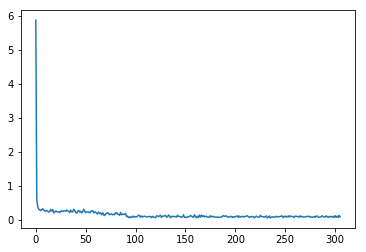

agent_value: 1.00051634632
input_value: 1.00051745773
output_value: 0.999673093099
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


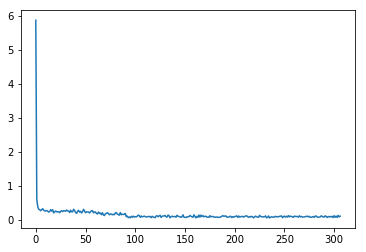

agent_value: 1.00002086912
input_value: 1.00086267607
output_value: 1.00022312271
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


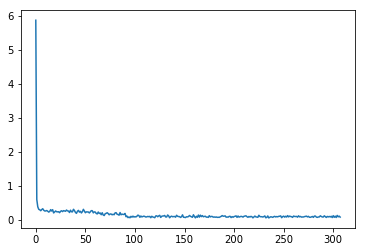

agent_value: 1.00002080941
input_value: 1.00109299775
output_value: 1.000186433
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


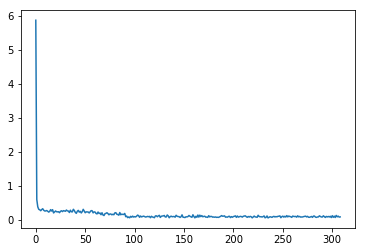

agent_value: 1.00005051701
input_value: 0.999984426871
output_value: 0.999911311663
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


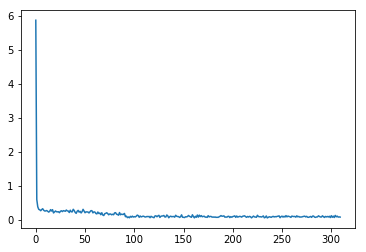

agent_value: 1.00000223294
input_value: 1.00013551923
output_value: 0.999896610536
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


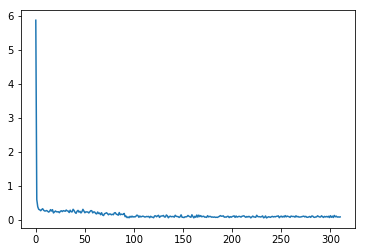

agent_value: 0.999815828773
input_value: 1.00007675063
output_value: 0.999598424677
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


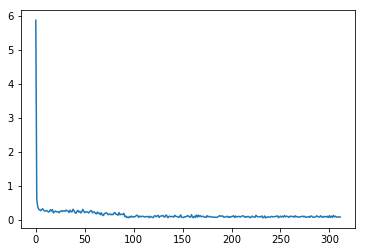

agent_value: 1.00110273546
input_value: 0.951010895942
output_value: 1.00056290391
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


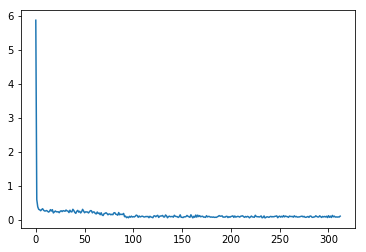

agent_value: 0.997087282504
input_value: 1.00077384836
output_value: 1.00046524845
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


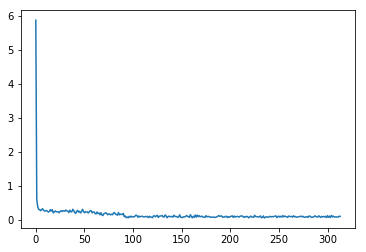

agent_value: 1.00226842663
input_value: 0.969325973254
output_value: 1.00075831246
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


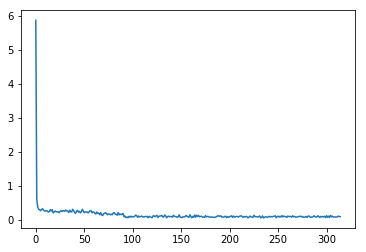

agent_value: 1.00037960936
input_value: 0.999447268537
output_value: 0.999817678446
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


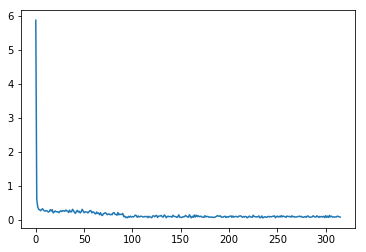

agent_value: 0.999965535885
input_value: 1.00039920317
output_value: 1.00001105154
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


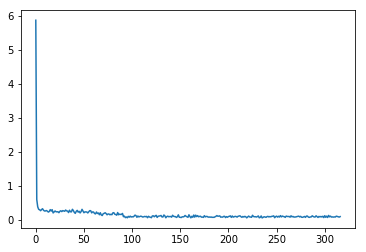

agent_value: 1.00013716923
input_value: 1.00028889291
output_value: 0.999857934993
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


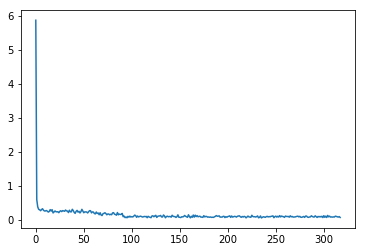

agent_value: 1.00068868341
input_value: 0.9997906794
output_value: 1.00004304789
mean diff: 0.078
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


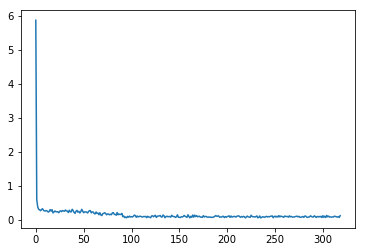

agent_value: 1.0003189365
input_value: 0.99932623736
output_value: 1.00068325403
mean diff: 0.13
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


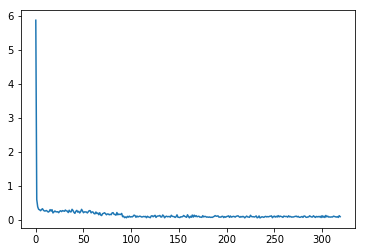

agent_value: 1.00004329421
input_value: 0.994930065376
output_value: 0.999776760672
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


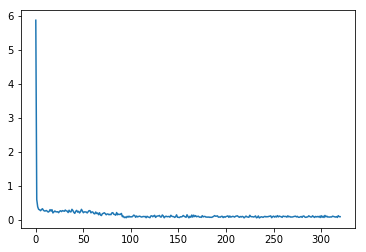

agent_value: 1.00012151806
input_value: 0.999980072678
output_value: 1.00001367557
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


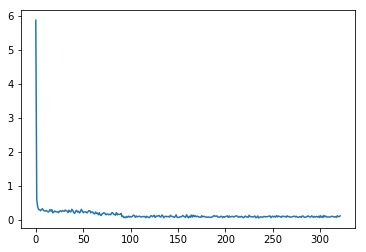

agent_value: 1.00003161283
input_value: 1.00082748414
output_value: 1.0003426665
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


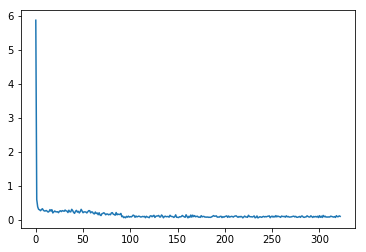

agent_value: 1.00022360709
input_value: 0.998883362938
output_value: 0.99986568827
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


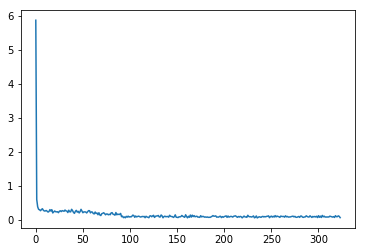

agent_value: 1.00002418525
input_value: 0.999874244523
output_value: 1.00015382574
mean diff: 0.072
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


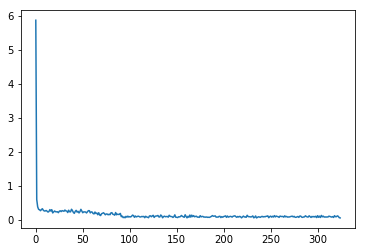

agent_value: 1.00019366389
input_value: 0.998158062885
output_value: 0.99973566925
mean diff: 0.064
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


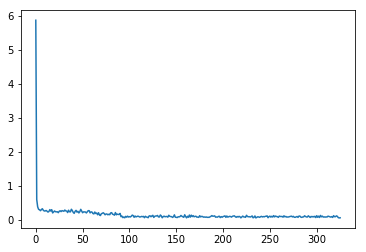

agent_value: 0.999613573919
input_value: 1.00135112364
output_value: 1.00159185852
mean diff: 0.068
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


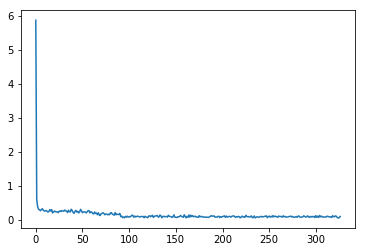

agent_value: 0.99950362047
input_value: 1.00173421464
output_value: 1.0003765878
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


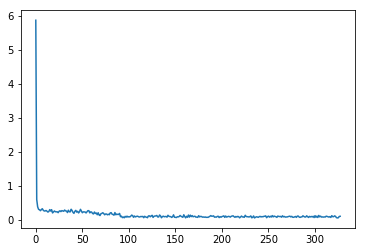

agent_value: 0.999916390505
input_value: 1.00027488027
output_value: 1.00044113109
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


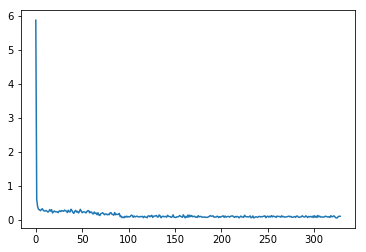

agent_value: 0.998859472903
input_value: 1.00166633378
output_value: 1.00168621032
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


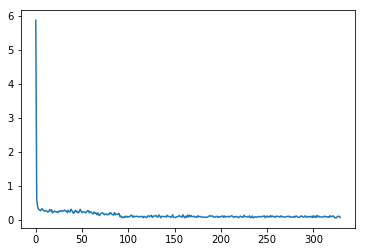

agent_value: 1.00012887519
input_value: 0.996344937453
output_value: 0.997121226867
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


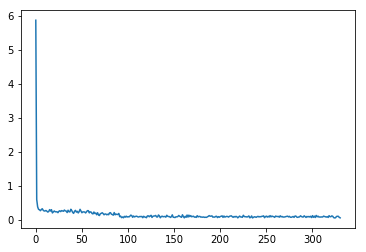

agent_value: 0.999817479182
input_value: 1.00044386413
output_value: 1.0006833229
mean diff: 0.066
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


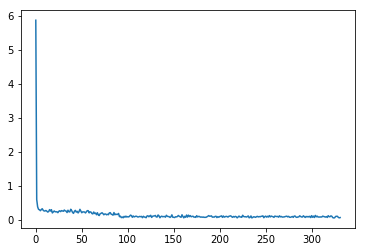

agent_value: 1.00010893335
input_value: 1.00016426121
output_value: 1.00106815272
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


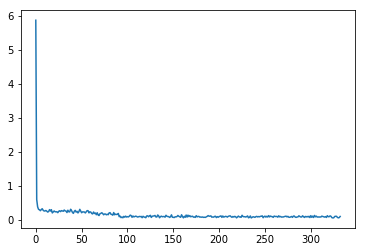

agent_value: 0.99961087692
input_value: 1.00011015093
output_value: 1.00058469056
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


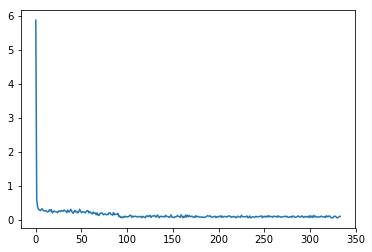

agent_value: 0.99998062718
input_value: 1.00060782049
output_value: 1.00054109238
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


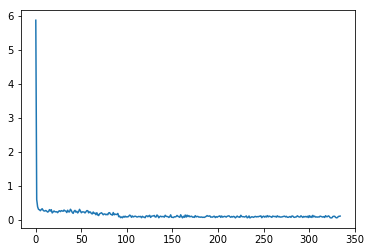

agent_value: 0.999655355689
input_value: 0.999733235818
output_value: 0.998153436583
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


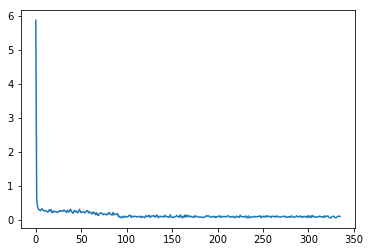

agent_value: 1.0002544619
input_value: 0.995902026315
output_value: 0.99667860788
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


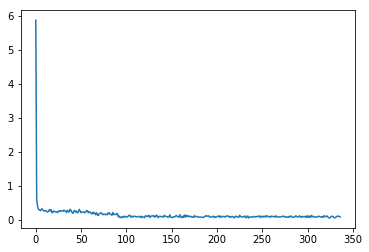

agent_value: 1.00022844228
input_value: 1.0001930723
output_value: 1.00031137031
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


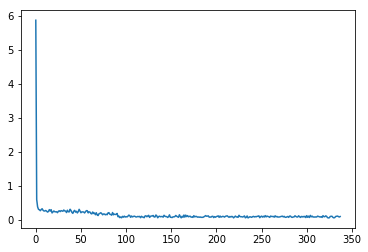

agent_value: 1.00039656296
input_value: 1.00015559907
output_value: 1.00038622829
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


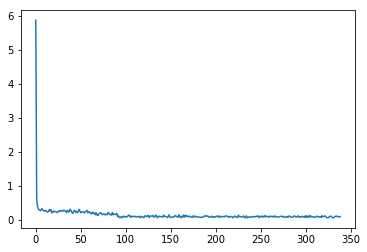

agent_value: 1.00011875912
input_value: 1.0000354813
output_value: 1.00026696
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


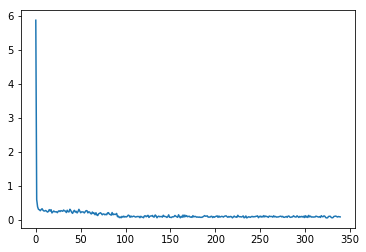

agent_value: 0.999723241811
input_value: 1.00032704203
output_value: 1.00034079672
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


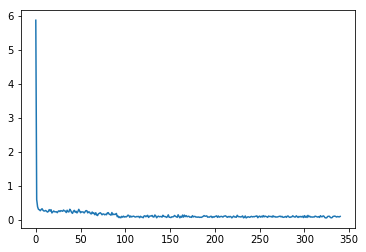

agent_value: 1.00002541166
input_value: 0.999601531967
output_value: 1.00024368854
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


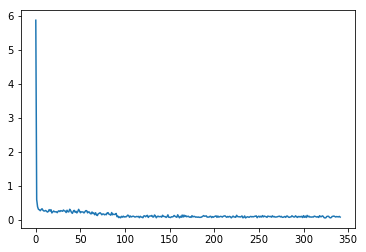

agent_value: 0.999602204707
input_value: 0.99915997205
output_value: 0.999821844434
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


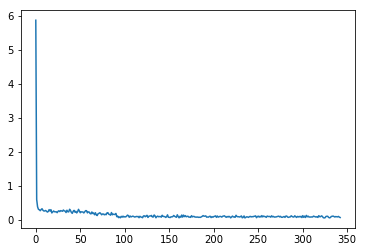

agent_value: 1.00031991048
input_value: 0.99894985148
output_value: 0.999257896536
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


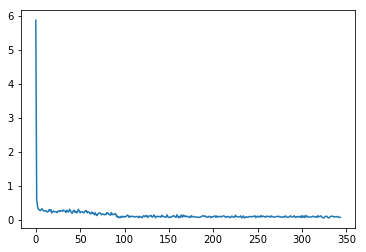

agent_value: 0.999937965046
input_value: 1.00046836498
output_value: 1.00055944936
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


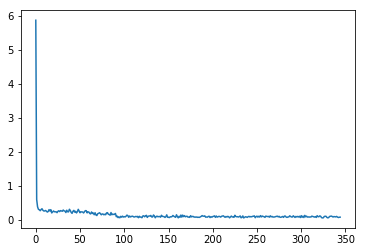

agent_value: 0.999741993185
input_value: 1.00020219946
output_value: 1.00049387485
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


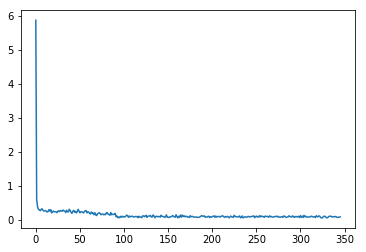

agent_value: 0.999951884015
input_value: 1.00020038136
output_value: 1.00001637525
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


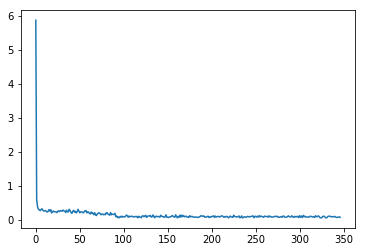

agent_value: 0.999994020716
input_value: 1.0000666449
output_value: 1.00026361428
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


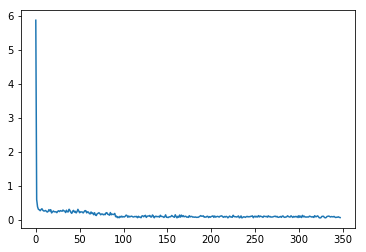

agent_value: 0.999789998448
input_value: 1.00053570115
output_value: 1.00046418434
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


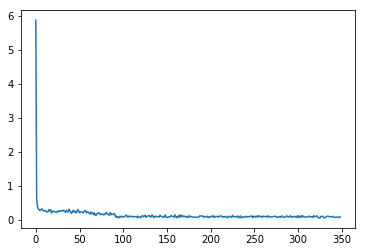

agent_value: 1.00004711573
input_value: 0.99902473178
output_value: 0.99962181686
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


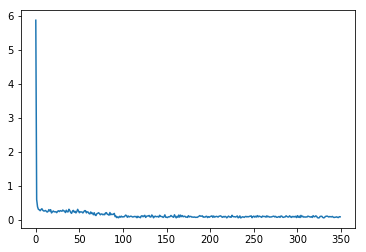

agent_value: 0.998994295468
input_value: 1.00098825904
output_value: 0.998619024769
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


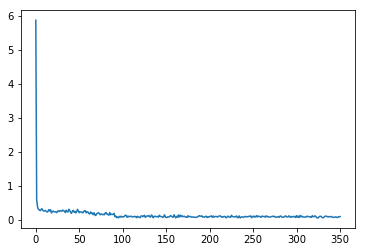

agent_value: 0.999899613056
input_value: 0.9995173844
output_value: 0.999791122108
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


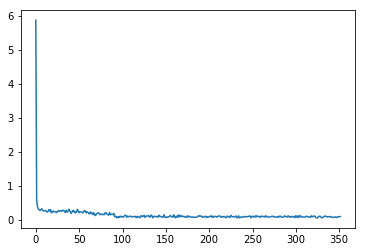

agent_value: 1.00006103107
input_value: 0.999856539365
output_value: 0.999795431936
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


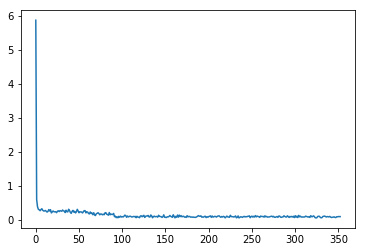

agent_value: 0.999953082112
input_value: 0.999927288396
output_value: 1.00000124799
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


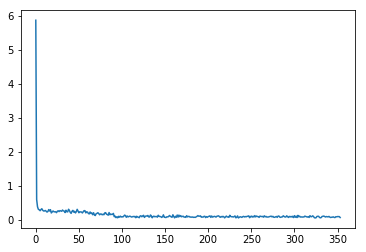

agent_value: 0.999716665873
input_value: 0.999268332069
output_value: 0.999247574922
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


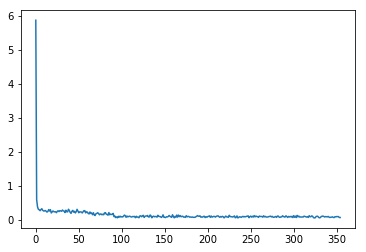

agent_value: 0.999843302341
input_value: 1.00010926006
output_value: 0.999789884232
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


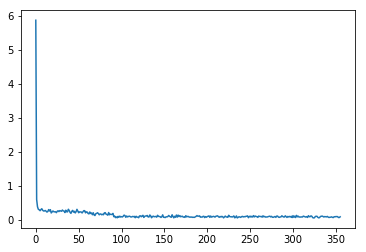

agent_value: 0.999984926235
input_value: 0.999781183012
output_value: 1.00029186646
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


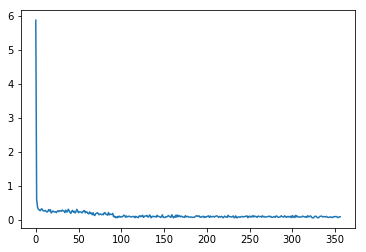

agent_value: 0.999901105734
input_value: 1.00019382667
output_value: 1.00015362573
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


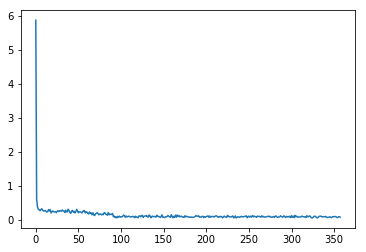

agent_value: 1.00005370865
input_value: 1.0001707158
output_value: 1.00072034552
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


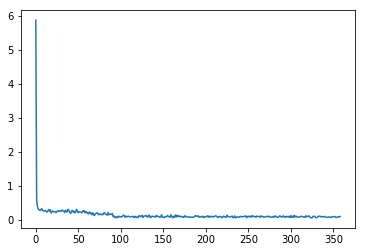

agent_value: 0.999735728127
input_value: 0.982908262958
output_value: 1.00161856068
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


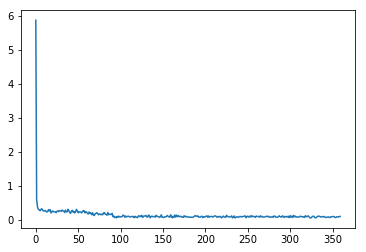

agent_value: 0.999802047752
input_value: 1.00065176795
output_value: 1.00044402532
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


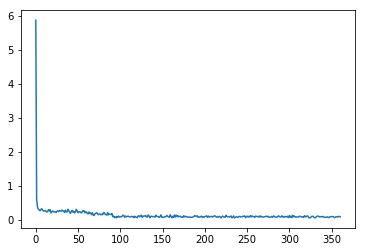

agent_value: 0.999825295939
input_value: 0.999736336877
output_value: 0.999958005609
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


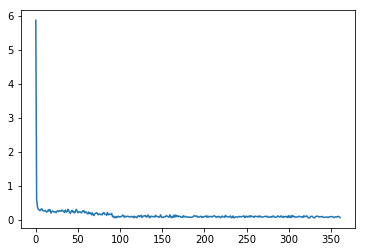

agent_value: 1.00000442371
input_value: 1.00351177432
output_value: 1.00222428357
mean diff: 0.07
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


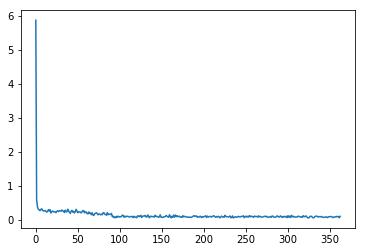

agent_value: 1.00009485756
input_value: 1.00037956969
output_value: 1.00012064865
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


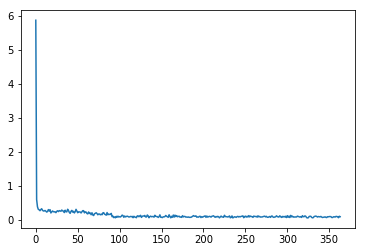

agent_value: 0.999827633776
input_value: 0.999375270481
output_value: 1.00088420848
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


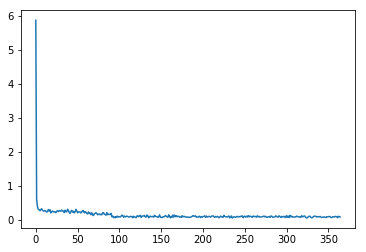

agent_value: 1.00011323367
input_value: 0.999301663949
output_value: 0.999934341479
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


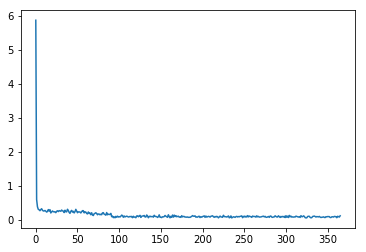

agent_value: 1.00001812475
input_value: 1.00307489617
output_value: 1.00263419159
mean diff: 0.126
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


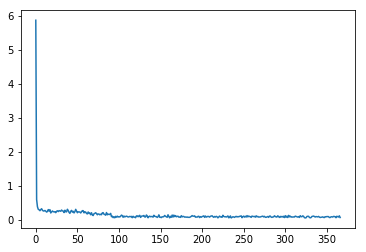

agent_value: 0.999878558141
input_value: 1.00015216395
output_value: 1.00037180811
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


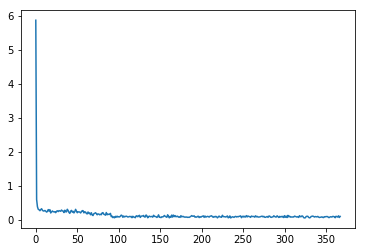

agent_value: 0.999789068579
input_value: 1.00032261812
output_value: 1.00016429672
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


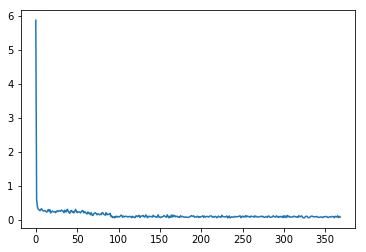

agent_value: 0.999955578837
input_value: 0.999644425819
output_value: 0.999729536516
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


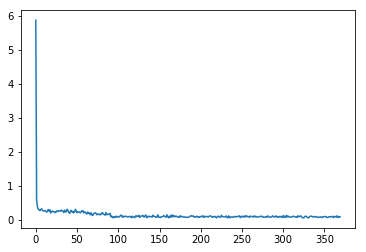

agent_value: 0.99993139247
input_value: 1.00147729707
output_value: 1.00011494602
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


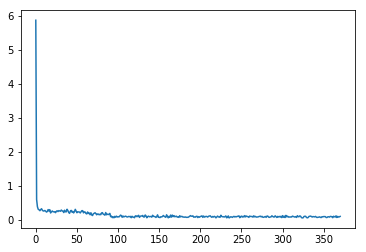

agent_value: 0.999881938912
input_value: 0.99918955302
output_value: 1.00097258357
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


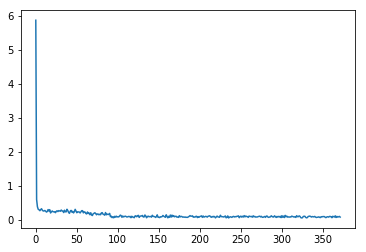

agent_value: 1.00039750874
input_value: 0.992728638163
output_value: 1.00071329744
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


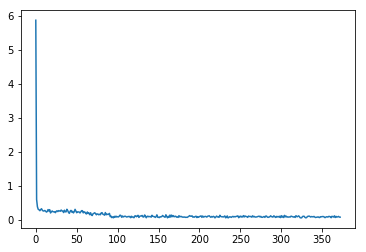

agent_value: 0.99980677502
input_value: 0.998084675177
output_value: 0.999189894827
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


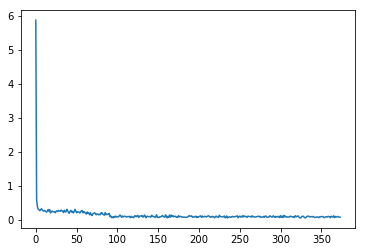

agent_value: 0.999566597334
input_value: 1.00018976525
output_value: 0.999956634668
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


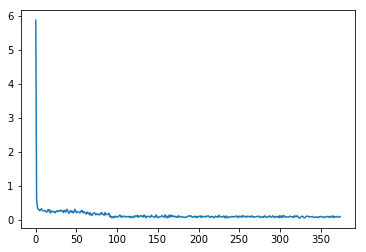

agent_value: 1.00000696974
input_value: 0.999721412526
output_value: 0.999889635837
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


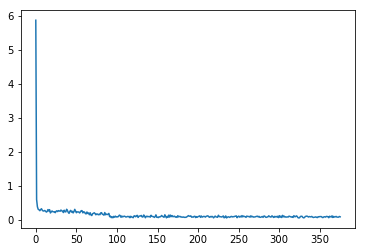

agent_value: 0.999932869821
input_value: 1.00013491057
output_value: 1.00054772813
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


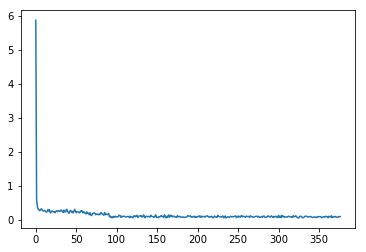

agent_value: 0.999792981668
input_value: 0.999806604621
output_value: 1.00041202234
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


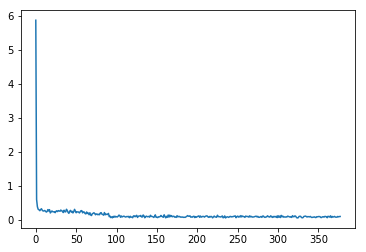

agent_value: 1.00000097062
input_value: 0.999972943682
output_value: 0.999886901106
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


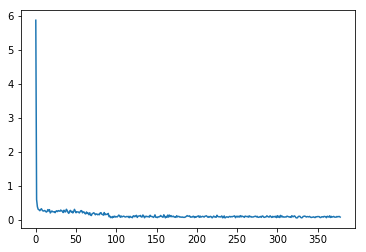

agent_value: 1.00000929136
input_value: 0.999873560668
output_value: 1.00005923393
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


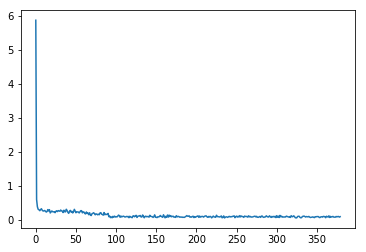

agent_value: 0.999954683391
input_value: 1.00033375416
output_value: 0.999690559261
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


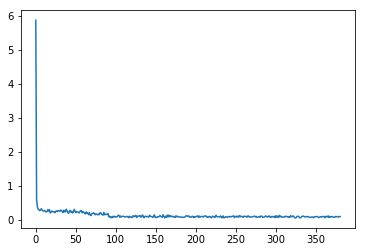

agent_value: 1.00015518197
input_value: 0.999719055111
output_value: 1.00003318533
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


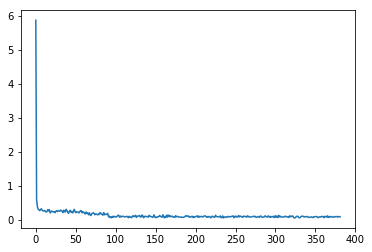

agent_value: 0.999926700769
input_value: 0.999886761781
output_value: 0.999781877509
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


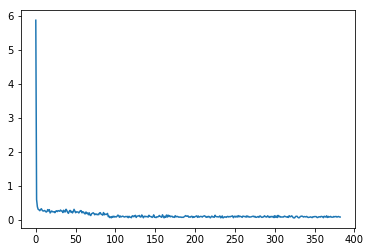

agent_value: 1.00062537543
input_value: 1.00166317123
output_value: 1.00125055562
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


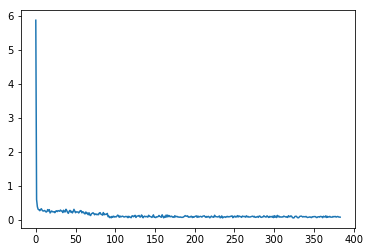

agent_value: 1.00020042538
input_value: 0.995128026638
output_value: 1.00053873528
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


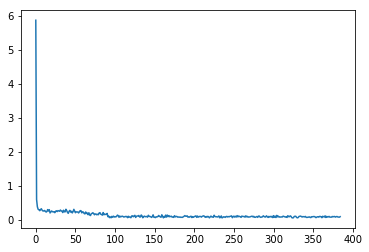

agent_value: 1.00010412397
input_value: 0.999909081621
output_value: 1.00003464953
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


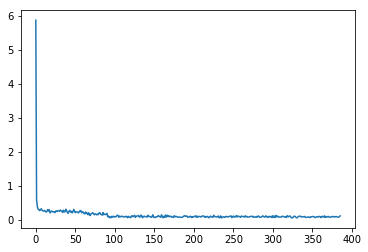

agent_value: 0.999520068999
input_value: 0.999451974125
output_value: 0.999502661022
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


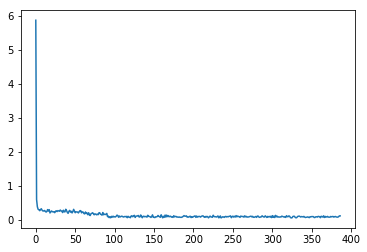

agent_value: 0.999962744342
input_value: 0.998900150671
output_value: 1.00014450472
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


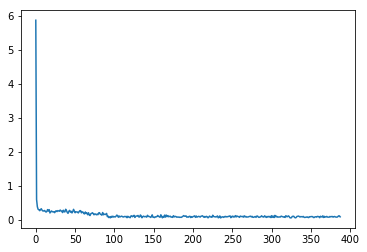

agent_value: 1.00003653439
input_value: 1.00037367522
output_value: 1.00012822111
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


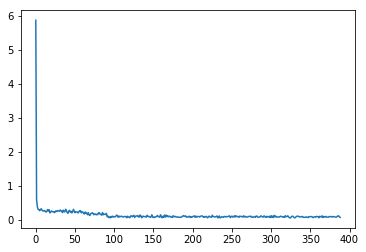

agent_value: 0.999847400821
input_value: 1.00232577151
output_value: 1.00204894679
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


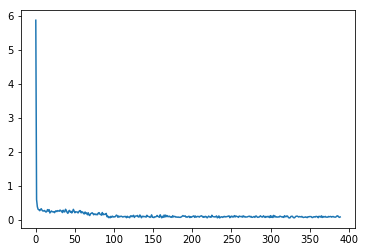

agent_value: 1.00002347528
input_value: 0.99992917587
output_value: 1.00015643603
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


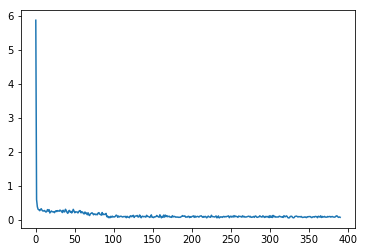

agent_value: 1.0000813055
input_value: 0.998804790511
output_value: 0.999483727604
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


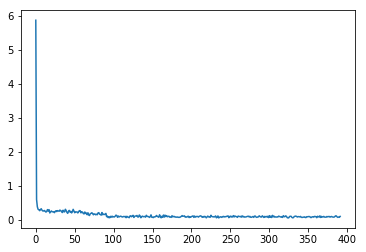

agent_value: 0.999956395823
input_value: 1.00062844287
output_value: 1.00025920299
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


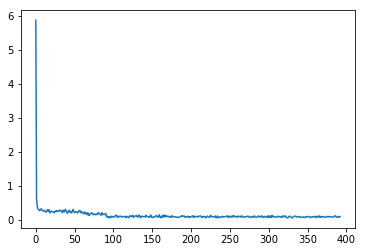

agent_value: 1.00017980467
input_value: 0.990471432624
output_value: 1.00088543345
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


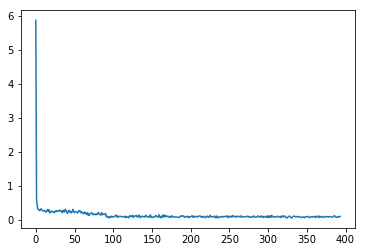

agent_value: 1.00099257476
input_value: 1.00154081948
output_value: 0.999279274658
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


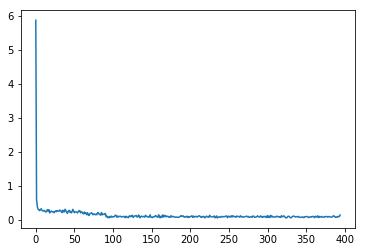

agent_value: 1.00063402679
input_value: 0.998820437588
output_value: 1.00134818504
mean diff: 0.148
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


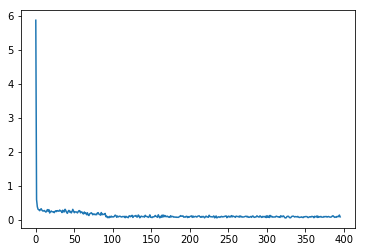

agent_value: 0.999735267421
input_value: 0.998253494845
output_value: 1.00020048489
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


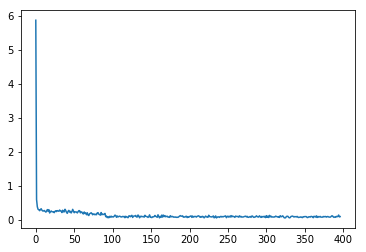

agent_value: 1.00031408932
input_value: 0.998702295793
output_value: 1.00035549266
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


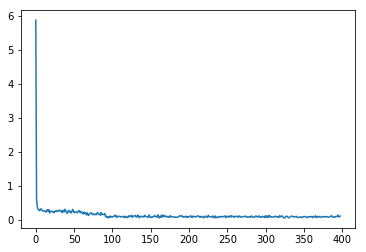

agent_value: 0.998885902907
input_value: 0.997214305578
output_value: 0.997163620996
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


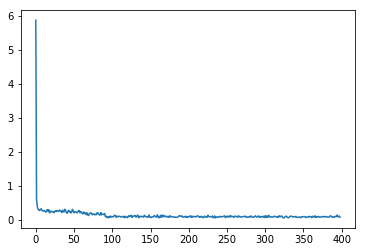

agent_value: 1.00003325593
input_value: 1.00049985662
output_value: 0.999765843288
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


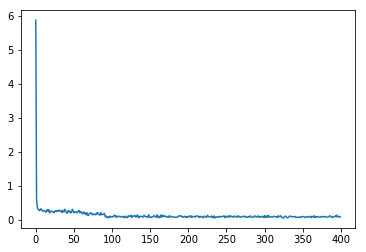

agent_value: 0.998702351467
input_value: 1.00079039962
output_value: 1.00112662327
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


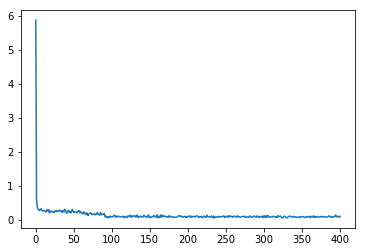

agent_value: 0.999844109801
input_value: 0.999658579795
output_value: 1.00007289492
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


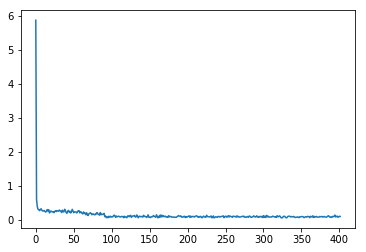

agent_value: 1.00003770241
input_value: 0.998105514197
output_value: 0.999899630446
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


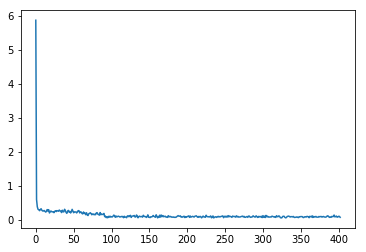

agent_value: 0.999580011315
input_value: 0.998348327992
output_value: 0.999604810602
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


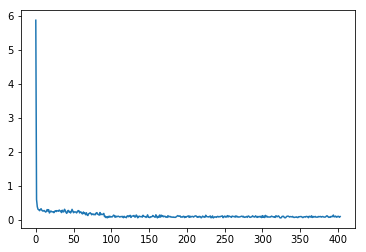

agent_value: 1.0003437793
input_value: 0.999841057017
output_value: 0.999007525943
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


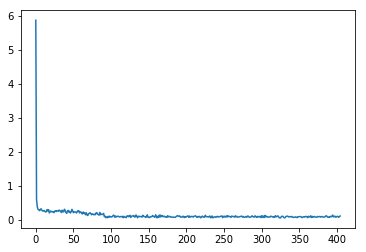

agent_value: 0.999895228732
input_value: 0.999495631032
output_value: 1.00014288674
mean diff: 0.12
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


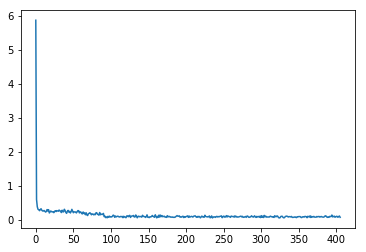

agent_value: 1.00006127297
input_value: 1.00009863278
output_value: 1.00029645916
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


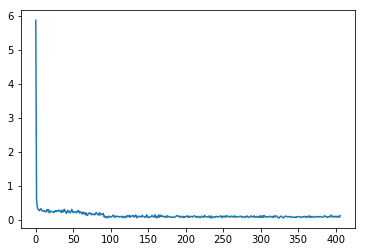

agent_value: 0.999965628197
input_value: 0.999745977299
output_value: 0.999984658761
mean diff: 0.128
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


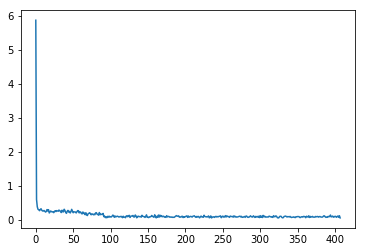

agent_value: 1.00016668843
input_value: 0.998732618254
output_value: 0.999891914302
mean diff: 0.064
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


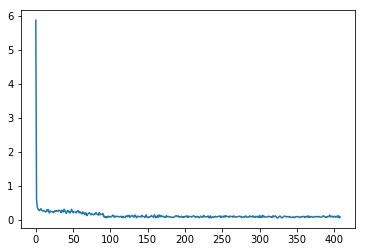

agent_value: 0.999974654025
input_value: 0.998368509291
output_value: 0.999846471804
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


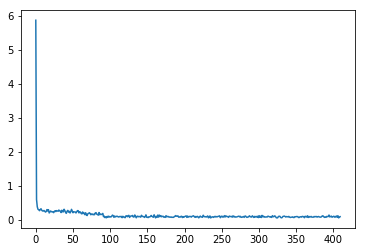

agent_value: 1.0005688585
input_value: 1.00064040479
output_value: 1.00016907985
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


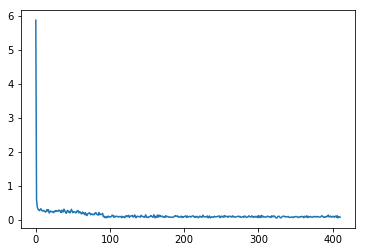

agent_value: 0.99978217931
input_value: 0.999685086401
output_value: 0.999506307393
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


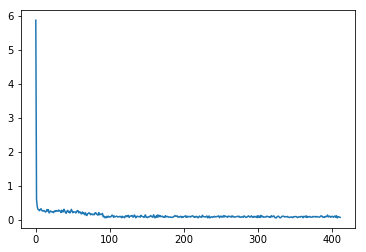

agent_value: 1.00035719532
input_value: 0.99967873825
output_value: 0.999566164302
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


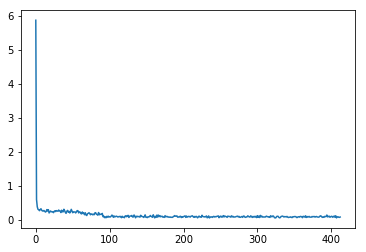

agent_value: 0.999902592284
input_value: 1.00072980549
output_value: 1.0007858161
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


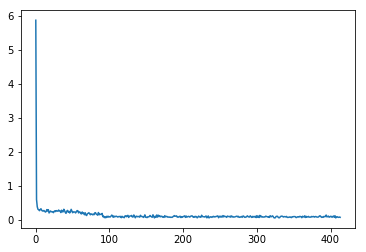

agent_value: 0.999008084001
input_value: 0.999965425186
output_value: 0.999954143829
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


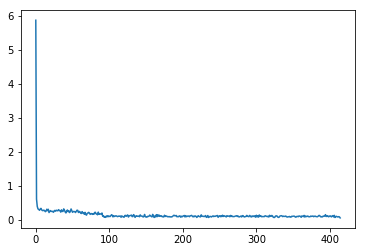

agent_value: 1.0000388382
input_value: 1.000248237
output_value: 1.00004910457
mean diff: 0.052
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


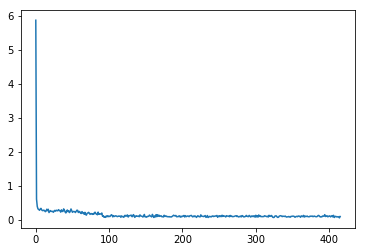

agent_value: 0.999985258244
input_value: 1.00024448592
output_value: 0.999737374305
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


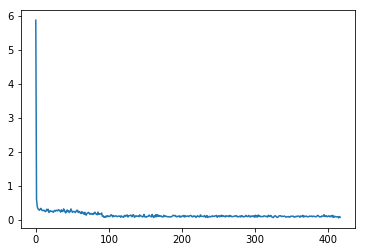

agent_value: 1.00023913682
input_value: 1.00042455757
output_value: 0.99994539682
mean diff: 0.072
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


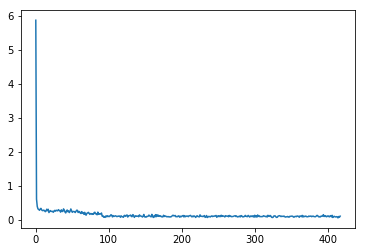

agent_value: 0.999959378667
input_value: 1.00004472252
output_value: 1.00001872842
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


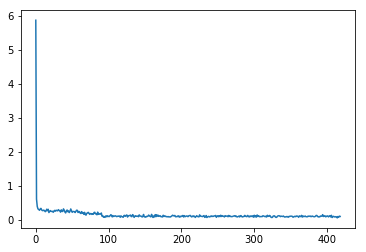

agent_value: 0.999866735699
input_value: 0.999472919033
output_value: 1.00000439075
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


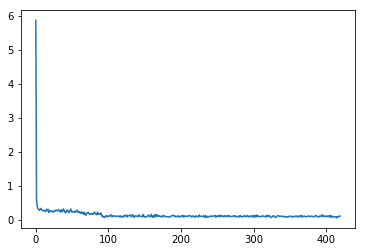

agent_value: 0.999536166866
input_value: 0.99985950185
output_value: 1.00026366769
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


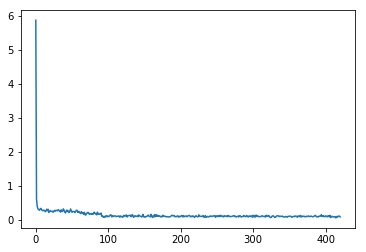

agent_value: 0.999740118048
input_value: 1.00027901241
output_value: 1.00034099678
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


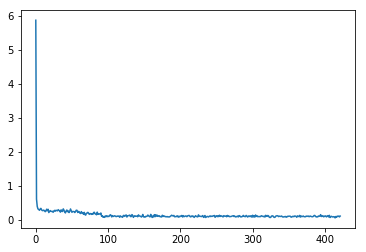

agent_value: 1.00001389756
input_value: 0.999898383293
output_value: 0.999924725576
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


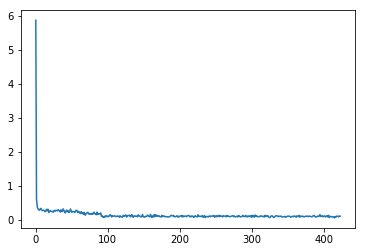

agent_value: 1.00111117885
input_value: 1.0033098277
output_value: 1.00193805423
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


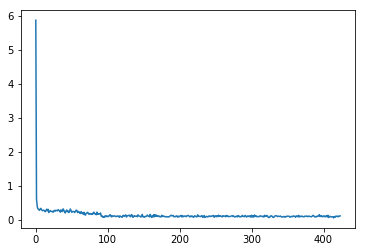

agent_value: 0.998717141399
input_value: 1.00129740616
output_value: 1.0001029197
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


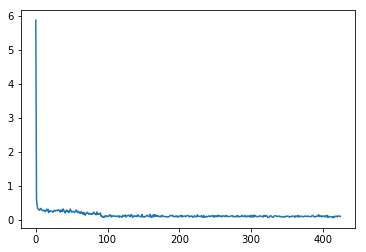

agent_value: 1.00003284833
input_value: 0.999813536571
output_value: 1.00005526686
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


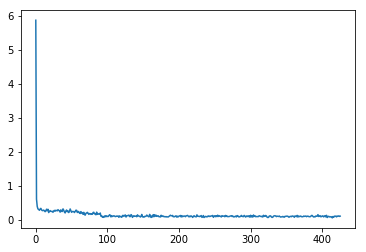

agent_value: 0.999896301112
input_value: 1.00012215664
output_value: 0.999951894763
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


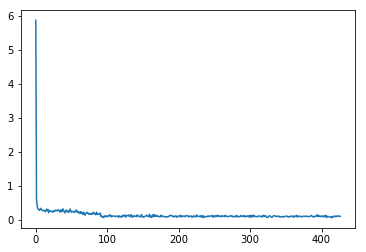

agent_value: 1.00010360161
input_value: 0.999880963866
output_value: 1.00003866806
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


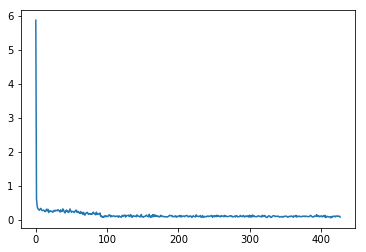

agent_value: 0.999822030621
input_value: 1.00027649953
output_value: 1.00018265578
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


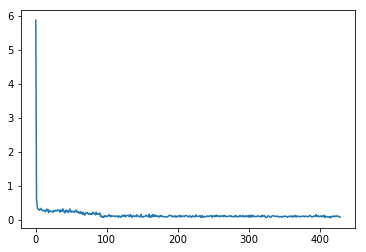

agent_value: 1.0002264298
input_value: 1.00062521185
output_value: 1.00048906032
mean diff: 0.078
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


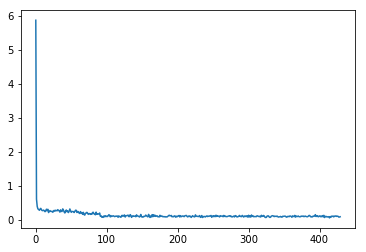

agent_value: 0.999985837554
input_value: 1.00005762543
output_value: 0.999826628655
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


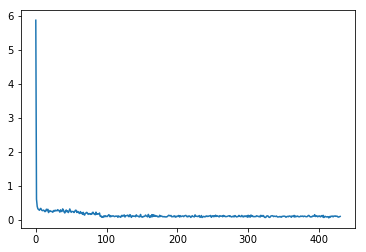

agent_value: 0.999925725562
input_value: 0.999506637362
output_value: 0.999232933724
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


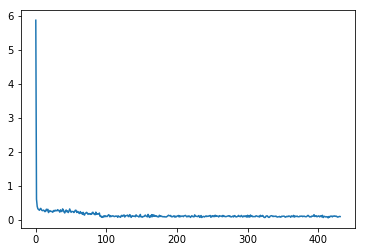

agent_value: 1.00013675663
input_value: 1.00047379845
output_value: 1.00043037699
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


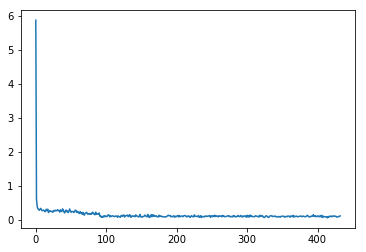

agent_value: 1.00008635692
input_value: 1.00126656491
output_value: 1.00096755277
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


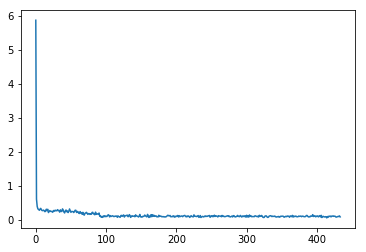

agent_value: 1.00001974296
input_value: 1.00009369707
output_value: 1.00003152321
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


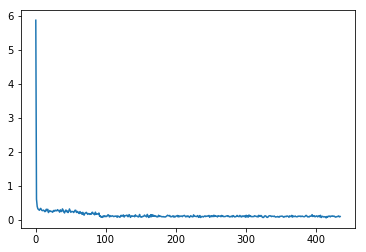

agent_value: 0.999217761074
input_value: 0.999641534979
output_value: 1.00062708807
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


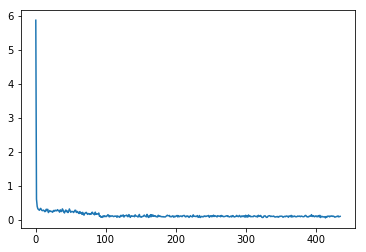

agent_value: 0.999697567869
input_value: 1.00084125664
output_value: 1.00098286837
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


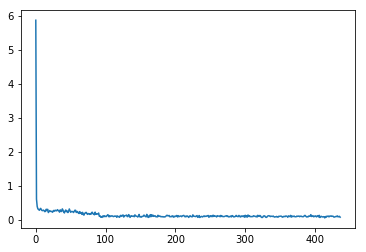

agent_value: 1.00017150546
input_value: 0.999549608885
output_value: 1.00090019943
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


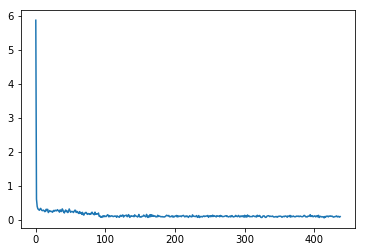

agent_value: 0.999734856032
input_value: 1.00015930406
output_value: 0.999980815577
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


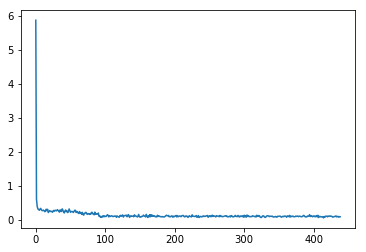

agent_value: 1.0001786286
input_value: 0.998052357135
output_value: 1.00005347806
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


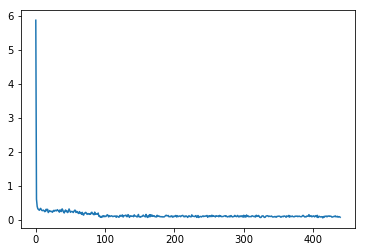

agent_value: 0.999649670423
input_value: 1.0003113576
output_value: 1.00047812597
mean diff: 0.072
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


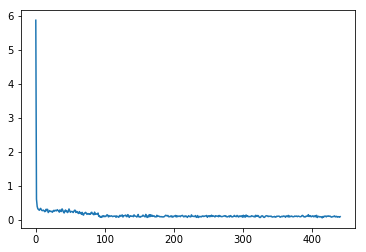

agent_value: 0.999990794032
input_value: 1.00028032189
output_value: 0.999860869084
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


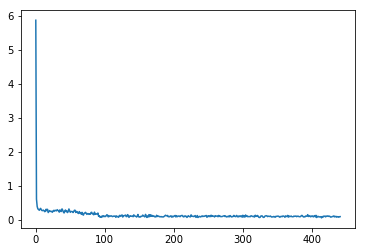

agent_value: 0.999949907383
input_value: 0.999618240487
output_value: 1.00010205741
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


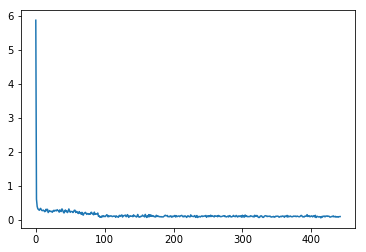

agent_value: 1.00001640643
input_value: 1.00020022543
output_value: 1.00024296757
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


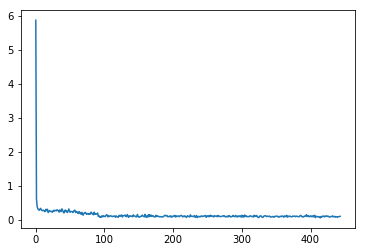

agent_value: 1.00003282767
input_value: 1.00099959099
output_value: 1.00060521649
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


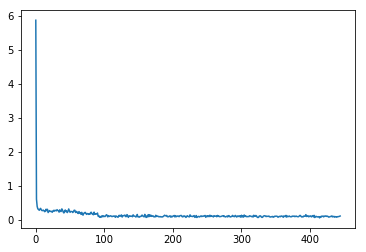

agent_value: 1.00021074939
input_value: 1.00002893825
output_value: 1.0004767964
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


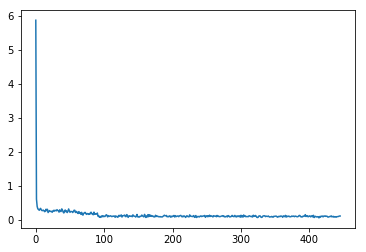

agent_value: 0.999969972209
input_value: 1.00038216137
output_value: 1.00010250149
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


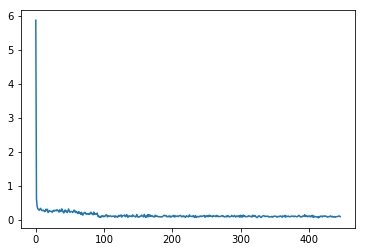

agent_value: 1.00018146629
input_value: 0.99959276287
output_value: 1.00009355503
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


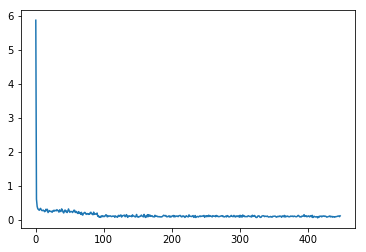

agent_value: 0.999834805877
input_value: 1.00026793671
output_value: 1.00049541786
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


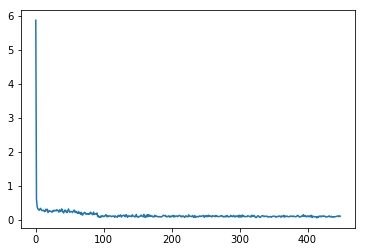

agent_value: 1.00001436941
input_value: 0.999891795519
output_value: 0.999902879799
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


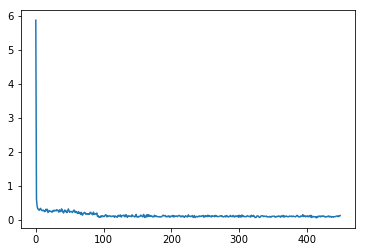

agent_value: 1.00017224985
input_value: 1.00066031631
output_value: 0.999943735594
mean diff: 0.122
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


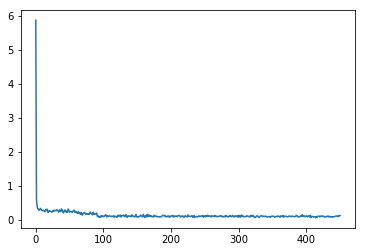

agent_value: 1.00014418488
input_value: 0.999642914093
output_value: 1.00010659691
mean diff: 0.12
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


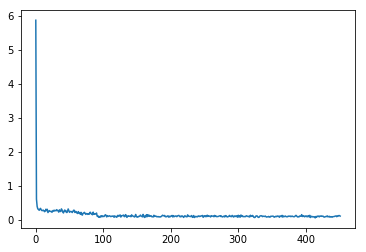

agent_value: 0.999951025057
input_value: 1.00889262773
output_value: 1.00105613888
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


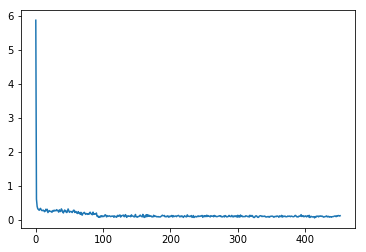

agent_value: 0.999959031039
input_value: 0.999752331367
output_value: 0.999797958386
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


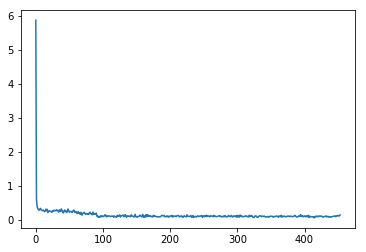

agent_value: 0.99947214769
input_value: 1.00055942242
output_value: 1.00086033337
mean diff: 0.14
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


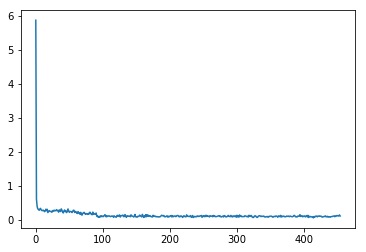

agent_value: 1.00019826451
input_value: 0.999924730595
output_value: 1.000410343
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


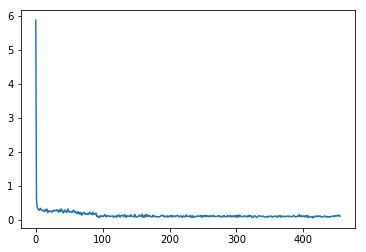

agent_value: 0.999514148164
input_value: 0.999987116171
output_value: 1.00042145812
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


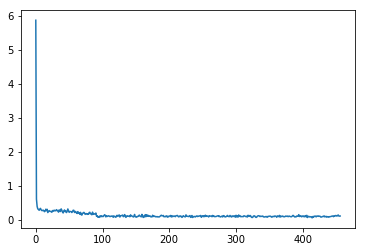

agent_value: 0.999872196442
input_value: 0.998654619459
output_value: 0.999609464578
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


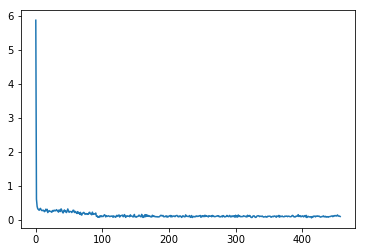

agent_value: 1.00000704909
input_value: 1.00024980215
output_value: 0.999835224405
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


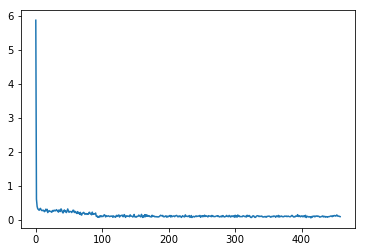

agent_value: 1.00005352457
input_value: 0.999813943884
output_value: 0.999525545837
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


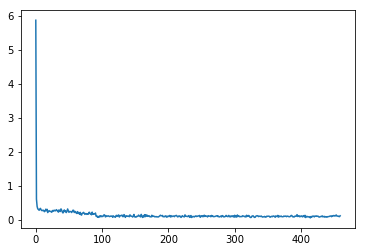

agent_value: 1.00182636615
input_value: 0.998941486042
output_value: 1.00162156513
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


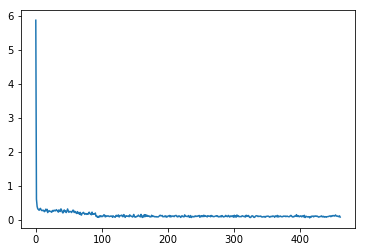

agent_value: 0.999878882171
input_value: 1.00018412857
output_value: 0.999975929796
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


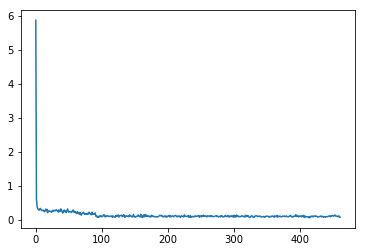

agent_value: 0.999980417292
input_value: 0.999687497177
output_value: 0.99992786368
mean diff: 0.07
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


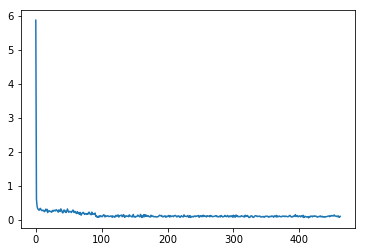

agent_value: 0.999819276847
input_value: 1.00016928447
output_value: 1.00036294008
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


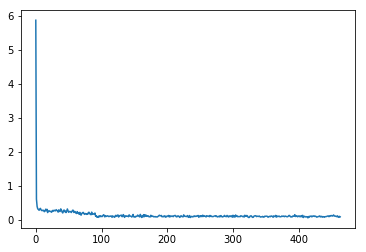

agent_value: 1.00067301415
input_value: 1.00424583593
output_value: 1.00192862248
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


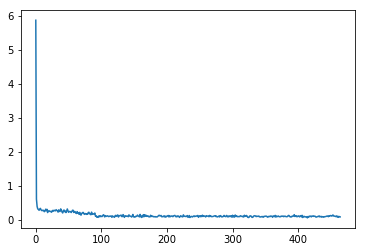

agent_value: 1.00023193604
input_value: 1.0002293259
output_value: 1.00051701547
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


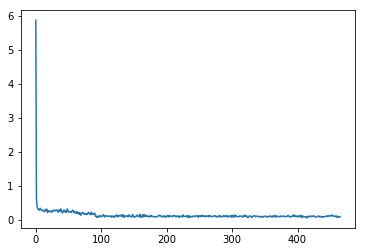

agent_value: 0.999634935926
input_value: 1.00013249275
output_value: 0.999873756664
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


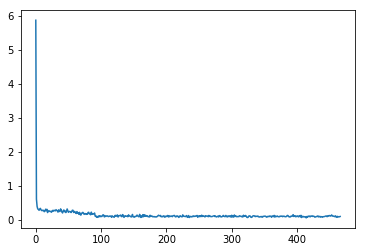

agent_value: 1.00023345443
input_value: 0.998801482507
output_value: 0.999353121639
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


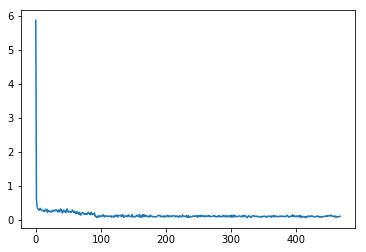

agent_value: 0.999937036634
input_value: 0.999389350638
output_value: 0.999407328034
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


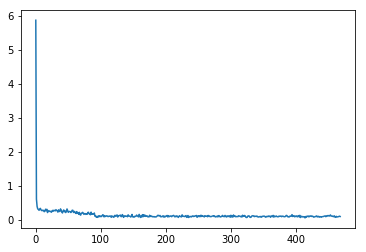

agent_value: 0.999981079432
input_value: 1.00073746959
output_value: 0.999548829851
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


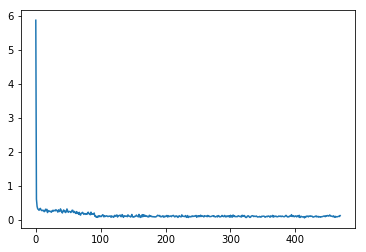

agent_value: 1.00009743301
input_value: 1.00002606759
output_value: 1.00049818465
mean diff: 0.12
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


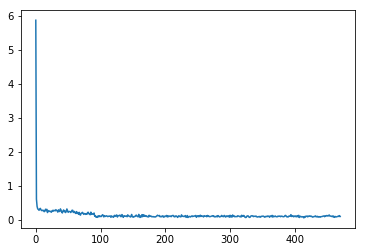

agent_value: 0.999927259682
input_value: 0.999866017343
output_value: 0.999812876891
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


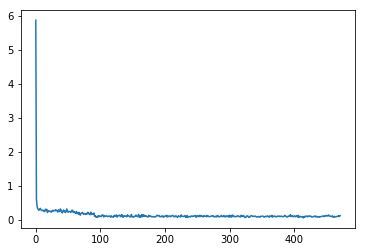

agent_value: 0.99966155798
input_value: 0.999630054232
output_value: 0.999769293824
mean diff: 0.12
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


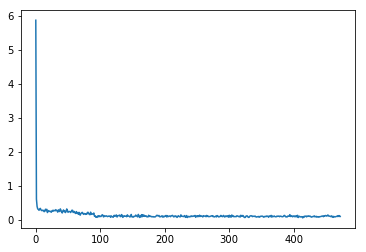

agent_value: 0.999924408672
input_value: 1.0001378215
output_value: 0.999837335213
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


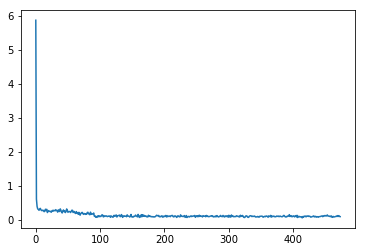

agent_value: 0.999619378321
input_value: 1.00287369641
output_value: 1.00222555049
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


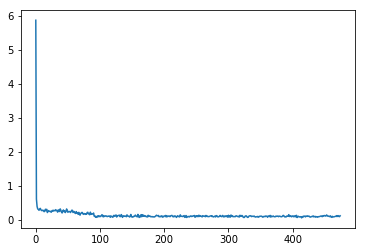

agent_value: 1.00004053358
input_value: 0.999849764792
output_value: 0.99968996921
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


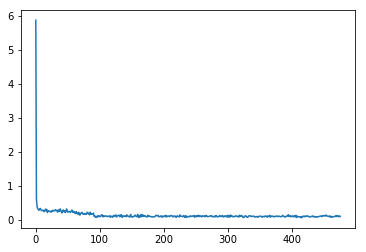

agent_value: 1.00058057598
input_value: 1.00132933973
output_value: 1.00046367556
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


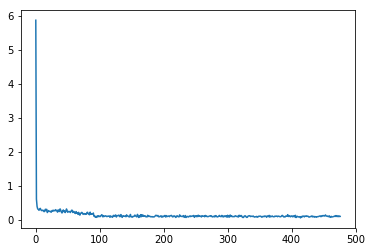

agent_value: 1.00007116573
input_value: 1.00000171612
output_value: 1.00020163756
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


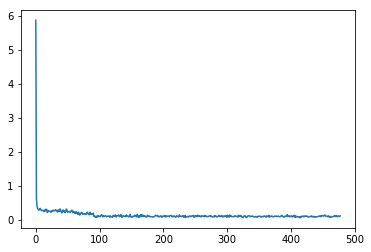

agent_value: 0.999828907467
input_value: 0.998712525379
output_value: 0.997238666183
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


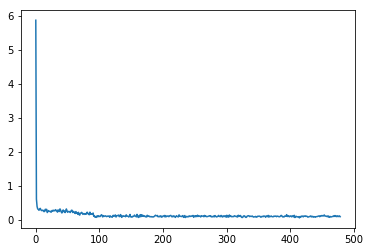

agent_value: 1.00021309592
input_value: 0.99847294195
output_value: 0.997643588656
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


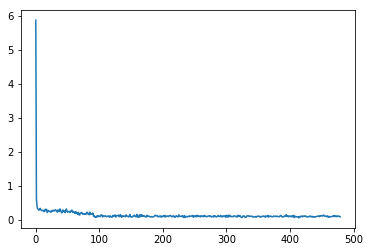

agent_value: 0.999758384489
input_value: 0.999490617148
output_value: 0.999747166867
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


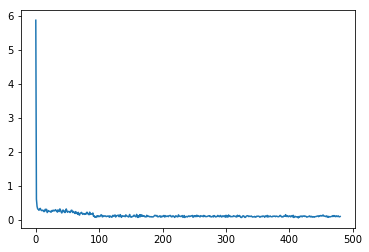

agent_value: 1.00001620131
input_value: 0.998833086288
output_value: 1.00022974312
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


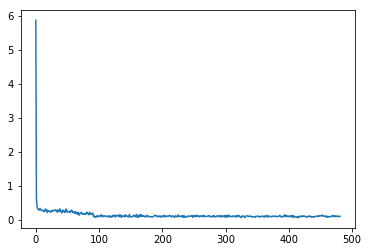

agent_value: 1.00229844158
input_value: 0.992472273184
output_value: 0.995251466892
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


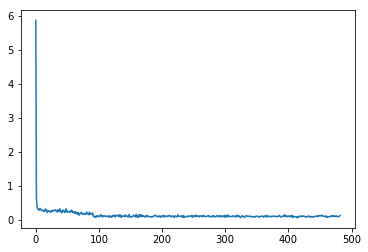

agent_value: 1.00236793925
input_value: 0.994820081884
output_value: 0.996652704697
mean diff: 0.122
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


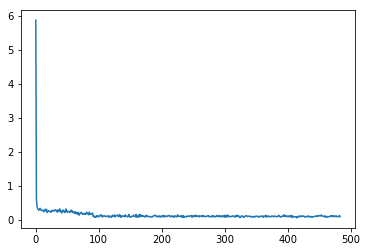

agent_value: 1.00014426271
input_value: 0.999895240809
output_value: 0.999536271013
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


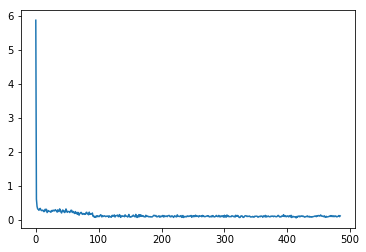

agent_value: 1.00010358087
input_value: 1.00030062676
output_value: 1.00070617902
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


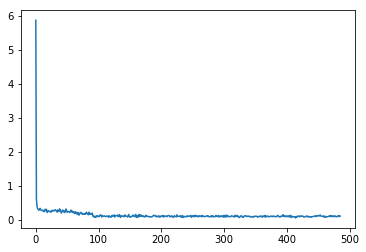

agent_value: 0.999835085698
input_value: 1.00024299262
output_value: 1.00101436198
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


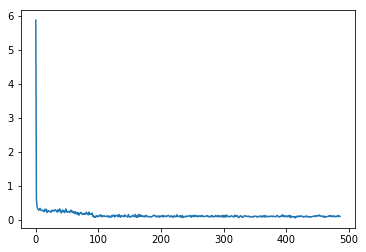

agent_value: 0.999793191663
input_value: 0.998025660067
output_value: 0.999339623401
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


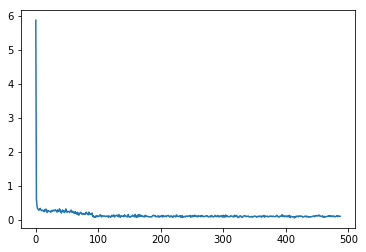

agent_value: 0.999772485703
input_value: 0.999188485531
output_value: 0.999335097501
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


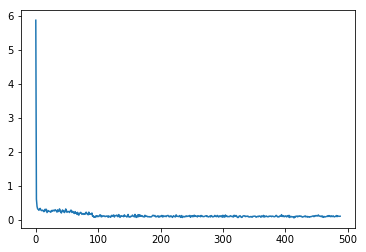

agent_value: 1.00003210577
input_value: 0.998423650208
output_value: 1.00008315987
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


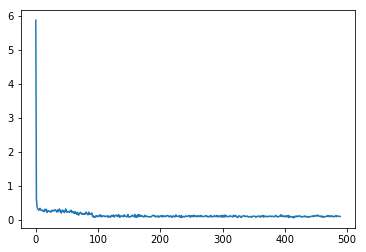

agent_value: 1.0001637782
input_value: 0.999209253319
output_value: 0.999719893354
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


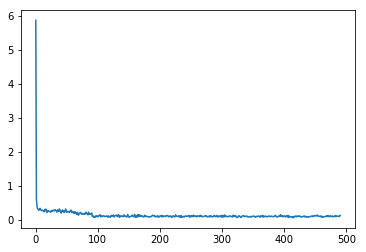

agent_value: 0.999743947962
input_value: 0.999885731226
output_value: 0.999831215841
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


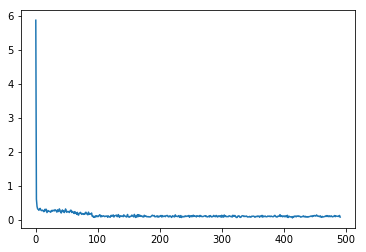

agent_value: 0.999594605678
input_value: 1.00165128789
output_value: 1.00155069137
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


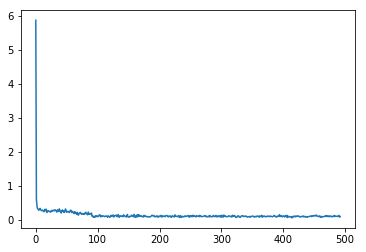

agent_value: 1.00003041735
input_value: 0.999960764744
output_value: 0.999893460137
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


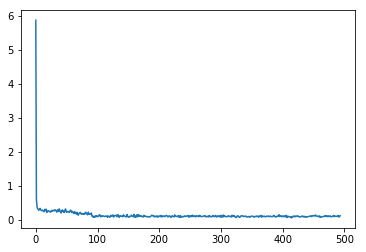

agent_value: 0.999309243204
input_value: 1.00059681064
output_value: 1.00107638691
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


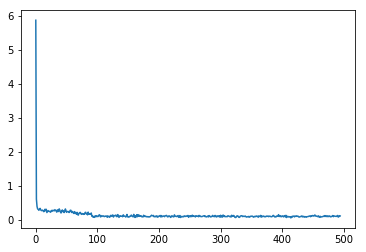

agent_value: 0.999982493767
input_value: 1.00107400897
output_value: 1.00084842146
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


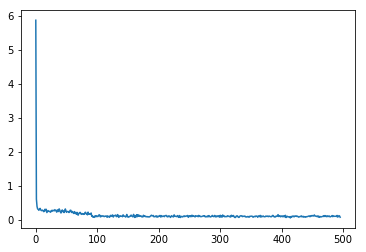

agent_value: 0.9992688899
input_value: 0.998867128123
output_value: 0.999673968854
mean diff: 0.072
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


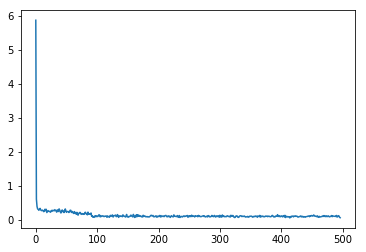

agent_value: 1.0000003601
input_value: 1.00019612804
output_value: 0.99997083285
mean diff: 0.058
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


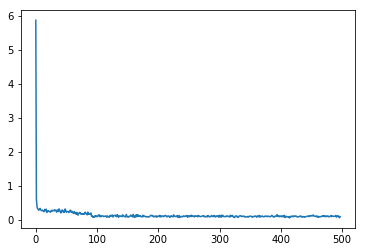

agent_value: 1.00002967444
input_value: 0.998208379872
output_value: 1.00006608245
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


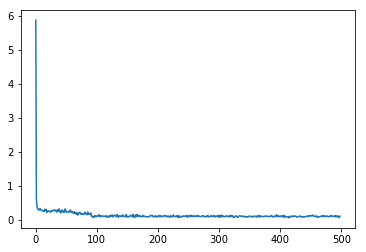

agent_value: 1.00048439721
input_value: 0.99981861013
output_value: 1.00032974248
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


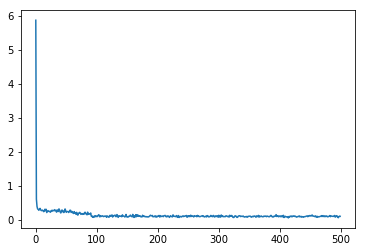

agent_value: 1.00104204797
input_value: 1.00141285336
output_value: 1.00065203745
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


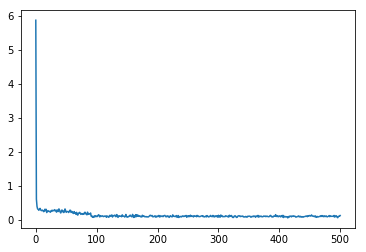

agent_value: 0.998947696597
input_value: 1.00051902499
output_value: 0.999966084853
mean diff: 0.122
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


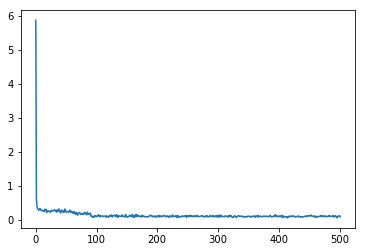

agent_value: 0.999512417973
input_value: 0.997966176422
output_value: 1.00113504872
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


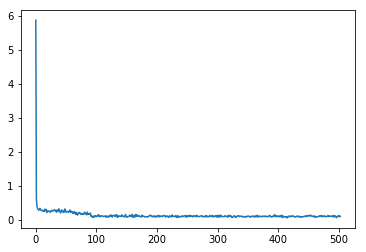

agent_value: 0.999972720202
input_value: 0.999960832041
output_value: 1.00025812392
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


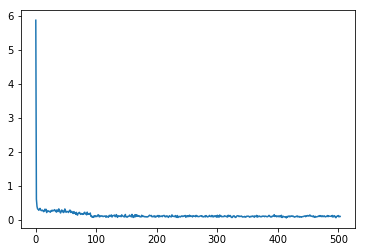

agent_value: 1.00038235848
input_value: 0.988407448669
output_value: 1.00070931639
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


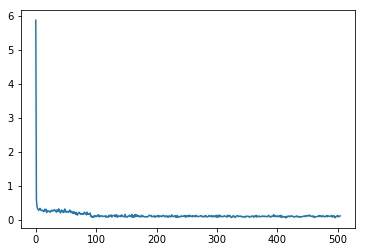

agent_value: 1.0000553036
input_value: 1.00064806157
output_value: 1.00140094935
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


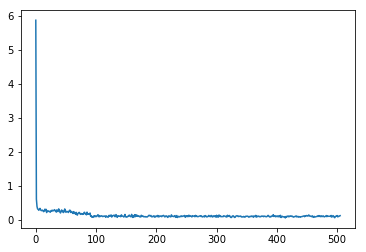

agent_value: 0.999660213847
input_value: 1.00026484602
output_value: 1.00049876081
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


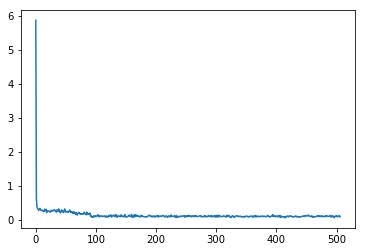

agent_value: 1.00001332216
input_value: 1.00015781294
output_value: 1.00017347817
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


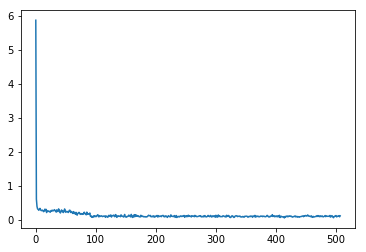

agent_value: 1.00011636187
input_value: 1.00020273015
output_value: 0.999885022598
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


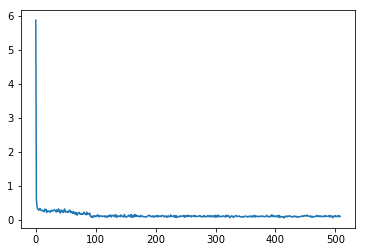

agent_value: 0.998779817207
input_value: 1.0046490234
output_value: 0.999477655495
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


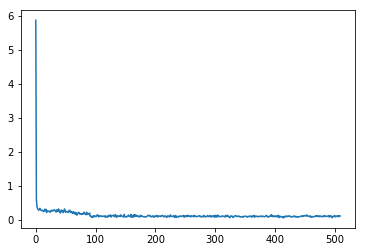

agent_value: 1.00000387966
input_value: 1.00073021571
output_value: 1.00049464889
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


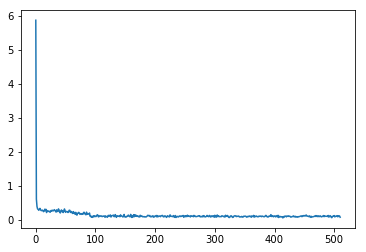

agent_value: 0.999633281474
input_value: 1.00140046635
output_value: 0.999657569808
mean diff: 0.072
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


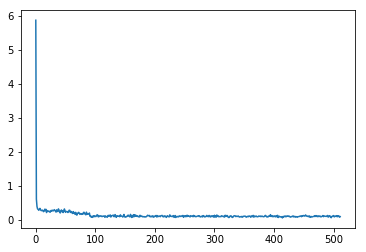

agent_value: 1.00019327037
input_value: 1.0023515546
output_value: 1.00169933975
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


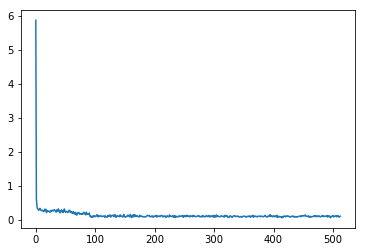

agent_value: 1.0005688265
input_value: 0.977191108747
output_value: 1.00087262143
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


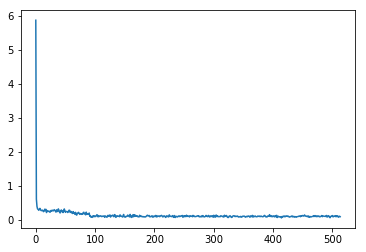

agent_value: 0.999961754024
input_value: 0.99971382623
output_value: 1.00115071318
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


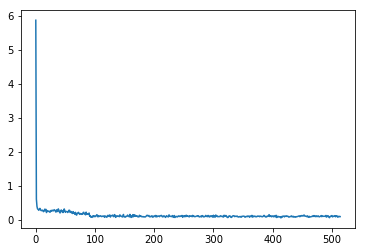

agent_value: 1.0004678472
input_value: 0.999030107578
output_value: 1.00039743282
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


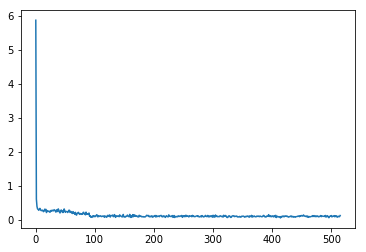

agent_value: 1.00011618679
input_value: 1.00008196319
output_value: 1.00046731857
mean diff: 0.122
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


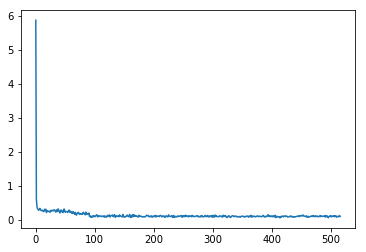

agent_value: 0.999702409598
input_value: 1.0008849552
output_value: 1.00110111214
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


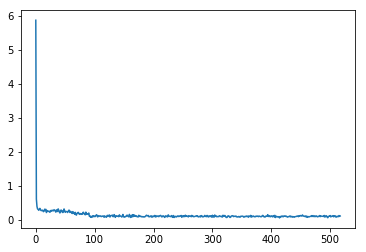

agent_value: 0.999610952465
input_value: 0.992004750098
output_value: 1.00084289076
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


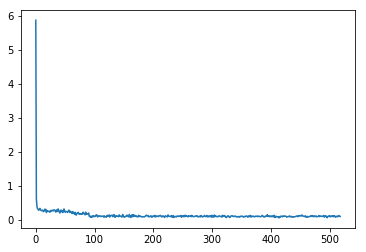

agent_value: 0.999719392049
input_value: 1.00109224184
output_value: 1.00095376019
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


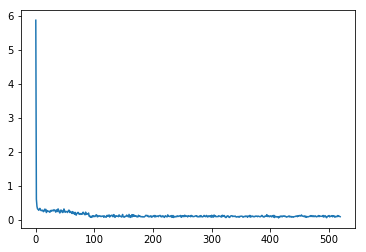

agent_value: 0.99997597533
input_value: 1.00022920343
output_value: 1.00059582841
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


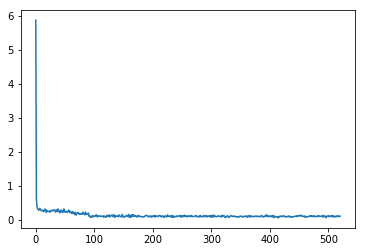

agent_value: 0.999898843985
input_value: 0.999591800996
output_value: 1.00008847504
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


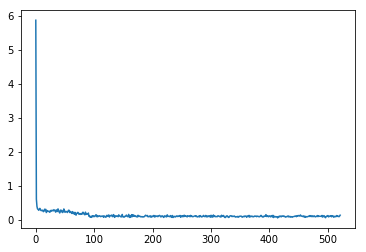

agent_value: 0.999957917885
input_value: 1.00143185031
output_value: 1.00189721215
mean diff: 0.132
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


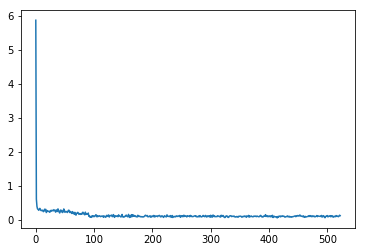

agent_value: 1.00001069361
input_value: 1.00060240882
output_value: 1.00040422801
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


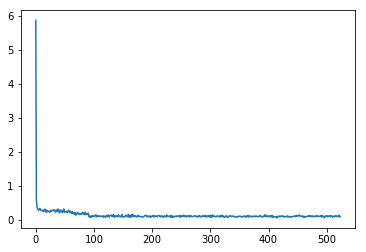

agent_value: 0.999937871841
input_value: 0.999902870255
output_value: 1.00027360135
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


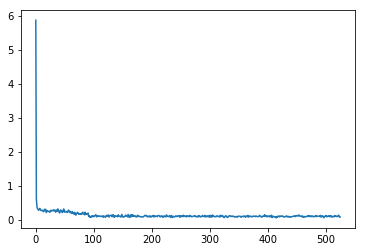

agent_value: 0.999196488427
input_value: 1.00045477841
output_value: 0.99992722716
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


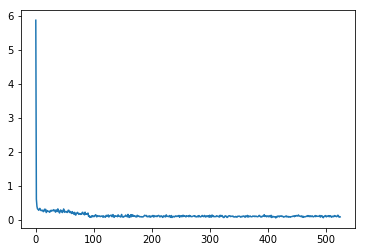

agent_value: 1.00008851729
input_value: 1.00020912571
output_value: 1.00008177217
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


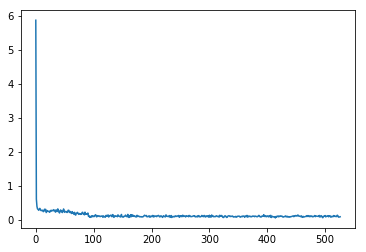

agent_value: 1.0001746992
input_value: 1.00031700059
output_value: 1.00120442568
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


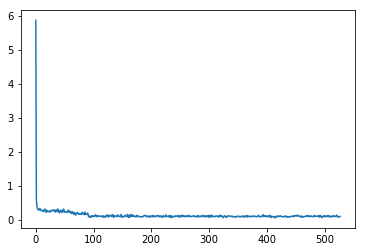

agent_value: 1.00065194911
input_value: 0.999961533084
output_value: 1.00015514469
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


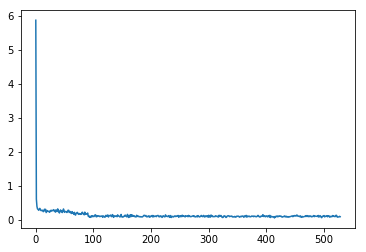

agent_value: 0.999994612005
input_value: 0.996781691489
output_value: 0.99579595036
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


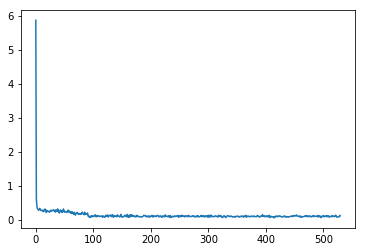

agent_value: 1.00039914714
input_value: 0.999672132932
output_value: 0.999635736692
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


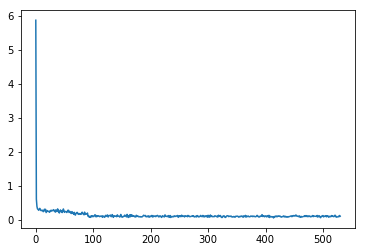

agent_value: 0.999972780758
input_value: 0.999778733573
output_value: 0.999683826862
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


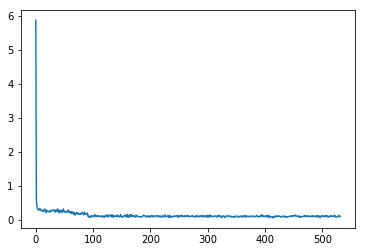

agent_value: 0.999938551567
input_value: 0.999300267231
output_value: 0.99905077135
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


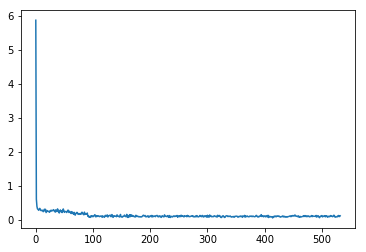

agent_value: 0.999793203596
input_value: 0.999925938098
output_value: 0.99958855434
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


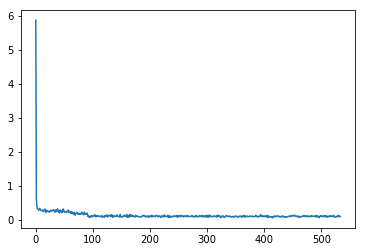

agent_value: 1.00021016364
input_value: 0.999543462259
output_value: 0.997854492734
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


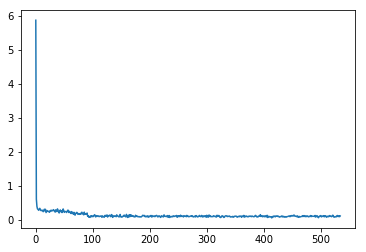

agent_value: 0.998933938475
input_value: 1.00183759081
output_value: 1.00019232711
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


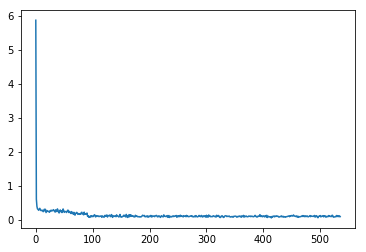

agent_value: 0.999415265365
input_value: 1.00038124543
output_value: 0.99946553687
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


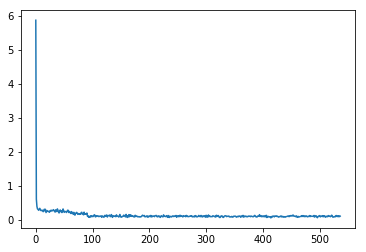

agent_value: 1.0000222227
input_value: 1.0017246619
output_value: 1.00118192972
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


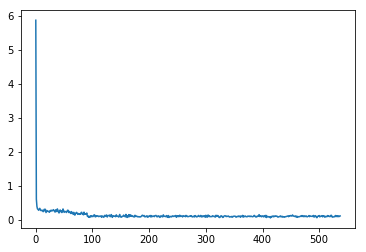

agent_value: 0.99962298303
input_value: 0.99946359079
output_value: 1.00042456611
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


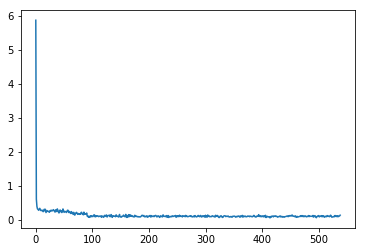

agent_value: 1.00068167997
input_value: 1.00163478737
output_value: 1.00044730357
mean diff: 0.132
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


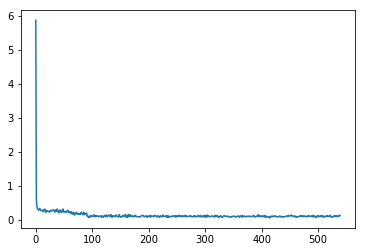

agent_value: 1.0001043604
input_value: 0.999636444264
output_value: 0.999816866767
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


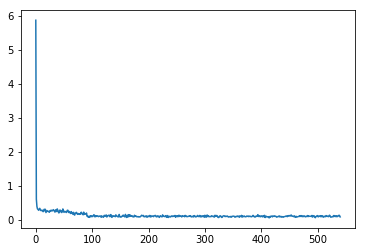

agent_value: 1.00009450524
input_value: 1.00013605938
output_value: 1.00021999055
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


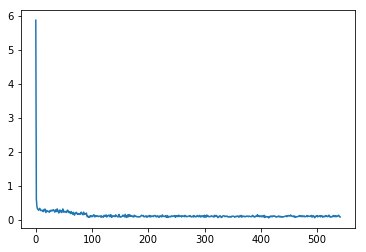

agent_value: 1.00009986849
input_value: 0.999969479409
output_value: 0.999932117518
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


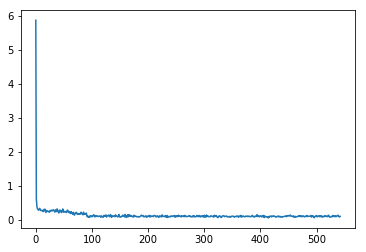

agent_value: 1.00008457408
input_value: 0.999514695282
output_value: 1.00035787765
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


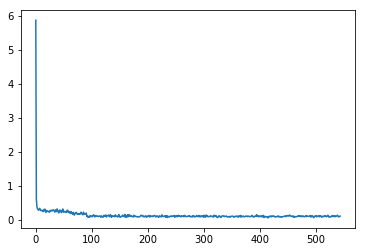

agent_value: 0.999841394323
input_value: 0.998642393321
output_value: 1.00036193694
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


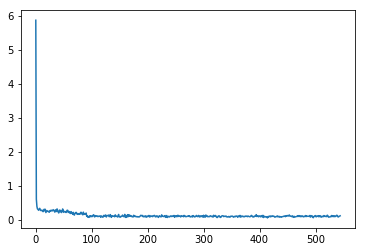

agent_value: 1.00005601888
input_value: 0.999772376963
output_value: 0.99944605835
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


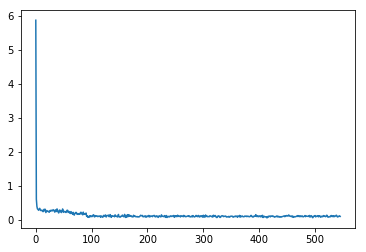

agent_value: 1.00108621678
input_value: 0.99941915448
output_value: 1.00029960019
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


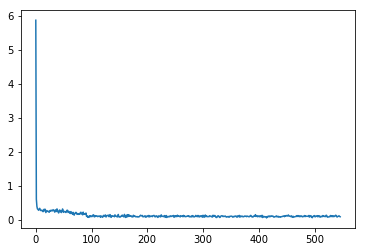

agent_value: 0.999828426214
input_value: 1.00076887806
output_value: 0.99983141163
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


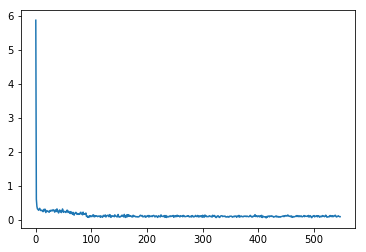

agent_value: 0.999982892007
input_value: 1.0002663921
output_value: 1.00021453658
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


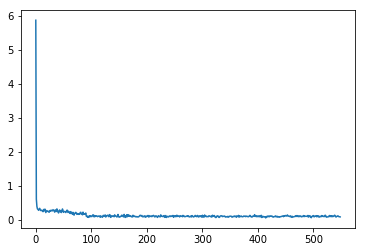

agent_value: 1.00000127143
input_value: 0.999985422288
output_value: 1.0000810888
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


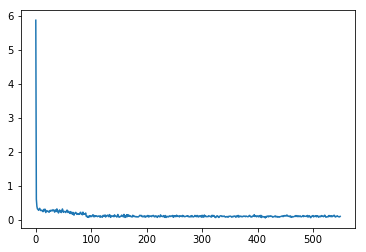

agent_value: 0.999195716183
input_value: 0.999743172073
output_value: 1.00073795058
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


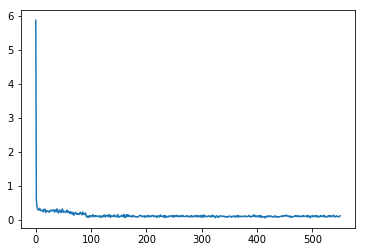

agent_value: 1.00103762372
input_value: 1.000650331
output_value: 1.00067918597
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


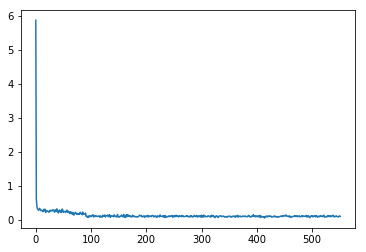

agent_value: 1.00026407089
input_value: 1.0022517977
output_value: 1.00118595849
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


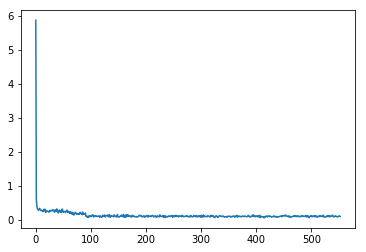

agent_value: 1.00015438219
input_value: 0.999062370745
output_value: 1.00044205713
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


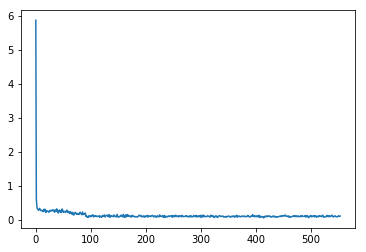

agent_value: 0.99979581898
input_value: 0.99966418824
output_value: 0.99934586276
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


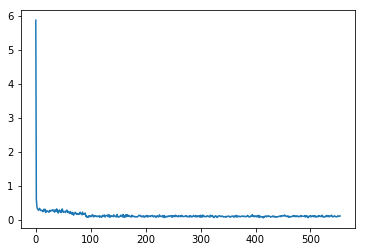

agent_value: 1.00016789845
input_value: 1.00042364508
output_value: 0.99998315402
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


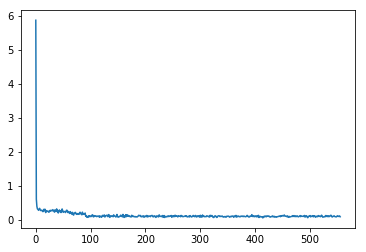

agent_value: 0.999901643526
input_value: 1.00116504927
output_value: 0.999827701406
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


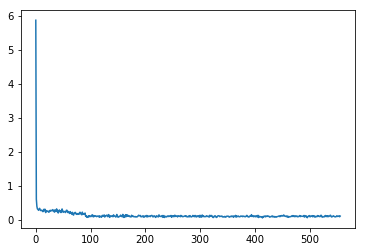

agent_value: 1.00021932152
input_value: 1.00029228567
output_value: 1.00034458024
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


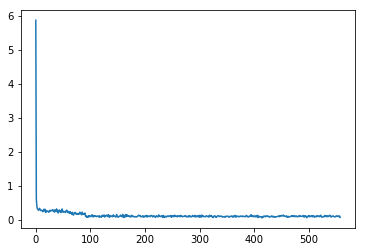

agent_value: 0.999741945747
input_value: 1.0002258783
output_value: 1.00082936742
mean diff: 0.068
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


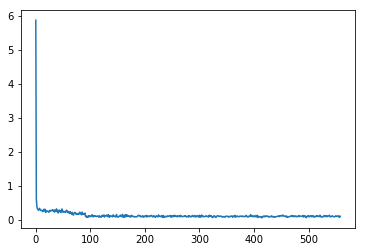

agent_value: 0.99980222834
input_value: 0.999262448883
output_value: 1.00049372298
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


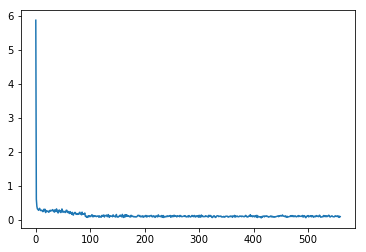

agent_value: 1.00010504528
input_value: 1.00059433613
output_value: 1.0003606982
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


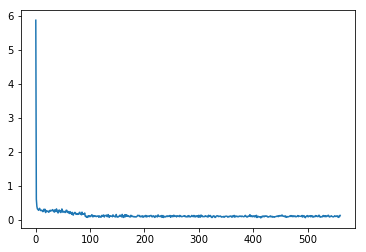

agent_value: 1.00012550865
input_value: 0.999165805771
output_value: 1.00009992099
mean diff: 0.126
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


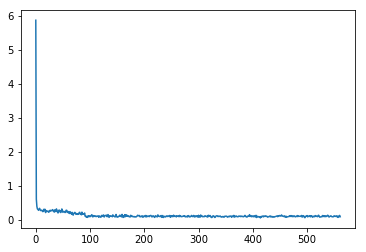

agent_value: 0.999916649835
input_value: 1.00009876383
output_value: 0.999969295468
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


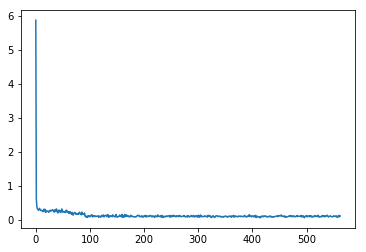

agent_value: 0.999756283325
input_value: 1.0002023796
output_value: 0.999835040205
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


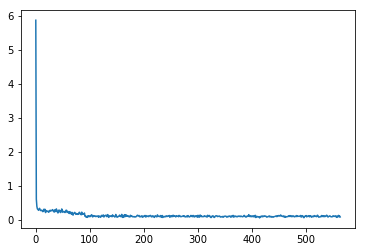

agent_value: 0.999984994217
input_value: 0.999808983156
output_value: 0.999699769287
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


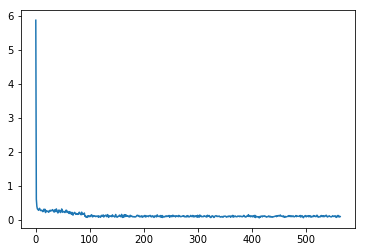

agent_value: 1.00019045849
input_value: 1.00038707784
output_value: 1.00010011742
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


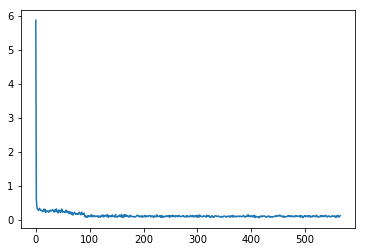

agent_value: 1.00016345824
input_value: 0.999768229627
output_value: 1.00033698619
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


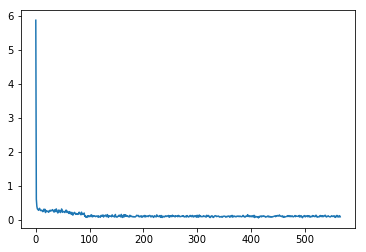

agent_value: 1.00009233587
input_value: 1.0004873528
output_value: 1.00005309773
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


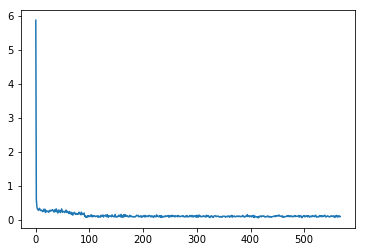

agent_value: 1.00034078788
input_value: 0.99929800451
output_value: 0.999529739314
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


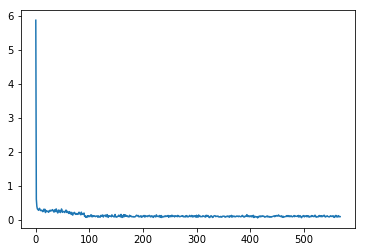

agent_value: 0.999340367739
input_value: 0.999850490145
output_value: 0.999166220923
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


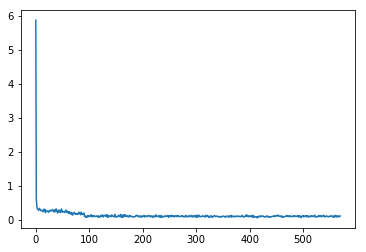

agent_value: 1.00036512488
input_value: 0.991044412227
output_value: 1.00076586719
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


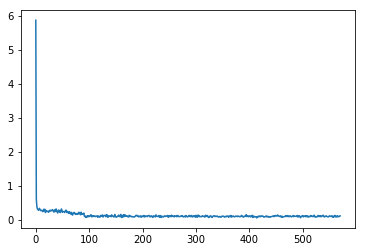

agent_value: 0.999848007502
input_value: 0.999324287371
output_value: 0.99978812166
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


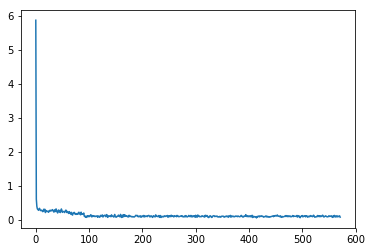

agent_value: 1.00000043783
input_value: 1.00003295382
output_value: 1.00011916008
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


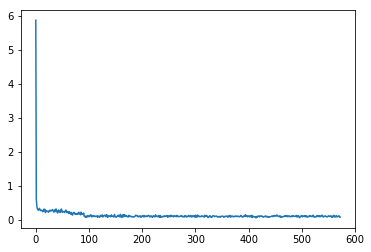

agent_value: 0.999633000895
input_value: 1.0015248927
output_value: 0.999747242731
mean diff: 0.076
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


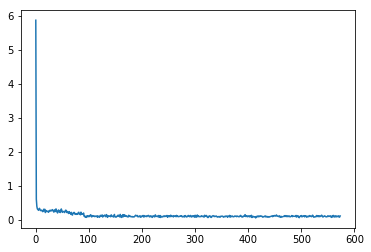

agent_value: 0.998056958353
input_value: 1.00251829817
output_value: 0.998643143089
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


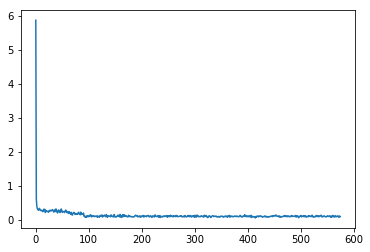

agent_value: 1.00010118823
input_value: 1.00150800996
output_value: 0.999727876724
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


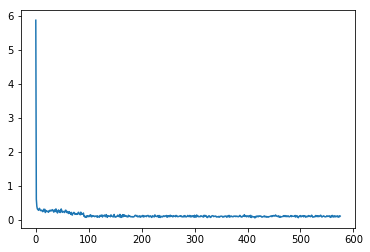

agent_value: 0.999077922864
input_value: 0.999512020311
output_value: 1.00040475853
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


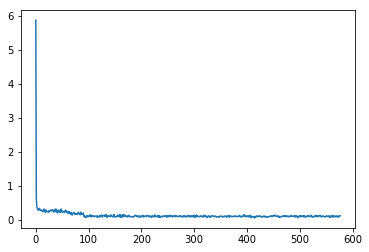

agent_value: 0.999691371518
input_value: 1.00034624106
output_value: 1.00018999815
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


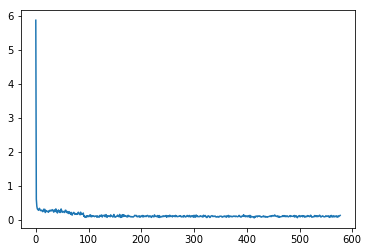

agent_value: 0.998355452776
input_value: 1.00117543183
output_value: 0.998855383292
mean diff: 0.126
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


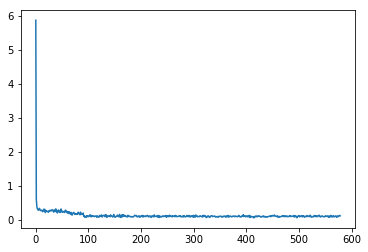

agent_value: 1.00002124962
input_value: 0.989695527162
output_value: 0.9974635919
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


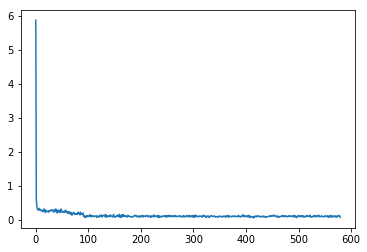

agent_value: 1.00058533587
input_value: 1.00136600887
output_value: 1.00091994065
mean diff: 0.07
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


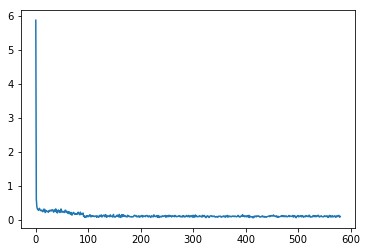

agent_value: 0.99618513558
input_value: 1.0041242537
output_value: 0.998150966559
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


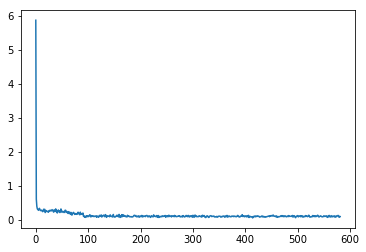

agent_value: 1.0000099685
input_value: 1.00007836202
output_value: 1.00009088106
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


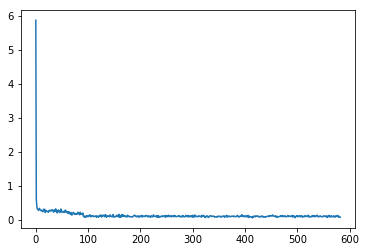

agent_value: 0.999992985414
input_value: 0.999990019477
output_value: 0.999649410516
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


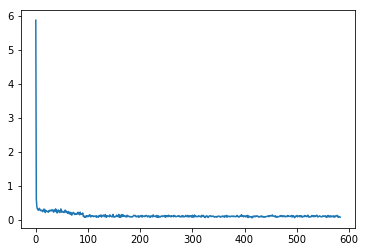

agent_value: 0.999946893218
input_value: 1.00031941271
output_value: 1.00040790947
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


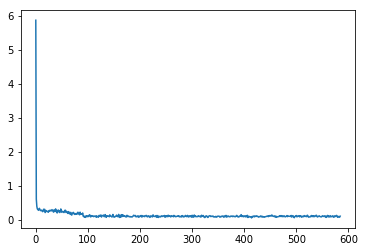

agent_value: 1.00095802272
input_value: 0.982560356267
output_value: 1.00006547631
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


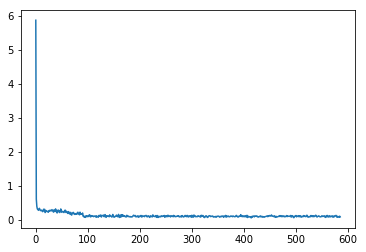

agent_value: 1.00004027701
input_value: 0.99980833305
output_value: 0.99951989359
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


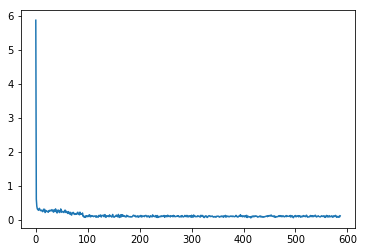

agent_value: 1.00005317111
input_value: 1.0000812811
output_value: 0.999874932534
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


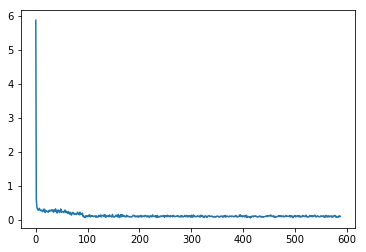

agent_value: 0.999774074903
input_value: 0.999014248892
output_value: 0.998834874587
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


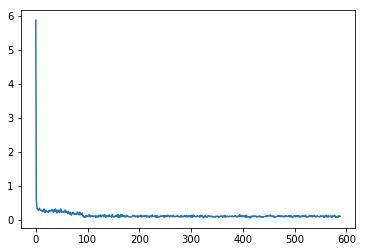

agent_value: 0.99991953355
input_value: 1.00012632632
output_value: 0.999629446854
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


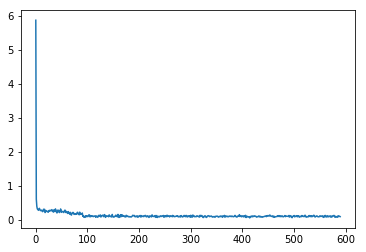

agent_value: 1.00022583628
input_value: 1.00003712947
output_value: 1.00011638418
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


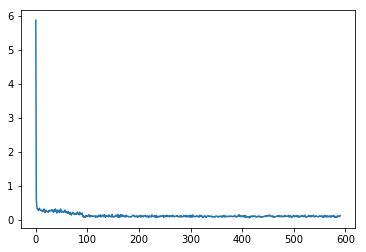

agent_value: 1.00027486214
input_value: 0.997902983879
output_value: 1.00074596308
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


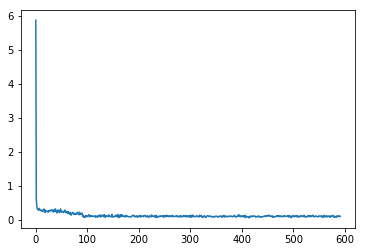

agent_value: 0.999878720882
input_value: 0.999507693346
output_value: 1.00011152724
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


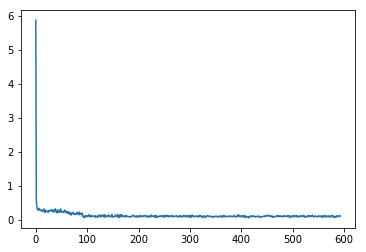

agent_value: 1.00005851606
input_value: 0.999895053957
output_value: 0.999517680633
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


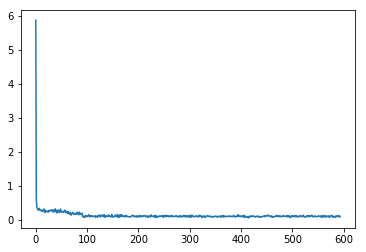

agent_value: 0.999968041238
input_value: 1.00100903804
output_value: 1.00140668079
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


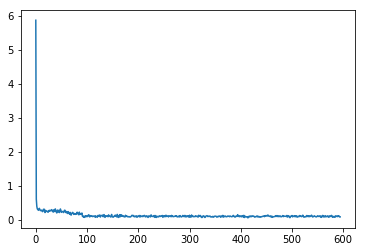

agent_value: 0.999933870611
input_value: 1.00003827634
output_value: 1.00023501495
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


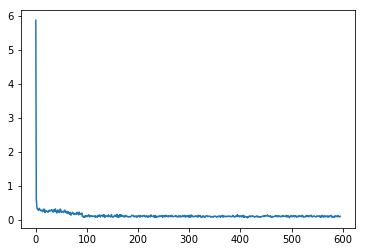

agent_value: 0.999813994349
input_value: 0.999585496799
output_value: 0.999775017193
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


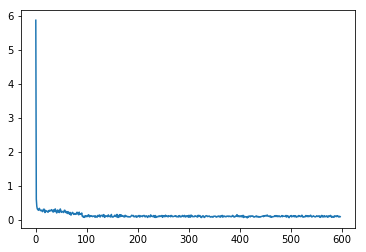

agent_value: 0.999954991516
input_value: 0.999358897123
output_value: 0.999822318333
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


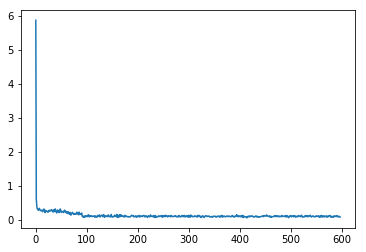

agent_value: 0.999771636885
input_value: 0.999393740058
output_value: 1.0008185584
mean diff: 0.078
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


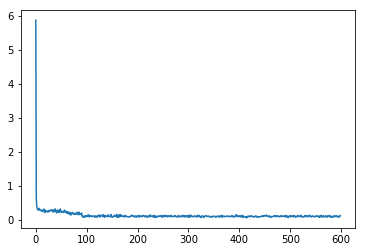

agent_value: 0.999630634446
input_value: 0.999987993799
output_value: 1.00004030699
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


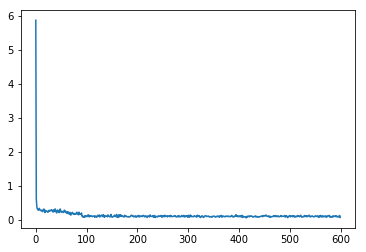

agent_value: 1.00006173443
input_value: 1.00059172455
output_value: 1.00051182709
mean diff: 0.066
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


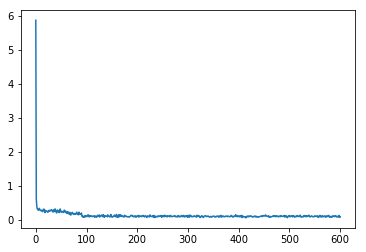

agent_value: 0.999962678571
input_value: 1.00026438728
output_value: 1.00082947873
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


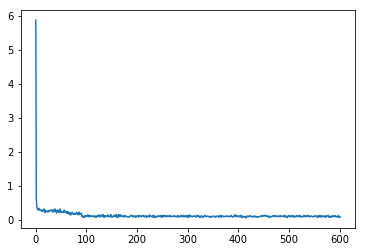

agent_value: 1.00001207342
input_value: 1.00002440411
output_value: 0.999895158119
mean diff: 0.078
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


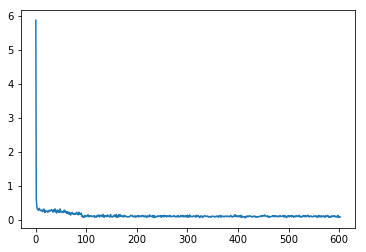

agent_value: 1.00011832746
input_value: 1.00022152647
output_value: 1.00073020313
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


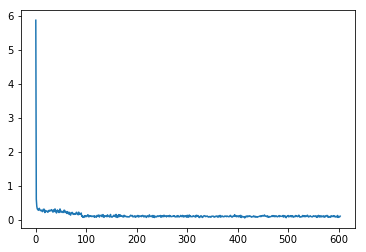

agent_value: 0.999768287569
input_value: 0.998233019466
output_value: 0.999082767279
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


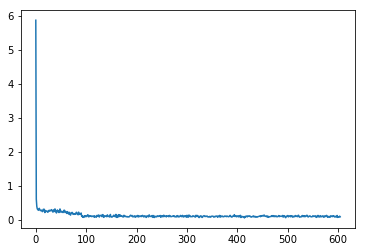

agent_value: 0.999977816163
input_value: 1.00030283691
output_value: 1.00033931372
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


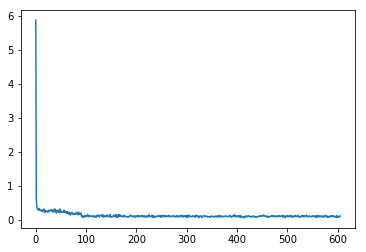

agent_value: 0.999651200641
input_value: 1.00117121671
output_value: 1.00079675496
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


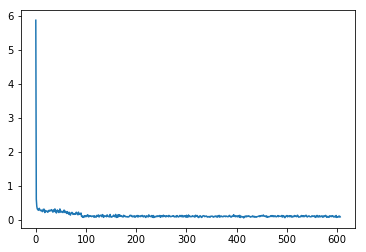

agent_value: 1.00056343703
input_value: 0.996785013804
output_value: 0.995144739979
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


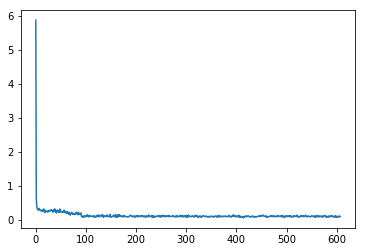

agent_value: 1.0001100962
input_value: 0.999945124338
output_value: 1.00008953702
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


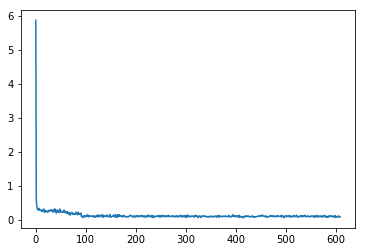

agent_value: 0.999661089862
input_value: 0.999990360272
output_value: 0.999908465753
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


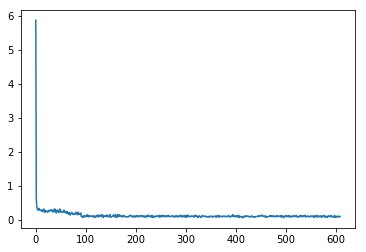

agent_value: 1.00008073604
input_value: 0.999495942104
output_value: 1.0001112958
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


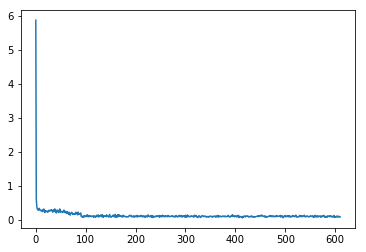

agent_value: 0.999856873829
input_value: 0.999996905566
output_value: 1.00033818004
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


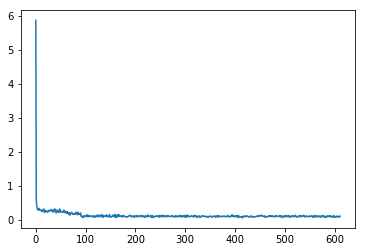

agent_value: 0.999942905035
input_value: 1.00044306031
output_value: 1.00001373597
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


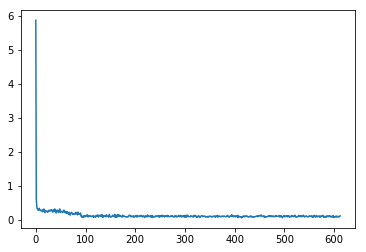

agent_value: 1.00002789189
input_value: 0.999389561474
output_value: 0.99941014894
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


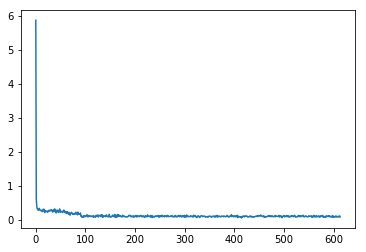

agent_value: 1.00014898138
input_value: 0.994811375583
output_value: 1.00016976056
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


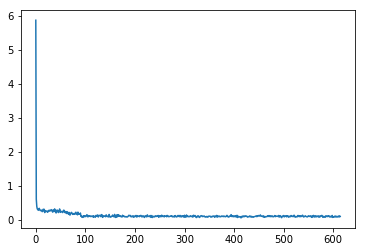

agent_value: 1.00058829501
input_value: 0.997680048712
output_value: 1.00058270418
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


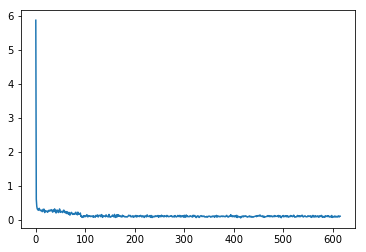

agent_value: 1.00015874179
input_value: 0.9996537053
output_value: 1.00039957207
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


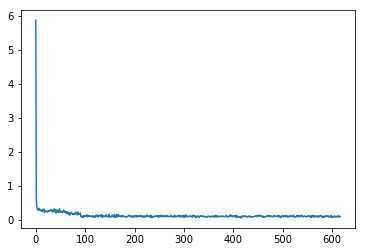

agent_value: 0.999779679116
input_value: 0.999800832124
output_value: 1.00013421966
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


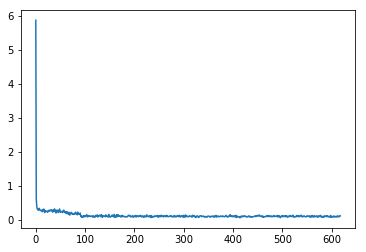

agent_value: 1.00008794582
input_value: 0.999847650716
output_value: 0.999892072219
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


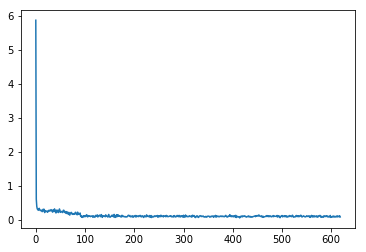

agent_value: 1.00012353495
input_value: 1.00048258577
output_value: 1.00056363294
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


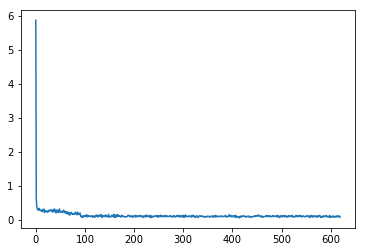

agent_value: 1.0001587768
input_value: 0.998940110341
output_value: 1.00040534169
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


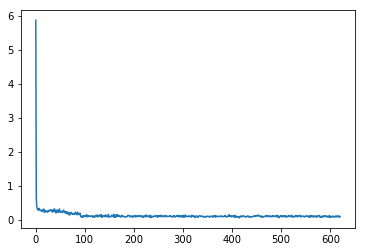

agent_value: 0.999361172935
input_value: 1.00452896386
output_value: 1.00193589007
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


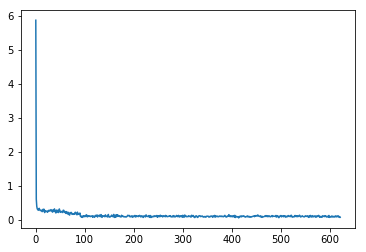

agent_value: 1.00003366004
input_value: 1.00036495901
output_value: 0.999977735148
mean diff: 0.07
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


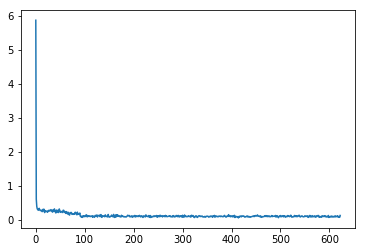

agent_value: 0.999888374959
input_value: 0.996816172397
output_value: 0.995486194673
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


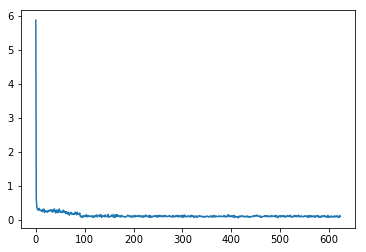

agent_value: 0.999350060023
input_value: 1.00011123448
output_value: 0.99966215934
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


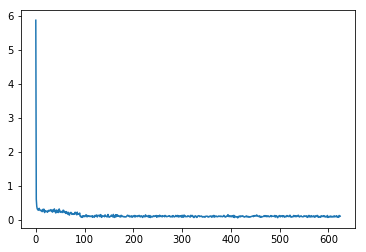

agent_value: 1.0000315927
input_value: 1.00086906316
output_value: 1.00010318214
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


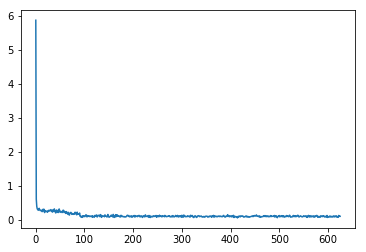

agent_value: 1.000821505
input_value: 0.99911855123
output_value: 1.0000709041
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


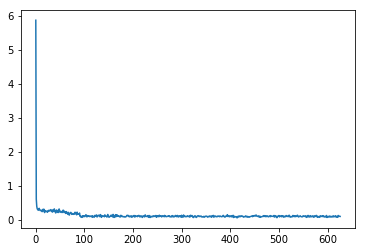

agent_value: 0.999946379346
input_value: 0.999900414257
output_value: 0.999961932625
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


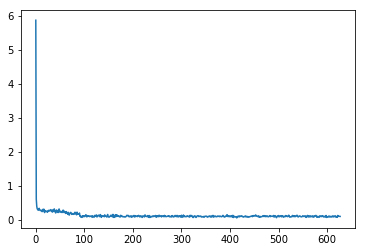

agent_value: 1.00003899686
input_value: 0.996366677036
output_value: 1.00050027801
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


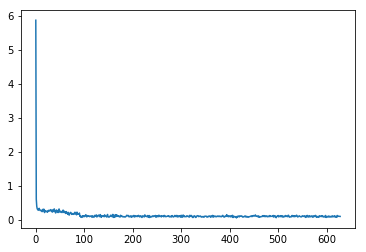

agent_value: 0.999059288989
input_value: 1.0007393347
output_value: 1.00026852678
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


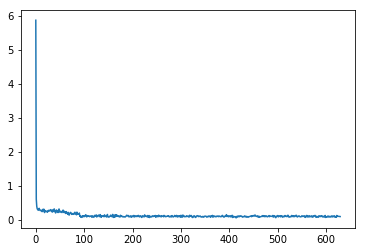

agent_value: 0.999323739986
input_value: 1.00255980552
output_value: 1.00028744452
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


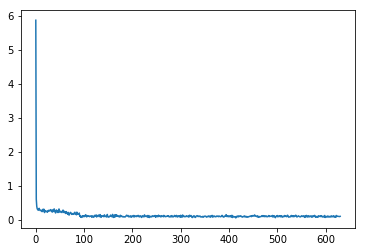

agent_value: 0.999814735956
input_value: 0.999256114919
output_value: 0.998985684903
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


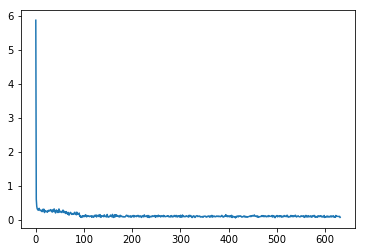

agent_value: 0.999921349445
input_value: 1.00008404496
output_value: 1.00008032445
mean diff: 0.068
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


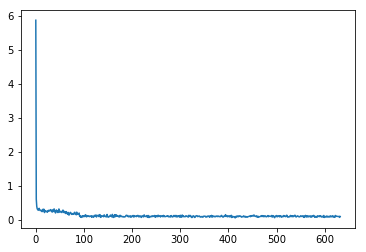

agent_value: 1.0000782935
input_value: 0.998557958305
output_value: 0.999959805578
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


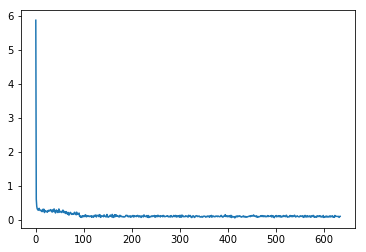

agent_value: 0.998884163412
input_value: 1.00355038388
output_value: 1.00049265099
mean diff: 0.098
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


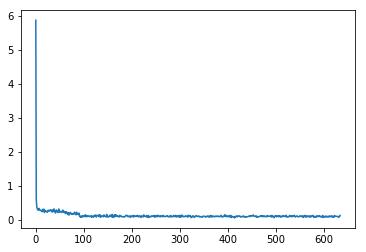

agent_value: 0.999637062171
input_value: 0.999752504836
output_value: 0.999425618896
mean diff: 0.124
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


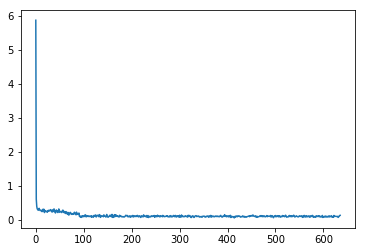

agent_value: 0.999918855831
input_value: 0.998647365193
output_value: 0.9982756533
mean diff: 0.128
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


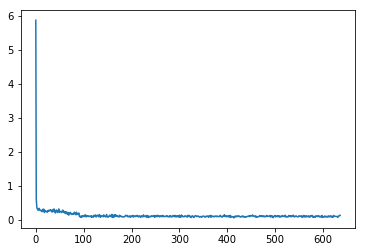

agent_value: 1.00237993081
input_value: 0.957385187873
output_value: 1.0009577079
mean diff: 0.126
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


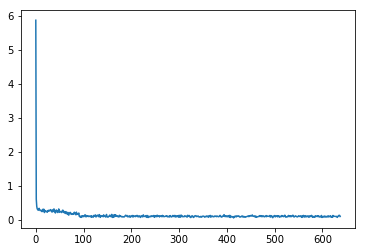

agent_value: 0.999993622347
input_value: 1.000192349
output_value: 1.00024418193
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


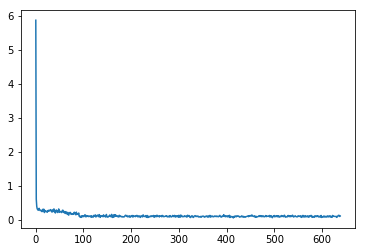

agent_value: 1.00011048521
input_value: 0.995868916264
output_value: 0.999834125529
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


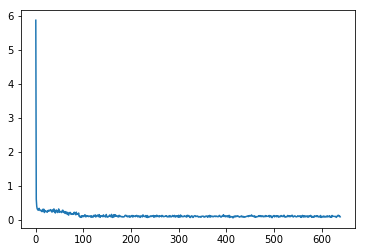

agent_value: 0.998470095958
input_value: 0.99836908949
output_value: 1.00040294163
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


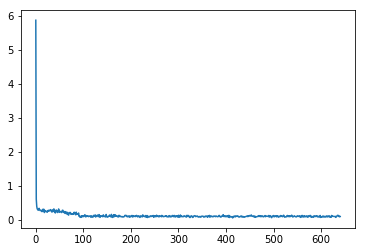

agent_value: 0.999739499765
input_value: 1.0009665451
output_value: 0.999549063629
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


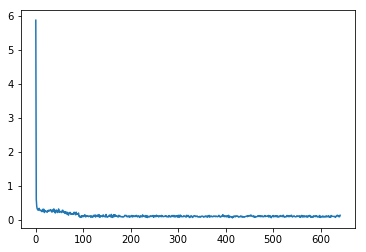

agent_value: 0.999634738079
input_value: 1.00159956735
output_value: 1.00100781664
mean diff: 0.13
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


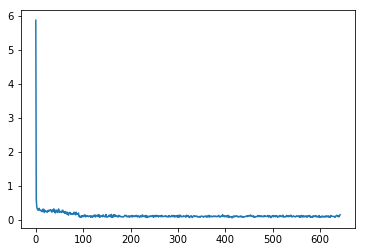

agent_value: 1.00006169726
input_value: 1.0011980327
output_value: 1.00121841113
mean diff: 0.148
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


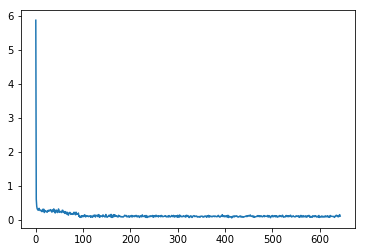

agent_value: 1.00026341954
input_value: 0.995755070581
output_value: 0.999827660099
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


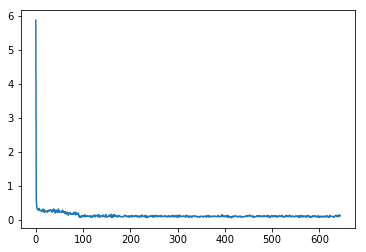

agent_value: 0.999986845224
input_value: 1.00079582603
output_value: 1.00083140372
mean diff: 0.112
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


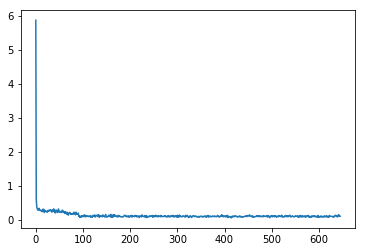

agent_value: 0.999997455386
input_value: 1.00026621538
output_value: 1.00097557719
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


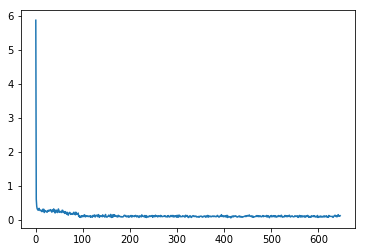

agent_value: 1.00029494189
input_value: 1.00191333091
output_value: 1.00082245636
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


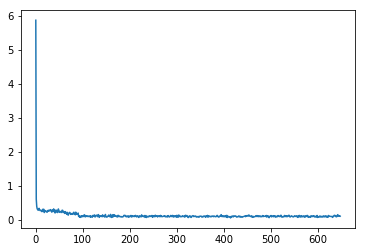

agent_value: 0.999856609625
input_value: 0.999555269073
output_value: 0.999631943979
mean diff: 0.104
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


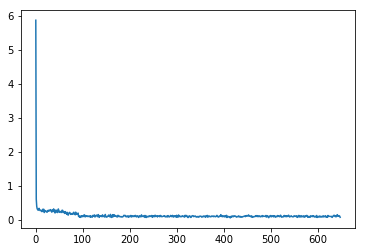

agent_value: 0.999616983441
input_value: 1.00088239346
output_value: 1.00119993096
mean diff: 0.07
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


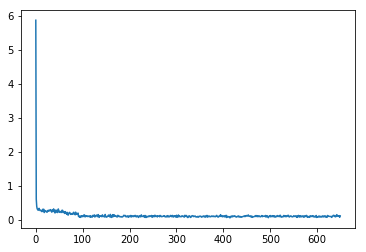

agent_value: 1.00001905885
input_value: 1.00005142
output_value: 0.999965587609
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


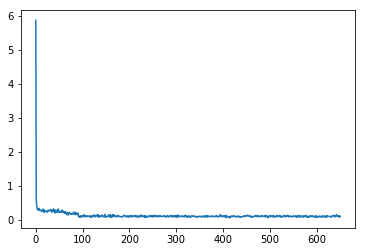

agent_value: 1.00015345904
input_value: 0.99948869587
output_value: 1.00048544508
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


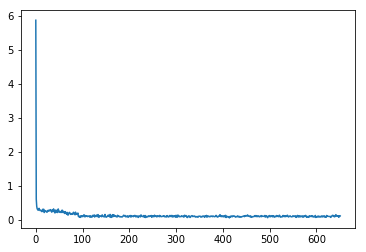

agent_value: 0.999444136525
input_value: 1.00039191425
output_value: 1.00039192797
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


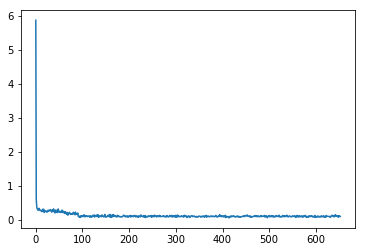

agent_value: 1.00034098377
input_value: 0.999617856023
output_value: 1.00080332721
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


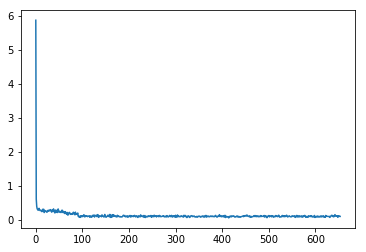

agent_value: 1.00039170485
input_value: 0.998643328918
output_value: 0.999775264415
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


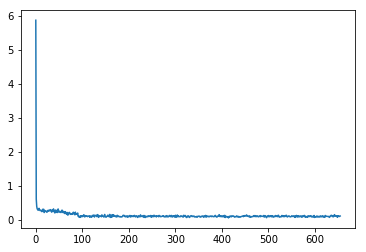

agent_value: 1.0000381695
input_value: 0.999906099466
output_value: 1.00031557657
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


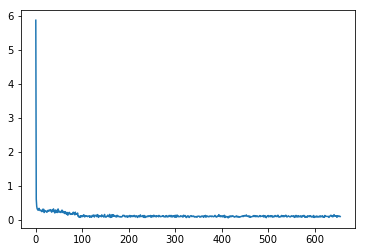

agent_value: 0.999971464422
input_value: 1.00022735704
output_value: 0.999962216446
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


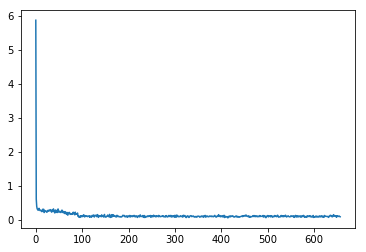

agent_value: 1.00031046893
input_value: 0.96817691055
output_value: 0.99991711607
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


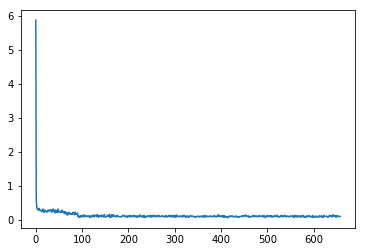

agent_value: 0.999844704095
input_value: 1.00068938583
output_value: 1.00101257582
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


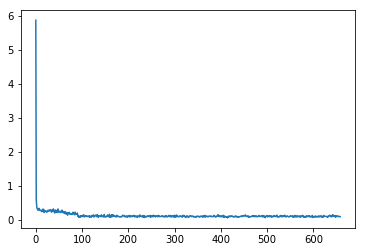

agent_value: 1.00050354894
input_value: 0.999537545318
output_value: 1.00057800413
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


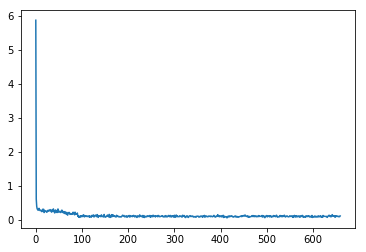

agent_value: 1.00023877236
input_value: 1.00055880861
output_value: 1.00030934657
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


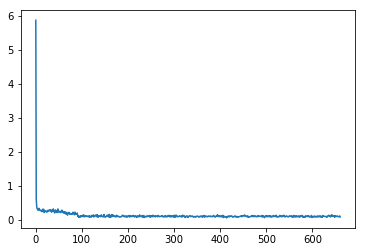

agent_value: 1.00016501512
input_value: 1.00008815925
output_value: 0.99956867249
mean diff: 0.082
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


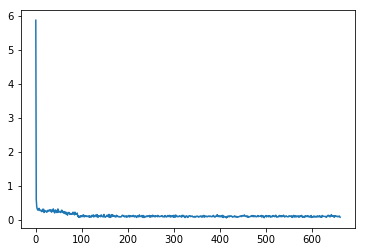

agent_value: 0.999891415774
input_value: 0.999781054001
output_value: 0.99968650055
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


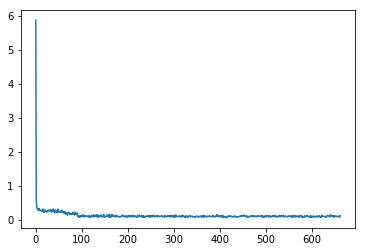

agent_value: 0.999915876756
input_value: 0.999971212747
output_value: 1.00078646394
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


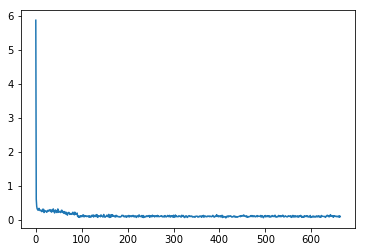

agent_value: 1.00093073853
input_value: 1.00003224301
output_value: 0.999783864218
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


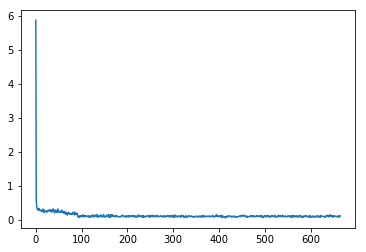

agent_value: 1.00026762605
input_value: 0.999900054602
output_value: 1.00072157506
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


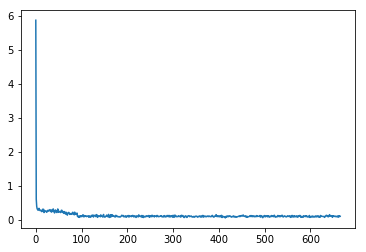

agent_value: 1.00115932309
input_value: 0.956963113943
output_value: 1.00169036338
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


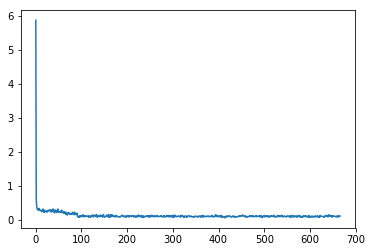

agent_value: 1.00029369798
input_value: 0.999826613283
output_value: 1.00023391303
mean diff: 0.106
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


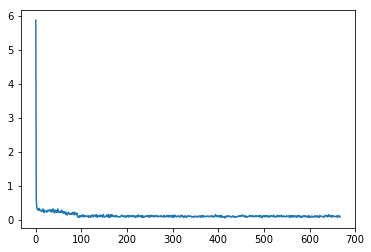

agent_value: 0.999172291122
input_value: 1.00264276733
output_value: 0.999684217452
mean diff: 0.08
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


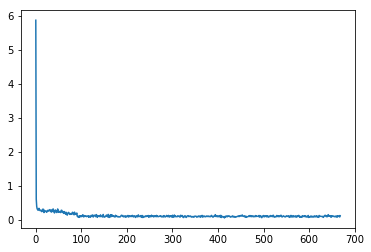

agent_value: 0.999949059028
input_value: 1.00130552901
output_value: 1.00059882007
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


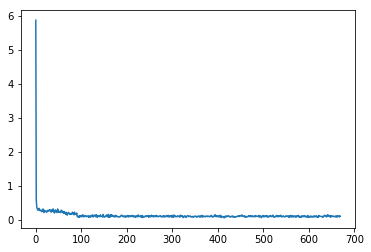

agent_value: 0.999926874745
input_value: 0.999776036015
output_value: 0.999565200401
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


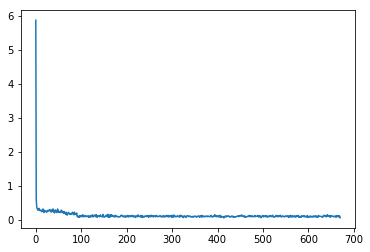

agent_value: 0.999942024771
input_value: 0.999375951303
output_value: 0.999284824631
mean diff: 0.058
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


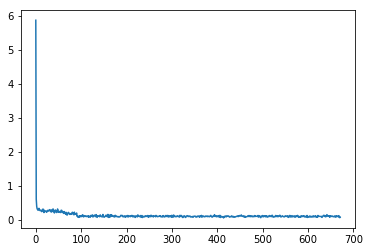

agent_value: 0.999940847613
input_value: 0.999691230751
output_value: 1.00009680077
mean diff: 0.074
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


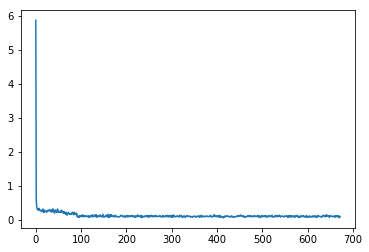

agent_value: 0.99996059923
input_value: 0.99829842178
output_value: 1.00063637811
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


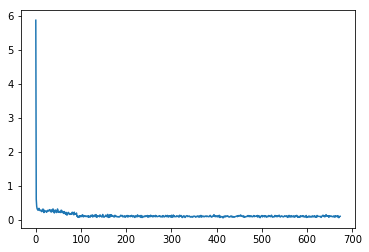

agent_value: 1.00001694145
input_value: 0.997849744327
output_value: 0.998333025596
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


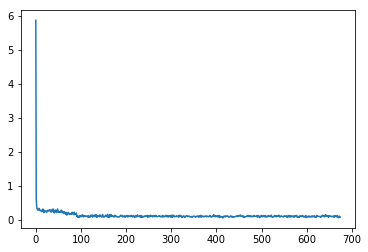

agent_value: 1.00060994525
input_value: 0.992889562152
output_value: 1.00015758713
mean diff: 0.068
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


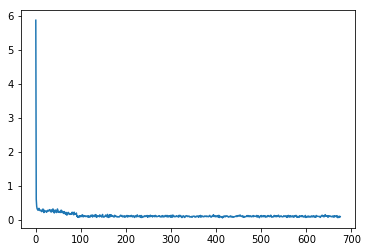

agent_value: 0.999988023532
input_value: 1.00037066123
output_value: 1.00030356582
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


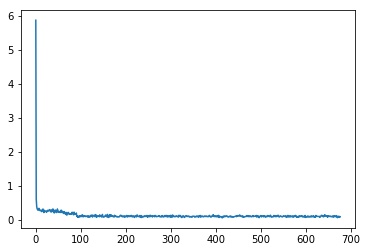

agent_value: 0.99983682124
input_value: 1.00140653341
output_value: 1.0005536787
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


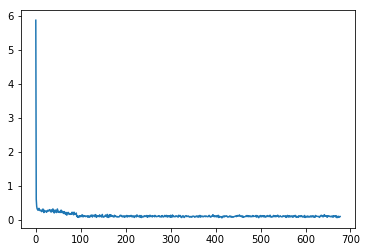

agent_value: 0.999776459391
input_value: 1.00037712308
output_value: 0.999996139043
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


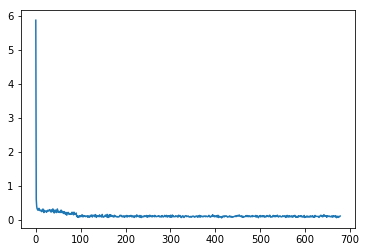

agent_value: 0.999825973617
input_value: 1.00038162511
output_value: 1.00019283553
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


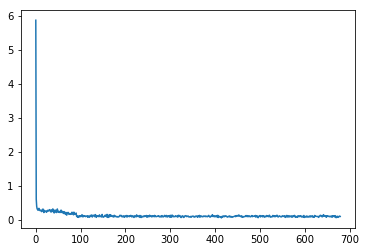

agent_value: 0.999698940142
input_value: 1.00029430373
output_value: 1.00062383688
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


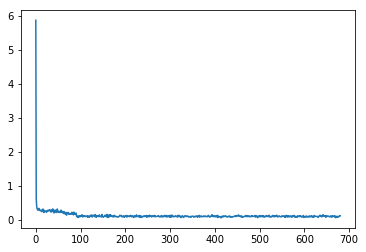

agent_value: 1.00004418615
input_value: 0.998011107185
output_value: 0.998646381733
mean diff: 0.116
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


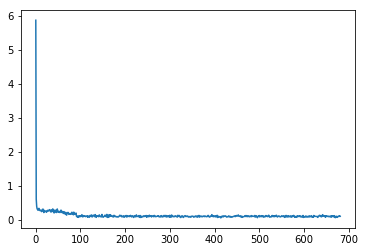

agent_value: 1.00153061043
input_value: 0.998745543987
output_value: 1.00295116788
mean diff: 0.102
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


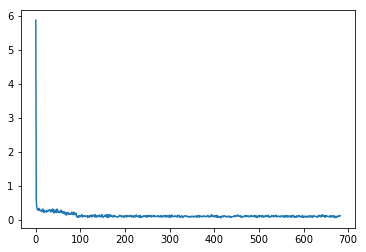

agent_value: 0.999927733961
input_value: 0.999343021325
output_value: 0.998892491902
mean diff: 0.114
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


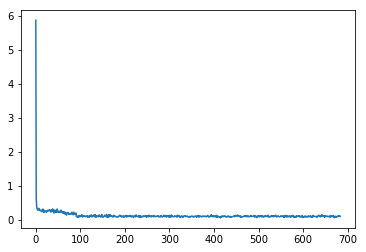

agent_value: 1.00015779034
input_value: 0.999208444973
output_value: 1.00004447824
mean diff: 0.1
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


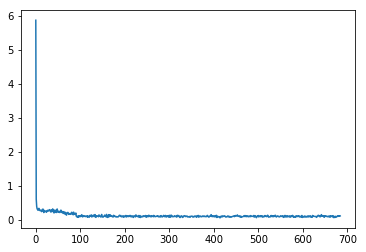

agent_value: 0.999897378756
input_value: 1.00075244
output_value: 1.00063144569
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


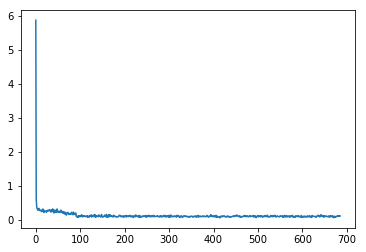

agent_value: 1.00001784249
input_value: 1.0002692375
output_value: 1.00013093144
mean diff: 0.11
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


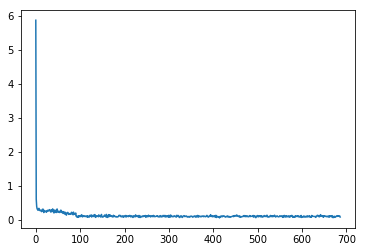

agent_value: 0.999992414175
input_value: 0.999897610211
output_value: 1.00004629989
mean diff: 0.078
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


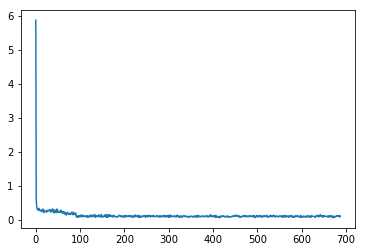

agent_value: 1.00027378395
input_value: 1.0007053745
output_value: 1.00027497261
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


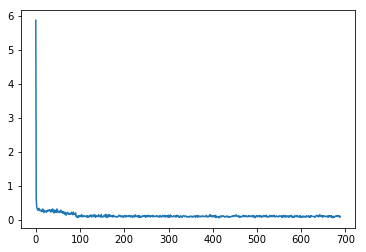

agent_value: 0.99943709436
input_value: 1.00040155703
output_value: 1.0007359403
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


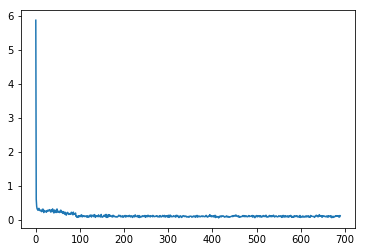

agent_value: 1.00010021056
input_value: 0.997788956912
output_value: 0.997912803207
mean diff: 0.118
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


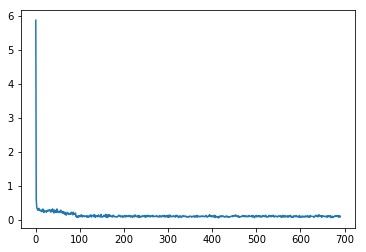

agent_value: 0.999951263616
input_value: 1.0000138245
output_value: 0.999910598222
mean diff: 0.084
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


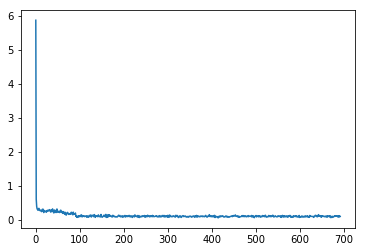

agent_value: 0.999997715744
input_value: 1.00043695159
output_value: 1.00052420163
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


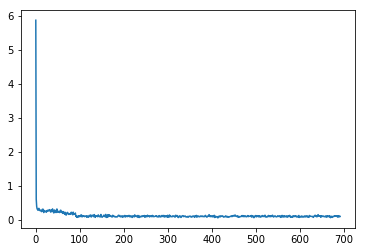

agent_value: 1.00001275321
input_value: 1.00002952124
output_value: 0.999970733229
mean diff: 0.096
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


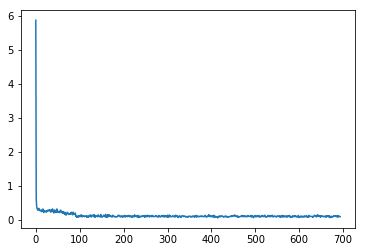

agent_value: 0.998816841667
input_value: 0.999542262812
output_value: 0.999109847108
mean diff: 0.09
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


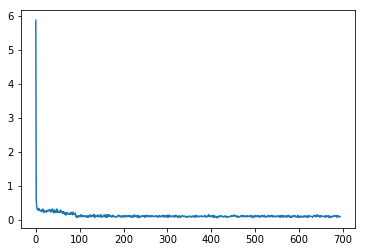

agent_value: 0.999894613045
input_value: 0.997948858784
output_value: 0.995905357625
mean diff: 0.088
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


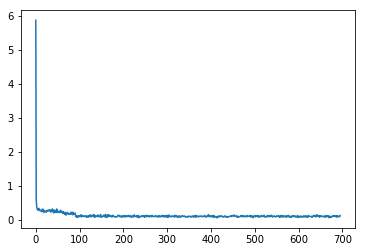

agent_value: 1.00016531189
input_value: 0.999973472334
output_value: 0.99953288064
mean diff: 0.122
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


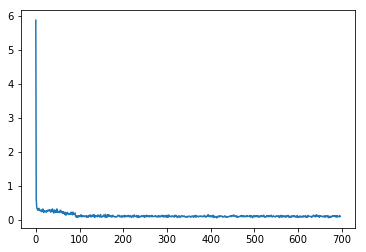

agent_value: 0.999849658135
input_value: 1.00096289558
output_value: 0.999831628161
mean diff: 0.094
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


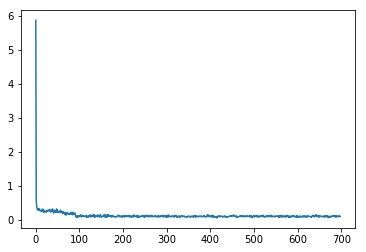

agent_value: 1.00022483076
input_value: 1.00008057696
output_value: 0.999886801567
mean diff: 0.092
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


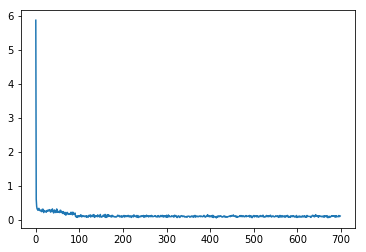

agent_value: 0.999771364515
input_value: 1.00123071299
output_value: 1.00100384571
mean diff: 0.108
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


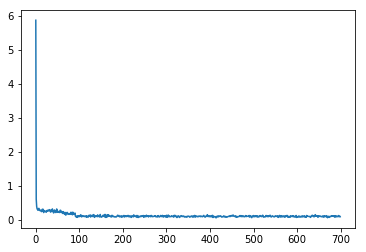

agent_value: 1.00002224548
input_value: 1.00065319874
output_value: 1.00005419139
mean diff: 0.086
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


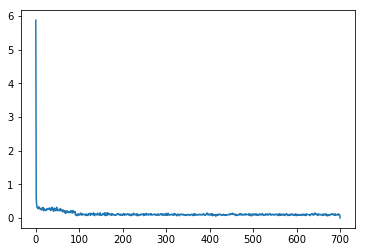

agent_value: 1.00000123755
input_value: 0.999997121028
output_value: 0.999999777803
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


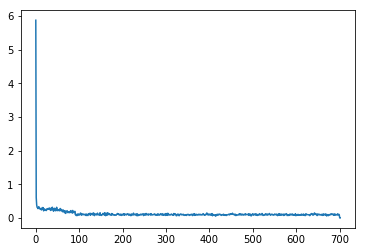

agent_value: 1.00000003444
input_value: 1.00000002718
output_value: 1.00000003881
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


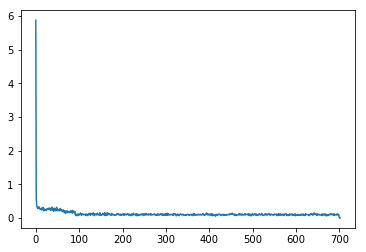

agent_value: 1.00000000066
input_value: 1.00000000214
output_value: 1.00000000042
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


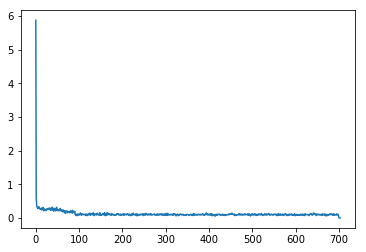

agent_value: 1.00000000013
input_value: 1.00000000001
output_value: 1.00000000003
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


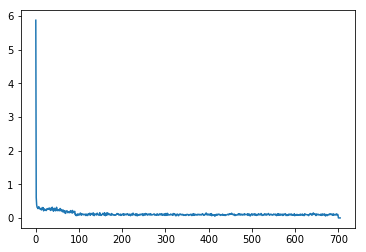

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


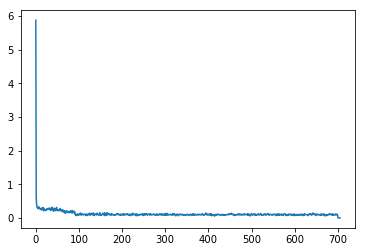

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


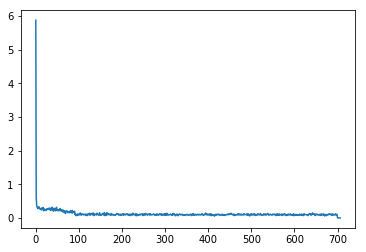

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


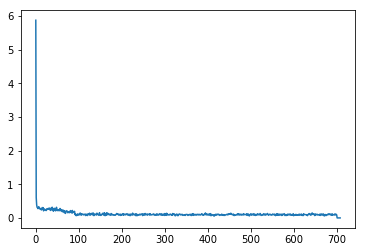

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


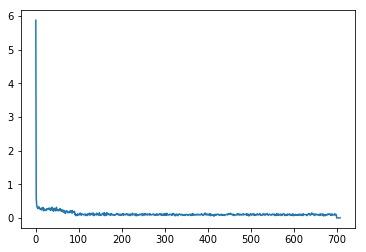

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


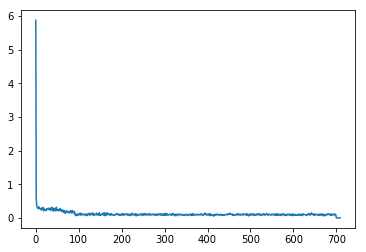

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


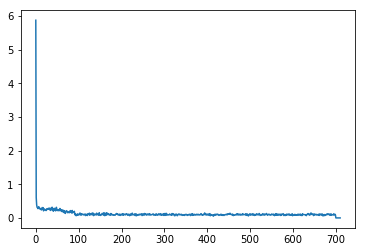

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


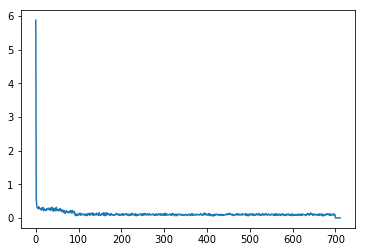

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


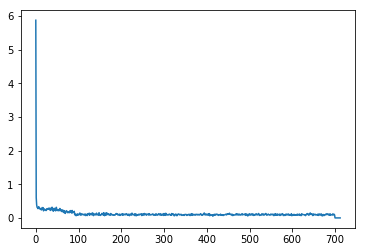

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


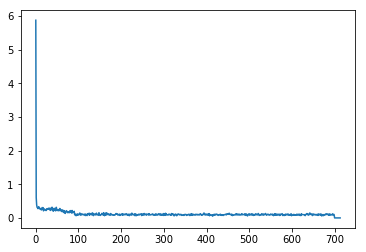

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


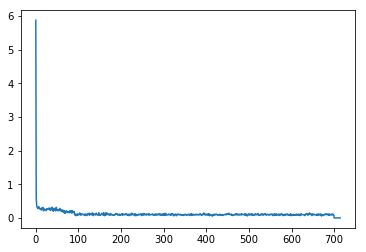

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


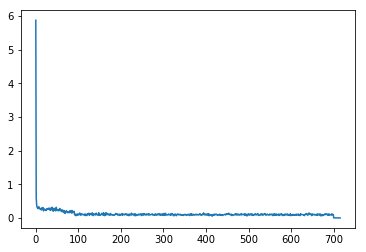

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


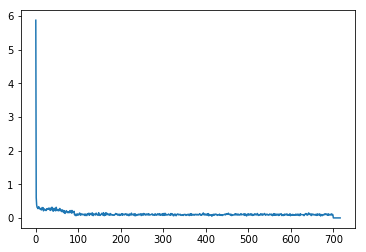

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


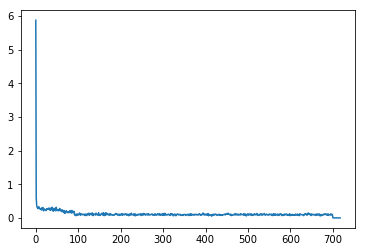

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


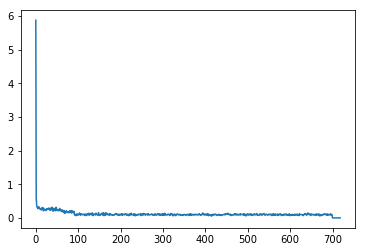

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


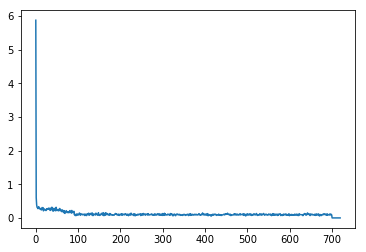

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


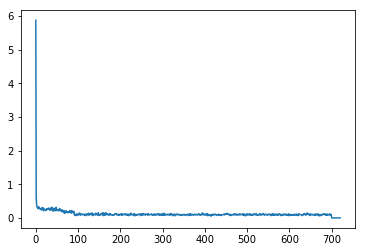

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


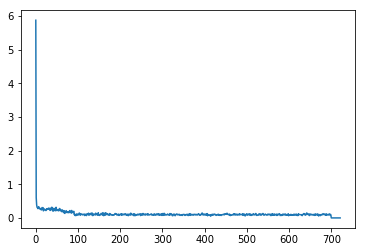

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


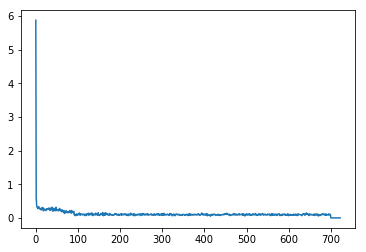

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


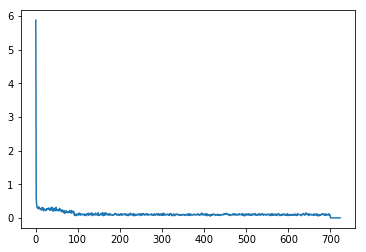

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


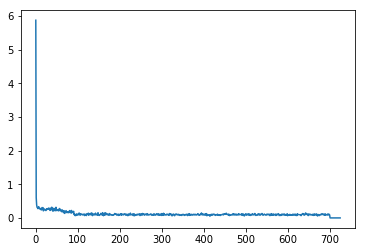

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


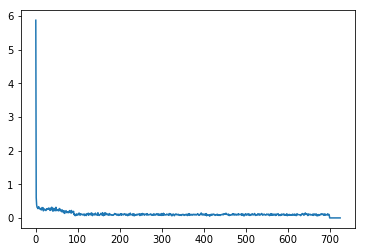

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


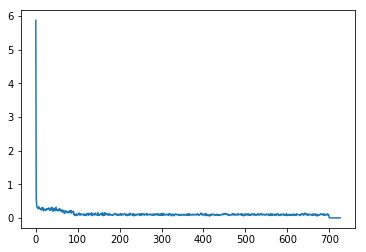

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


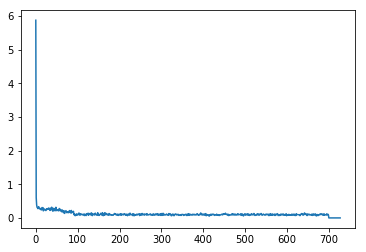

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


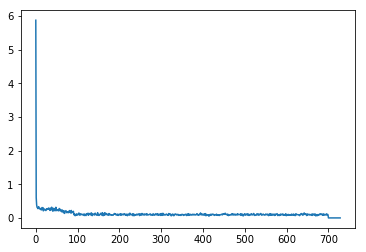

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


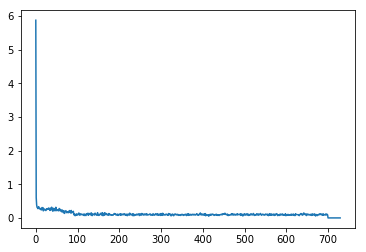

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


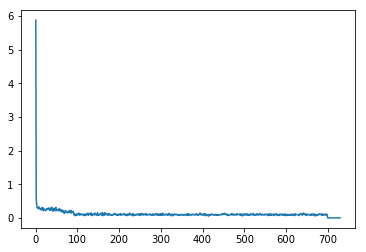

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


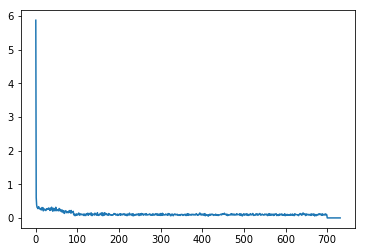

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


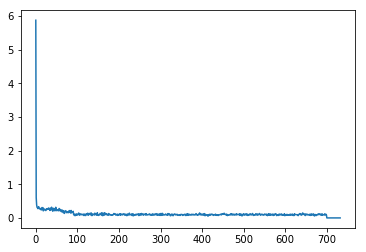

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


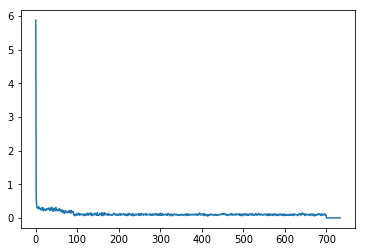

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


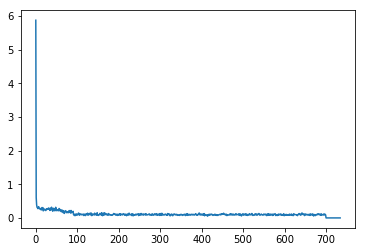

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


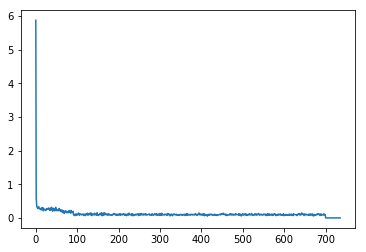

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


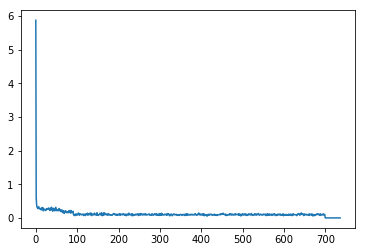

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


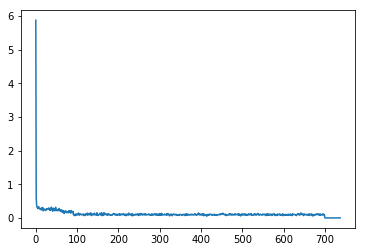

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


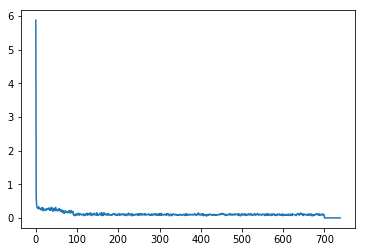

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


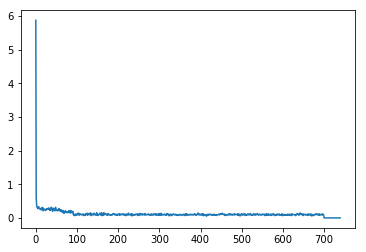

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


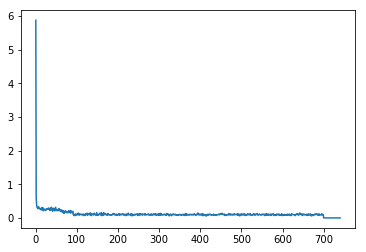

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


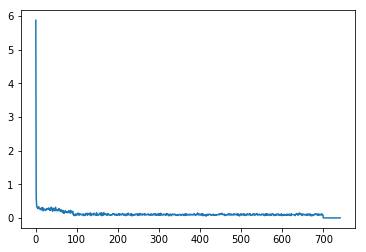

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


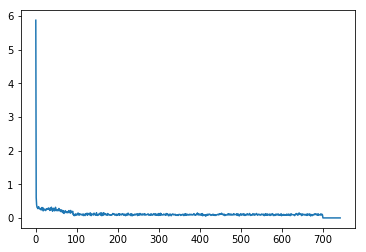

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


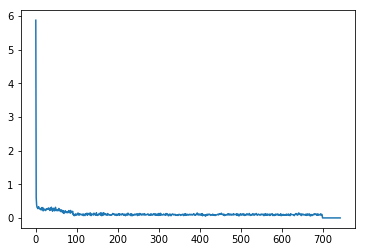

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


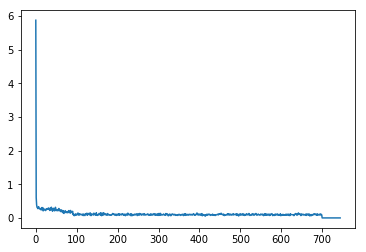

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


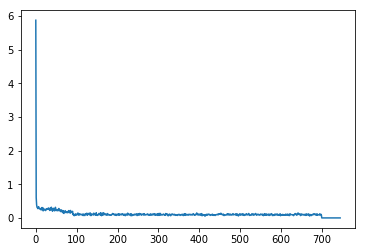

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


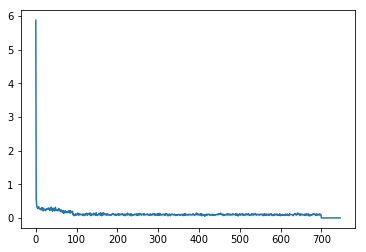

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


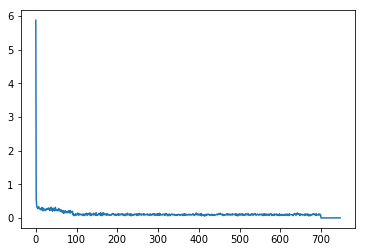

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


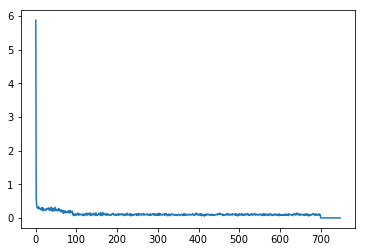

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


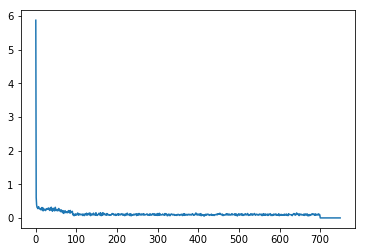

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


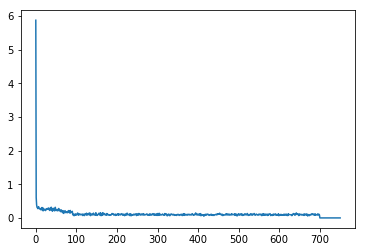

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


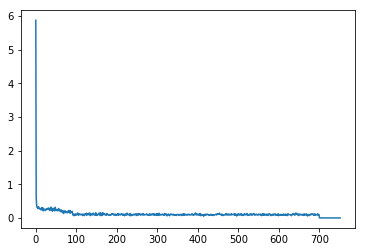

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


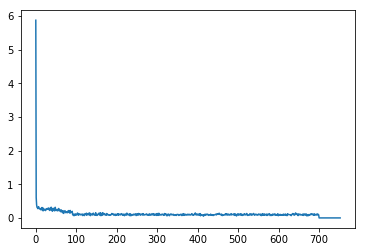

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


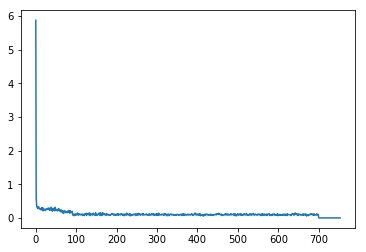

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


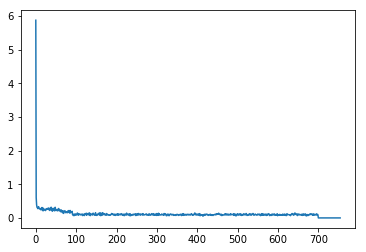

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


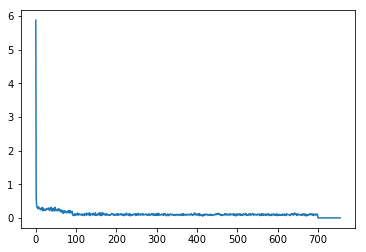

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


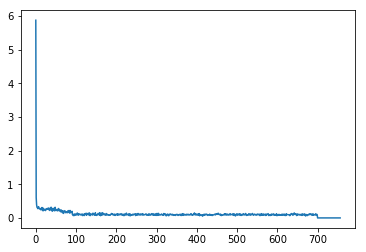

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


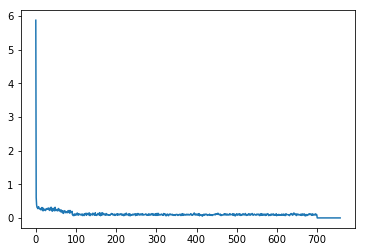

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


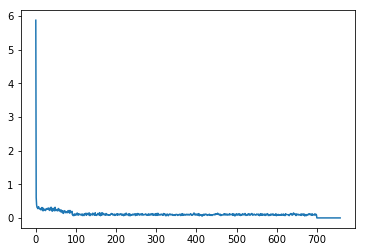

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


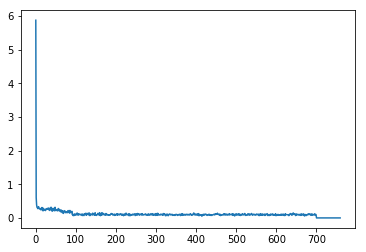

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


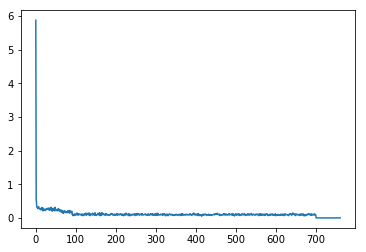

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


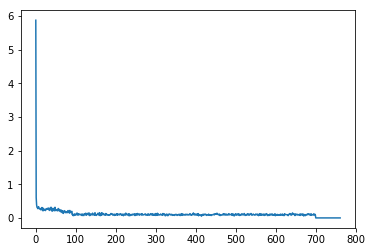

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


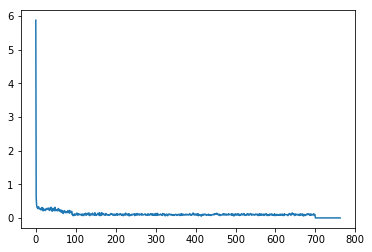

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


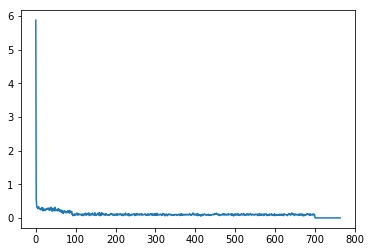

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


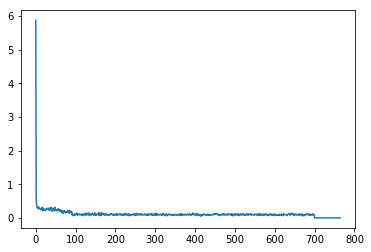

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


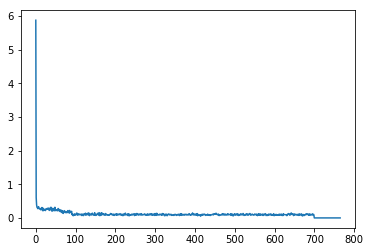

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


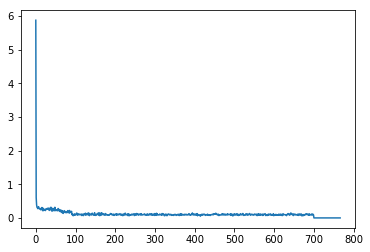

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


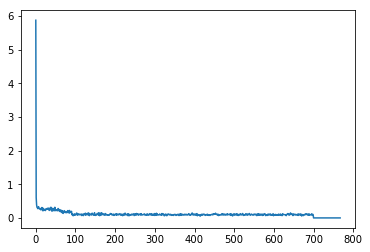

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


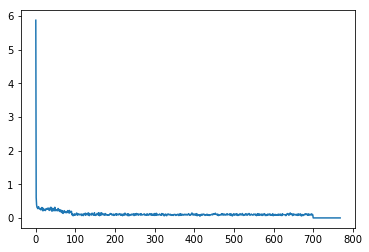

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


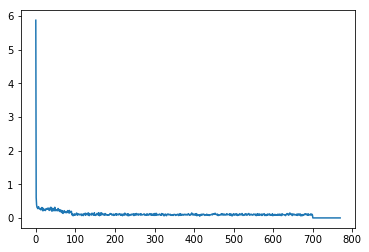

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


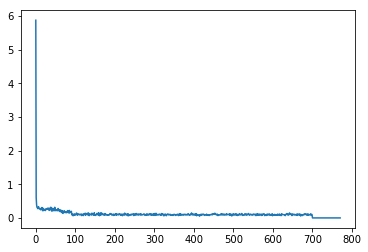

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


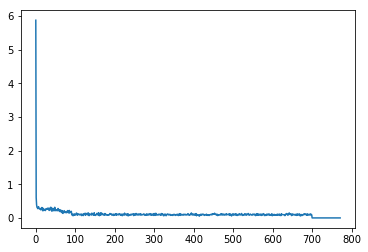

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


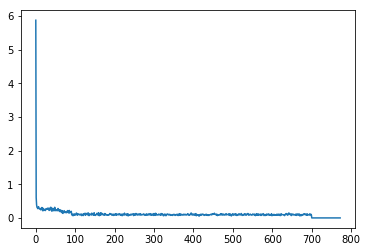

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


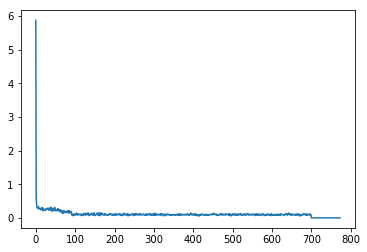

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


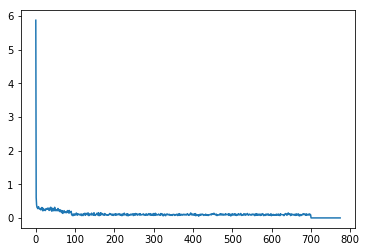

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


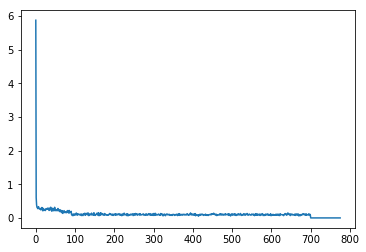

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


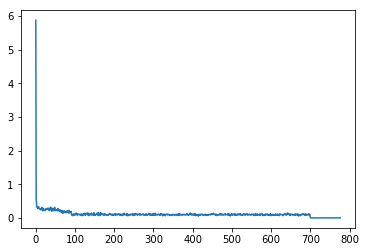

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


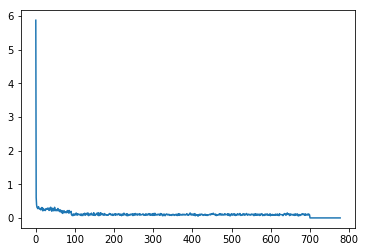

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


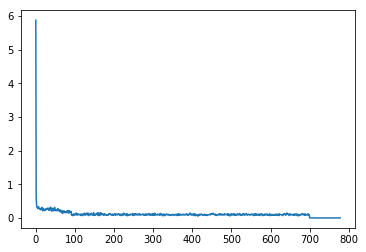

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


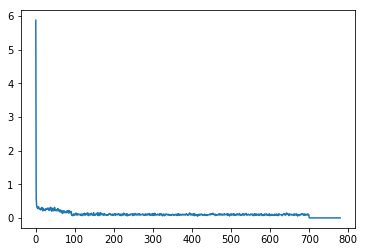

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


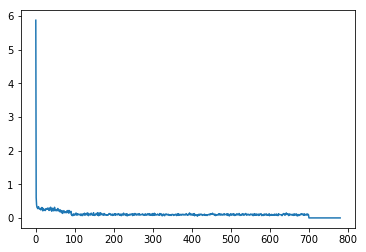

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


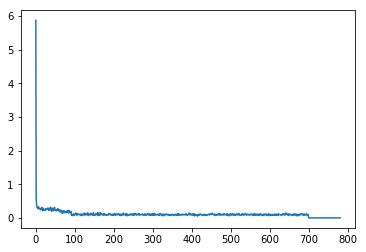

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


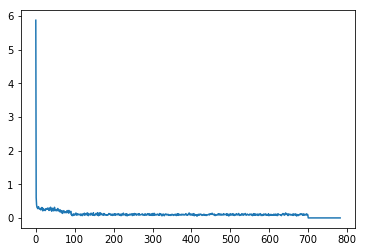

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


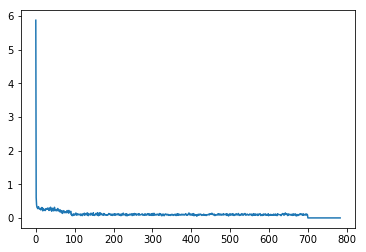

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


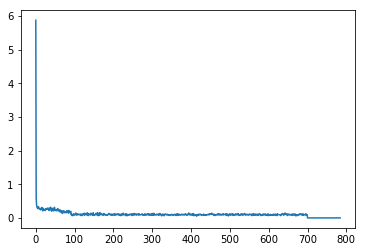

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


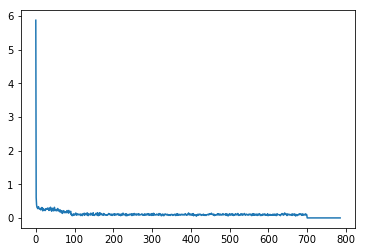

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


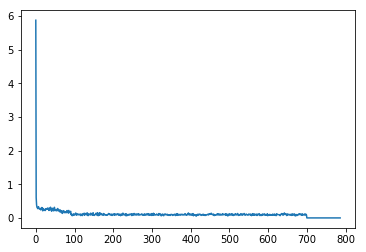

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


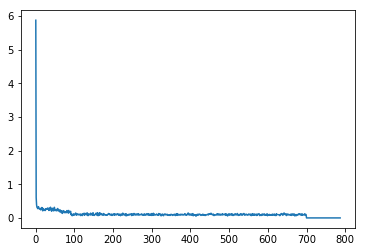

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


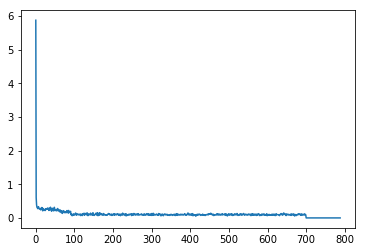

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


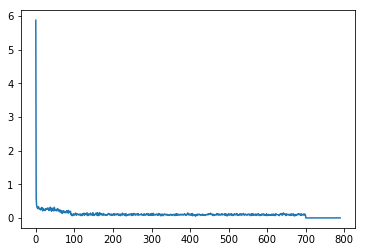

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


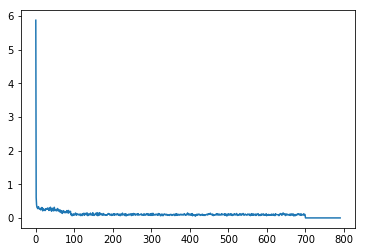

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


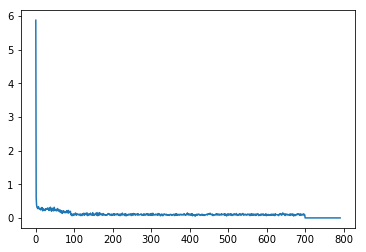

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


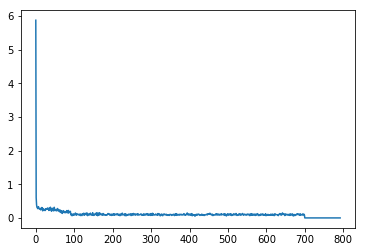

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


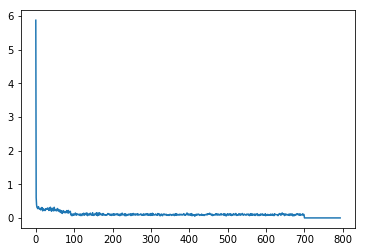

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


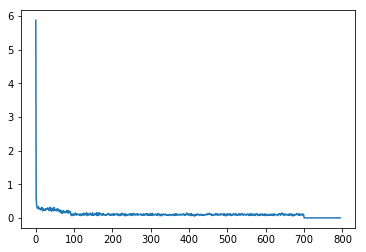

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


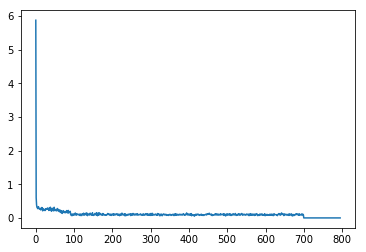

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


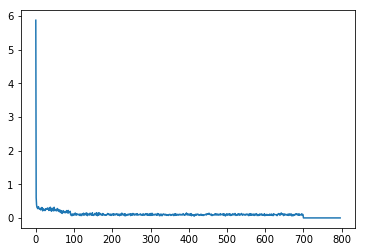

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


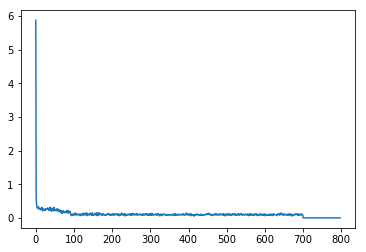

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


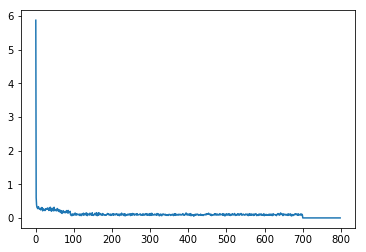

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


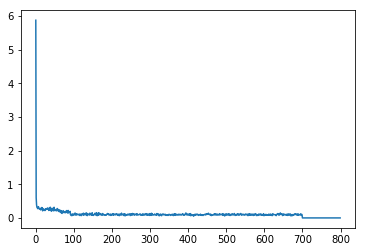

agent_value: 1.0
input_value: 1.0
output_value: 1.0
mean diff: 0.0
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


In [25]:
LTM_obj2, agent2, i_gate2, o_gate2, WM2 = I_gate_model([5,5],800000,1000)

In [26]:
WM_Objs = [LTM_obj2, agent2, i_gate2, o_gate2, WM2]

In [ ]:
Testing_Phase(WM_Objs,[5,5],5000,100)

# Testing Stuff

In [ ]:
n = 10
LTM_obj = hrr.LTM(n,True)
#agent = gate.Q_learning(n,LTM_obj,epsilon=0.05,bias=1)
agent = gate.Q_learning(n,LTM_obj,epsilon=0.01,bias=1)

In [ ]:
agent.get_weights()

In [ ]:
W = hrr.hrr(n)

In [ ]:
agent2 = gate.Q_learning(n,LTM_obj,epsilon=0.01,bias=1, W=W)

In [ ]:
agent2.get_weights()

In [ ]:
agent3 = gate.Q_learning(n,LTM_obj,epsilon=0.01,bias=1)

In [ ]:
my_W = agent3.get_weights()
print(my_W)

In [ ]:
fname = "weight_test.txt"
datalist = my_W
store_weights(fname,datalist)

In [ ]:
new_W = load_weights(fname)

In [ ]:
new_W

In [ ]:
new_W[0]

In [ ]:
a=2
b=3

# Transfer Task

In [29]:
def Transfer_Task(WM_Objs,state_size,nepisodes,stat_window):
    n = 1024
    #n = 256
    nagent_actions = 4
    gate_actions = 2
    ncolors = 3
    nslots = 1
    nroles = 1
    nrolestates = 2
    Closed,Open = 0,1
    agent_actions = ['up','down','left','right']
    colors = ['red','green','purple',''] # external colors
    nothing = len(colors)-1
    #wm_colors = ['wm_red','wm_green',''] # internal colors
    roles = ['role_avail','role_unavail']
    gate_actions = ['closed','open']
    gateclosed = 'gateclosed'
    gateopen = 'gateopen'
    
    nrows,ncols = state_size
    state_table = state_machine.state_machine.generate_state_table_bottle(nrows,ncols)
    
    #WA = load_weights("IO_Model_agent_weights.txt")
    #WI = load_weights("IO_Model_input_weights.txt")
    #WO = load_weights("IO_Model_output_weights.txt")
    
    LTM_obj = WM_Objs[0]
    #agent = gate.Q_learning(n,LTM_obj,epsilon=0.05,bias=1)
    agent = WM_Objs[1]
    i_gate = WM_Objs[2]
    o_gate = WM_Objs[3]
    WM = WM_Objs[4]
    s_mac = state_machine.state_machine(state_table)
    nsteps = 100
    goal = [ [0,0],[0,ncols-1],[0,2] ]
    value_function = np.zeros((nrows,ncols)) # store Q values for statitics
     # track performance
    opt_array = []
    diff_array = []
    t1 = ""
    
    handhold = 400000
    anneal = 500000
    
    o_gate_correct = 0 # stats for output gate
    o_gate_total = 0 # stats for output gate
    o_gate_correct_shared = 0
    o_gate_correct_non = 0
    shared_total = 0
    non_total = 0
    o_gate_stat = []
    mean_o_gate = []
    accuracy = []
    acc_array = []
    for episode in range(nepisodes):
        
        count = 0
        #t1 = str(count)
        t1 = "t1"
        row = random.randrange(2,nrows) # get random row for state (in shared area)
        col = random.randrange(0,ncols) # get random col for state
        cur_loc = [row,col] # current location of agent
        color_signal = random.randrange(0,ncolors) # get random color
        color = color_signal # used for reward because color signal may change
        #r = reward(cur_loc,colors[color],state_size) if color!=nothing else 0
        
        if episode == anneal:
            agent.epsilon,i_gate.epsilon,o_gate.epsilon = 0,0,0
        #optimal_steps = optimal_path_length(cur_loc,color_signal) # get optimal steps to goal 
        optimal_steps = optimal_path_length_bottle(cur_loc,color_signal) # get optimal steps to goal 
        state = (state_table[row][col])["state"] # current state
        
        role_i = 0 if color_signal!=nothing else 1
        slot = 0
        igate_restrict = [0,1] # restricted set 
        #ogate_restrict = [0,1] # restricted set
        ogate_restrict = [1] # restricted set
        #igate_restrict = [1] if episode < 20000 else [0,1] # hand holding
        #ogate_restrict = [1] if episode < handhold else [0,1] # hand holding
        '''
        if episode < handhold: # hand holding
            ogate_restrict = [0] if row >= 2 else [1]
        else:
            ogate_restrict = [0,1]
        '''
        
        WM.flush_all_wm_maint()
        #print("cue:",colors[color_signal])
        #print("role_i:",roles[role_i])
        i_gate_input = roles[role_i]+'*'+state+'*'+t1
        LTM_obj.encode(i_gate_input)
        i_gate_state,i_value,i_max,i_input,i_values = i_gate.action(i_gate_input,gate_actions,igate_restrict)
        WM.wm_in_flow(i_gate_state,slot,color_signal) # control flow of wm contents
        #print("i_gate:",i_gate_state)
        #print("wm_in:",WM.get_one_wm_maint(slot))
        role_o = 1 if WM.wm_maint_slot_is_empty(slot) else 0
        #print("role_o:",roles[role_o])
        o_gate_input = roles[role_o]+'*'+state+'*'+t1
        LTM_obj.encode(o_gate_input)
        o_gate_state,o_value,o_max,o_input,o_values = o_gate.action(o_gate_input,gate_actions,ogate_restrict)
        WM.wm_out_flow(o_gate_state,slot) # wm out contents for given slots
        wm_out = WM.get_one_wm_output(slot)
        #print("o_gate:",o_gate_state)
        #print("wm_out:",WM.get_one_wm_output(slot))
        #print("\n\n")
        
        if o_gate_state == Closed:
            agent_input = gateclosed+'*'+colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
            LTM_obj.encode(agent_input)
        else:
            agent_input = colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
            LTM_obj.encode(agent_input)
        
        #agent_input = colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
        action_restrict = (state_table[row][col])["action_restrict"]# get restricted action set
        action,a_value,a_max,a_input,a_values = agent.action(agent_input,agent_actions,action_restrict) # agent action
        #print("agent_value: ",a_value)
        #print("input_value: ",i_value)
        #print("output_value:",o_value)
        
        o_gate_correct_shared += 1 if o_gate_state == Closed else 0
        shared_total += 1
        
        i_gate.set_eligibility_zero()
        o_gate.set_eligibility_zero()
        agent.set_eligibility_zero() # set eligibility trace to zero
        WM.flush_all_wm_output()
        count += 1
        for step in range(nsteps):
            
            #t1 = str(count)
            t1 = ''
            r = reward(cur_loc,colors[color],state_size) if color!=nothing else 0
            #r = punishment(cur_loc,colors[color],state_size) if color!=nothing else -1
            #print(state)
            if color!=nothing and cur_loc == goal[color]:
                i_gate.eligibility_trace_update(i_input)
                o_gate.eligibility_trace_update(o_input)
                agent.eligibility_trace_update(a_input)
                i_gate.td_update_goal(r,i_value)
                o_gate.td_update_goal(r,o_value)
                agent.td_update_goal(r,a_value)
                #print('goal!!!')
                break
                
            p_a_input = agent_input
            p_i_input = i_gate_input
            p_o_input = o_gate_input
            p_a_action = action
            p_i_action = i_gate_state
            p_o_action = o_gate_state
            p_action_restrict = action_restrict
            p_igate_restrict = igate_restrict
            p_ogate_restrict = ogate_restrict
        
            p_loc = cur_loc
            p_i_value = i_value # Q val for input gate
            p_i_max = i_max
            p_o_value = o_value # Q val for output gate
            p_o_max = o_max
            p_a_value = a_value # Q val for agent
            p_a_max = a_max
            
            # update eligibility traces
            i_gate.eligibility_trace_update(i_input)
            o_gate.eligibility_trace_update(o_input)
            agent.eligibility_trace_update(a_input)
            # move agent
            state,cur_loc = s_mac.move(p_loc,action)
            row,col = cur_loc[0],cur_loc[1]
            color_signal = 2 # turn off cue
            
            role_i = 0 if color_signal!=nothing else 1
            igate_restrict = [0] # restricted set 
            ogate_restrict = [1] # restricted set
            #ogate_restrict = [1] if episode < handhold else [0,1] # hand holding
            '''
            if episode < handhold: # hand holding
                ogate_restrict = [0] if row >= 2 else [1]
            else:
                ogate_restrict = [0,1]
            '''
            #
            #print("cue:",colors[color_signal])
            #print("role_i:",roles[role_i])
            i_gate_input = roles[role_i]+'*'+state+'*'+t1
            LTM_obj.encode(i_gate_input)
            i_gate_state,i_value,i_max,i_input,i_values = i_gate.action(i_gate_input,gate_actions,igate_restrict)
            #print("i_gate:",i_gate_state)
            WM.wm_in_flow(i_gate_state,slot,color_signal) # control flow of wm contents
            #print("wm_in:",WM.get_one_wm_maint(slot))
            role_o = 1 if WM.wm_maint_slot_is_empty(slot) else 0
            o_gate_input = roles[role_o]+'*'+state+'*'+t1
            LTM_obj.encode(o_gate_input)
            o_gate_state,o_value,o_max,o_input,o_values = o_gate.action(o_gate_input,gate_actions,ogate_restrict)
            #print("role_o:",roles[role_o])
            #print("o_gate:",o_gate_state)
            WM.wm_out_flow(o_gate_state,slot) # wm out contents for given slots
            wm_out = WM.get_one_wm_output(slot)
            #print("wm_out:",wm_out)
            #print("\n\n")
            
            if o_gate_state == Closed:
                agent_input = gateclosed+'*'+colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
                LTM_obj.encode(agent_input)
            else:
                agent_input = colors[color_signal]+'*'+state+'*'+wm_out+'*'+t1
                LTM_obj.encode(agent_input)
            
            #agent_input = colors[color_signal]+'*'+state+'*'+wm_out
            action_restrict = (state_table[row][col])["action_restrict"]# get restricted action set
            action,a_value,a_max,a_input,a_values = agent.action(agent_input,agent_actions,action_restrict) # agent action
            # ----------------------------------
            # Bias gates to stay in a state for long periods of time
            
            a_beta = 0
            '''
            if a_value > 0:
                if p_a_action == action:
                    a_beta = 0
                else:
                    a_beta = 1
            else:
                if p_a_action == action:
                    a_beta = 1
                else:
                    a_beta = 0
            '''
            o_beta = 0
            '''
            if a_value > 0:
                if p_o_action == o_gate_state:
                    o_beta = 0
                else:
                    o_beta = 1
            else:
                if p_o_action == o_gate_state:
                    o_beta = 1
                else:
                    o_beta = 0
            '''       
            i_beta = 0
            '''
            if a_value > 0:
                if p_i_action == i_gate_state:
                    i_beta = 0
                else:
                    i_beta = 1
            else:
                if p_i_action == i_gate_state:
                    i_beta = 1
                else:
                    i_beta = 0
            '''
            # -------------------------------------
            if row >= 2:
                o_gate_correct_shared += 1 if o_gate_state == Closed else 0
                shared_total += 1
            else:
                o_gate_correct_non += 1 if o_gate_state == Open else 0
                non_total += 1
            
            
            '''
            agent.td_update(r,a_value,p_a_value)
            o_gate.td_update(r,a_value,p_o_value)
            i_gate.td_update(r,a_value,p_i_value)
            '''
            
            agent.td_update_transfer(r,a_value,p_a_value,a_beta)
            o_gate.td_update_transfer(r,a_value,p_o_value,o_beta)
            i_gate.td_update_transfer(r,a_value,p_i_value,i_beta)
            
            
            WM.flush_all_wm_output()
            count += 1
        if color != nothing:    
            step_diff = abs(step-optimal_steps)
            #print(step_diff)
            opt_array.append(step_diff)
            if step_diff == 0:
                acc_array.append(1)
            else:
                acc_array.append(0)
            
        if (episode+1)%stat_window == 0:
            # print performance
            mean_diff = sum(opt_array)/len(opt_array)
            diff_array.append(mean_diff)
            mean_acc = sum(acc_array)/len(acc_array)
            accuracy.append(mean_acc)
            plt.plot(diff_array)
            plt.show()
            plt.plot(accuracy)
            plt.show()
            opt_array = []
            acc_array = []
            print("agent_value:",a_value)
            print("input_value:",i_value)
            print("output_value:",o_value)
            print("mean diff:",mean_diff)
            print("mean accuracy:",mean_acc)
            ###################
            if shared_total > 0:
                print("mean o_gate_shared:",o_gate_correct_shared/shared_total)
            if non_total > 0:
                print("mean o_gate_non:",o_gate_correct_non/non_total)
            o_gate_correct_shared = 0
            o_gate_correct_non = 0
            shared_total = 0
            non_total = 0
            o_gate_total = 0
    fname1 = "I_model_TransferTask_error_s"+str(n)+".dat"
    store_weights(fname1,diff_array) # stores error points to file
    fname2 = "I_model_TranserTask_accuracy_s"+str(n)+".dat"
    store_weights(fname2,accuracy) # stores error points to file
    #WA,fname1 = agent.get_weights(), "IO_Model_agent_weights_Transfer.txt" # agent weights
    #WO,fname2 = o_gate.get_weights(), "IO_Model_output_weights_Transfer.txt"# output gate weights
    #WI,fname3 = i_gate.get_weights(), "IO_Model_input_weights_Transfer.txt"# input gate weights
    #store_weights(fname1,WA) # store agent weights
    #store_weights(fname2,WO) # store output gate weights
    #store_weights(fname3,WI) # store input gate weights
    return LTM_obj, agent, i_gate, o_gate, WM

# Call Transfer Task

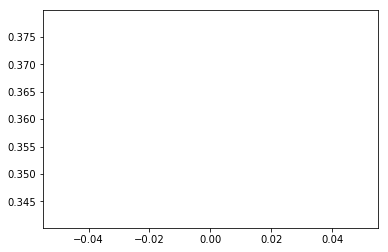

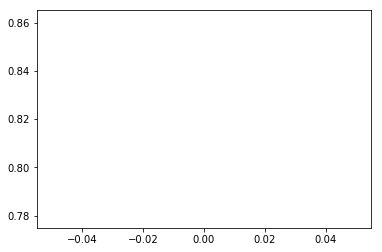

agent_value: 1.0
input_value: 1.00468165004
output_value: 0.99970820321
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


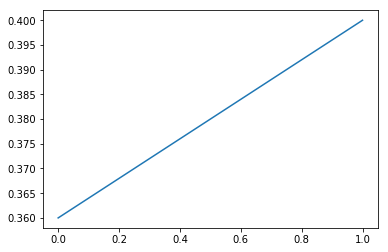

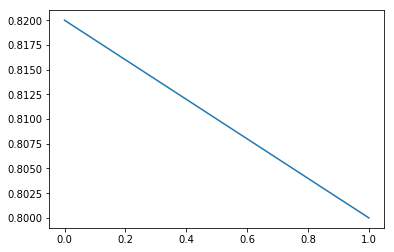

agent_value: 1.0
input_value: 1.00196199007
output_value: 0.999760284744
mean diff: 0.4
mean accuracy: 0.8
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


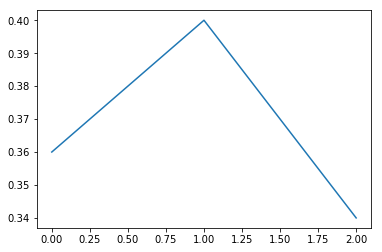

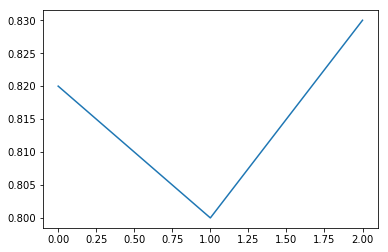

agent_value: 1.0
input_value: 0.996858414505
output_value: 1.00095038498
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


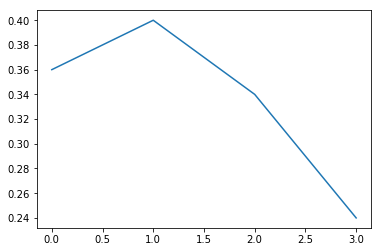

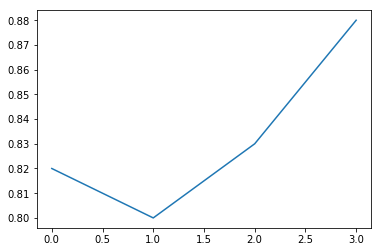

agent_value: 1.0
input_value: 1.00001914038
output_value: 1.00032197479
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


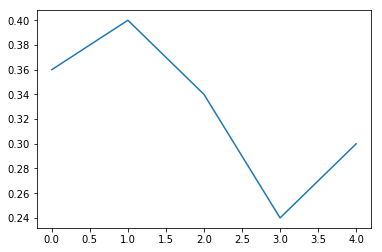

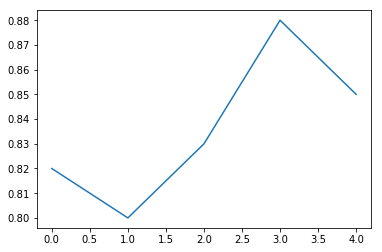

agent_value: 1.0
input_value: 1.00375404936
output_value: 1.00129224978
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


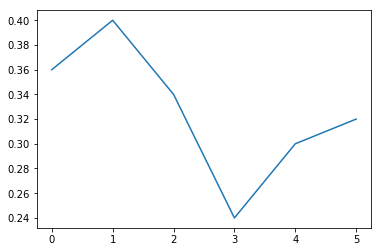

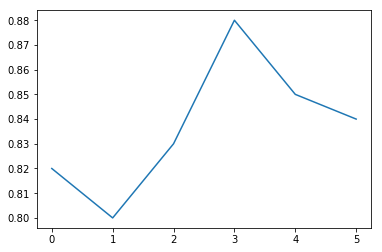

agent_value: 1.0
input_value: 0.992101117948
output_value: 0.999973758827
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


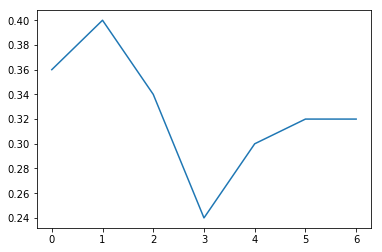

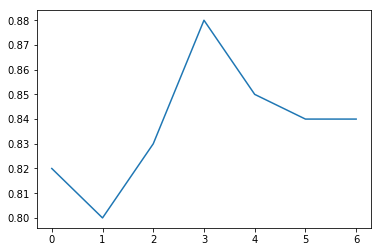

agent_value: 1.0
input_value: 1.00004664819
output_value: 1.00035348063
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


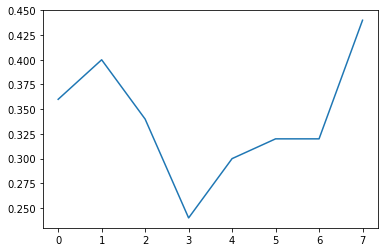

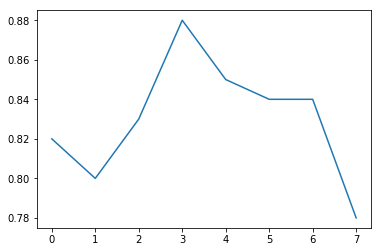

agent_value: 1.0
input_value: 1.00717959565
output_value: 0.999860402323
mean diff: 0.44
mean accuracy: 0.78
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


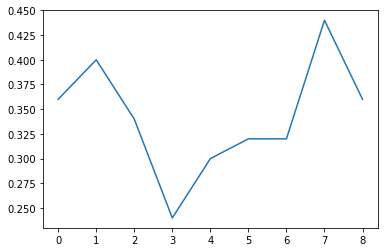

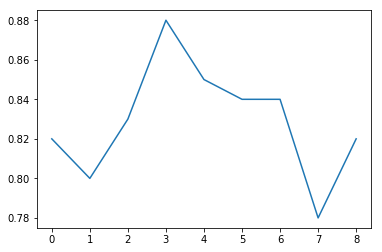

agent_value: 1.0
input_value: 0.995120923939
output_value: 0.999825022046
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


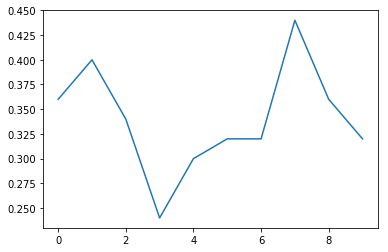

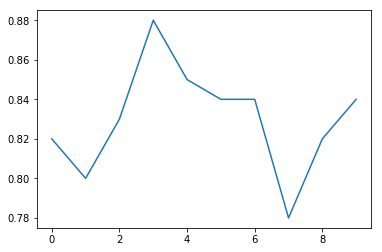

agent_value: 1.0
input_value: 1.00014771488
output_value: 1.00020075983
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


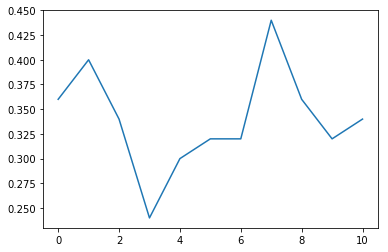

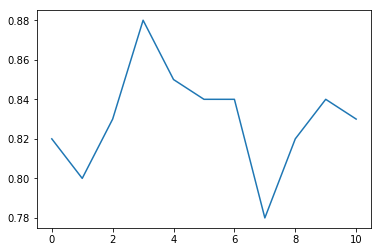

agent_value: 1.0
input_value: 0.993995869129
output_value: 0.998187082713
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


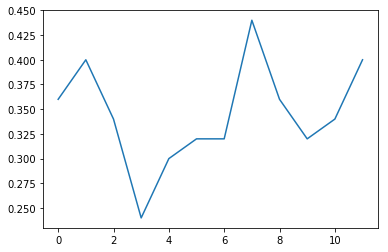

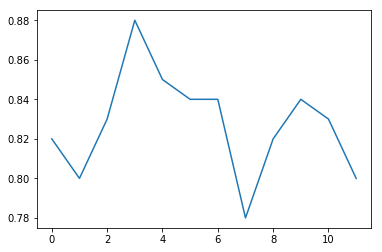

agent_value: 1.0
input_value: 0.997230293221
output_value: 1.00048604843
mean diff: 0.4
mean accuracy: 0.8
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


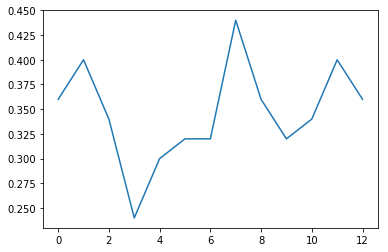

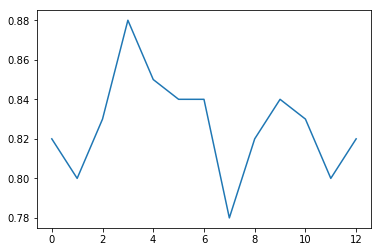

agent_value: 1.0
input_value: 1.00287353815
output_value: 0.999458897542
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


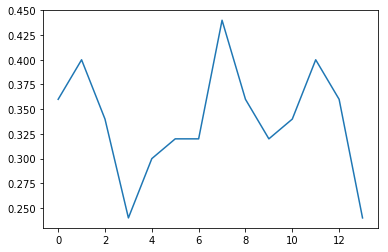

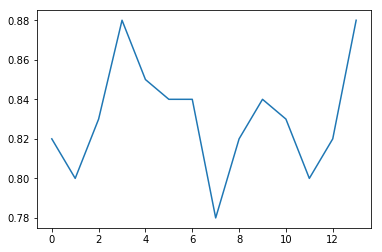

agent_value: 1.0
input_value: 0.999248344355
output_value: 1.00074264931
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


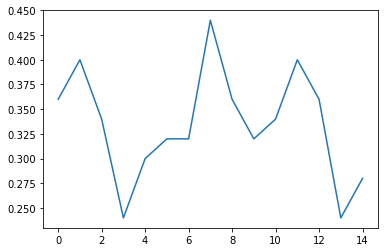

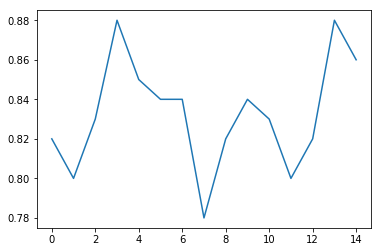

agent_value: 1.0
input_value: 1.00111405491
output_value: 1.00037448686
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


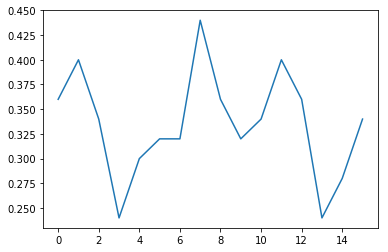

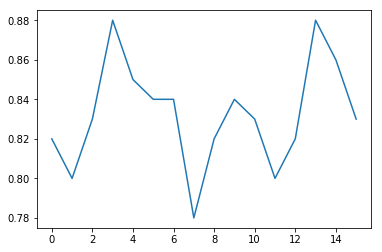

agent_value: 1.0
input_value: 1.00411311141
output_value: 1.00076554418
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


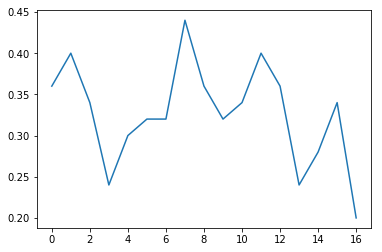

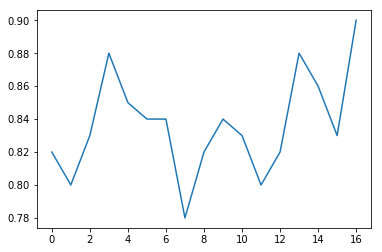

agent_value: 1.0
input_value: 1.00449600988
output_value: 0.999636189
mean diff: 0.2
mean accuracy: 0.9
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


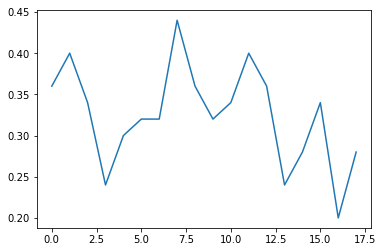

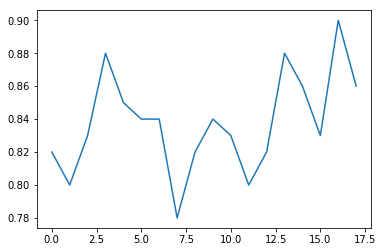

agent_value: 1.0
input_value: 1.00713804696
output_value: 0.999767840547
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


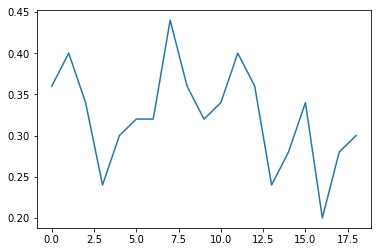

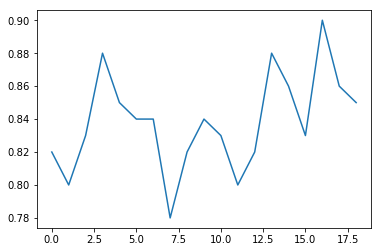

agent_value: 1.0
input_value: 1.00586858505
output_value: 1.00026021795
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


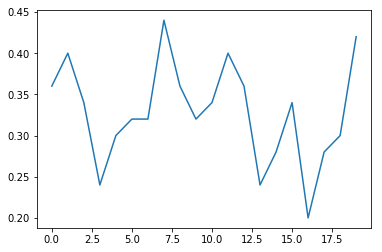

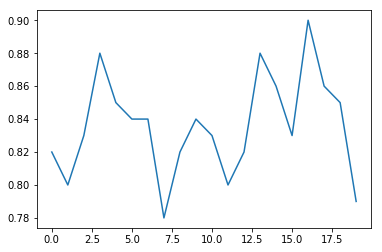

agent_value: 1.0
input_value: 0.999095498486
output_value: 1.00055149438
mean diff: 0.42
mean accuracy: 0.79
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


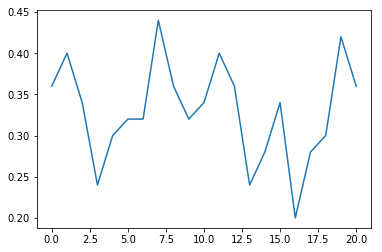

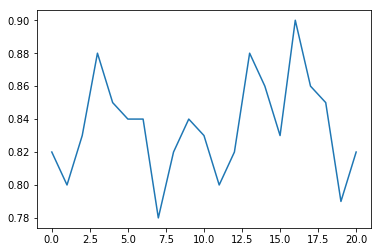

agent_value: 1.0
input_value: 0.997697585892
output_value: 0.998685362571
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


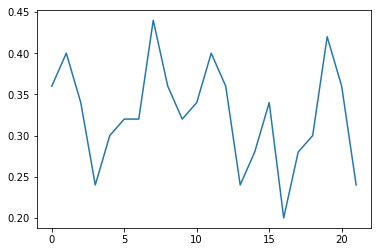

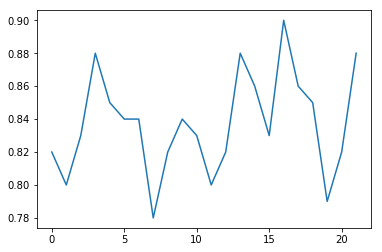

agent_value: 1.0
input_value: 1.00655790173
output_value: 1.00017131393
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


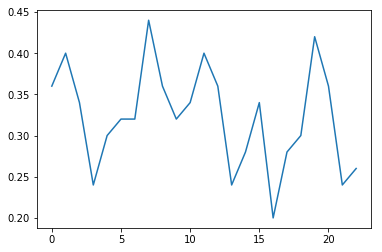

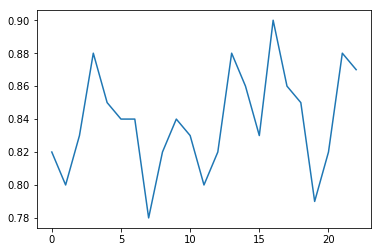

agent_value: 1.0
input_value: 0.997707266569
output_value: 0.998979723213
mean diff: 0.26
mean accuracy: 0.87
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


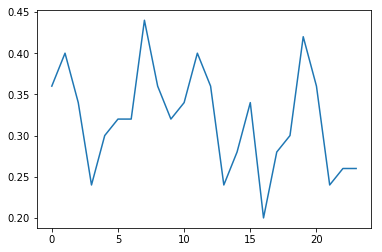

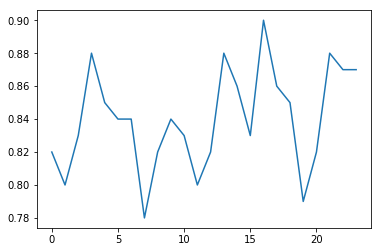

agent_value: 1.0
input_value: 0.997730360508
output_value: 0.999797849924
mean diff: 0.26
mean accuracy: 0.87
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


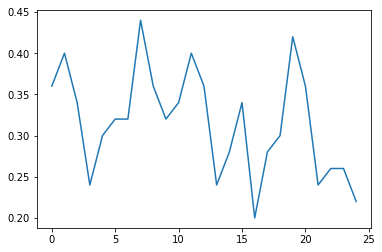

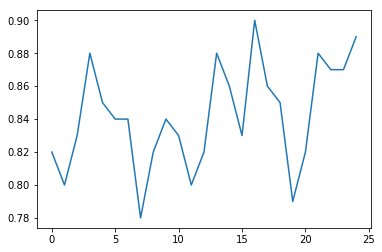

agent_value: 1.0
input_value: 1.00921548961
output_value: 1.0005841641
mean diff: 0.22
mean accuracy: 0.89
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


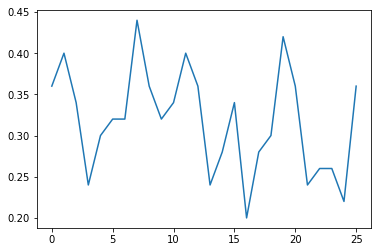

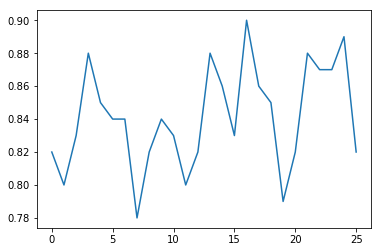

agent_value: 1.0
input_value: 0.989546329692
output_value: 1.00011601919
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


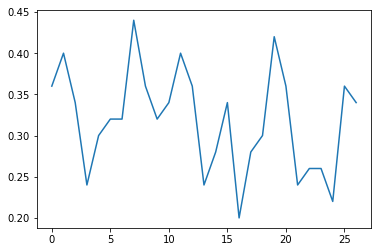

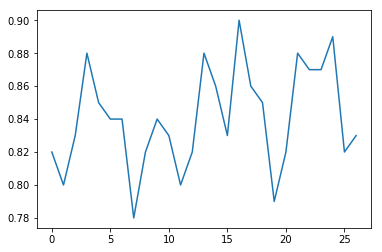

agent_value: 1.0
input_value: 0.995608346641
output_value: 0.999830912637
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


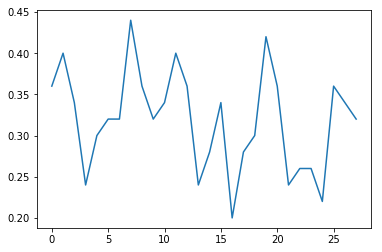

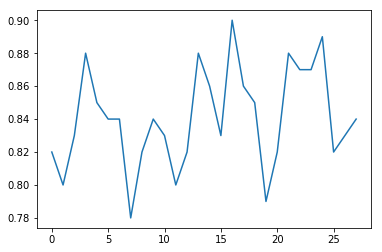

agent_value: 1.0
input_value: 1.00086446696
output_value: 1.00005305264
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


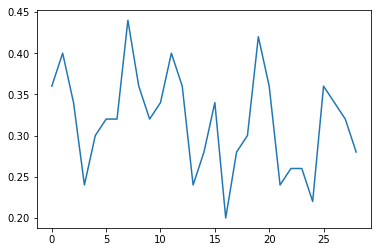

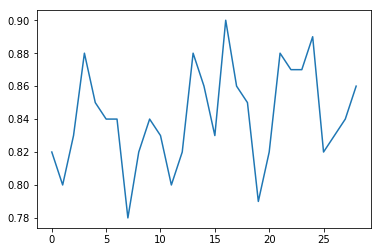

agent_value: 1.0
input_value: 0.997507002469
output_value: 0.999894942854
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


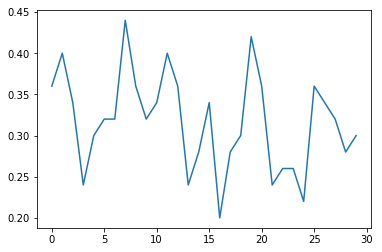

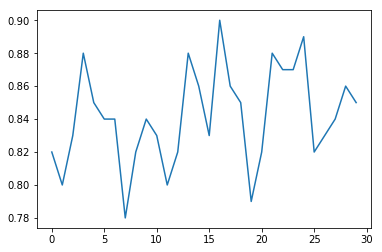

agent_value: 1.0
input_value: 1.00224544685
output_value: 1.00098164229
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


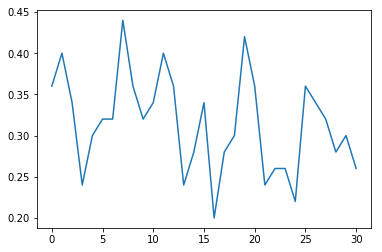

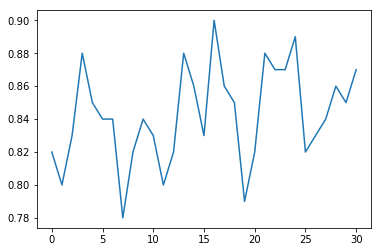

agent_value: 1.0
input_value: 0.993265799018
output_value: 0.999737408147
mean diff: 0.26
mean accuracy: 0.87
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


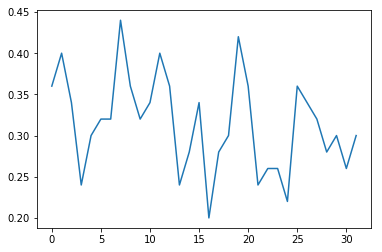

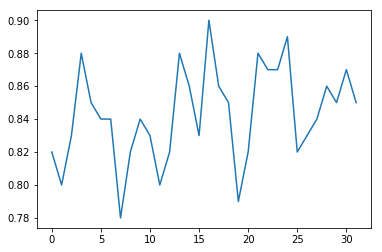

agent_value: 1.0
input_value: 0.995376518074
output_value: 1.00079780017
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


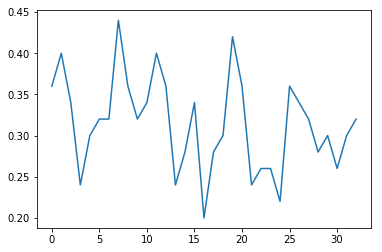

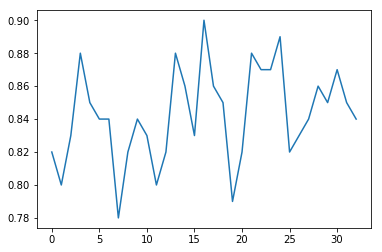

agent_value: 1.0
input_value: 1.00047965076
output_value: 0.998972252809
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


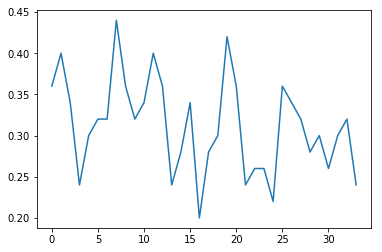

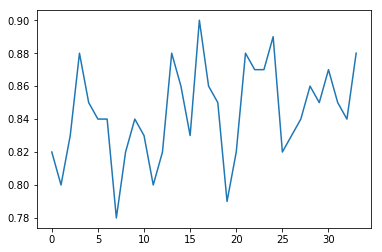

agent_value: 1.0
input_value: 0.997525335923
output_value: 1.00075018594
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


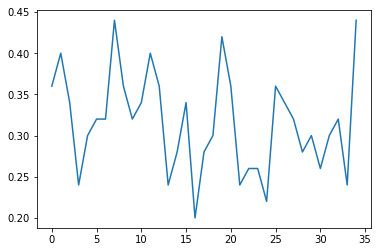

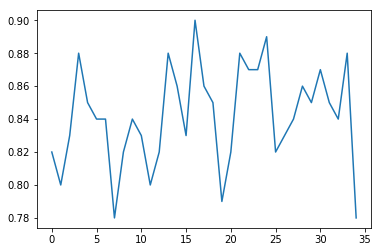

agent_value: 1.0
input_value: 0.997775021614
output_value: 0.997267694248
mean diff: 0.44
mean accuracy: 0.78
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


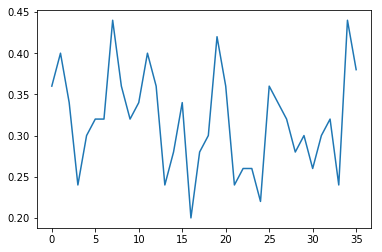

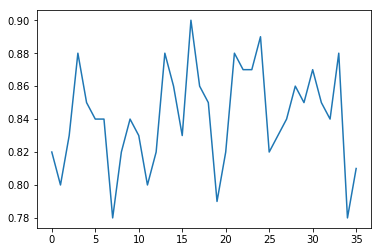

agent_value: 1.0
input_value: 0.998449480931
output_value: 1.00131385375
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


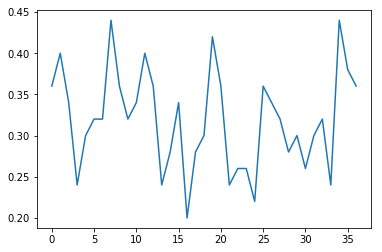

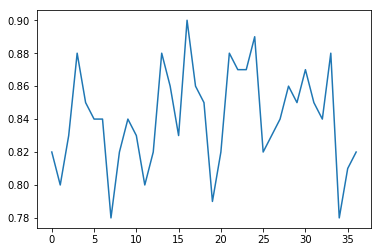

agent_value: 1.0
input_value: 1.00287415604
output_value: 0.999120325202
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


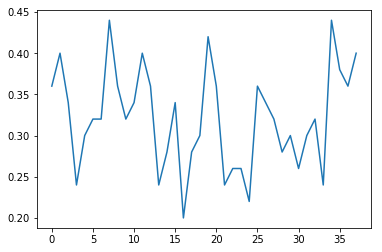

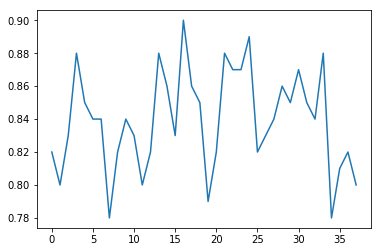

agent_value: 1.0
input_value: 1.00183402244
output_value: 0.998468319496
mean diff: 0.4
mean accuracy: 0.8
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


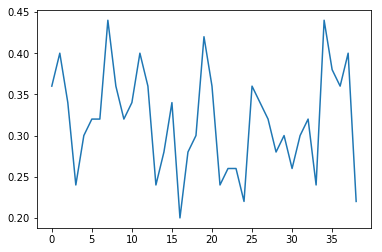

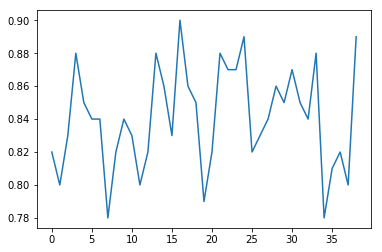

agent_value: 1.0
input_value: 1.00053136114
output_value: 0.99934997209
mean diff: 0.22
mean accuracy: 0.89
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


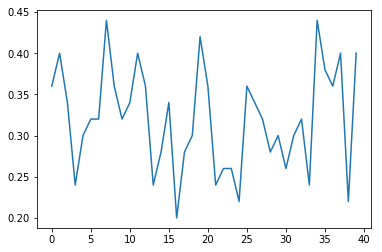

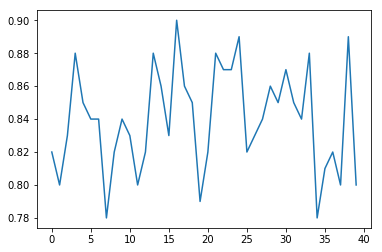

agent_value: 1.0
input_value: 1.00278644692
output_value: 1.00099106312
mean diff: 0.4
mean accuracy: 0.8
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


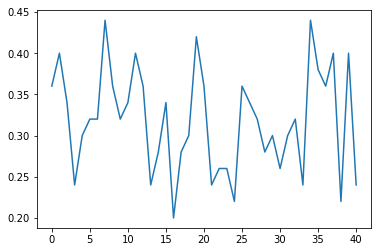

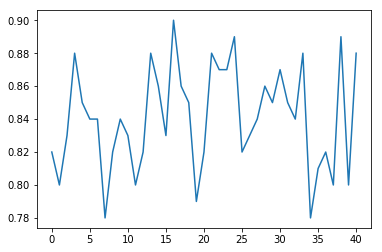

agent_value: 1.0
input_value: 0.997550191973
output_value: 0.999961497137
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


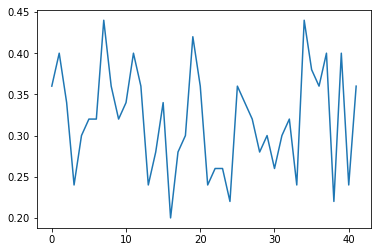

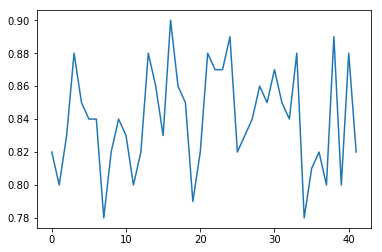

agent_value: 1.0
input_value: 0.999765768938
output_value: 0.997979068588
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


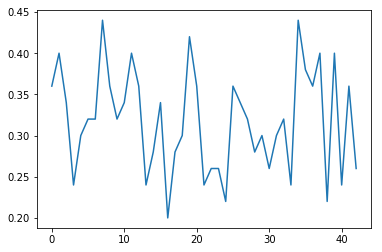

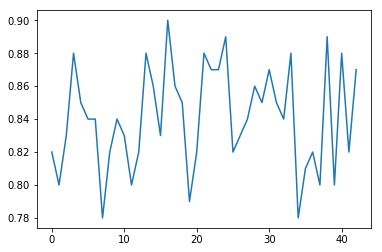

agent_value: 1.0
input_value: 0.995294628409
output_value: 1.00034792203
mean diff: 0.26
mean accuracy: 0.87
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


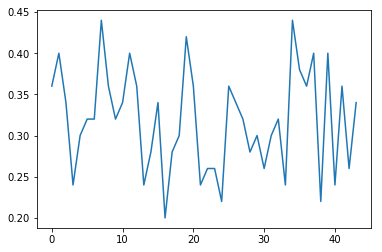

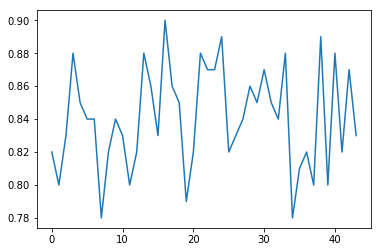

agent_value: 1.0
input_value: 0.993516504182
output_value: 0.999504162438
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


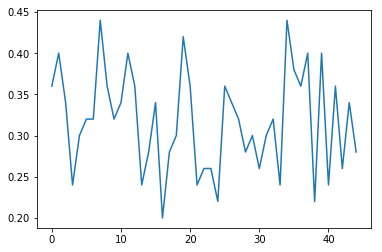

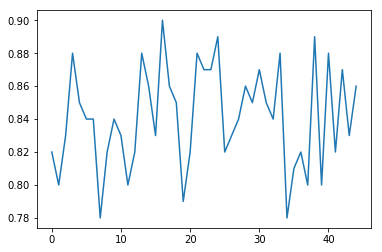

agent_value: 1.0
input_value: 0.998355544061
output_value: 0.999120715536
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


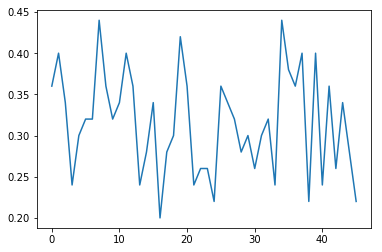

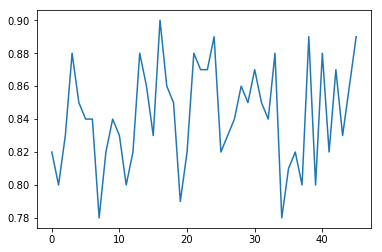

agent_value: 1.0
input_value: 1.00267398061
output_value: 1.00096458841
mean diff: 0.22
mean accuracy: 0.89
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


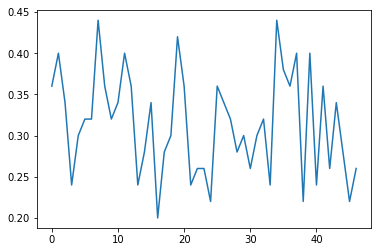

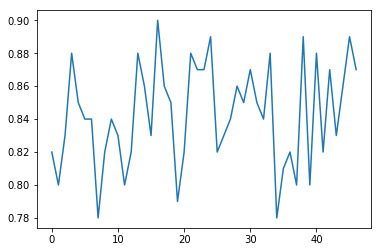

agent_value: 1.0
input_value: 1.00568616363
output_value: 0.999863415191
mean diff: 0.26
mean accuracy: 0.87
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


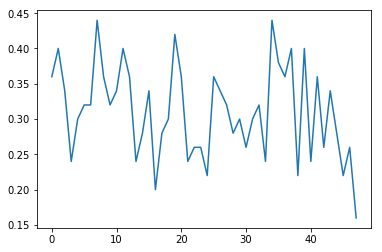

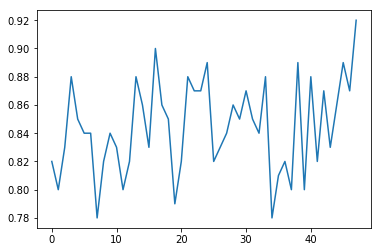

agent_value: 1.0
input_value: 0.992048122408
output_value: 1.00016858045
mean diff: 0.16
mean accuracy: 0.92
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


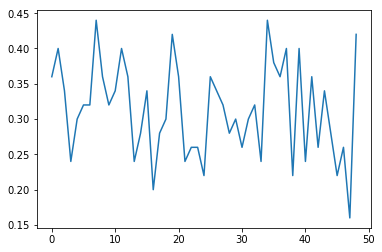

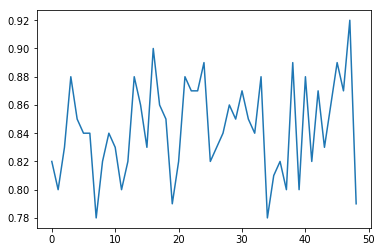

agent_value: 1.0
input_value: 1.00088385903
output_value: 1.00035538852
mean diff: 0.42
mean accuracy: 0.79
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


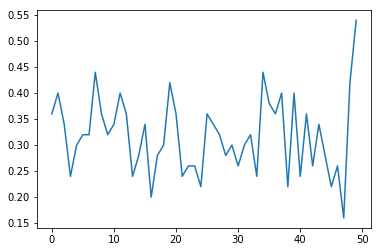

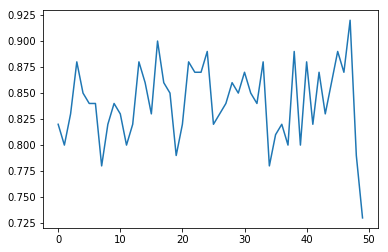

agent_value: 1.0
input_value: 1.0041344325
output_value: 0.999544355095
mean diff: 0.54
mean accuracy: 0.73
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


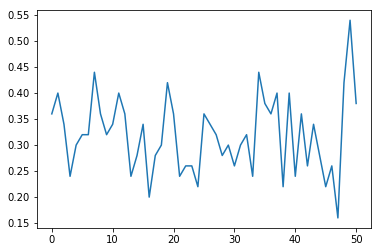

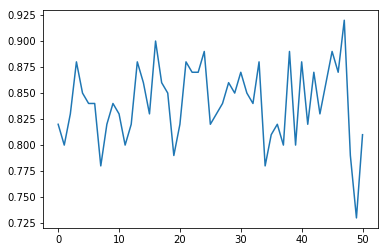

agent_value: 1.0
input_value: 0.99757168624
output_value: 0.999441044034
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


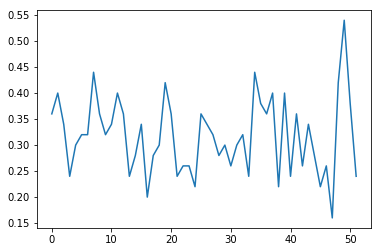

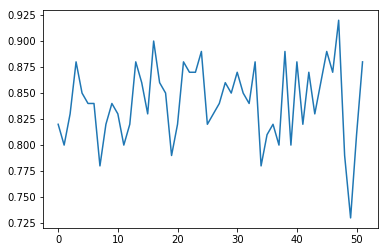

agent_value: 1.0
input_value: 0.99702848508
output_value: 1.00099710441
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


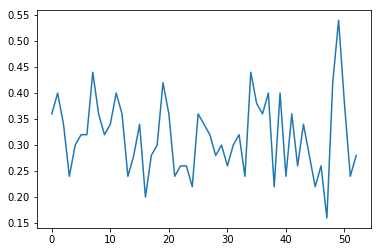

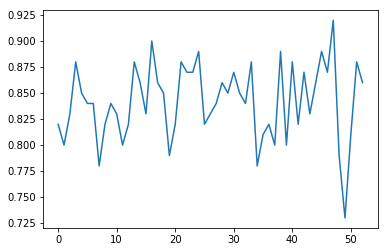

agent_value: 1.0
input_value: 1.00241866129
output_value: 1.00036049797
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


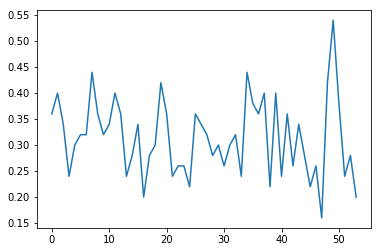

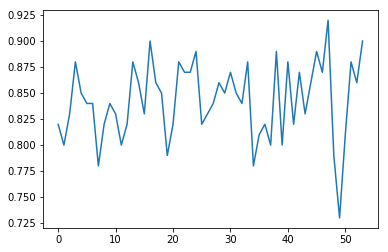

agent_value: 1.0
input_value: 0.999925079963
output_value: 0.999788760404
mean diff: 0.2
mean accuracy: 0.9
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


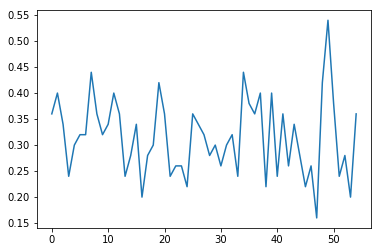

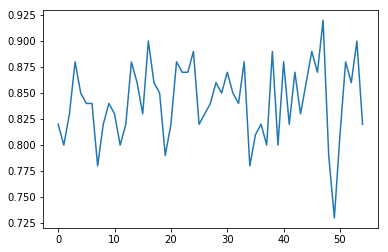

agent_value: 1.0
input_value: 0.999691420552
output_value: 1.00146869216
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


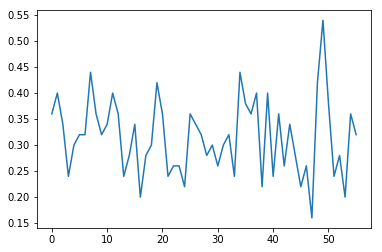

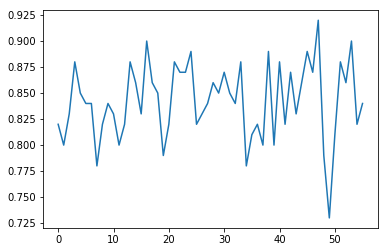

agent_value: 1.0
input_value: 0.997372085104
output_value: 0.99778102419
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


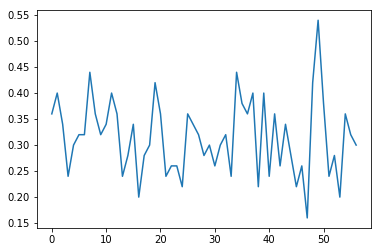

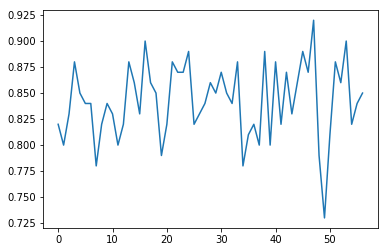

agent_value: 1.0
input_value: 1.00076115815
output_value: 0.999307649502
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


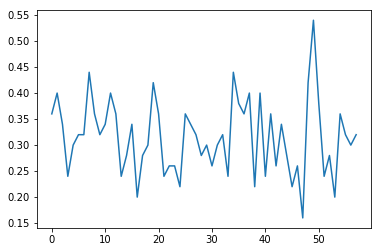

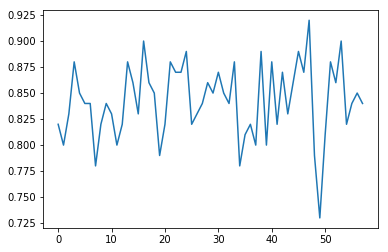

agent_value: 1.0
input_value: 0.999512596367
output_value: 1.00141395166
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


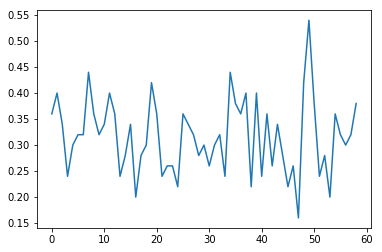

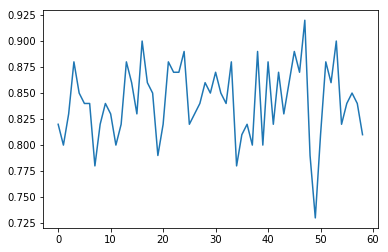

agent_value: 1.0
input_value: 0.999185555527
output_value: 0.999341817218
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


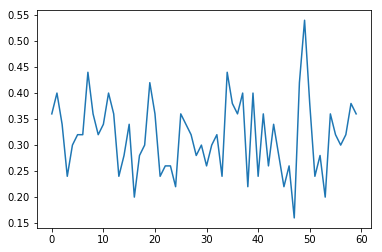

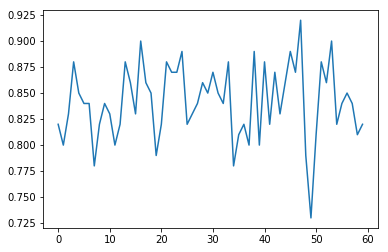

agent_value: 1.0
input_value: 0.998344231871
output_value: 0.999934916656
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


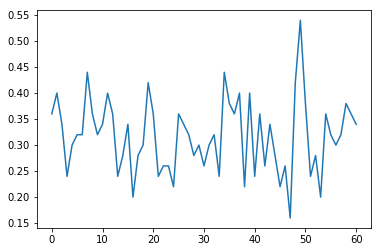

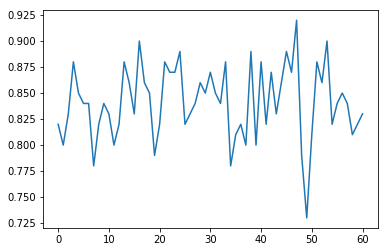

agent_value: 1.0
input_value: 1.00333770631
output_value: 1.00026420311
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


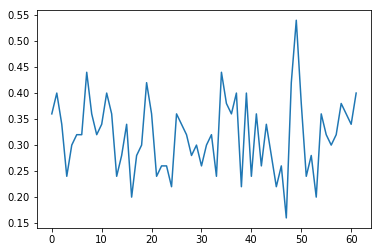

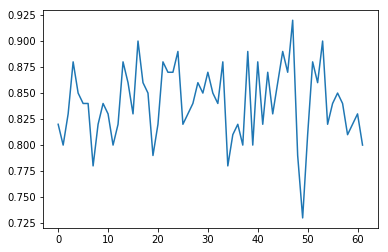

agent_value: 1.0
input_value: 0.991982492539
output_value: 0.99913035346
mean diff: 0.4
mean accuracy: 0.8
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


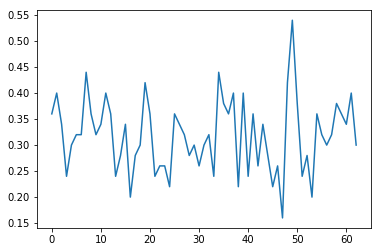

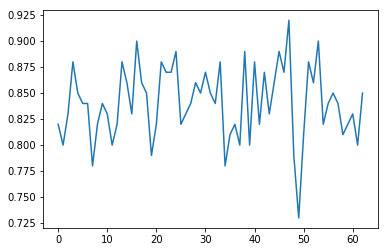

agent_value: 1.0
input_value: 1.00459125692
output_value: 1.00187028945
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


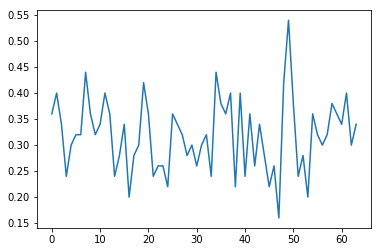

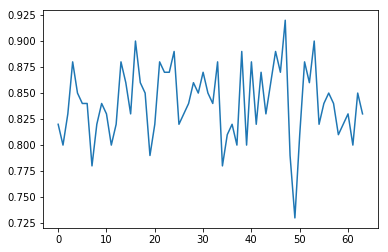

agent_value: 1.0
input_value: 1.00116383656
output_value: 1.0004412045
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


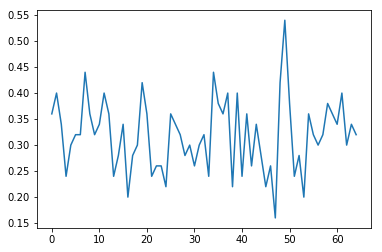

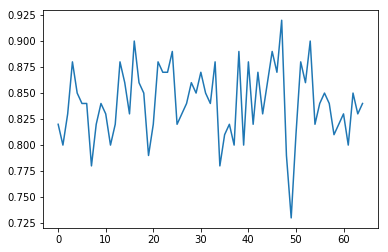

agent_value: 1.0
input_value: 1.00424149488
output_value: 0.998915851428
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


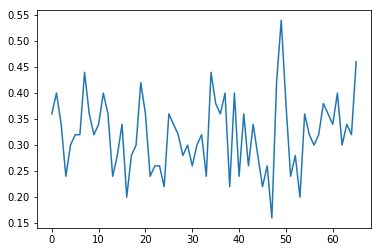

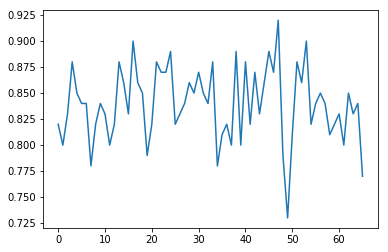

agent_value: 1.0
input_value: 1.00041974034
output_value: 1.00082671375
mean diff: 0.46
mean accuracy: 0.77
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


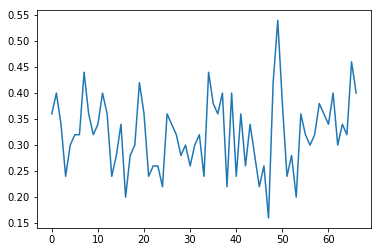

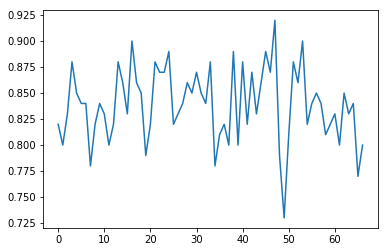

agent_value: 1.0
input_value: 0.997008586591
output_value: 0.999770157871
mean diff: 0.4
mean accuracy: 0.8
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


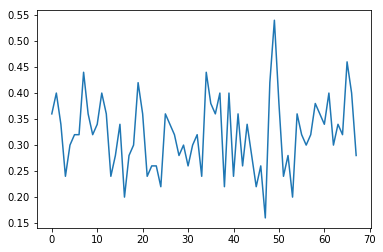

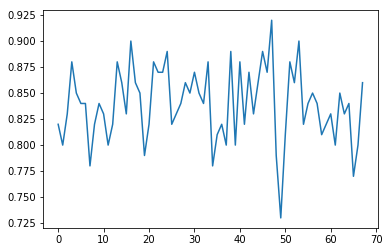

agent_value: 1.0
input_value: 1.00088571498
output_value: 0.999776348023
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


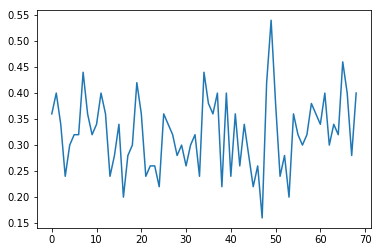

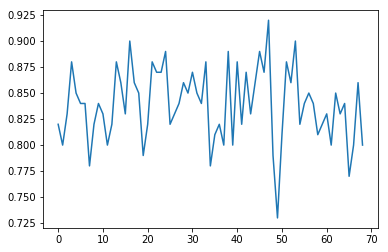

agent_value: 1.0
input_value: 0.997314897445
output_value: 0.999472096912
mean diff: 0.4
mean accuracy: 0.8
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


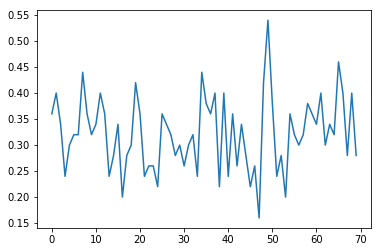

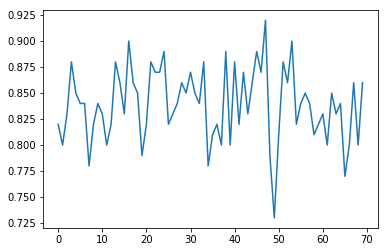

agent_value: 1.0
input_value: 0.994882046866
output_value: 1.00030087893
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


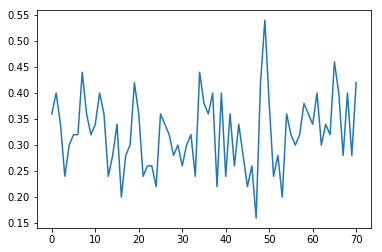

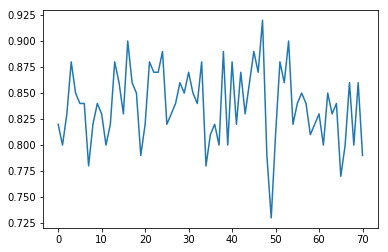

agent_value: 1.0
input_value: 1.00141950961
output_value: 1.00003919358
mean diff: 0.42
mean accuracy: 0.79
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


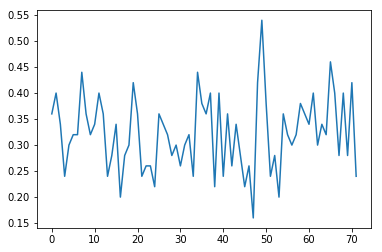

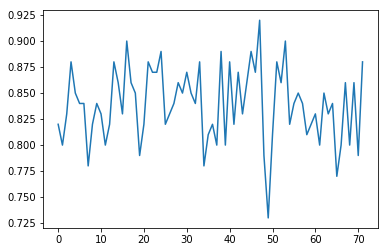

agent_value: 1.0
input_value: 1.00097008326
output_value: 1.00002004518
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


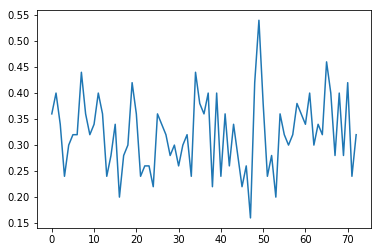

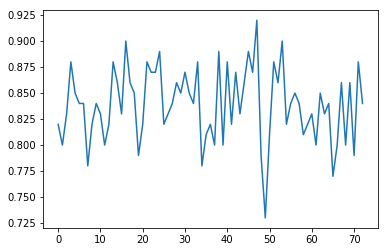

agent_value: 1.0
input_value: 0.996948232874
output_value: 0.999794571188
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


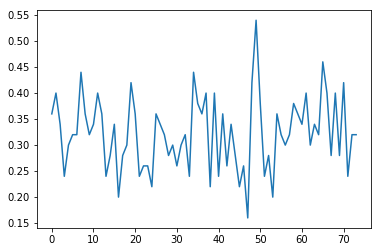

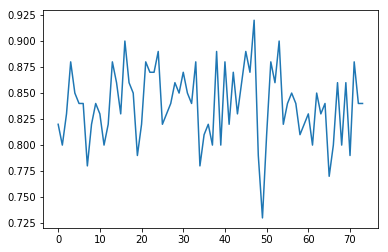

agent_value: 1.0
input_value: 1.00040937624
output_value: 0.999914214283
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


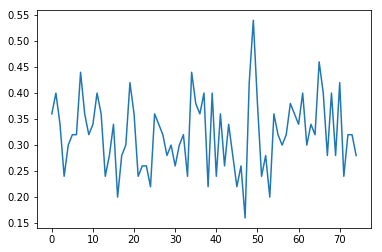

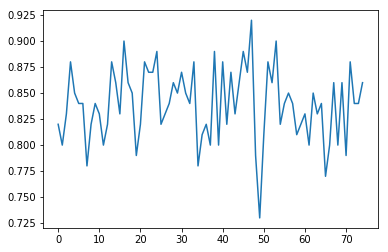

agent_value: 1.0
input_value: 0.997928711846
output_value: 1.00040429421
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


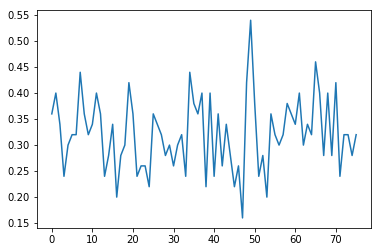

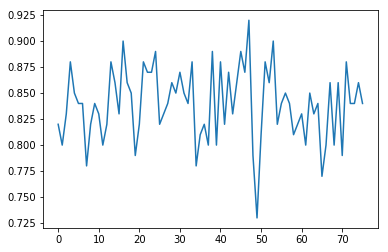

agent_value: 1.0
input_value: 1.00342089046
output_value: 1.00012353875
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


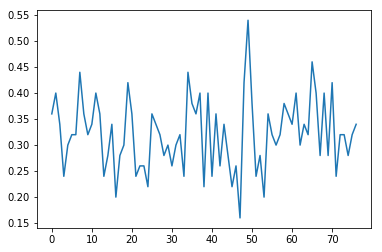

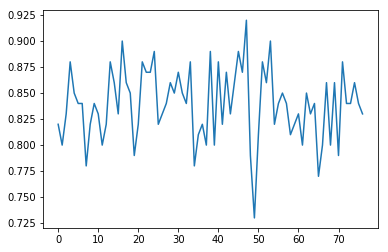

agent_value: 1.0
input_value: 0.998263465692
output_value: 0.999863862327
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


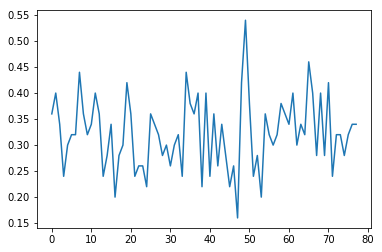

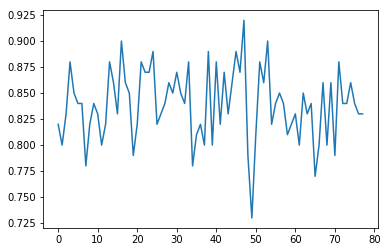

agent_value: 1.0
input_value: 1.00041632107
output_value: 1.00029593217
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


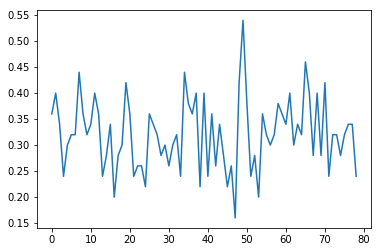

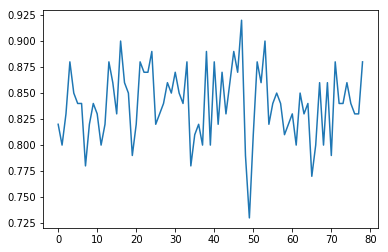

agent_value: 1.0
input_value: 1.00712255834
output_value: 0.997757303049
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


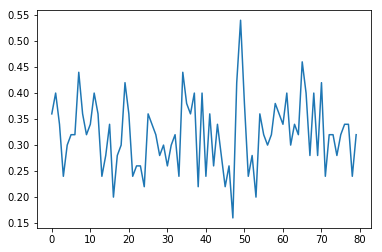

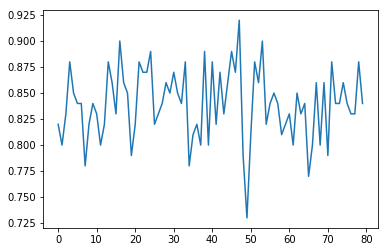

agent_value: 1.0
input_value: 1.00089233007
output_value: 1.0003934619
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


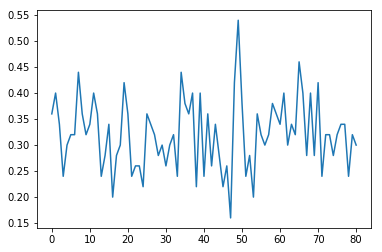

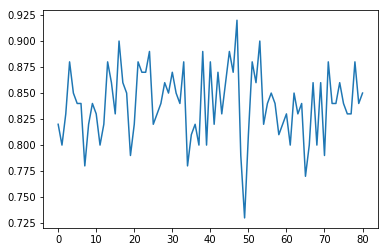

agent_value: 1.0
input_value: 0.999130657501
output_value: 1.00040139693
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


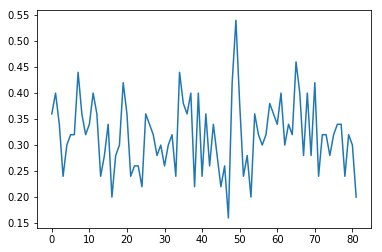

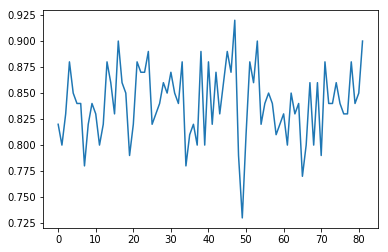

agent_value: 1.0
input_value: 1.00969847329
output_value: 0.99901275118
mean diff: 0.2
mean accuracy: 0.9
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


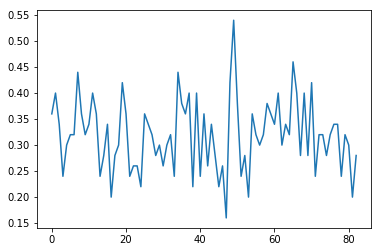

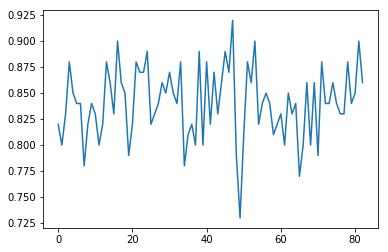

agent_value: 1.0
input_value: 0.994653111516
output_value: 0.999799097997
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


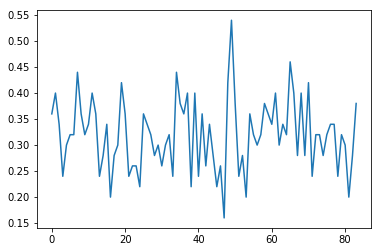

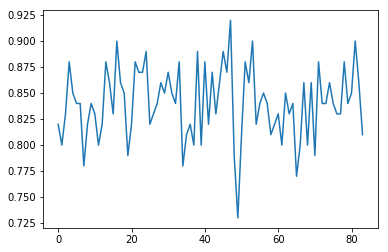

agent_value: 1.0
input_value: 1.00308430037
output_value: 1.00058228232
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


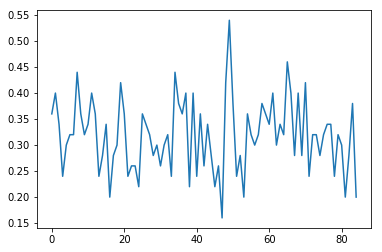

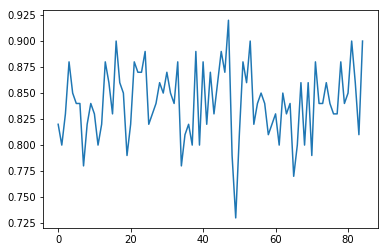

agent_value: 1.0
input_value: 1.00587352444
output_value: 0.999023550733
mean diff: 0.2
mean accuracy: 0.9
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


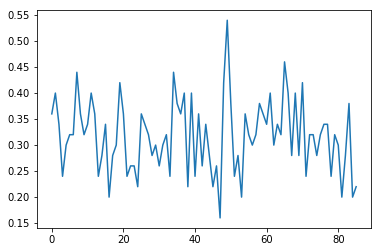

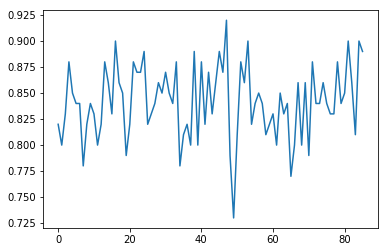

agent_value: 1.0
input_value: 0.995147089484
output_value: 0.999693361535
mean diff: 0.22
mean accuracy: 0.89
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


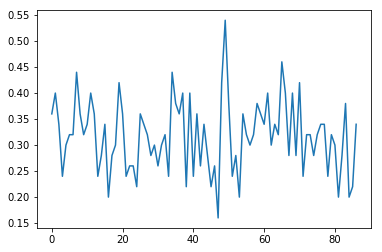

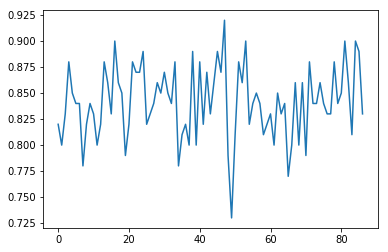

agent_value: 1.0
input_value: 0.999709685744
output_value: 0.99947936628
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


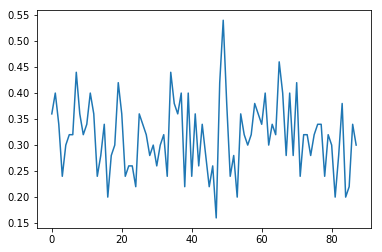

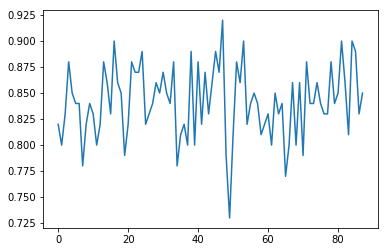

agent_value: 1.0
input_value: 1.00027410611
output_value: 1.00076530977
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


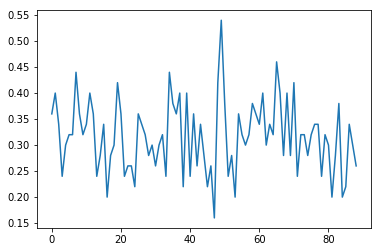

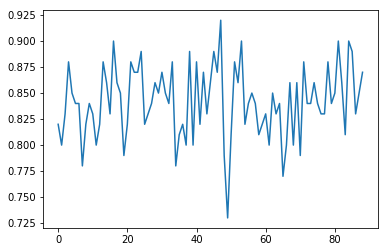

agent_value: 1.0
input_value: 0.99897445894
output_value: 1.00008348767
mean diff: 0.26
mean accuracy: 0.87
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


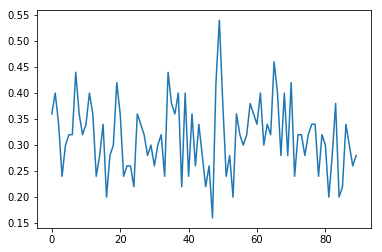

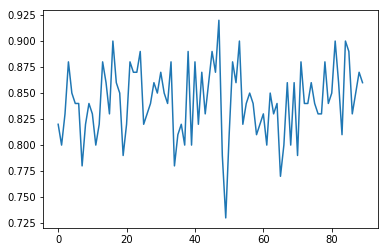

agent_value: 1.0
input_value: 1.00526462163
output_value: 0.998853962648
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


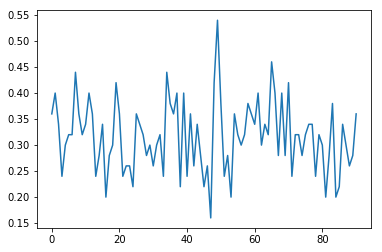

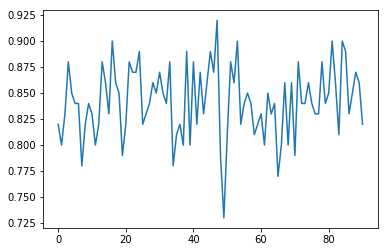

agent_value: 1.0
input_value: 0.999325116454
output_value: 0.999614146946
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


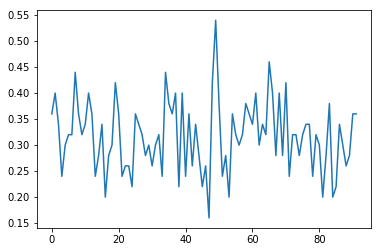

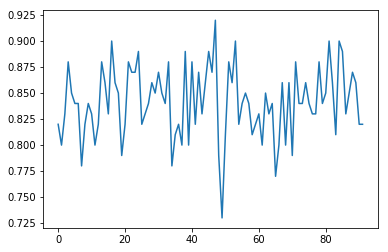

agent_value: 1.0
input_value: 0.99642386941
output_value: 0.999820068822
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


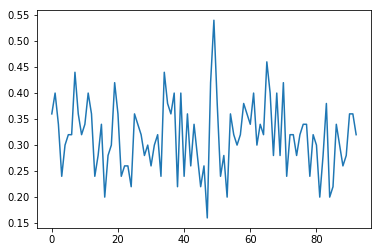

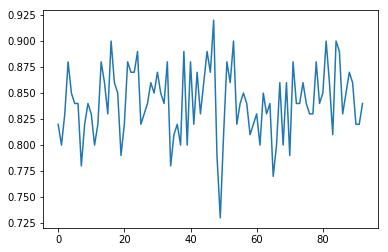

agent_value: 1.0
input_value: 0.999358341873
output_value: 0.999785116066
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


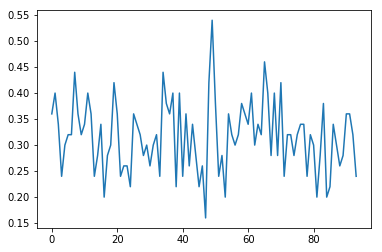

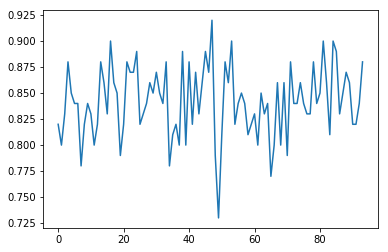

agent_value: 1.0
input_value: 0.999811952039
output_value: 0.998821030196
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


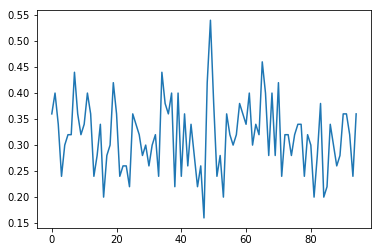

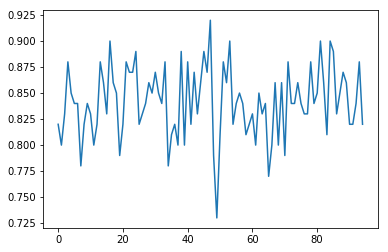

agent_value: 1.0
input_value: 0.996276240204
output_value: 1.00003904876
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


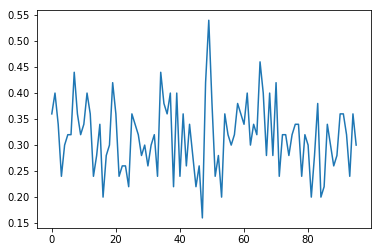

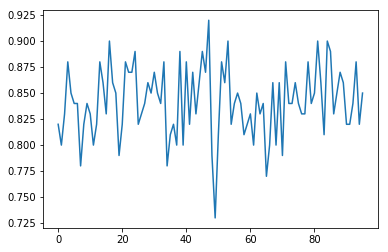

agent_value: 1.0
input_value: 1.00562774047
output_value: 1.00185498446
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


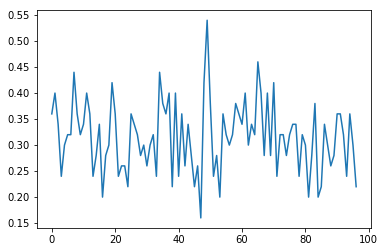

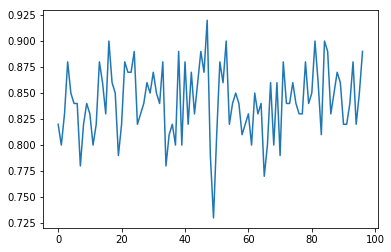

agent_value: 1.0
input_value: 0.995487219233
output_value: 0.999994090615
mean diff: 0.22
mean accuracy: 0.89
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


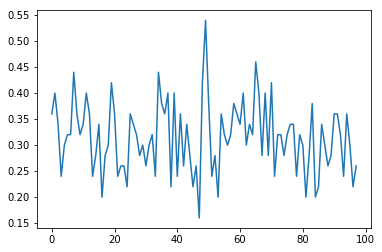

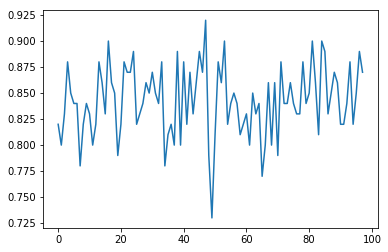

agent_value: 1.0
input_value: 1.00452242152
output_value: 1.00052392674
mean diff: 0.26
mean accuracy: 0.87
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


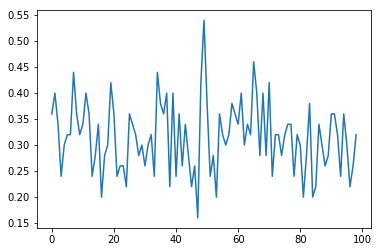

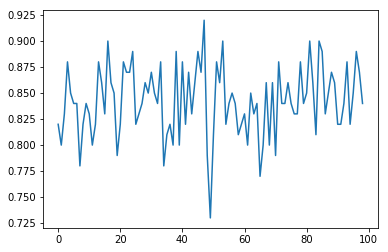

agent_value: 1.0
input_value: 1.00607888414
output_value: 0.999813402473
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


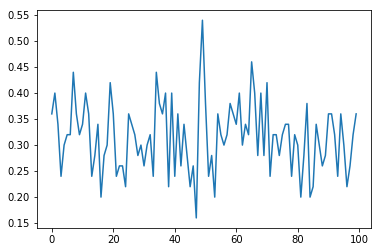

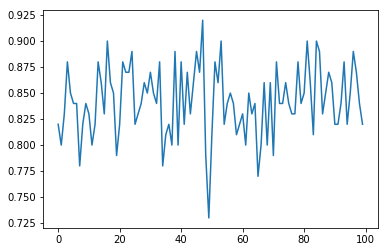

agent_value: 1.0
input_value: 1.00255517259
output_value: 0.998781973796
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


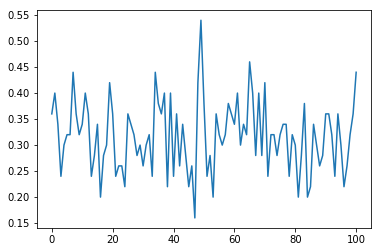

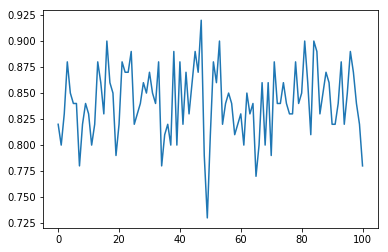

agent_value: 1.0
input_value: 0.996181804109
output_value: 0.999826280488
mean diff: 0.44
mean accuracy: 0.78
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


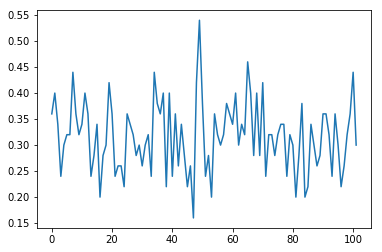

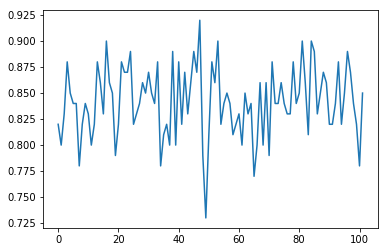

agent_value: 1.0
input_value: 0.997435520335
output_value: 1.00071944164
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


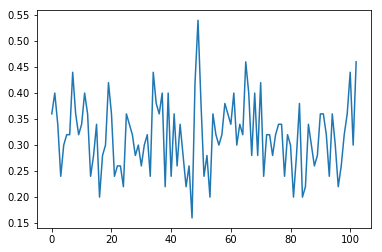

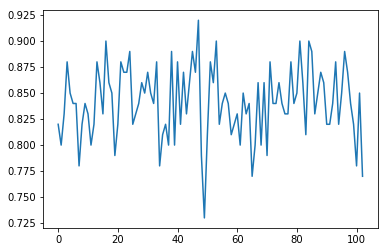

agent_value: 1.0
input_value: 1.00048109667
output_value: 0.997193854782
mean diff: 0.46
mean accuracy: 0.77
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


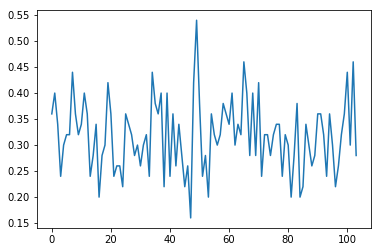

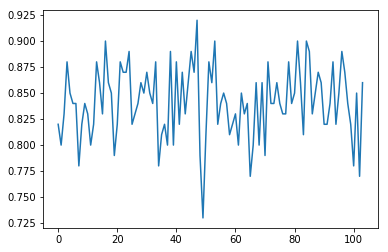

agent_value: 1.0
input_value: 0.998941282927
output_value: 0.999262443169
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


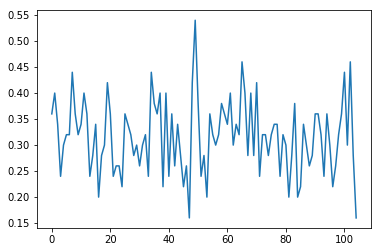

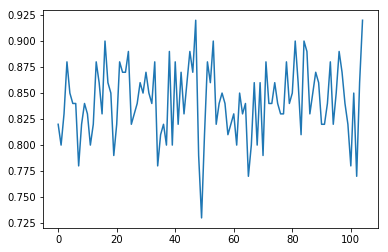

agent_value: 1.0
input_value: 0.993959197907
output_value: 1.00143324297
mean diff: 0.16
mean accuracy: 0.92
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


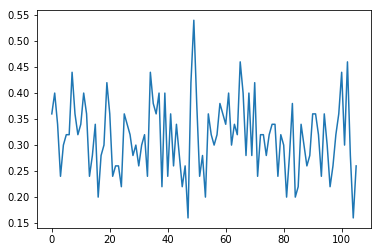

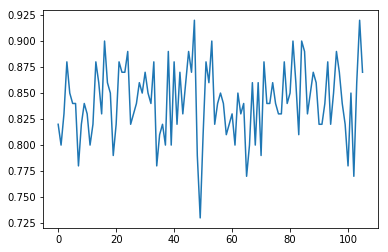

agent_value: 1.0
input_value: 1.00385646445
output_value: 1.00007027507
mean diff: 0.26
mean accuracy: 0.87
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


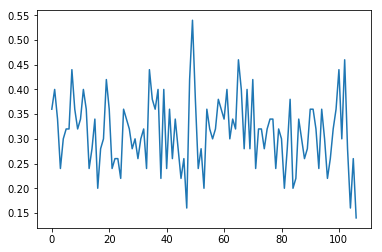

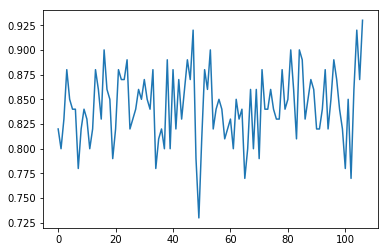

agent_value: 1.0
input_value: 0.998844128872
output_value: 1.00063077535
mean diff: 0.14
mean accuracy: 0.93
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


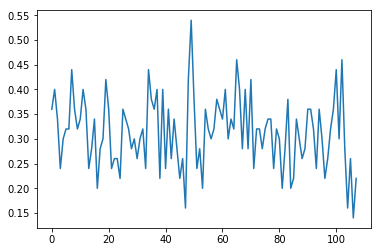

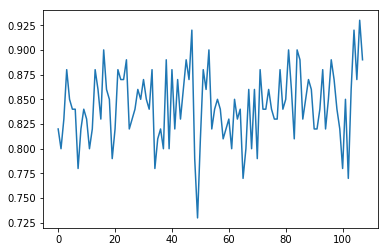

agent_value: 1.0
input_value: 1.00379294675
output_value: 0.999916188685
mean diff: 0.22
mean accuracy: 0.89
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


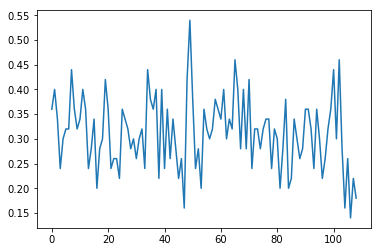

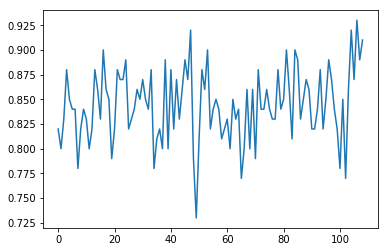

agent_value: 1.0
input_value: 0.993971028446
output_value: 0.999557498878
mean diff: 0.18
mean accuracy: 0.91
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


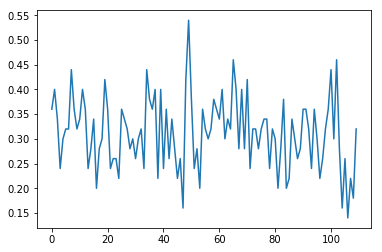

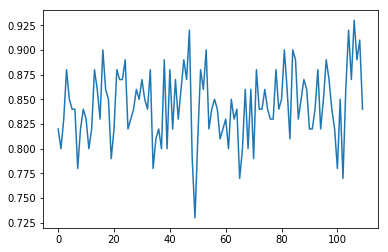

agent_value: 1.0
input_value: 1.00248144844
output_value: 0.997475367641
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


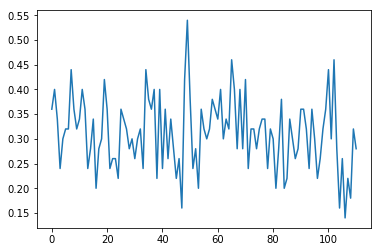

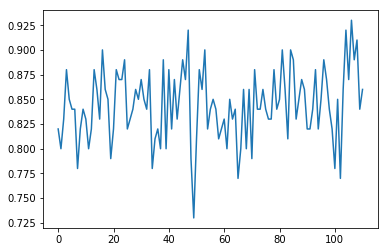

agent_value: 1.0
input_value: 0.998572568958
output_value: 1.00063973937
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


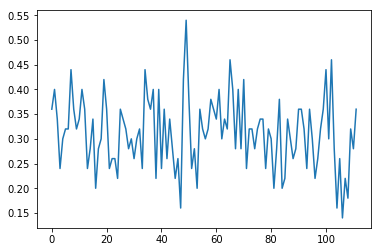

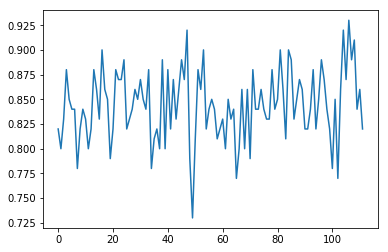

agent_value: 1.0
input_value: 0.993986751752
output_value: 0.998848172196
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


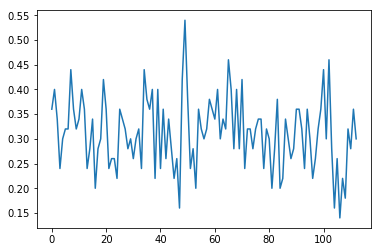

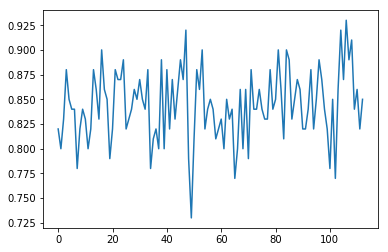

agent_value: 1.0
input_value: 1.00334800436
output_value: 0.997301090617
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


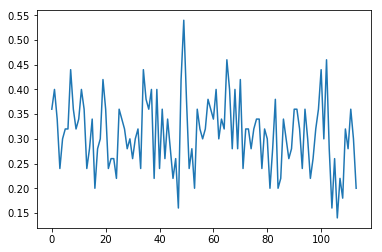

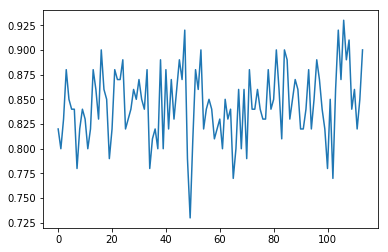

agent_value: 1.0
input_value: 0.988701216857
output_value: 1.00177858703
mean diff: 0.2
mean accuracy: 0.9
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


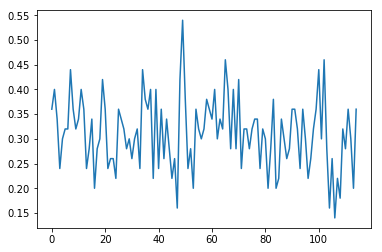

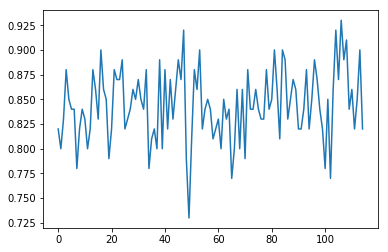

agent_value: 1.0
input_value: 1.00402932851
output_value: 0.999947292034
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


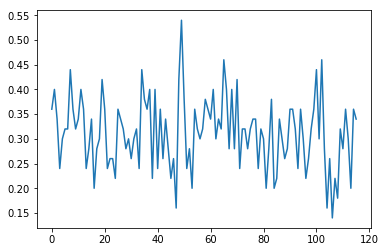

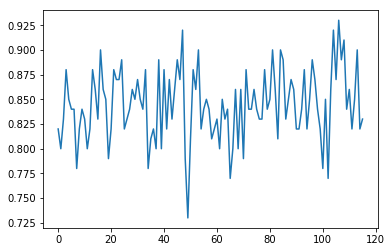

agent_value: 1.0
input_value: 0.990293291116
output_value: 0.999828058222
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


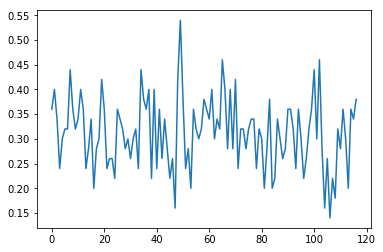

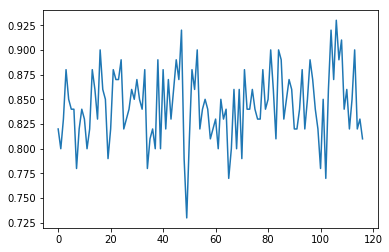

agent_value: 1.0
input_value: 0.999056179954
output_value: 1.0004242559
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


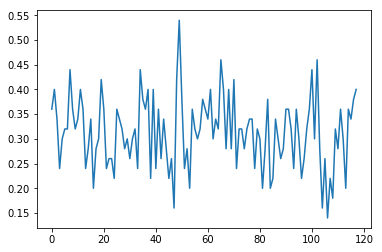

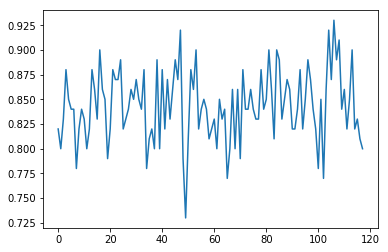

agent_value: 1.0
input_value: 0.998213039274
output_value: 1.00090859005
mean diff: 0.4
mean accuracy: 0.8
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


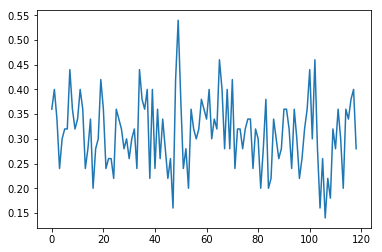

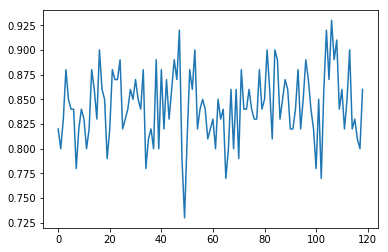

agent_value: 1.0
input_value: 1.00165445911
output_value: 1.00023703962
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


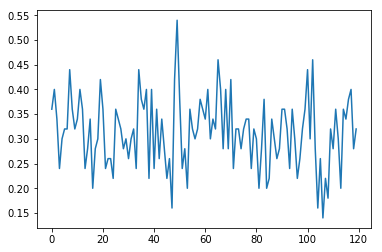

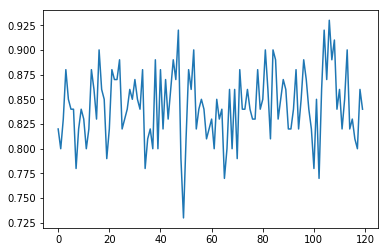

agent_value: 1.0
input_value: 1.00097775716
output_value: 0.998703264817
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


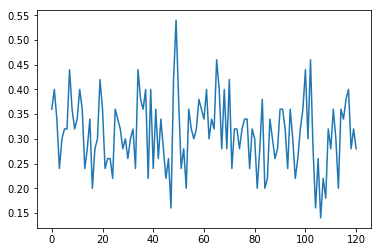

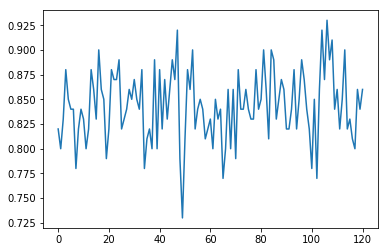

agent_value: 1.0
input_value: 0.995147810088
output_value: 1.00068848144
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


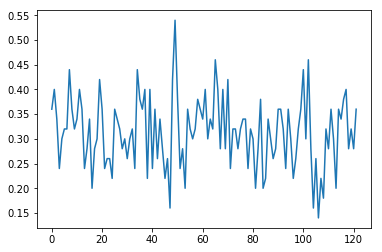

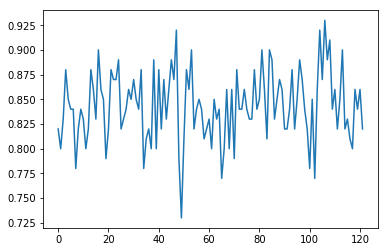

agent_value: 1.0
input_value: 1.00461736113
output_value: 1.00131180558
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


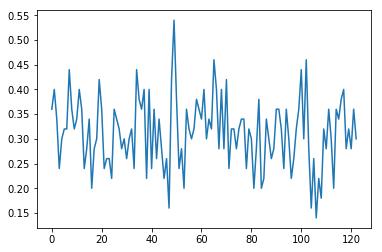

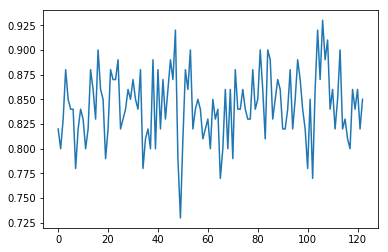

agent_value: 1.0
input_value: 0.999819862515
output_value: 0.999816492699
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


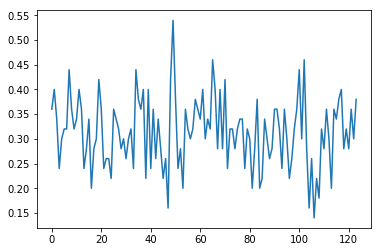

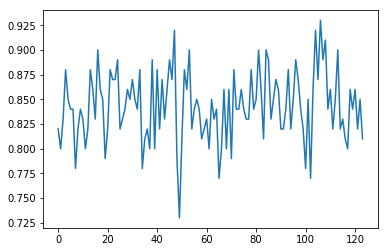

agent_value: 1.0
input_value: 1.00145770141
output_value: 1.00003002904
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


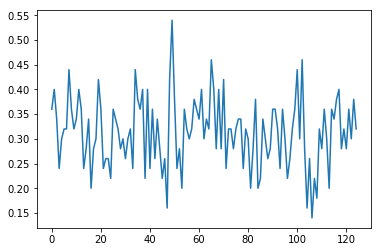

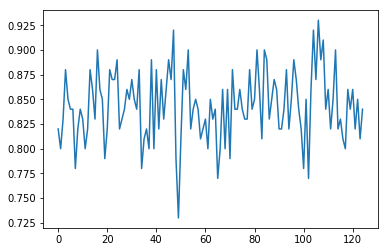

agent_value: 1.0
input_value: 0.99868913721
output_value: 1.00003159733
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


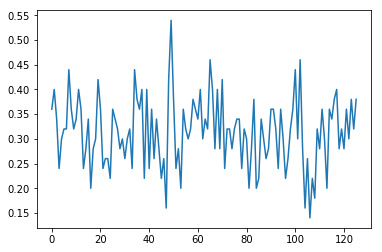

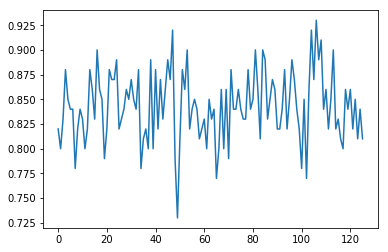

agent_value: 1.0
input_value: 1.00517408399
output_value: 1.00033557219
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


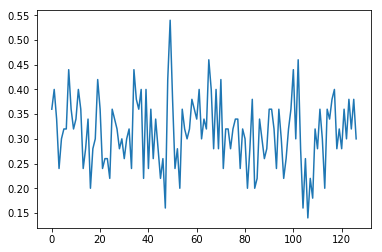

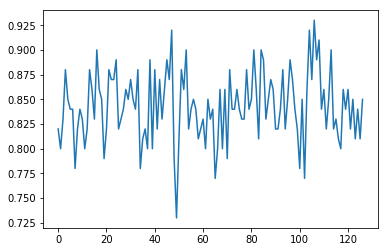

agent_value: 1.0
input_value: 1.00112854535
output_value: 1.00048617695
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


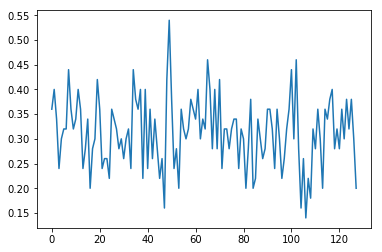

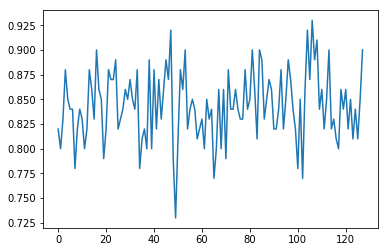

agent_value: 1.0
input_value: 1.004100757
output_value: 1.00028506253
mean diff: 0.2
mean accuracy: 0.9
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


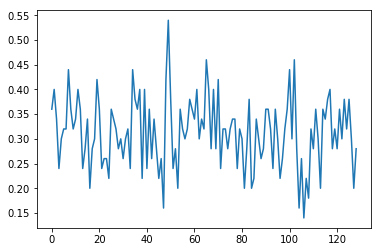

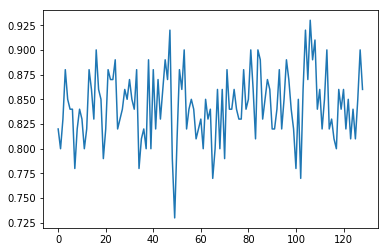

agent_value: 1.0
input_value: 1.00509250588
output_value: 1.00274662046
mean diff: 0.28
mean accuracy: 0.86
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


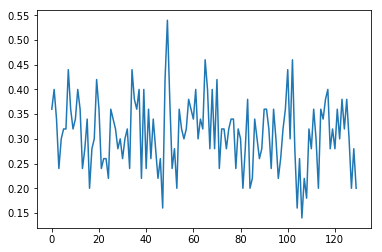

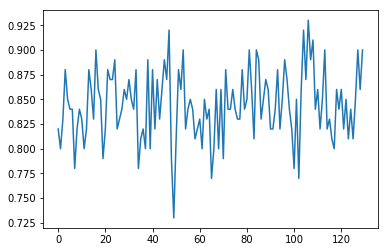

agent_value: 1.0
input_value: 1.00101152777
output_value: 0.99858156667
mean diff: 0.2
mean accuracy: 0.9
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


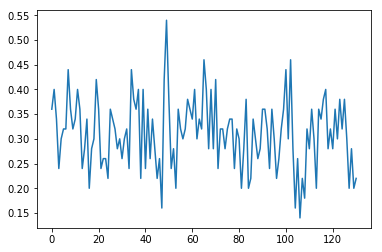

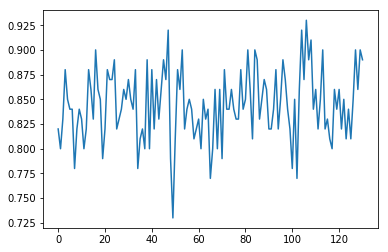

agent_value: 1.0
input_value: 0.998871133116
output_value: 0.999266704118
mean diff: 0.22
mean accuracy: 0.89
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


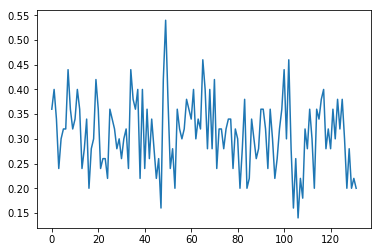

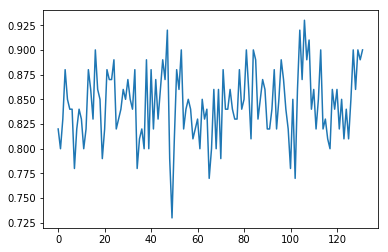

agent_value: 1.0
input_value: 0.998971538521
output_value: 1.00021237408
mean diff: 0.2
mean accuracy: 0.9
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


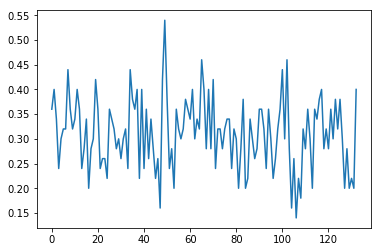

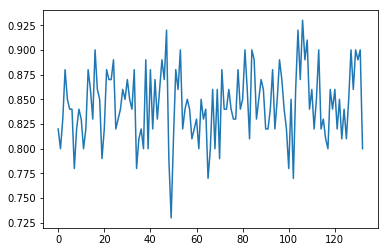

agent_value: 1.0
input_value: 1.00198374334
output_value: 1.00074455185
mean diff: 0.4
mean accuracy: 0.8
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


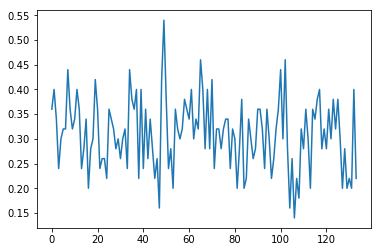

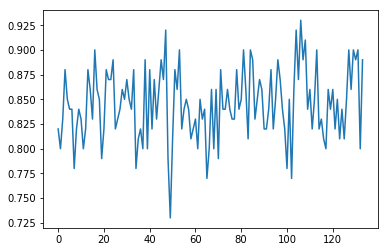

agent_value: 1.0
input_value: 1.00203356613
output_value: 1.00006687799
mean diff: 0.22
mean accuracy: 0.89
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


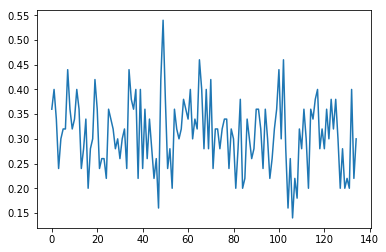

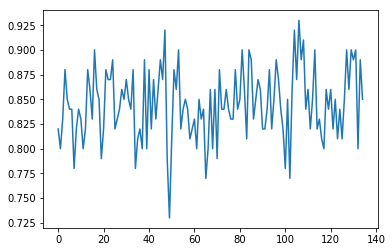

agent_value: 1.0
input_value: 1.00493207264
output_value: 1.00056050894
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


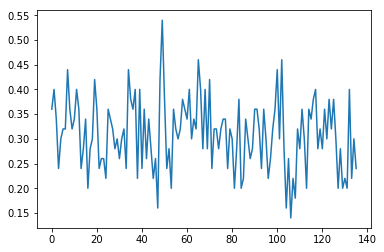

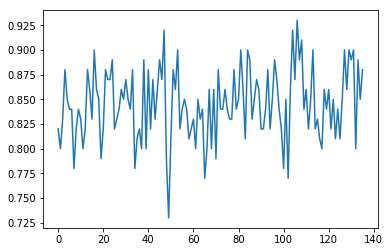

agent_value: 1.0
input_value: 0.99215193159
output_value: 0.997186472183
mean diff: 0.24
mean accuracy: 0.88
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


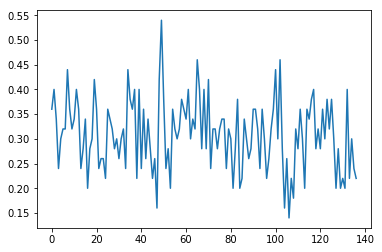

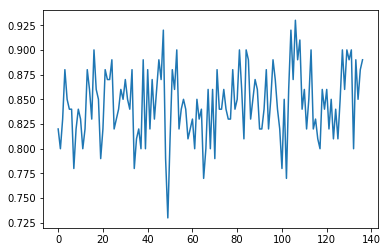

agent_value: 1.0
input_value: 0.994911860997
output_value: 0.999463406665
mean diff: 0.22
mean accuracy: 0.89
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


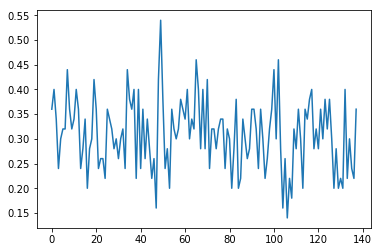

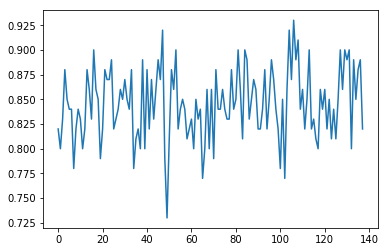

agent_value: 1.0
input_value: 0.998756865032
output_value: 0.999967990005
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


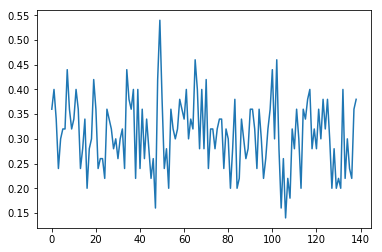

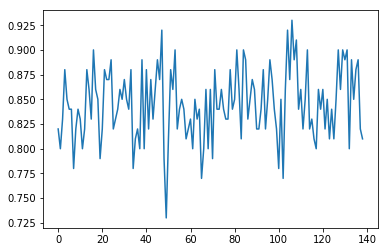

agent_value: 1.0
input_value: 0.997668727837
output_value: 0.998991070497
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


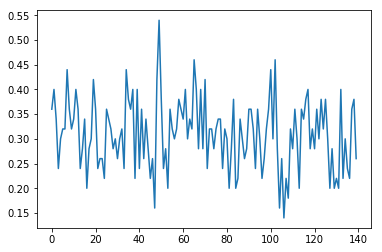

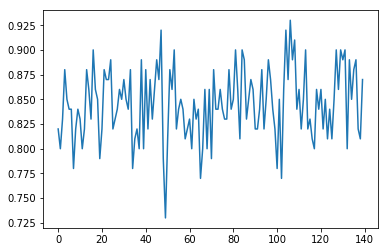

agent_value: 1.0
input_value: 1.00019996502
output_value: 1.00044142293
mean diff: 0.26
mean accuracy: 0.87
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


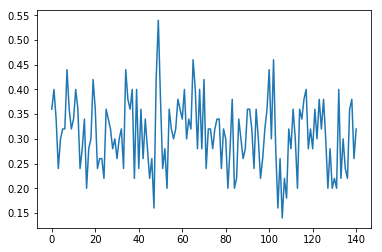

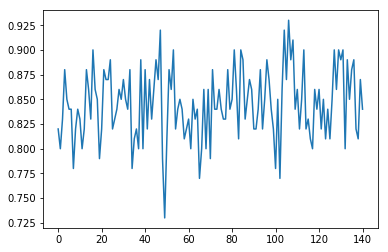

agent_value: 1.0
input_value: 1.0005158936
output_value: 1.00018744782
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


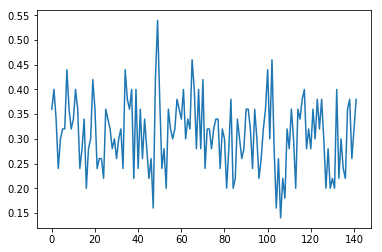

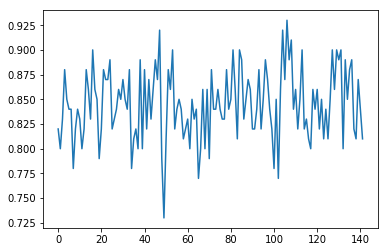

agent_value: 1.0
input_value: 1.00174004696
output_value: 0.99918247526
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


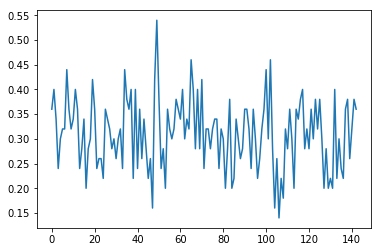

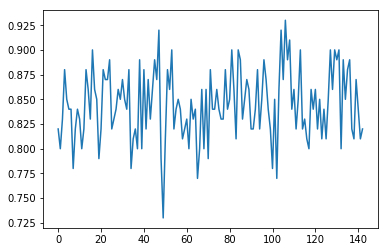

agent_value: 1.0
input_value: 1.00230805598
output_value: 0.999585972658
mean diff: 0.36
mean accuracy: 0.82
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


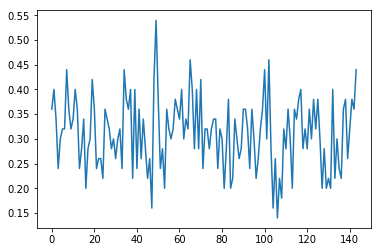

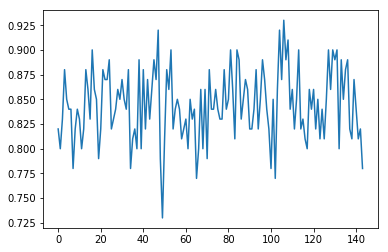

agent_value: 1.0
input_value: 0.992732693458
output_value: 1.00123628077
mean diff: 0.44
mean accuracy: 0.78
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


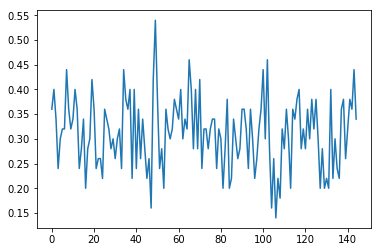

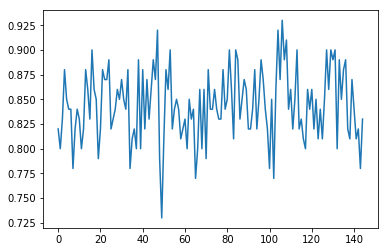

agent_value: 1.0
input_value: 0.998993569448
output_value: 0.999663375145
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


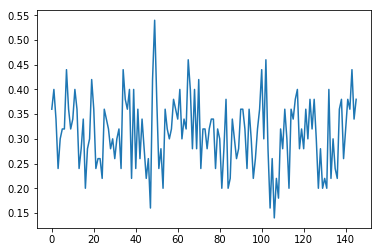

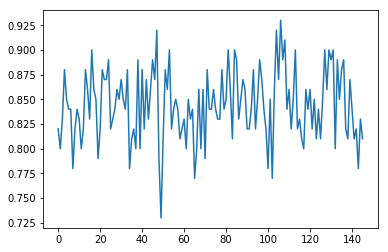

agent_value: 1.0
input_value: 0.998434201591
output_value: 1.00058288074
mean diff: 0.38
mean accuracy: 0.81
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


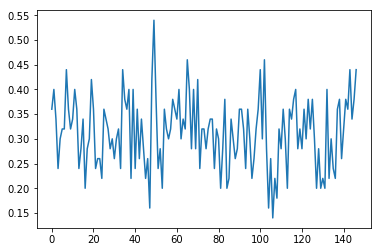

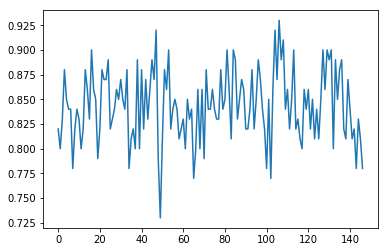

agent_value: 1.0
input_value: 1.00517972099
output_value: 1.00023169535
mean diff: 0.44
mean accuracy: 0.78
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


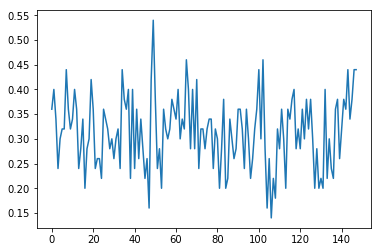

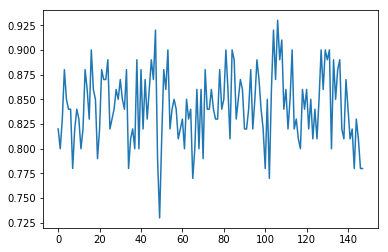

agent_value: 1.0
input_value: 1.00163271333
output_value: 1.00106352326
mean diff: 0.44
mean accuracy: 0.78
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


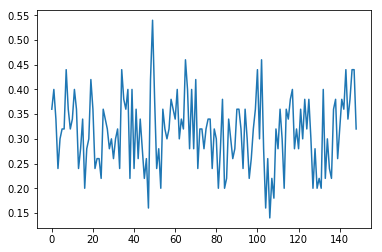

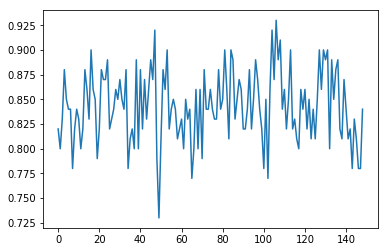

agent_value: 1.0
input_value: 0.999264414613
output_value: 0.999749018005
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


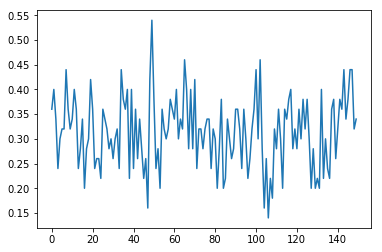

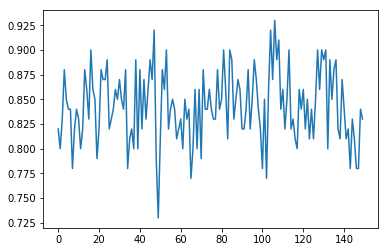

agent_value: 1.0
input_value: 0.998274346021
output_value: 1.00054350565
mean diff: 0.34
mean accuracy: 0.83
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


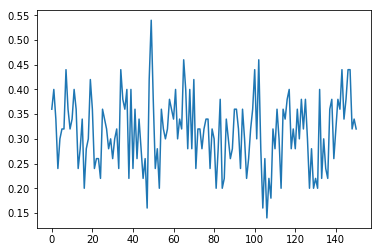

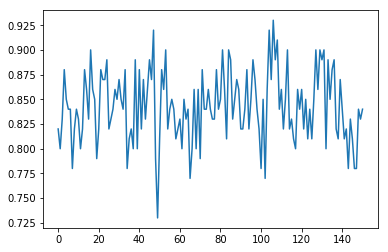

agent_value: 1.0
input_value: 1.00094242786
output_value: 0.999990631945
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


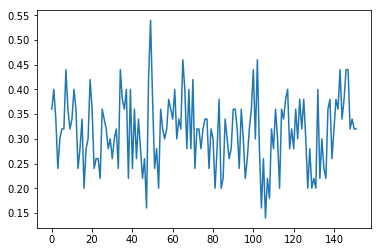

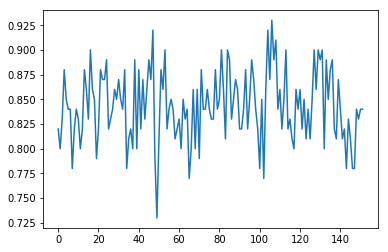

agent_value: 1.0
input_value: 0.997297303914
output_value: 0.999584972492
mean diff: 0.32
mean accuracy: 0.84
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


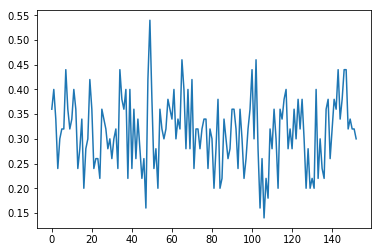

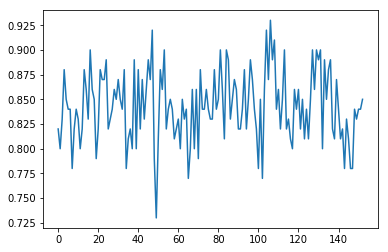

agent_value: 1.0
input_value: 1.00426127618
output_value: 1.00082853058
mean diff: 0.3
mean accuracy: 0.85
mean o_gate_shared: 0.0
mean o_gate_non: 1.0


In [ ]:
Transfer_Task(WM_Objs,[5,5],200000,100)